# Predict Floods with Unit Hydrographs
Estimate stream runoff during a predicted rainstorm in Vermont.

## Table of Contents
* [Introduction](#Introduction)
* [Necessary Imports](#Necessary-Imports)
* [Connect to your GIS](#Connect-to-your-GIS)
* [Get daya for analysis](#Get-data-for-analysis)
* [Remove imperfections in elevation model](#Remove-imperfections-in-elevation-model)
    * [Identify sinks](#Identify-sinks)
    * [Fill sinks](#Fill-sinks)
* [Delineate the watershed](#Delineate-the-watershed)
    * [Assess flow directions](#Assess-flow-directions)
    * [Snap outlet to stream](#Snap-outlet-to-stream)
    * [Delineate watershed upstream of outlet](#Delineate-watershed-upstream-of-outlet)
* [Create a velocity field](#Create-a-velocity-field)
    * [Create the slope raster](#Create-the-slope-raster)
    * [Calculate the slope-area term](#Calculate-the-slope-area-term)
    * [Calculate the velocity field](#Calculate-the-velocity-field)
    * [Limit the velocities](#Limit-the-velocities)
* [Create an isochrone map](#Create-an-isochrone-map)
    * [Create a weight grid](#Create-a-weight-grid)
    * [Assess flow time to outlet pour point](#Assess-flow-time-to-outlet-pour-point)
    * [Reclassify flow time into isochrone zones](#Reclassify-flow-time-into-isochrone-zones)
* [Create a unit hydrograph](#Create-a-unit-hydrograph)
* [Conclusion](#Conclusion)

## Introduction

Stowe, a small Vermont town of nearly 5,000 residents, suffered considerably when the remnants of Hurricane Irene stuck the Green Mountain region in August 2011. The Little River overflowed and washed out roads, bridges, and culverts. Wanting to learn from the tragedy, Stowe officials discovered that they had precious little information involving flood prediction. They turned to hydrographs, which are line graphs determining how much water a stream will discharge during a rainstorm. In this notebook, you'll create those hydrographs.

Overwiew of the steps to be followed:

<img src="data:image/PNG; base64, iVBORw0KGgoAAAANSUhEUgAAAMoAAALACAYAAADSYe3nAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3gAAP+lSURBVHhe7N0HuG5ZVhZqMioqEkRAxSwoQZKJZAKz13T1igkVJKqIEZXLNQdEUTIIdEPnUFXd1dVdXTlXnTo57rNzzjmHc07VvOOdc49zVu29q2s31Q10957PM5/1/yuvucY3vm+MOddaH1VOyod8eeqpp8pHfdRH1frf/tt/2597Uj6Q5QMOlN/2237b7ZuW9cOhDA0N1Wt505vetD/nl07R5h8sgNjvL8Y9/LZv+7Z6Xb9UygcFKN2b5oI/HMDySxkozgurvNqSzNQtJ0Bp5YMOlDSwD8SNPCmHyweyfY8Cyklp5RcFKNYxT+16je66uVxVkpnU7v4VXr67/p/4E39if0nztgdZwPLcx8FjHdx3t3T3Zercu8fO43av7+B153a5/ODx/M9lL7d9Lvu3//bfvmRdNUt3Xrc9lIPX7P/B46ruRx6vW7r3Qu1eg9/Zvrn84PG71+/3UcX23WV57d1t/f+FKh90oGikgxesobP4nQ2ZQFGzZMPkPvMmpwHljbRtFtvkPrv7V/IYpgf3pfj/cjeguyyPe9S55/7SWLLkteTyPH7u8+D6uTyv7eD2Sh63O8//g/cg2zz3mevb3n6VXNYteZ1Z7CfXV/L4eby8hu49Pri8ez9erlive5yD157nlW3zwS4vbZUPQMkLytptsKNuRM5zwUfd9KMa1jHSuPzOm5Cle3O7+1e6+3Nu3fNT/H+5G2k/edyDBqTYrnsueT157KPO1TZ5Dt3rytLd5qjtD7aZ7a3XLd1zfV/Xd9T96W571P1Ruvt0fgeP371Gyw8e46hycD8Hr/3lzuWDVV75jN/P0r2gbPi8+dnoR1UXftTF29fBG+sYuc/u7yx5XPtTuufUXd9+u+eQ9eUMybKD19IttjvqZh51HlkYUBpRHv9g7Z77we0PtpnlB7fPqnSPd7Bku3VL9zoPXk8Wx3RuB39nOXjM7jkevHdZDu7nqGu3fddWPpjlgwoURQPlBR91I7rl4E1X7OuVgHKwAQ8ace7j4PHfl9EcVWybxz14DOXnAxTb5Dl0r+uoctT2B9vM9tZ7ueJYB9szy1H3p3udR90fpbtP53fw+C/Xznm8g/tTDu7nqGt/uW0/GOWlrfIBKAcvKBs3DcDvgxec5agbYd2DN9Yxcn+W2yaNUbG8e2NyvwdvWBpBd9v3Vaybx+0aUJbjAMX/vL6DhuLcrPNy5WDbKnmM3Ef+z/M8WA4eU8lj5rJuexy8TtfYPceDx3N+B6/hYLtnyW27x8tycD9HXfvB6/hglg86UBSN2zV2F9ituSwbrnvx9tXdVnGMriG4Cd39HXVT7OPgvpU0hG59OSPrLsvtusUxutd+0BCybUxf7lgHr0U9uH23HNVmOa9bu21y8Jq722Y7qfZz1HV2z1/tXkNeX7c4dh6/u/+D23bLwf0cde22/5AFykl5+XLUzT4pHxrlBCi/gOUEKB+65QQov4DlBCgfuuUEKCflpByjnADlpJyUY5QToJyUk3KMcgKUk3JSjlF+QYFyVE7+pBy/ZP9I9qu8Unlf/RQn5f0rHzFA0dGlfiiXE6D84pUPS6BIwR4ExQlQTsqrKR8xQPlwKCdA+cUrHxSrdYOydg32KKAcHNuURmC77vgkpQuANJqs2ZFneXd+jheyr4Pgsay7bnfcUI5P6p7fwfPpFvtyfd192l9es3rw+JbnMjXPNcvBa8x9dYFy8Hq7Jbc5Ka++fMCB4uZ0e5/dyDSwg0Axv2sc3eUH11XSGBlKd7s0uDT0oxjFsbrzbN81/Dxe7sMy//Na0mitd1Sxv6O27x6zu7+D56xYt3tdlnfPMY+RQLF+d//2fXD7lzvfk/L+lQ8oUNyU7o1S0gAP/lb87hqK0r253d9pWC9Xuuu+ElAOnkcW556G3F0/S3f5wXJw2VHna59p+PbdBYGS2wBC93eWBKtp93eWnJdt6ne2yUl5deXlLe/nURiKm3NUVboGmjf1qJo3t2usXSNTjjrW+wOUg4BWusbbXT+L/x9IoBzcV9fQu22VpQuO3P9R9QQoH/jyAQXKyxlgloM3v3tTjypdY+uue5QR+Z9GcRygHNxe6Rr7LwRQ8neW3KYLhG7pAqX7++WK5dkmJ+XVlcPW8ipK3ryXuzkHDZSxHDTGg4UBMqguABlkdz+53zyu5QcBe9Dwrd811NxHGt7B9RX/P1BAyeMl+JWD7WF5d5/+d88x2+blinWzTU7KqysfUKAoCZZuPWgc3cIwDq7fLQmKgwba3c7+GU3XKHJZAsY6XSM86jzTAJWD6yv+f6CAouS1ZT14vNxH1jzn7nk6bnedvF7F/xOgfGDKBxwoJ+WkfDiWE6CclJNyjHIClJNyUo5RToByUk7KMcoJUE7KSTlGOQHKSTkpxygnQDkpJ+UY5QQoJ+WkHKOcAOWknJRjlBOgnJSTcoxyApSTclKOUU6AclJOyjHKIaDcuLVTbr6wXXb21sr27lrZ2V2Pul22dzbLjZvbddmNW1t1evD33s3NsrG1VOvm9nLdfnN7Nab2sXl7vZu37H+97N7YKLfi/33vvrf8p//0n+ogwe/7vu8r//2///fyP/7H/yg/8AM/UP7X//pf5X//7/9dfuiHfqj8yI/8SPmxH/ux8lM/9VPlta99bXnjG99Y7r777vLud7+7PPLII+XZZ58t58+fL2fPni1PPvlkefDBB8sDDzxQHnvssfLEE0+Uhx56qK77jne8o7z1rW8tr3/96+t+XvOa19Rp7vOuu+4q73znO8t99913e/tnnnmmXLhwofT19ZXJycmytrZWlpeX62/zrl69Wnp7e8vw8HCZmpoq8/PzZXx8vM53TqdPny5PP/10efTRR8t73/veuu+s99xzTz2m+uY3v7meg/N729veVgc1mqeaZ+p8f+InfqLWn/zJnyz/5//8n1p//Md/vLbRD/7gD9Z2U//n//yftf3MyzbM9bTxf/2v/7W2/b/7d/+ufjw1a/43/Q//4T/Uqfof/+N/rNU26n/5L/+l3re8d9///d9f95tTx3fPlpYXygtlr+zcWC+bWxthS7thF6vVBtjK1s5qWd9YLqtrc7F8pSwuz5alldmyvrlQVtfn6nrLq7NlbWM+bGmt2trujbXYbqVtu7lY11FvhH0127xjo+xtfXM5loe93totmzt7ZW3vxr7Vv3I5BJStGwtle2+xrG5OlZWNibK2NV3mFibK4spU2b6xGDWWR7Xe1t5C2dybr793bi6WpbXxMjnbV6bn+8r88nCZXxopc4sjZWZ+pKysTbdtYz3T1S37nyw3Xlgp3/hNf7eOdP1lv+yXlV/xK35F+VW/6leVT/mUTym/7tf9uvLrf/2vL7/xN/7G8pt+028qv/23//byu37X7ypf/MVfXH7v7/295Y/+0T9a/vJf/svl7/29v1f+6T/9p/WmMZyf+ZmfqTfq//v//r/yL//lvyz//t//+3oj/9//9/8t//Af/sPyd/7O3yl/4S/8hbr9V3zFV9T6h/7QHypf/dVfXef9+T//58tf/+t/vXzTN31T+a7v+q7yPd/zPdWg7JtRM/jBwcFy+fLlCkAGzFBf97rXVeAC6KlTpypYLWPYDNM+8hz+7t/9u+Vv/a2/Vev//X//3+X/+r/+r3pOf/JP/snyx/7YHyt/6k/9qfKn//SfLl/3dV9X/sgf+SO1fu3Xfm2tv+/3/b7y+Z//+bUtvuALvqB80Rd9UZ1+7ud+bh09/Bt+w28on/EZn1E+/dM/vbaj35/92Z9d2/G3/JbfUn7n7/yd5Tf/5t9c2/njP/7jXzL6+P2tH/3RH1338Ymf+Im379+v/JW/snzSJ31S3f+v+TW/pvzW3/pbS8/1q2G0G2WBXSxOltWNAMLaWLUZ05Wwt+m5gTIyfrX0DZ4tp84+UK4PP1su9TxRxqevlcm5vtI3dK5MzPaE3UzH9nNlYtr6vWVyerDO2wpb3Nydr3Za7XL//8bObFlcG4n9D5WV9ZkA21xZWt8o05tb+1b/yuUQUDZ32oHWt2fD2MPAN6biQuIkdhcDDEt1WbcCS/5eXB2r28wvD9WLX16fbA2xGh54AwCDZeq6SxWIlt0sG+Vbv+1bopF/efm0T/u0elM/67M+q3zO53xOBYabzyAYxpd8yZeUP/gH/2A16j/8h/9wNRpGBij/7J/9s+rhGCRPzPNiHp5UTa9rHcb/t//2367G+cf/+B8vf+bP/Jnyl/7SX6r1L/7Fv1j+yl/5K9WAv/mbv7n8k3/yT8r3fu/3VuAxeEyDua5fv17OnDlTGQcz8dY8p3UwAtZ6+OGHK4P571x++Id/uHrdf/Nv/k35R//oH5Vv/MZvLH/jb/yN8lf/6l+tIFH/7J/9sxUsgOK8/AcW16y65q/6qq8qX/ZlX1Z+z+/5PeVLv/RLK3B+/+///fU3wPyO3/E7KiAAA0AAh6Mx/3f/7t9dgQUs2poxM3IGn8b/sR/7seVjPuZjXgIIFSCAoVsTGL/6V//qCopP/dRPrffR9Nf+2l9bnZ17NzwyGMyxWJbD4S4vL5a1zWCL7ZnqLNncxs5ctbH1jZUA0miZWb5aZlYuVztaWp0qvQMXyszCQDjh/gDISBmemi2Ds0tlfGGhjAarr6wtxfart+2xOvEAicoOp2Z7y/zCeDBVAHJ+qsxu3iir20v7Vv/K5RBQIH335nKZWxouY1M9ZWFlMphhKphlNg56BxR5Mt0TW14P5gmwmALCwspIBcPs/HgAZSn2u1LXBbiFldHaCDfLegDlm8svD6Bo2M/8zM+sN5ZndFNVN59hMBAen6dl5GlIDO07vuM7qkGj+re85S3l/vvvr8bKiDHMz/3cz1UZQ4YwVGwBFAySgWKQv/k3/2Y1XFPLef5/8S/+Rd1vshWGePzxx8vFixfLc889V49h/44LTEAJMGSRYwIsqZNS0pSEAUBA/Gt/7a9VVnQOf+7P/bl6bZ5LAQgA8RvDYD1OgoPwm9P4wi/8wgqWL//yL6/zsGyCAFA4G0BJsGjTz/u8z7u9DiNm4L/8l//y8nEf93G3AQEoXYCoyRyf8AmfcJs9stoegwAMBgMY+wUW9XM/93eW3sELZT1saG19oTLK3NJQGOxA2Mp4WQ+P3zx/ePrVmfD+Q2V29VqZX+0NAx8tE5Pj5XrftVh/pAwN95bRmbkys71ZVvdWq01ObWyWsfEA3NZ62Bdn3uySs7f/xZXxshDHXF6eCVaZKuOLEQ7s7YYMXNm3+lcuh4ACvYx5ZOJypbyltak4YOjGOKGN7WCbkGUJFHIrgbK5O1eNH0jWtuKEohF4gNnFwTI9OxTbvpR9sM7K+lR4geXyzd/yjbWhAcVN5f3cSABhDG4skKRRf/3Xf335hm/4hipf0iP7TWYxaN773nvvrXELGYQFVN5dHPKf//N/rsD6f/6f/6cCDivx7uZ9+7d/ezVgU5ILAwABxmD4pBWgYBXxBQaxTFzVja9sI0bAcOaTfzS/KUlIKn7rt35rBSgmc13OpQsUToHk+pqv+ZrKGJiDPPwDf+APVKDw1NoHk5hnOeBgYUDRjqSrNjUlt7CK7cghTokhJ1iwiAo0XYZRzQcStSu1DgImZZff2Er9bb/tt1agkPHzixiCjUxVSbQetrKwPBHyfDyMeKzMLkyGfO8PSdUfxj9aBoaGy8DAQLl06XI47mCjcLjbN5bDyNnRQkioiTK1GTJqfi6AMB+xy1pZC6biqFPhiGvW15fK+tpiSLeQfFt7ZWVlLo49t2/1r1wOAWWj0uBsmV7oD1qcCKCQXU7upbILMNAgQGgAgJiYCXpbHq1sNBFUZzo9vw+UCPB34yJsSzsuxEWsbopblsu3fOs31ZvlxuUNdbPTENx8xiJ2AIxv+ZZvKf/4H//j6u1JmL//9/9+Bc4/+Af/oBo3z82oBc1iBYG4eEF9+9vfXpf/83/+z2usAiS8OvZgyAJX+7V/gPrpn/7pGntgBuAT2F+6dKkG59gFW2CpZBSxELCqtif17BeL2S8mIf2ct+vAXhhFJfkABlhIQkBx3ZgEWyRz+A8oJCmG4FAsU7UXMGhD0guTAEoydcpZbINRUiYxbgABhC67JGDMAxBTjGOa816uJqhI6eeef6rGBwtL03W6sjZbZsK794+OlsHpJqPG5hfKxPx8GZ5fLKNLa2VsdaMsbqyGXAsnvDQTdrNU1chWtcEw/GCMlZBVC1vzwSrrZWhsvKyGBCPrAGRmYTDsbCS2DQe+Ol0mZ6bLxHIE9Xs7ZWMTq6ztW/0rl0NAaSCYDzSKLabL8tp8oDd2ug+QrE4E4wjaSazx6Z4KHJqT3HKSDSgDgd5gom1ZsY26LW1qex7Bsb75W7+x/JpP/jW3QcIbupkpuwTvDIbHZdy8Mc/M4BkmcDA+LGAZAxWP8P7kkczTlStXqlwSN5BK5BQWwSpAlskA7MC4GbbgG+AARLZKEC+AHxsbq2AxH4jILMxBdmGTbiZJ8P6v/tW/qsAEPqwFIMAttgJ8IAFYv50Ph5CsklKL9ASOjEcSKAw/kxwci3bDFkCSiRBToGCw2lYFHgwu4E+gJDMkUIAkYxXgYPSm3Wpd7KIm43T/W8f+sSjnMjMraJ8K+5gtEytrZXZrMwx/uWxG3QrJvxPyfOfmev29EQpkcnZgX9GoAvQmqzhbDlrdCHta3l6uYBkMCTaNeQJcsyHVRieulbmYjk2Pl6nV1bKwGdvV2Ggm9ru4b/WvXI4ECq3I2y8H6iF5ZSNOcj/IV2W5SCyAyCmwoDsn7jeQkGKLgWgnvbu7c5tRMJYkgQv2+1u/7ZtqY7qpdHTe/PSWpAXpJcglVXhlACF7xB2mQAM8QOOmCJyxADYZDa8lZSt1i2EE+1KcDFbQnjILK/zsz/5sNXzs4L8YB7gATbp3IYJHlRyQhpZytj+AIfkAzXYkGOABy7/+1/+6AhFrkVsAApyOjc3ESiqguD6s4loBhfRy7QCiHTgNIDHVPkCRxu+32pVcWEQVuAMGJrG8yybiCkAhk0gmgEiQJFD8Z/RdtgCq3E5Qr/pPfqnmmzoXbXLh4vkyH7HF3O52mdvZKEs7zQHvBDts7TUgbGwv1LRvs5Owud2IO3bXqp00e7kDGLa2ujm5b3fsaanMBPDY7OT4WBkZGS7z8zJea2V8fjnWWQllE0QgqbAWMc32+r7Vv3I5BJR2AkFzAYa1QN967LgiuBPIO2n6L8GARWrgFPGMbRdXAcTykcoyM/OjZe/GdjRIy3rxDljFfpcjTvmmb/579aYlkzAAU14yA/mv/MqvrIbD45JY5MyP/uiPVvmT/RIAAyCMVEBNZvFi09PheaKxJiYmamxhPq8PIJlaBhysIBEAfFgHYGSsAKWnp6dsbGyUvb29CjpZL0z1/PPP11hI8sB+STXHdh7ACyyZpv7O7/zO+nIJTEZyuRbxSQbxAAIwkhQCedILo2RcQn6RoWI2EiuDdpVjSbmlAknGJske2hhA1ASImgZtytCBpcsYgKICDZBkfGI96yc4bK+S0Z/8yZ9cj6f+tt/+W0tP78UAQDBFgEJ8sRP2pVbbirjXlJdfi7ihOuqN6TI2OVB2dnZqv1sL0MMew27SDgFEsF7j4u1glgDQ/E4AZXu1rK6Ho494e2p6ooJkeXOt7NyOr5dCspGAs/tW/8rliBilIdYOl0NLHsx00YjWIbkmIw4RmzhRsYkLbdtNxPyhWkcmrgbCIxbZlfFq+wI0wKoeIQKt//gf/0OVALwhuZUBvCnvSXqQXoBCogi2SRkSSyZK5glTkFmMVscdgweec+fOlbm5ubK1tVWB4s0mwEUaMVpSKOMa4LCv97znPVW2YST7ErwDxvr6elkN+taHAoDYyv6wSoIVWAANMwEy0Ip7sAp56HgyahgFe5BdgCImUTEJkCRAOAgxCUbhMDAJ58GZJPMCjHbzO2MSMiun4pOUWAkQhpw1DVxl8AwfQJJBTIEkgZNgydRwgiQBYv8A4rjq5/2uzy3X+y+Es9zpdBG0ypYkiNiZvhF2UdPGYchL4fWbo166zSJsJ7dtQGkZ1mpTUXVoTm9ul7GlANvOYpkOOdY/PlFt2TrqZsxfXJ6rscxxyyGgrEdgJLslgCe9MEQauJNl3E5uYuZ6jVEwx9Kak20gASQMMzR2qcYnGGV9azVO0MUlUHiN+dhmuvaYvuFNr68ej+wCDkEp7wkk9Dj5QbMzosx60fjAwmMDC+PWr3Ht2rUaRzBkICGRNjc3KxN4zQ9jZsBiB9uLVWSlgORd73pXNXz7wTwAIjaxL3EJkOiJJ8ME9fYlTskedAC0j5xHigEgQAOjvh7yy7mLtTJjJyaR0etmuoCEg0gmSbnFgQAFoAAI5hWbAI//mRJmoJgjJVd6d4Ax7TJKpnPT2DFFAqJbuywDKACVALNd9qM4huNis8/6rM8OZfB55eKVZ6qz1IMOEO49UKRTxiRtFMdyleX63qgYgAEcGaqNbX0l2Cj2s4WBpup+AEX2bDOWbe4EmEJizW9FzBL3fWpzvYytrZeJydFgnbDnsFO9/ctr2OtVAEU/ytxi0NlqaMK4MHTnQlRGPzZ1NZjkernW91yZkfqdH6wH72bFgGZ4/GJdd2qutyLX8IGWWm7eQSMtShNGw/3Ma3+yej43nw5nJHQ5I0nJBSAMypSu12FIOgmUBdBiBPJH3IA5ZmZmyuzsbDXuW7du1SmZxHjFN2IQUit78hk2YBimIugHNtXwExLLkBQJCezkv3WlnB03h4+YCv6z/8Sy7GQkvwCzCxQxCtBjlQRLSi6di9oAWDgLziMZhTNRgcPUvG5aOKUXsCSz+G2av4ElwZEskuwABAmGlFkZmJufssu6ySKmQAcoQAKkCZTP+7zPLZd7TpUbL66GIzWMZCNsIRRG2MPNF3bKjajrYdh7NyOOvbFa7WllNVRAAAdAdupQlbWQUxHsh2OVKQUgTpwdAYzp7s31uu5GOOatAAxb2wkWmt9eKcPzUceHyvbOerl582YdFrMRIcBxyyGg7N7YrGBZW1+Ki9irB2uIn64A0TcyOnmlDIxcqOlgccrhHvulCpJrvU9XeeaCeAuUZwgLRtHhpLd0b2+zvPFNP1s9oZvOMLqBLKOh3+l5hkWu6DOh96VbGZ94RRDNOA0pEXRjkBdffLFeE51LOpFjjJbxklh61VXMQD5hDowELACCkczz2z7tR5xCepF65NYb3vCGCjgp4u6YqkwrA6L5Eg0Zp0giuAbyC6sAi9SwrJ5r18FIegEKR6FNcppBPYZR/QaiDO7JLxI2g/ZMjmTQb14CCVgAhdEz/gRFsonf3ZqsYr0uSBIo3Z55LNZkHwf4ubUfZe8FjldsIs27UpM7NwIcW+GASOPdva2yvrFYZueCvdeCOXba+EFsQ6KvrM+XzQDURoAAUMi1rZByLVxo8Y59A0rt8wtbrEOtAhCLwUCDc8tlciq2Czm2FqBbiHDhuOVwjLK9GIwSmi+CH2jPcV9AYgyX4H12YTgMvfWXVI3ZAYmTFZv0Djxfzl96pDFKAKXSbQAQqKYDbNf7ny+zwUYGS77+9a+tN9QNBxABLqMht3hZ3hZAeGIsIrZgdFiBtFExBflDKslu3bhxZ8Db4uJilVOYg+SSgdH5CATYQ6rXgEYAMCW7BPCAAEj6XwTzOdgRmEgv+5AVI+V0LjofMoscdE4ABDSq+eIUGTvnDygqZknAuG6BvFgFWHL8mcppZKo4+1RM1UwXk2ASIJgFOHLIivlA5L92BpjsR2HkXaBgjmSTg0AxzzJgEZ8Ame1NgURNVgEWzKUCysDwlWAUbNCk096tkMMBko1NA2hDUu2shPffqJmqkdGQy2HsjHk1gCMc0LmNXVaBJQzf2C7KBNjsD5vkUBjrk1W2SZtcD0c/t71RJkKGjQZYBodHyujoy7+3+WA5BJSajgt07+wGwm8aIjBXWWRqri9ik5BkEWDpYzEc4SiQAIUAf2DkfDl9/uEKLmNtaEKSDDNd6ztVevqfq1kywdfb3v6mekMZAWDwsNmfIAtExzMmskX/RqaAZZcyS4UVGC9AyHKRWwrAiE30gfDwtv/u7/7uKpXENQJyIBCDAAn2ADbBPBAIzvXuk20YBjNljCIWwShYI7NckgTAeHCkLdZz3lgwU8SC+hwF4LfrJMO6mS8AUTPIxyzZlyLIV/3GLJkRS8CYmqdia20MRACDYbAKo2boDB9gAAVzHASKZeSZaTKO/4CCXZJNuoySQHHc3v7LYS/GeIVxh2rZCqNdi1iBzTT7WaoGbsTwzOJoGdb/ESGAzkl2iIHYm9iFTYpfVmXJQtbXPhEj1gMoNVQI594GScZ+o5JYNTMWtreyOVcWNkLxrKyXyfW9aiPHKYeAcvPmXgS/G5UCpW4xyNRcfx1msLAy0U5+LZAbVOYi71zoHbA4wckI9q9cfyaYaKAsrsheCN5n6gnrZ5E1W42T3g4vcs8731r1N2NgLIxIFYuovG4OUOStGTmQyCyRTLJdYhOA0MdBg2bZ3d2tw+DFFAyf0WavPiaQ1bK9eIScIt0AQ2AuPewYRgxjFyyTCQPbYBvbGxbjfEgs55e98Bgkgek/FnRs6eFkx5SQeurFXeSlKUeBVbELgHAgAAMYGbulNMvhK9kpmcAAGgDK+QkW7IJZsn+FcTN0hg8UQNMFSrJHxjTmAQtQWZbxDdBkxivjFNUxr/VcDEPn2THDYhg8g+5mwEJpzI6UqVAZAzNxL6cvlMn4vbA0GxJ9pEorDCJ7tR6yCpOww+W1/bRyAIbcwjrsD6OwOVUsnHGM9TCN/a3vvopBkZ4NWFwOo46DQyWJtbAyXllEx6Js2NbWZs0cdAHSrfLkgyPnSv/QmQCM3npMMhPb6xRqIzqHxi7U+bde3CvvuPdt9WYL1IECc5AnKUuAhEExvOwEZLxYhEwitUgi2a2MS7L4T3phgcx4MVj7FDeQbJiF4SeTYCnsk7JJvOGYQCH9DFT2l2Cxvv2ITwBFJg2onXP2xrum7nAbxzcv5+sbEruYmod1rIdVORCVFAMMUsxvwMl5WAVYMl4BFtOUZqbmJdtgFfJLHMGYgYXBM3w1QaJ2QZCAApSuREt2SfnVBcvnf8HnhxS/1ECyEfHDVgTnGMWI8gDIbshxmdOF9bEAybkyuXytzKz1lfGFa2V2aSK2Wwp7nA4gjcZ2zfb2bkXQvrleg3zZWYYvk1oZJsC0GvvedJzd1XDU4eDDjldrUqnFLq0/ZmHfSl65HAKKgwIJamPQkIgFpHwNYJSxkKkyvEV+28GSVUzFIIvBGBcuP1ZZZS5o1AVAc4tRQndGzNM3dLaiX5binfe9rfaT8KKZyZJKZWAMypTX1R/By8s28fxiDEYru/XCCy/sX8FLC6DIeJFMsmK2t3/xAeBhAgDIoF4Ho+wVwwcSHZPASVoBS6ah+/v767ExFXDp7MQoYhFAcf7A7vzJKgAxxRg6G7EKYGR8Yr7lwKUNLMOqmQ0jxcRv2EXsppqXAOJoAEIFlgz0MVCyTmbMgIUEywwZsDBwskpNsCRbAAAgZWoZq2Rgnz301rUtUCVQGqN8ZvmCAMrg6JUI5tfK3t5OGHIYdcQlMwthJ1eeL33Dl8rT5x8s5wYeLX2Tp8vg9LkyMn8pWOVS6Y/tRiZ7w/bCCQe4Fhfnyth4X1mP+KV2AIc9imOAo8U+2dsvbmmhA/tdlmbewmB3+mSsd9xyCCgLyzpk0FcDCSawc0+J7e5tB0gMNwAimYfWaWO9lFzmX+9vMQjZZth0DebFJ5X2luuASGO9BPg3Xtgo73rPXfWGMyYyhVcGCr95ZgxA4wuWyRwySBAurpCuJa+OKkDiKUTSK3vkk1EYKO8thhDkZzqXrAMMIMEQWEe8IQWNWewDSMU1kgCAgt2cl/UBRYySQGHsQGmKIcVfEhP+AxGQiEtUAErJSYKqmTLWPsABODooM34DFoE/MHRjFmAhubBMzktJlqwi4McqPD/jPwooDB9IxBwM37pAhUmARPU7t7WfDOgzTvmiL/rCUBhXy80XN8MGyK+4Z7eWS+/wufKeh+8pDzx9T/nZt/1Yeft7XhP1teXBp+8u9z78hvIzb/rR8uRzj5SRiZ4qvzY2Pfk4VZZC8ayF7S0s+R02tbdSnbgElJTyjZuefjToUb/LUrU/Emx7dyPAEyxUbbUxy3HLIaAsrqAtxk3jCdaxBnAsBoj0brYD1I7FSnEyEA0onmPBIs+cuq8Mj12s8+lIgT8ZR0PaTraMjFsNz3KrbJT3vPeeetPJFIDI4eqM2H+g8R8bMGjeX3At+Ba46zGXDj5YzBsZGamBfGaoeH0A5MEZsPSyIBxAUjpJFDi2YzJ6wBLbyGIlq4hnVPGMPhhAyexW9plgBsyRsUcOWwEEQAUKwEnjBwzA0RaeszGVGpftUkktYBG3AJB1/Dc/WSOZBVAwipqSTMyi70XM0AVKskSywlFAAZCUaYAAHAkW04xT7CdlWhcoA8NXwyluVybRRVCVR8it5y88Wc5df7Kcvfp4udj3dHn+8iPlwvWny6Vwtk+cvr9c6DldeiamypWp2XC8y2UnjP3Gjb2akfVIyNLqbNhTxM1hXx5fJ8W2tj362/pq/GfLpo6dw6hSCR23HAIKozZacy2Cdali9GXHfq+uN8ZIRDZAtR55FQB6h4I6R87XYN2wlvnl8VhnOkA2XntN5bkXgk3mDX1em66e5f4H31n7EciOZA+Sh6EmaEgkAXYOMSGjZJ4yE4VZuvGJ38Z3SfliAExAUgEDacRQGS5wAkGO+hV8YwOyzHygMvTEOVnHeQCLJAKw2rdzMg9bAVoyShcoWARIDMHJof2Z5WLwDF+MZlkOs0/ZlUPtgSF77k0xid+WyxgCCFAkMDKI7wb4CRLSS0CvX4WkYuAMPQ3eFFDMTxnF6K0rqE8W6cYx1k2gYJ3crjLK6NXqzdlR2otYtn/yQrk89Fy5OvR0GQ7JNTF/pfSPXyzXhmPewLOlb3ahnF58sZyJuLt3ca/s7Hj2ncLZjH2JdxdqsD4W8qwqoFAtxhV6iMvvmi6usj9sNlinHVs804ZqHbccAgoQ5IU4icYo+xcXrCLV6yC1BkJJqsouG5NBkVfq0Jax6WtVds0ujpTZhbHGKME+9leBUvtixiqjSPu9+713VyNhVAJZMQS5wzszVmCRghU/qNLBZBLgYAqMIeOVKWEgoV/10OtFNywFUMQZacjiAYZLDhkUCTzAATgMnKFnUJ4xUkowUs1x7Vd6GXAF9FipK71yXBegZMobSwBA9sZjEmAADIDxXywCBGQV2ZWjFIAhx4CpgNOtXaD4ncySQbxsF4AY6oJNDKIEFGyRGa2sDB9QzM+gHEgAwPIEUTeQt26yScYptv3CfaBsedmIWCNsiYMcm+ktV4afLfc/8fbytne/trzjgTeU9zz+tvLGd/5Uef09P16uXD9X+hbWy+kAydmoFxZvlZn52ZoEMMp4Ixw6hcPgxSJs0fsZKntshG2Gfa2F5LIup2xdcbWpOJkDP255n0CBPCfgNzCMTFwqvYOn60E8xuvEZBIYv4PmiGK98flcyvTcSEW8zAUPQMLJfrVAfjN060Z59/13VwNhUHQ7D86zM1R9D4yPkfPY5A+vziilbgEAswBKBvTSwwJ8sYnA23IBOzZh7IxYPMRwMRljBhbHlW3yXyYqx2cJrBk9IAEaZgIM+yS9VOfhvADbdgmwLlAwSHYqAoWp2AMYgAOTkFKCc4AAHowBFICCVVJaqX4DEUZR/QeSBJXqf6aGk0X0oQCJmjEKAz8KKOZnbEKC5XqWdVnH/KwZowCWbX/PF/+eMjTSW708FcL5eibk2vDpMr5wpTx36eHyWMj1B598R3ngiXvKex57e3nvI3eXgaErZWx5pYKk1sUX6jPyHC7VUwdOrnpUfbQ+7st5s1XjvmZmxiJ+aSOE23NVuiIaUKmg5ZB9rwoogi0SqQXm6KkFXoacnL34UH1EGACWAhQe5V3bDIMPEEnvGV5vkFoDEeDsM0fEMSjXSQKizkfsZLtbZb2854F3VKNJ7c7ASDA6P729mAFgjNPi1cUDMk3iA0Aw+DGDekNNBPpSuIJ4Mk1sYxvBOUBgkpRCfgu8gSeDboABDMdn7JY5H+dhPxjO8QEEu+T+uyOF7fMgUDBKN0A3BQY1h+1gBwAAmKwJEgwhe0VWmQdEQJXrAEeCJwGWrIJRMtNlHFYOZUmm6LLKUUABAP8tI7sA5SBI1ARKDmP50i/9kjI80leHqFQHzOnOXi3jS1fL4vZwuTjwZHny7H2lb+z5MrXUU872PVSuDz0fdjNbllfnSs/8WpVe6sC8Z0rakBWGLs1rCjQ1FAh7lJmlKkiwxYirZ+cnKmAa87QkVRvMO17t5TjliBjF6M6QSQEWJ5Ayq3/4bB2O4sRyns4fJ6bnM3vvnYCMVgOOnnyDK9vQ/EwKAA5UAw2gYJQ//sf/xO3MDyNNCSQzxTvz7CSZWAFYGGWXUcQiXaAI4o3ZkpUSQ5BLAEYWYQtgAEweHqtkzCCWYNQAm30g1hX4A00eP1PGzkF6WA99jukCFOecfSO2FaTn8TgFoMg4Iw09ZRXjTqMHGstSfmW8kUBJ5lD9t16CJ/elDwW4xCeAAiTZaw4EJBKgMPIESwIl4wxGn2AyPzNcRwHFeskojgEohqXs3TDaY6UG8T2jZ8r85mBZ2Boq9z/5tnLfQ28p9z3ylvKeJ95aXnfPj5W3v/t1YUMBlJXZMrG6HCB5sUqwKwtbYVdTYXMRdxg1vG+PNeUb4PGOr+2d7SrDb926WevGxnqZX5gt45MeW0/7bfHLccshoEj5tiCpVYYNgTPz/ZUpHAhbeFbZkBZgwjoGSg6OXqiDIcUpUzNDwSYj+4DI3LV8t3z2fKVMutFAufvec1f5uq/9uuptGalYJb2xmtIn4wZBN6DINIlTDo7vIr0MYjQcBYikbwGFgQObOKgLlEy3qv6rzoMMZOR+YwXbiVVIKxLOecjEYTWxU6aTs2ceWIDSfmS97AcoXSfphU0YM+PuGnvGGRlrYAdgYfRAkj3ulmeHomW5vv0lUPxPFkqgYBEMwfhVRp1ASeNPaZXyKYFiGZAkUADH/NxePSi9vjikV//wleowBdYDE+fL9Gpvmd8YrGC5OnyqDE1dLM+cf6C865E3lseeua+cOv94xLgSQuF4V+fLuYWblVEuLOyVuRWDbMUZbfQwh8u+GD7ZpW/u5q0b1Q5u7N0oe7s7Ze/mVjj/JruMeG/xyqtID+v3yMAng3QxBzZJxiDDZhb6azwi9WaMjXnj020Ifn1hWaDXC8dcSB2L44JCenn1UdOV43GxLat27313VX1OBvHovDnDzI44wMEuDI+RigMMQmT8gKK3nPQyAjWL/hPSS8At2CaNMivFiBkv9sIiEgkMN4Np/83PdC6mcy62AViyCmuQYYDyute1x4CxDOklPew8gZJcS1ayjwSLY7hmjNL1/IwaCPI3BmHsQAQIQCLeYPiWJWASNKbWBS5sZL/YB8C6QGHAjFntAiRrAiUD8mQd87pZLtvmfgAkQZLb6XBs6eHLYQNztU9EAE92TSxfq0BRJxaulmujT5drQ8+Ek+0N1aGTcDzA4HH0yXJtbq0F9QGYmaWl4g2mTc63uETdvbURNquTMUCws9LSyAEYfYD6VHI9GVsZsfGp/n1reeVyBKM0oJBJ0rj9w+fK0NjFOtAxRw7PzA8EMEZqyndhGbN4C8tQrOcVRz1lLjzB4lJ7DY1e0ZnYpnb8xMmRasCIWfSe3iqb5f4H3ln+7J/5s7clEOPk1ZNheHWswjuLXXhtRqkDkDfHKHrKPS+ShTfJh6z0dwATUGVmigFjrWSWTMWKGwAmGQZwjLlyTtn3AbTAlkkG5yIz57wwnpr9P6bS3sDuWBxAV4IJ2FN+YROGn9IKEADD1H81+0HMB5aMVxJgpskwyTIp1w5KrzTug0BJ2aUCB2Zg+F3ZlUAxL8HRrSnZxCgYZXjser3f03PjZXTuWgCjt/RPny8jC5fKzHp/6Z88Ux499fYw3muxzkC1tYw9KJzZ1YUAyY1ydeWFsJ+1kNdrlUnS+NXWM7/ZGCac914AhJrBHN31VOsA7nHLIaBAMLAYuHi19+kyPH6pMoWHtgQ/ADG3NFZRvrhCRrX3eYlRMAwgVTCstDf0AdRyBFIGwDWmIu3iROnJqC8EUN59/ztu9zrztIyTEQEKhhFIAwnjZIQYRTyAUWSe9GUASpdRFFLM8BXD4wHGoEYxDRZg5PYnjmD8joM5sg/D+QCNap5lQItlMAugAQJwYA9Vn4t9ZjUPUDJVrAI8ZsGeAGjfmR5OsDDs7EFn3H4DRhq77JVlOS/ZJaeYRQWgBJ59COZlugyGBBQGztCzHgQJ9gCiBIrl5lnm98sBxPrYBEiwl3MaGh4scwuTZXNzvfaB6PhbjzhjcrG39AVIHnv+reWpU/eUkbA3j2i0QbMBlA3SXh/efBkNJlne26hD8D3HcuuF3bqvOwBoSagGBGzT5FUCqivRWor4VWS9yKWJ6et1UOPV68/W1JtXXIpTVjexx0Q96ZU1Q6bbgYHICGOvKJqejQtcW6pAcbFSwzUtt70SHqIFXfpV2kW0YP6+COZlexinSrszHkBhVNm/whDJHUE5qQMkOv4E7dLB2Y+iyHpgFYE9GaZPJV9XpB8mM2AYCkOIhcg8x3QOvHwG24yYUSdYnI9A37ZAQBJmejkrUACh5TmPFLMdZsIq9me/GCxlmPiCkTPuZA/AYOR+Z4+6eX4nYLIyymQR/+0jAZcDIRmvmIOhY4yDIAEG/7Nax7rdebYxP5clUBIk2MRxsJdgXnp4OWKNjU0v6N6oMpzxGhA5szhQnjz1znLqzHtLT9+zAZRTYWftkQ4j2OuLuzdXg0kaaDyn0hI3L1awNJC0hBGJzykDSI736gIES6mSAMKK45ZDQJmfj/hhYbyMjfMAY3VYwI0buzFdD3BM1zf9eT1qfRAr2MdJZJZrfnG8zMx6fWp7prl16uw/SBMXZ14mAxLlt8pauffdb78dgKoMFFDIEx6cYTI8hma8F5DIZOloNOQdSLoPagHMyspKZRKvKtKfovceoAT3slT6QgBOPMGYARFYAAGrYRKZKVofiJ2P+eQh+eScsAN2wXgydc4R6DIRgalyuXUBSvXfPjL+waSZCXM8rJIxCpZg5DoJGTqA6AtRzQOWBIMKIJgESPy3PKv1dTDy9Dx/MgBjT6Y4CihY5aA8U4HF/ASKfQEgkHSBIkY5fe7pUBKGPek/az3kzYBbxvRKz9Pl4uXHqoMen7pa1cnMwlCNiT235OEuj2V46+NW/N7aWit7+uG8qT4A4TmqJtMApI0mMRLAY8OOAUBsDzgSLOzzuOUQUBa2d8vy1m7Z2AhK2w7k7yzXE9rb2w5kx4VtBjOsr9STh1AnQXotrUTAHgABIDGLRnBy2MNANkOe1zzjEmAzPxFuoNw73vnWqqsFnwJbnpWHTaAwOtKL7MIEOvsYvEGJOhoNo8/UMCYhwTAIYOhw1HtOngnsMwumD0SWinxKoDB+EsxxHZ/hAjDjxTI8P8YBFkzH2J2fKVDY3lRMhZ1yHfvMJAWQZKyS60gcYJZkMsfrZsAYPzBgkuws7D7mmyAChpRsficTHQRKBvKMmvcHlDR+IDkIlK4061YgsW2CpCu3TIGEzPvCL/yCcunqmXLjhc0wTmMFm5NsQ6XEsiMVKNeuP1NjFImjhZWxChSqZCnYRXdF+7TD/utUveurgiKAsBUAXOWQdSp6208DIqDs3doOW2wyLBklO8OB8LjlEFAW0duN7QDMrbK8sxdI3q7PeVQQrC7VvPTa2no9ORcMFDN6343i3PUNi5mIXZxIe1jGyS2sTAXVBuJXpYWn6msu21OPkzUjcfc9b6vGIPhkJAyUh+VtGRSvzJilY5NNSCiGL1BPwJBYxndJDWOQHF5iWL7YJMeJmQIK0Il3xBtkEkAyXMcFCueR6VsGjGXET4CEDbIy+MzUAQ5QMP4EVGbW7FdsktV829kms2DAglG1A8cBLJiFFGP0+Tw8AzRl+CrwpCQzVYGnCxTLBPPikzRwbNAFQVd+ZcB+sKbsAg415RaA5Lk4v6yk1+DItTB2CSKe3HCmJr1lVtdCYQyNni9jk1dq0kiWlfOlVOr4Lcbt8Y91Q6Dai959q4dNejXq2lqolQAgW0um8qy8/zt74qGw1zhe1gTMq2IUveYvvHgzwLJVVjwOHDKmvQAgwLK+Hpp/u46j2hVURTC+GYyzGBe/uOrTDot1CLRkQH0wpo7ebA+C2dbFyojp0NTrOr80UR8Lfevb3lilAqPQXyAmYJAMiXcmZcQDUsIyXTr5pGSlfHMYiQGKwKE/Rf8JEOmR1xEIXHrSyS0AEaOYJyEAKAJvjEUeMXoG7vhiJQabbMeAM14BFsZt6jxJtgQIEGAey/23P8An3wBQ9ds822EYgHNMYMzeescG0m7Mkcaeveq8tgo05ifjpDQ7CJR8BLjLIgdrSjD1IFiSRQCsCxIM4pwSoMl65jWgXAkWWK097W1UeosrKrMEqxhtPr80VA2Yk62ONOJhNtYSTGHkIbl262t590cBh03e2NsL2e3dDq2PxogPDNIe/w1HvSUMAA6Dfe8MksRkjnXccggoTmxyZrRSHZprX9RqbzRRxQLb2zuBZlLKw/5eiGxIS9SV6TI7N1kp0clKB6+uxklvrJfFpfn6IrzllcWaCPBhIicM/W96y2urITBGMQqvyhgFvKQKWaTfQkwBLKZkU473yge58kURCRLpYJ2SUrhGIKtSubJe5sl82W/2wGMU3j2BglEYLBlE9wMM43V+jFy1Xpct/DYPO6jij0wQ2B8gABvQmWe7lGZABXiAhMESLNmHIoOV2SsGDyDYIWVOMo3fQMNoEyimgMOArX8wOE8QqC8X1B8VkwBKxiOODySOk4Bxnl/6ZV9aGUXwLcGCCdK7Awrpda33mVAm/VUOqQy6xRYz9Z3Ve7fae6uzelG3pyR3dzGGZ0/EIrJeLdMlgeRpShlXgEvJ1V487xie3B1tRn+McggonifWG4ohoDazBxUwt3ZCcm1EoLxUjV+Vfl2vwf1UzXwZ21WBshPgCDnmYZr6eTEBvOEFIeUMk67vbjJALljnrnveUg2R92QcDImxMFi6H1BILz3ehqCoMlb59pVMEXvi0diufEYEIABKAiA7AU1JOL309qOPAxizB56xM14Gz7MDrvMSVDNS8pCRW+Y8kxkAO4NyAMjlCRjb2FcCIB1CMo/q+Jl5s55tMOzBjkPxSjILA83gWc2ME6NNVrGu39YHIgZ+MOZIOQUIOe8gm3SBktW+EihA6hiOlTGTY3MwfQOXmzFvh0wKe/FwIMNm9BPTPaWn77kyOX09bG9oP0ZhyAbUjsU6+ZmHzkj2qD5htxEOW6LJ5x4Mzr2dKNj2jNJuBYxMWbJJDl0BUvOOWw4BxUHoRoaNAv3OE6tINVQ65BSjpxM3a9C/EowxXuYX48JCTq2uheTa2i57N9o3++SsNVKVcHWodea3F8sLJWKUd7ylGiJjEBMwJJ6XwdD4wJJZJqCRimXwmSbGKDoddSoaoEhaGclruY5AvfFAhjkAw/bklv9YhIECByZg+Gn8jD0NVRaKgSbz8fSWJWgYfbKG8zdf7Rp8Vtdoav2MSxwPg4pzAM5+7Ne+klESKADbTfcy1PTwqiCd5OHNraOSQZjEsi4Yspr3vuRYtyaousziHOwfWBwLWIBEJalHxobLrVAmpPvOjkzVnWdDxiKAn5zpLdP1TT9ez9uC+PYU7HTYYItLuhUo1g2332gSzIDLF168ETH0TgBntYYK+ljaQNw2hCoroKyEfTvWccuRQFHtzKDG/M+oobGCJU7SAcUZXmznrXtVhkUMsr4emnA9TnRrq34gterDQL73dxnVCXj0o7Fi5F0pu+Utb3t9NULGqFG7mS+elpfHLrztwV5xsYpHg1NqkWJAIv7AGtkpCFgCdoCTHAA6LMI4HcOx0jAZMY+fRg3AAurMJnV7vxM01k9AJIhsmxUrWVf12zoJJKDAoKSX80kGSonWlV4cilgFWJwLg8QSJBCjZcAMl4fPWIWXT7l1kEm6xv9yy9QERwIkwYHBHDfTwo4LpI6ZbOb8vdL01osR44YRA8vN/f4PUqmxx1iVRYx3dnEgHPVkONdur3pz2Lcdd8xfiXiaTb3wwou1v+zFF1+Iqu8sbG/fIZNb9X3D+wBBAOZJPwPjccshoOTOnIyde3LMVCwhALK8sUHIKcOg14LO6sdelsrSUsQ1e9EIt7Zj6gmzaITlqfp4sc5J69se5bV9GmawWt769jdWT834ACWNj5Hwtjw8Y5YhyngFCMQonizUL6ICjXkkmYwWyZUDFCUDgCNjAcEzAB4MoBm1G+tcsgJGBtNuPiP1X01wM37bJhhU87vVfhMo1gUmx+wCBbMlk7n+ZBTn4VgJlAStWIBhpsGmNMoslGWA9HJMctxq2wRDyjvs4RjdOMWxABRQMBmgfOVXfkUZHu9pb4qUANKzXoHSjJ693RmV3kYFsw1dC2yuAaWBZfdWe4keB6zXXgr41ou7NV65ZVxXBPbeFGkdCQHSre27fVxVrLIImIsU0KsYZu/V+QkM1Qjgmj2Ii3BgAVZdVlPDgcyFiThJuexglo35YBb57qDDOtw5vAcaDGDZp7y5DNnKanvOwHdXPLz1trveXD0m42EYvLPKgFIGAQoZxtjzuRCAwB5G7mIUaV9xiWEj+lywCJmFQTCJQJ0xiid47QQIg2SYDJhBp/cmc9J7Z81AlaGqlpNEtmHMWMbUfwDrzk+gJEiShVync3FeAGO+c8ma59QFCpA4F/LqIFB4fUZtnsr7m3cUAF6pJtMAn8RBJgtUEsvUMRIgpKBpN5HwVV/1lWV4zKPAy1HXqtPsxhvAABzNCbd41m9T/9t63smw1l7zGzLePqzDriz3Se2bN25WFUOpmA8YGMq+K0g2Oen5sNkAytJMTSkft7ys9Lpzgu1CjO+CRvPzImr2YCXYJ8Cgw7G92Du2jSqzpe+kdgxtimc2IsiXv3aybaqX9lbZLvfc+5Ywpj9QQZIMwpAzDcvzq2IJBi+2AATxhxHB2ERHYr63S9CuBzxTvtKvmIR8E/cwRrKGgTJUhplSiSEz6gRL1ygTJClp/OYxyUYGbH2gMcU2CaCUaF2QqMkmrjlllvkJKNODwHMcgM3MV9dYEwzAAjQJnPclqd5XtV0CD9gSDK7dcf1OVkkGUc13bgmUr/jKP1j6Bi/UBwA9t+59DGKM6nD3q1iEXbExDEAa6UNpNmj91vHtndiGwhhYm8oE6LxMYi0kv0xX7X7Y9B45w2C8bku2yxCs+TK/MBnOfzS2a304xy0vC5RudTJSwPWCAiC1IyiQavQwoDioAN/7muo2sR5q1MEkwyU7trOzG6xjX+EFokGsBzjecH7XPW+sxsBwMi5h1IxbXMLQ9XirDB8IsAVphUHyRXjezqKfRPBOnhlfJS7BKPZB/2f6NY0zgYm1ePUETgKGF0+wAEUaCc+ZxsI4sAsGUhmz2mWaLpskU3TB4rjmJTBSrtledR4p/xwrA/Q01K60yniiC5KfD1hsj0kADhBdczoHU2BIhukySAImncsf/IN/oHhdkRTv5o43zm/WAJ09sQPA8AgHcIiLZbs8ct66DxpjGLNFWm1sLYfNtVHrpBenW21Nf8nGSmWc+v2TlYh1qKGV+bK4pM9uKrYJdgn5X1PI7C/s8LjlSKBAL3BklTLGKld6nq8PZek5bSOJ26BHB/bkmuEraFEqTw/9sgdstjbK0vJMnGwAKijRe70AiRcgyW6WtXL3O0mv318NlLEyZiDJYSHAweDFJ9jE4EgPTgGKmER6OD9m6jc5JgUs/ZvPg9hX9pqrYgHsQor5D0SyTYAKPAyXUTPw9OYMNY0UQBgOI2Es6UF5e8YMMAkURm6acQow+N0Fi6l51nUsNbdT7Qv4sJfj8OAJEpJInJBASSPvAidBkzXn5/pZc10V2IAEm0gGuEYgAQbnABzOQfXb/FymysyZfsVXYJSroTraqHIK5KXSa7q+o5oDFtgPj12qoAEC9tTW9XUFrzsyCHewTjnofK1W/b0RMQwQxrpAxLnr5lhZ8yKK5vDzmED4qoawoCO6zqO/vYNnaurOyU9O95bTzz9cLl15ukzMegPkcOntP116+86WoeFLZWDoQrnee7r0D5wrg/G793psfy1qTK9dfbb0XHuujIxeigvwGbsW76gY5Z33vbUaBWMRM5BcDBib5LMoCRCSC2PoOBSwZ3rY6011NOZLHqxjECX2ATL7yAGKUsI53iqBKFGAxbBZBvjJLhILyTAMGAgYAeMQHzAigElDSikGWJmpMsUUKaMSKJkxA8pksGQkFUBU+8rjAmoeVxCNTRj0QcNPg8+KHdRkG9XvLnD8z/XsM3veHc9xAcE5JLtyGJgtgeLaORPr+M1xfM0f+ur6km5jtZYiNl2tMcodxcJoOWCxhD6UuYUASRi/Dusbt3ZuM49MF3ucmh3eB1DuQ79MUzFbuzomybv2XJVPdXu3Q3PMbT+mpNirAopBac+fvj+kzH3lzPMPlCuXn6q97iNjl8vV+H3mtO+IBGAuPh7/ny591wMc18+Ugd6oARq1P+aZP9B3pgwCUv/5qOdKbzBST8+pcj2WAc7VK8+UkZFL5U1vfk31tIwm4xTyCLPw9MDC2Bm+tDAWMTTF4EgDHAHE8BXyS4rYm1owClDJesl4Cep1WnaHw+tTASS/jf4Fnux07PauZ/zg/Bg3Q2e0vCUjYbC8OmNiMCnDMgGAYbpGb/uDMkwFIsu72/qt2t5/xwTIjEt4ewbNsN8XUNLwc938n4F+AiTXUbvZrARKAsB5kFUpw/x23a5V7Z77H/tjfzRYYj/rVTOmd0DCMZNbOqsZrpHEqzX+najSSADfuiUWYt5oe7nJajN829dHeiMm9lI9/w2+1YltWwD0Sl+d29bBKNSPZZz0qxrrde70g+XMqfeWi+cfC8M+VevA4Ply9doz5XLMu3Du0XL+zKPlWhh5XbYPjsEAgup3z9XnOvPO356f6wBP/h4dulh+9rU/Xv5IGKI+hexXYJyMFFgwi/Fe+bAUoPjkgt544DDU3tOMRgtjlxwZTJoBjG1INf0pqoyZar4q3gEm0g7jOB52yUqiiWGck/Nj1JiFMaR3T4PqBrUqA2JcjMj6DB5rpAwDGgDBJkCSgLBNemj/GZ95jJLkcyxAwSaM/SBIsiZLHAWQbrWfrLnfvKbMZCVQnIvr6corgEmgJEAyufF1f/zrysh+ejgB0q0e7pucbd/eEa/UjsYAi3g2X3HF6MUu7eG/O4yEORg/uaVz2+McNV6J9bFGffd1KBgdj4Bi/wBC2jnGccshoFy5+ES5cPaRAMKzZYAxD5yv7HA1JNe1S0+Wy8Ek1+L38889FL+f3GeOZvhDsW5/MAvmuA2KqOa9BCidOoZR3vgz1YOTXJm6zWDbf16eXJLFwhAkl1jECGJxibdFesIRYDzIJV0MLDmmi0zTSy+drCPSPPtQc3l33BewkGU5IlgMAzDOxXllsM/gGTHjzViBp89Ku6eBMSaGz5AYkG0TGKaA53cCIr11Sh3VfoAyj4XJVIZ+FEi6FWAOskvKqtxPVvt3/gkS1+f8ExiuGSi6Uit/O3/X4RozFnM/RyauHwIKNmHo9YG/+YEq+YHEb0ZegRGeX1ybGbEWB3clVGMGIKhMEUAyyhgg8uUUAOG/5ToyHUNn46vqme8VTwRbAMBgX2MChn4ZgM49Uqc9V58pp089VM6deSyWHWYU63fB8HIgGYp4Zmzkcnn7W3+uBtqkD+PM7BTDJMFIIfIrXzAh/shRwCSY9LDxXSQYltFTnx8dJcV8U9Fjw3rtbQNkqnjGcnEOIOl/Ic3y4aucim0ARtyU8QvWE1MxeAYCEIw3PTJv7D9js6wrT3hbMUeyR3rgNMCUM7lNemwyzz7tO709w8YYR4HjqJpgsQ2g2B6gAaJbnTN29DsTFcCgOkeA6f5OACWTYMnsNP7Lf/kvlbHJw0BR9cgbWu8Rc6/gNRVTMGa/Gbfn4L23uMYtEbzntskQALQWYGmfJ5msndxecIc1bK+Ki6WmjUkEENu8qvd6AUnvtVO3mUKcceXSUwGMB8rZkGVnTz/QWCXilZ5rz0YM82wY/UuBcBAoL1/PltHhS+Xuu15fjZFhylCJFwCDJyd7eHMgyuyXWEXPvH4Uv8mp7E8x3gvLpCzTv6IzUgoZgDBO1nxWBdjIOQCUMMh4xm99MiRfxjDAAsQqEDMGbMBgGBbjZYBdScMYGZzgNz1v1yun0akMMoNk1W+ASZB095sxysvJrqwJjG4MkudoHwkUx3BMwMBewOm3+f7nOXaBYpr/XRMHoD3ISjL1T/2pPx1S9m9G7Nv3EqBgE57eG3s8Su4tPk0OTdV+kNb30V7fu3uzvYXeINqD8Q2gkGxiGrEIhpI69mrV9rx9Y5qNkGIYSLVOe17qVTwKfPUyNklDb1KK1Lp04fHbrHLlwhPl+pUWh1w8/1Ssc7qyg20auI5mkKPq6PDF8va3/dztPhLySryg+k1ykUIMlXc3FYQzZNU2wIUNPG+CIQT4GcOoAGGwpH6W/A6Kmu/jymdWAA8wHJvE86yKeWKYlGTAmx2ggEKG8Z48KcMBFgbdNUjGCECMjvGljMEW5qkA4b8po03pxkhtCxgMHShMMYrpUcBQcz3Hdz4pB+0rmQ6AE8iOlcdzDs4vAeC8EijmHQUUIMGQGJbkwrbiOo7lO/7Bd5SJmf6y+0LLVDFwBjs+1VMf/fXOOK+/0pdSGSUM3LgvoFnfng4mWKrpXVmtBIntgQQrqEBHdnkcuL30pI1F1OEIGLX/LkCTYEnAHLccll4RX6Sc8ltmK0FiCjQDsXy4/0JIswBSz5ly6fzTpa/nbIDlQl0m63UUKLImmKyPUUgvkgurAIf+D4whbsAYDBVrCMh5d56eIZNhtpHiFYgL0AXx2MUDXsCS31k0JgyIPOzlP4DkAMocF+YYjqcCjP/mAwxQAqpAH0j0uWS8QoeTG4yFUYkjGCigJAMwTt7a8jQ8AGGcXfmTMQggmO+37bvyyn6B7+WYxLqWA4b9JTM5nv+OZWq5YzhWrgfoQJLxhmmCOkFhXhcortu6ySSyeaSpvqpv+Ia/E/fpuwIoA7VnnpGLPzDJ1evPlKHRCwGUgfriRK+6Eq9YbrgJj08mYRTvrmbcCTTSKb9SbbSxeAQT1Qe4Yt3aF7gvufTIA1Idxb6/vVSzgP+45RBQsMn1kF4yVwL6i+cfDQZ5Mv5H7BK1sceFMjJwKcByqQxFHNMbILl2+XQZG7wa8y52pFfLeB0Eif3XGCj+V6C87XWVUUgvqVpGKlsl8BZoM3weP/tHpH0Zs21IMzEN5gEizMKwAQYYAMR29oFxBPhklhSy6mEuAMvBk45PevltHnACrnmYK0cck148JnnBMHhSHpURkUpdVlH9560tY7TJFECQ6ySoch5vr3ZBAhz+k1NdcGS1jPEz+oxxVEyWEg4Y1GQzIEkmSTADBONPiZjV/2481Z2nDSQ5OA+JGPfmb/6NvxnO7x8GEHqrgZJBAOHThN4umiyiZkd2k1G+e6Jj0VCo1QDGndjEfkg125tO1YzZWAWJNHAdS1bT0I1BgMYYL99SyWX2Y/lxy2GghNEzYsbed/35mgUTs9zpG9EvciHqxVoF/CODF8vwwOXSc/lMBQ9W0XdyECRqAiVZhfR6x91vrN6apCJ7pGzzsV+BuKCbdMrORMYLKFiIoeqkNBrYPrAMA8cEAnigEKj7D3iA4TfAOQ5QYgvHzvgozwVYVLIL0+VwGGAxQBNYBPbiFPIrOwV5WsbXBQEPjzEYIk/Oi1vO8Bm9abeaRzqZ5vKjgNGt1gFIBp8yKT0/oJivJnhUbGFZxiQJZMuSLVxTt2KO7PNxzVkTKNkXpvNWxvI7/sG3Bzj6a4wCKHMBClknjOAFi1hBnDEVEqxlugxiFJyP1UC+fvF3F5s0RmHo+l3aF6cnAgDtZYqqx9Clg7f2mtTKPhixTX2LS7CLoVUYaWKmZ9/qX7kcAspQ/+Uw6PP7Bv1c7WTsjSkmSQCpUscAYb3hgQBKgKbnCpa40P4PXqr7OQooagPi6VjvQnnnO95UjZHBklkMO98CaUSwwNuLIgTjgJN9IyQYr4XuZVcYrziCUZNNGENKGCMABCmHcQBJKhgYxDiZbSOrVL/tBzCAhrTLOAmY/BerMAQG4djkFwNiMAyUxwaGBAopljFCN944yuDVBMxRy46q1gU8zMDAsUFKJ0Bh+EAADCmZcup8zVf9z2Wq7YEjU9oZgwCEmp2lrl/lNDgv8RvnpS2/K6TXZEgvQCF3fJUNMMQgHslltK2zUfZrsMYa4oc6hCXYoI3P2gfJfrUNkNif5UBijBcwtOCd3GqfF2nbtBHF5kkZGwkgiXDccggog31XopJPLXuVEumgsQNOb08E9LFOmx9somPy0nOVlbDMyG2wnA/wRI3lgxH0N7C0fet7ufuuN1QDJG8AhdfPb5AAi8DbW+kF5VgCG5BZ2INhkz5uEsNlwAzfsuxQBEKgABYMweAxA+km7QtsUtGZzZJlI6/sW9qaVwTCjKPs3zpSxQmU7FcBFAbKMMUCjJccUjNueTnZ9Gqq42Axxo4FEih+Z4yRQEjjz3X8Ni+X5zLzXA/mwCCuUVur5BVAkFhqjlcTmxhkqh0x77d927eXf/M9/zrk0WA1WCxy6dqTdbq8MVmBwbABQ0zS5Jb/+0H4jpdDGCPYAnjrtj6W0foaI/8BwL7FKNlBWVljM5gEE8V/gAKM0RoLXS+Tc72V1Y5bDgGFhMIIZFWdhiGrXaD4Tz498ei7a8fj+bOPR6D/VPx+sJw+9XB56on7a9r40rlnyoPvubc89/RD5YH33lNOxboXzj1RLp57sq5rH6TX2yKY/8Zv/KYakJNepJVskyAbKwAN2SWVK1YRo4hJGDMj59HcTAbLeMUO2fcCFKYAkdIKmASaKoPPfhHTHElsP/YNfKr9OR7gAFCmrhMojKcrvxgcmQUcXfn0/rDEcSsQYivyCTCy49JvbJHskDIKOyT7ZeegaTJLgsVyIwcwiOvLNnLN2khCQzup2k3lcLSVNnI/sf73fd9/q4winrjc81S51vdcHYpCOg1PXKpDWFqcMlizX5UlwvMDTnvuRIaqvd8a67RRxu3LCjUG0SG5HetEXJOBeh2cezM/bLoQxxq4HdP4DSx+H7ccwSgXXgKKrFgg2QVQrlx6ujz60LsCFO8pb3rja8pdb3tDefObIp6I6Rvf+Npy7zvfVp59+uFy91vfVB55yGepfzbqa8ob3/Ca8ta3vK68+S0/V04//2gFylve9Jrw2n+9Gn/GBuQRdsEIpBjJRYa97nWvq7LKugyVkfLkbiywuKlurnkkmZtLBugdzmxVAsO24pvMXKXH9N8y66TXtL1tVcfNgJ5xdPfBAJ0LwwQUsclxWASAfj5gso1jkFyMPA3cFFgYv+p3AgSgnas2ynmmtgGmlFzmp8zSHsDh2pN1OQvtkO1qPvbFvBwSpydR8qM/+iO1w9GAR1kunl18IJD3FbfsS/EIMONdCZAsb7TBjOtbIal2Za72gYNlauzRHvLCJHs3fXvecyitQ9JyNUGysDJc36Ft35gI0IxABtDjlsMxysDRQJEm1sfSnSctfCHY4dwZqeNnYvmzAaBnymOPvidA8Nh+R+UjlXHOnn6sXLzwdDl7Bvs8Uxnn+rXny8jQxQDaT9+WTQAg+0UuaWhgEXzLXmVPu/9iCzeNIQMGj+hGdyvjUBlGGj/wpJdkCH6ncdsHsDEi1XZpKKQFQGTyII2GgQCR+dazP4bKOI8CykEg+C1esZ6a/Rqm7wtctsNW1s2MFYnlel1Htof/zicB4nrSKaj+mw801lGTXYBHe5FUnEsyBYZW3QOAwNYpVcVy7h8ZDSRUwWte8zNlaOxKBOg6Bn1TJ4x9r70FBQDa50SaAVtuPpC0z7O3tDAJVR/eurVRn65NENQXT+xslr0bO8WXgm1r/4J4wJIcwCSAImlQg/+okzN9tf/muOVYQMEkbVxXG8OVAXnKMp2N6sjQhZBj7yqnnn2ovPtdbyvvvf/u8tST7ynPPnN/BZnAfSSqWCW3NdbrzcEojI43SrkEKAJuqV7ZKkNPDEsxFcOQUWQQ+cTju+l5s5NNGIGbzjsCgOo3I+A5/VZ5YhqeJ7UsJUkamf3ZP7Yh8/JxAOB2fIyFfSxjdAzMfhlvpncZvSlQdLNZslRiCxmx7Eth+O8LLOZJFFivG6C7pgSFc87aBbxrEHC7BlP/s/qvajvXb1+uiRMgr9wfQAACMWJ2zLpX7pnkh4RM3jcpeX1Vb3nLm2/HKOILRowRyCeGa0Ck16ea+k9mAZWXMQrQyalkCWBpwXmr3rDifcSC+d39N0LqL9FLD3z2p67qkIypYwLjcAB3IYL645YjgNLikgSJ34J2I4UF9+aZqgkY2S/zr/ecLu+6N4Lvd91V3hAS66d/+ifKXXe9scqxB+5/Z+m/vt+HEutJKydQ3vbWn72t/wXL5Jf0r8aWtfKWR0xifJbf5JibRQNnJyCjpZ0ZsJsq+LZP0ojhJEAy+0PPM2T9CAyOgcpU5dQy66ReT4mSoMEwKeeAvAsUAHMMjJIZrsx+dVPGQOL4eS7W998UeIDlIFDsK7cDECziuvIcHd95JKhzqgJBSkrORVt1q/azzDauNYFiHmegl50jAwZxpCwipyWTmKAxX1ZSbOnlgyTzG97w+jIx3VeNmPTh8Rlre5qxZaDGJq/WTz5UBvCSbi+D3xSkN5DIWmGQLkjUNkzF/LaeL2u98OILEaNIAuRLJVrvfQJHalmfzdzS6L7Vv3I5BJSBXqndi7eBopc+Oxv11AOGeSqmSbAkgHp9QD/AcPrUY+XypWfLtas6L58vvdfEN2fLtSvPhVx7PLY1NObZyi733P2GKrncBB4LUHglNwEw9KbrR1F1IvJUQJRpX4CxPQlAH5MEvBzWMY9s4CXdeEbFkHnfNNA0UsYpKGaIZBBDBZr02LblaRljgiUTAH7z2oAEXNgh+0qSRbog8RtAkwns23Gck3MBWNsfBEmyiGPYJs/JsRk1IDgf0tC5AQBDN9/vjLUykaH6zdHYJoGCfV2LfZKt9skhSPm6R+JIDgvb6/OSiQQQv/V1yU7mCO4f+uEfLKfOPFSfXOwbOhPAuNbikWVvrO8vPf3PlkvXnijzIb0WViYqSDa228sXGThgNWAcTBGTWQJ4Y8haRuzGre1yI2IWUs1/o4Xto2bJ1tpXqw24JMOm5gb2rf6VyyGg9Pbsp3tDSulHYcz6Us6eebiyAYBkP0sCJ4GS1X/xR47/SmnWft9hq54Akan08D/9p+2N8ig8s1+Gsch4GbtlcKPPPOTHS2W/DJF3o9wwDAQc9DHQYBRSgRG4yaQGsKRn9ZsHBprU8oyPoQJMGrkpw02GwUxdOZaxj30yVgbGywNaSi2scBAolmMFhu74KtAAATAAq226QBGTOI8ucJ23uMj1OQ9AcM28P7bzWyYKCIDB/IwlOBJVvxD2tR6gaCOMIpZJBtKGmULXtpwRcIgd3Q9ZSZU8NghVn5cspRQ/RukNmzG2q38o7n+oiOHxq2V6bjCYpKdc6Xm2jIxdrc/De/eCV6Qa6as/xfd56tvpvcd6V0bLco+qdySX9xHH+lWmeetPLNNDLxNm2sZ9tZfHYxH79Fk66x+3HAGU5vn1cxjXJS7xENfZ0w8FSFqHY4IkpVi3ApcUcAOP/bx0ebcCjbjm/nffVf7dv2/jrAwh0QcCKKgdhRubZTCjTzh49kQHpBvAY1kuK8abAQr5xhgYBaPhVTPXT1qQEG52GgXApDbPGIaxdhnBVEdht5+CF2egvC+w2B7TABFAMWrGnYE70AAHANgXxiADEyjJcEDieBn0d8HiXJyD9YAaSBwv2cR5ZJIhGQMAtIeKXXOoEMYmmUyBhfFrM6yT16JtkoW0l33an33o1HU/lHwv9VHVt//V+Nfm5fRAzf20ktNuifXq/JdbJ5flevHr9v7u/K5LO8c8bjkElPpYbxh3A0WTVgBz9fKTt/8DCdl1GChny5VLT9Z+kpzX5Fnbnzjnpeu3BMAjD72r/OAP/lAFBikl05UaGGMABO9k2LyXcBsRDCgYJXvbbSNeccOzk5DBAIabzAgAJOMgMo8EIZkAKLNnmIIB8vZkGINPZmDAPHrKJcBKoPHoPDCjBzSxCePO9/diEeDLOMQ6QJcSCgtZ5hgYyEuyk4lsn1ku69gGQFIeMeoEC4fAObimZAHMgmU5IP0a2kvmkLTVJ6XdZBy1UUov1+La7E87AQgmwiScmIyWB+U+UsohoCQAGiOQUWeCIR6tI4cbQ7SA3DoHgeJ/fTJyf1s1mUfW7Po1z67cWV+VCXvi8fsrhYtH3MB8cQStS3rJnOihxyReIoHead+MU2RgxDU8JU/nN3ZhHG4wI8hhKZZhLb8ZBmPKFC/QpDcFFsaMATKgZuw8fmbIklUYaALFPHENoACJD4MycixiW8vsFyvYhwokACgmAoz85EICxVS13LokI2CoCW5Thu0aMEsyHUZwfViAgWPefEyaMxJrcBrYQhsACqeRbQEoHA6QyGq1DsTvq0zuS2YfKeUQUGSu7oCkPf+eTzU2474Qhp9AuLOeqh/l8sWn9pe1+UACfEexiSqYf/Lx997WuMZ4YRBBO3Dk04j6UMQpXsZtmRsFUG4aD+kGYiPgoZ0xDOAwEAwCOGSG9fzHPKnlAcmUbGEkDI7BAwQD73p1Hp/8wQrdeAVIVP95/TR4QPHbPAABiINA8R/bWA+4fJ46AWYeRgM86zmvlEWmjo1ZEijiJucBRH6LMWQBEyjaBlBMtQXjz6yh68fAplgpEwBYCUOLHWW2SF0x4uDg4L7VtOL9v95bsLDgndKvXEgy37Lx+UCfP7e/kZGR+vkOnxeZn5+vX1KzP799IMp3cPy/ejVinOnp+hlC38R5f6XU+1uOiFHC6G+P83q+xhyM3G8xRYLopf0tbewXUNkugZPLD/4GHIF8+30qYpS31x73fIcwxsgvauXTigZFnj17tj7BCEDWB6hkIb31+T5iVYCPOTCMVLLl5ILfglcMw0AYkN/kCePgRRldBtdYQGwBKAw/jZdhZ2oW+zBWhmsKDNZLg2fo1u8CxRRY/AYisipBktV/cQlWcx7kXgICGATcgAOcKb8yres8MJ1rEqtgDaBg6JwLh4JNxCeuH/NmTMNxyG5hGEABHPNsn0kWjM64uwVIODqf3+D0fAWNYTNkFSAAQWyThi9LJkmjf4ycph44xrm5uSq7Z2Zmquw2zs/HqCzPjmfZUPsH/O6Hbj8Y5RBQroY8up3+7TlTrodBpxzrD8M2v40wNh4MWNTz5fzZJyqjdAHRBUhmu6SZb4Mv2Ovi+cfLu+59c41R5N0BReAOJOKR3t7e2uBjY2O1kQXzgGMdDUiySRdjF1IN2/B2JAZpkfGO/hjxjD4A7AJEPCTWMchR/ELXZwaLMfLWWIOR8uiMH1h8YMf/ZAmAARaSiOFiG1LpoMEL4G3TraQY1gJEoMptHAfAgCRT1IDinFJ2AUQeN0HjfM3zn3zKlC5DF18Ah7Zh7BhY3JIjpLUDts3sY4LFPkhVIMHe2hqjuzfd4ls57p/2dx9UGTHyGQvZjnNzfA4PWKwDVBI2qs+cA4z7CjwyngBlfUCxf19KyIfvHAs7+o7nB7McAsr4RF+5dpXHPx0gCVbpiYBcvRbAuea3AZEXK/NIJbfORkH807eB0QVIVvOATQ99SwboX/H72fLud721Nl725PIWUow8j7erLC0tVVrXQDxMT09P9SRYh3fRsPL2WEbD2gdvBBxuDo8DRCnTsIvKuzIKHpUMI1HoefIjQcNzYw2AILmSKdL4xQ0MHjuQaqp5XXbIeINswyz2owJOSrtcV03ZBYxACojdLBe2AA6g6GbNrJOBPuYBFLKJoZOajB9QsIm24EDI0XQe2JcDIcnEchjXtmRpProAYNpTDOldat3i68wcmHtGUpFQFIGvM/vPybl/7pspWYWVxDoSA+6rbThCssp6lvsUIrDYxlQBUt/rZBOXL18ue3t7df4HqxwCim9XeF/r0vJsGOhcePLBMjExWKanxmpdXJgtK0sLZXJyuAwOXQ5DxwpPVNbJmOVgrcAIkJheDUCRaMaOXb70ZE0S3PW2n42g/HvLf//v31/BwuugXw2GVdwAelbRMBorGxVtA5X1eS+/SbPs8MJSvJP/gCPTY0quSQRgFGlTGpzskBVTyRCgyWwYbw0MwJGe3xQgSDMGDQQkFMb5xE/8xPIJn/AJ9XfGGIACGICk5gNc1ukCxX/gyRHBmRkDjKzmARCmMSUT/baec8U8mDEZwfVhCwySmUXXDywkKfAAAkfCgQAMqYVJyNN8bCGB4j4dZJQP53IIKL41Ydiy8TW7t/R4rpSN7dVYIvdcwgvsld29nbJ3a714cbK3g58781Tpke0iz8i0/Vr/19jlmQDK6XIlAv3zeuUDUBNT1+uz0rMLg+V637m4ad9TbwQjpn+xhMAdGHgS3/5TfD+el0HRAjrehCYm1dCzimXoVwyDndC1oRQkgJhGpY2lRjEK6cHbAk1mzGh3UkSQK3vE8Bgj42XEjDkB4zeDBwbA+fiP//haUz7JllkGUNYzzd+WdSWXSoYlmzB+xwUM02QtMU5WbGc9oEoZmECRtUqwcAjkV2YGxWvAQrpwHOSRCjgJJIyjfwt4zLdc+2lbkvgjpRxmlABGDhHIEZrLa7MBkubRZRc2toLydtuAtJHJvjI5O1zGxvvLFcNVgmF6QpJdufJcuRIyC3PosLx08YmY93RZXBmrIKxgvLVc9l5cje0Hy3/8T82rkUwMmnHrN+G16E9AwSrYhewCCLSOcQSRfnvAK6WYm9lGrr6mSjGamhcEQh7RDWcgjEFlGI5PAmYiQAAsyMcqYgISh5GSTAw5AYM5AISBYxIgMc/vDP4BwhQj+Z3/u2wCMPaBlTAOoCQwgEAFCjFQN85JsFgOTGQY+UU2AgsJKSDPJw6xBOcAMOIOTEKK6ZfSbtonA35xnTZJuWYdDO3+iBs/UsphoHjwZR8obUCZLv+JOobmxXKrAsbHSw1E853466Pny8zKUJnfGCtjc31lZW0+QGSIwWJ9neV4AGlmbrAOUGvDou/sX/VmjsnZgf3+kx+oGSven9FjCl5LjEKPCuYmJiaq3BKLqFiHRLO+4A4oyC03uysT/E7PyTOSGP6TYmp6U0wDKNiFXBGv0PqAQtLw7AwzZRPGYOQJjmSSDObN818FAvOzmpfbAQlQARC2IdEAElhUAb3jAon5GeN04yMgyWA++1oABdBzrBZ5mWDBmiQVtgAI7USiclQcC6dlnt+YXpyXzwVJ1XNaRxUODfOnCnilIr6QCDD1Mdz8b3vZLPszVS23b+lj6+Qy/z+Y5RBQukZsMJmnwfL1L8bg3Ly1Wx+Q8bjmwtpYmVrpL9Or/WVmLabLg2V+cao+hrm5076wdeOFzZBpa7dfonywAooh2B7ukVpk7OINQaHgL3PrGcwJ/LAJSeWmyYzImpACbmQG74weS6g8Ii0uSCW3MoD1m6dUedXU7gwHUGSKBPiAIgsmiGaI5E0G9wkWxv6xH/ux1fAxhWyV+QcZJkEDGAmsBArwAErGM1gFYIASWIBCHNSdBzxdkGA9GS/nSzJKD2eSIvuNBPbiDnIz+5c4D22HhTkrYFFllbAwppFpkmkkc0nil8s0SQVbLiB3z8SVAnKGDwSmAnnzFKrBfbUdKU1W61i2rt+2NyW5OUzHlxygJDhSiQAy/INZXgYo7bUyY9PX6vh9MslITvO8EsYH8o28HJi4EAAZCKAMlMU14/2DZVbn64f3m2w7DIyDtQIlGMfDPW9/W3vcV86clJJV0XgawW8v4tagWIS8ciPdVDeS58MWAMHggYCkAggAUcUjtDkv6rdpN10MHIwn9bvgl/TKIS7Z+67PArswUMYKFCRUAiWHmjBmYOmC4qiKebCJ7TJ2ARKgSEYBygSJ6jeQfG7EJliO3HJOEg9YJPs/cghL9pHIZJGUrg2juE5ASYbFItoTs2DmTIpwSEZvY28g0KcFBEcVxszgrUMVMGT/ZTHdV/PdQ6wELBIzmSVj/O6zbVJSu+dSyZwm9mAPOh0tAyhO1bofzHIkUMgjD/n3Dp2pY/wZvaHJnhirr33ZmC+z3g27OlQWlr3+cjYYxna+ujVbR2UmEGybv4+qgDIzP3w7JYwtjBBOb6FRxCQaV9qRVyG9ZLZ4P8xBOiVrCDwZOv0NALQ4g/CbcaSBmFomuBW060dgRHS8oNc+rIdVSBYemWcmYWh+Bsk4gYXRAsPHfMzHVNZg6BlLMHgM0+0n6YLE+pgEQABLtT+yyvb2r/oNLEBi6n+CJKUWAAMzFtEv5Foyk+eaVMN6sk0ymCc1MYp2JLOAI5kau5O4RgNrd4aZb8TB9EeV5eXlavgAwOCxgSlnBwyqedYhmRg9h+j+uufSyYBlfXaQqWDAtG5KPusDGgAdTFV/oMvLSi8PthjDDzQeeKlvzVj3da24qLHeMrswViXZWrBIbuNNGb5d0V4zE/P235yRy7M2tmnzd28t1U+I3XXX2yuTGM+VXktj8ho579SpU1WO8URuJO+XgSaQkEzGfTGE7HFn6Ck1GIx5gGFepoVltgBBzbFfKU14X+vaD6/MQ/PW+cwGucOwAQBQgIExA4qKWTAOSYU1BP3WSaBgIlIrjT8llt9iD0BQU+qp2QGZowIE7kCiJ965AQnQA7/rMOUQgMQUe2JTLAsg4jeBOslK/mpbSREvPs8YUPUbQMQoJDJDPapI+JBNSje+6BbrHJyXpbs9INlHlu5Qle7vD3Y5BBQG7Cmza73PlunZviq3egaeL1PzffX5Zg/RzMyPla3t9WCY9pqYVr0w2YdbYlnIswqCmxGbxPyjJFjLfElBk15DwShvCdl1b6V3NwRlYxK06qaZ6oCyDKAysyX4xiqZpSG5UjYxFpocIzAeU/+zj4QkMU8KVRxC0/PIpJZ1eORkEuvR+NkJqUrBilcAATMAivgDi2TswKAZPpaR8SLFMlOWksv6gJHgyn6RjDsAAmgyuPc745FkEsAFEufJAZCRZCVQJLvqFzEfQMjTDOIF6thZeyZIOCMszutzUNpdwkS7S5iQvB9sL/5LqRwCConlQ5PnLz9Wpuf6QlqNlAtXn6jzPR3mjX+rGyG/1tsTZvnUGaMX+M8vTpa9CpDF+iIAcgxY2vQOoLCVV/N7wu3i1Wei8V9b5ZcYJT2ZqTQk+nfzSDPzsYypeVKVgno6mmzIOIWByOxgEYzB+AGCbmf4/vstq5UDIXO8FNBgFhIGcHhq62ATy3K4iMqwxRbYQYwCBGn4QAIsgIJluillIEnJdTDeAAAsoToG1gAeTKL6nTEJsBr8aNQvUGNAskoPPBBwHhIUgAEg0sHaRzxCcnEwkiAZhxhnhz2wuQwjqQso2t7yTLtjIfLolQqvf7B+KJZDQCGxhsbO12eYSS2PTI5MXKlAwCa+PbESIGlBPZnV0r5A4Om1+YWJ+H3nBQDkWAKl/fah/IkyMR2B+til+gjomQuPh4fy+GgbNUwT81wyWbyXeMSNErtgGjfRTaKXgYmnAzI3W56fnOgO+MMcwMHjYg2VB2b05gEDg0vjxxaMD3iyVz71v/mAwqCBgIdn8B/3cR9XK8bg+Rk+zw8w5BLwAJTlWCcBlTLLvjAIUDimYwMo4JJ4GQ8BZjJNnldmt7Al2enagYFBcx6yWRwI0ABHAgQTW0dMko9b67sSW4gDpGH1lZC7+ZZO7Wtfgn9s874K2WRwY7cKykkpWS/ySkYrZRYppgugW8yTXTOESexiKgYSm2QywXnar24EmbYPRjkElKt9zwSbPFGefPY9NU7x2bD1YA4sgE28Vt8jlvpYgKg9l9zeudRz/XR93NLrZBpI2qtmrOsx0OHxyzXljJnse3zqSplfGqqPhf7wD7evX8lkuSEyL26y9KSgEoMIIoFDgCfIz3gFswCVzJeAVIBKg5MaOVJYjIFZSCeg4K0zjeo/A00G4NH9z8o4yR8yJ+cxVIBg/Cm7sAQZxvgz1hCck10JkoxT/HcsALCvlFLOBUAwRLIggDpX52CbZBQAAlzruDbxljhEQgNjaEOMK3ulHbUPYGQa2DxtzTGRtQwfgwAHw2OQ0vLmk77Sw9gHUDAUafa+yubmZt22W3UQSw8zekxlH34bWSwoJ7eBFECAyLq2ATpxK3CQfM6T4zTfcvtyvkD+wSiHgNLT92y50vNM6R8+X0EAGF794tUu1/sv1Ddn+Ng9cJBjXk6GVbye8srVZ8vK2lTEJiu1H6W937WvTp957t76Ks32hr/2bllvBrStN517m6DAXICeXstvwSW24O2whxuaYMEuACS47HYy8nbZV0Kf0+WC2uxA5IF54jR4hgcMmYb1Ow3SlLGTPAwVkwCUSk4xfkzy0R/90ZUlgMJ8bGHqf7cn3vpiFSBKRsAgAOI34GZPungDG/oNPMDhnJxzAqrb6052YRQSi+xi1OQS6UrCAoQpg+dYOCBMgUUYMeejZiJFWpZBamesbTvg44wAhaN6X4Wntx05p6Z8xgrYRYZLRiszY0BiHtAAAKApwIppnBfWkD4GKsfHNpl+BnDH/GCUQ0DpHThdjRtIaidjSKb12kPfPvVFNnkpMqCIM6wnWJcAmAiWWAkQ1W/Ox3Q6GAeDTMX8CxHzLCz7mGV7k58poAFN/9DF8u///b+rBp5ZLFWgDihAwPORYxocOHgQVToZUNz41M88ZqaLsQspgl0YEnlChvHCjJKxMkCGTy4BClZg5H6LHxi2moE00AACo8cmQAIsgAIM2CI7DcUgtvVf9du+HS/lnKrvI2umd2XbxFgAYx3ATmbLvhLjuKwrDYw9Zf0kNDgM7ZGdtzrpuqld7SibyKMzQG0p9hOfcEaW5aPXQGQeoLkXgCIR8EqMAgzOAbhUCQDyWKpXIcFUoMASUsRimJyPTXI965BbudwyvfTZeQl8fn+wYqBDQLkeQGHcGZN4DaX3IA1GPOFjLeZ7YzhDZ+QZn5BX2MLbLsyz3BTQvNLSO2O9HQO4BP3eDmjfPgIzNHolAs7vrZ4wOwqzRx2rkGA5tIVH5JXccB4lbzzvmENYaG6sBDAkiAA2Bz+SYTJaGeCLVTIOIMcwBoAwaEYv/siUrt/JFMkkH/VRH1WDeP0kgNEFWTKKajugybgEKwAqwDJ24PBblV2TucKCMneAgDkAC0gwEGkG8N11Zfo4BdfMYXAeDBz7Zh8FhtBugGG+CkTWk03k9TG49sTgwAUwlosVyTVAwdivBBTJAM4vR0jkSIijevQZ/y/lQP8QULwDtn6QJYx8KMChd77Jp2CLjfb11ZX9d7z6EIv/Kkbxpj9fSspAvoKoss1oBREGEZv4qD45djVkXu/g85VRvvu7/+XtHnGGjdqzt1j6kr7mzTKwBxB6VOURdYa50bJm1gEYXsy2bhIQqpgFWEiV7BPhnQGG3meIpFeyBskEFNgCe5iKMwAHSFS/gQAAbJsxSsYn9qMCEYayDiZzTGDN1HX252C97Lcxn7SyHrBkkkFWDosAiWsCkGSTZGIGj30Bg8cmTXh5MQDQkCtYhKzFPGQaZwQM2lpbckIJHvO1ZyZL8i0sL1cwBPCKm2QgTTks5/ChVg4BpfXEL4Zs6q8986SWQL1v8GKTXSG5Fld8u6L12FfpFdvUT4wtDEXgvw+S/Tf7qRjKC8+AA1jaO2Hbx/W9rLlv8EL5x//4O28PH2HQQJKdYVgFhfOQGIWU4Ol4LDc9h7aQCObzfuQYTW277GsR99i3m8YQAYUnZ3SqFLCMVwb6mWkStAMCQJBZAndTIJEWJrUybUsayUrJZCVQkmWAxHr2CSiOBagAwegBBFjEUd2Hx8RUfgNM9vdYnnKL0RqrJpulvTgI155SVXswauCg4ckUuh+AtCX2sD5ZZFuxHga3PaeDocU7GTs6Dmf2SkARfzhPjOncTcVcgvcPtXIkUICBNGLQjJ6M8g2+9k7YifqJr439YSqkmLeUX+9/vr6wrL0Gsy3LSsIBWYKOTGsjk9trLnv6z5bv+I5vr94ngZJDv5NNMs/Pu6WXBBRekpzIlDE5wDAyeCTHckwYwNi349D/ZEsOFMygmRFiGAbK45M7AMPASS8yK5kEw2AcDCJ+yH6PjHnMTzYBEv8zbQxQtsEQWMM5YJNMYWfsYjlAkVqMjjQDFsABKnGXDF8ORWHM2CDHaHEs4g0Si4GmnufttZUYT+yhnTAGp0RakW72o2o3zJ4pZZLY8dyD91XcDwytTbSNrJ4EBJB+qJUjgcKwgSI/3uLLqsvSwrJgEYMYHdxeltw+GZZSSpAv23UQKADidZaAAYReomz0cYLm6vXT5Zv+fqNn1Mxbuem8F5C46dKcPB8QyI4IMskJsssNo6NzuAtAucH6BkiwboBPWzsGT9wdAyUjhmEYZMYNpowWuzBwQMEgySRiGAAAimQhsQ4AiHWAC6uIV1T/MY0psFhH9orRJwiAgzGRV1mBNcGb4AEW22RKWHaPXHWdGIGDIb84DLJUjCJzJOCVOdJ25pOxgKLNsIY2yn4WbS8+BJKuFAYkbK/t31fBOBnjieHIVswqY/WhVg4BJY0bU3imRMxh/JaHq3yopX7BqK7ThqDMLg2Wa/3PVcC0T4i9FCTWEZ/oj/G6felg3xBXW9wyXE6fezxA8k3V0+tR560ykMcGvB3PCCRAIS7JdKJcOq/ohtPUwOTmutEA4jc5gqFkaoDQMXRGAktq5xzuwkuLGTI+YMSCZ3GFG56SS58JWUWWkVK8JZAwfL+BACjEKtYBGL+zAh6JxtsCBsNXsViCI6vjYxXzJR4SOOQiRsSOEhWuLYNn189JaBfthH1ljrqyS7tp19eFpNXOAKbdbW8/9qHtxD3knf4Z90ZbWgdLva8izWvoDBDnQFXnqI/mQ628LFAwi5HAPH9+W0IGC9vUID3WMaCxb+h0/WAlhmmfL06Q+Da47/X11u9T9PQ9V4bHLtYORsmBhdWRGqdIAgjm81Fc0ojXIiF4RNpZoCngxBhuDkp3o7GHG80jAogbLhglFXhF+8FKMi2YpDveCUAwiVjFFGhkjnLQpN+WySwxZIbPO6bswiiCerELw89edYZPVgFWFyRq/u7KMNthIwADAoAADJJFBT4VW3Ur0IipsIrEhPN1bWRYMgsHo43EbjrqshMv353FyWhbcRyQYAptZXsGDRiqBEs+kqBKGvj/SjHK+yrOQ31fBaidt7SwcwZ08agCbOaRk6r52VP/wShHAKW9Pr92LIbhC7Z7+s41dtlPF28HS2AKQLh49YnacVjfLB7ssxPbN6At1DeXX7zyeJmY7ikD8Xtk/GIdbHmt97kyFuCZmL1eJd7gSE8FCknkJjFuQSWP6GYLKgFBVkuen2QgtXhLwOANgSpTwm429rAvfSmmbjaAGD0LJGQX1kj2ABYAMaX7rcNTAwovz6Blv5JRxCeAo2+E4TN6zKICSaaHM0VsCiT523JAsj4QAhfAZJo6Qed3giaBk0AhwyQjxFcY0TljS9fM8GWqgIFjYVgMk+zi6bGyFDEHRNaSWckmnAoGwQLpWNwbLOw+YS/Hkjj5+RZDTWS/GLdEjESDc/LfkBYgEU/pTCQXOUjJASMxpJL1xZCTkhPmG37/cqOZPxDlEFDEIWKJ+WUp3fZdCZKK8ZNLYoqdCoT2vfCrvU+HoZ+vPfe+tWc9ICKpnj/3QAVGf4DkSs9TdQjL4Oi5qOfL0OjFMjXbXz8r1jfcV749gnk3BrXrVebdMAPpBAgCUzFHgsVNkrExnx4XZKZMyIex1Bw9CyDYgkEBAIBkJgYYMjWryiZZlxQTN6T0wiDdbJf/gCJYZ/zJGP4DhGXZd5KAUf23HlYR3wCZKglAtulj8RtQUs4BSQLJ+WA5jJKZJOeb47wwKcPHFtLo4hFAkSEUxCcjWwYo2lUba3NMDCyYRPsBBkms/bAuZ8KRaEcO6+dbgCRltOqc3FOyMDsT9atgC0NTLJe4ARj/zRdzZW9+ZkE/WOUQUMgqIDB0RbYLOBZWxivLABHGWQ8WAIBLwSYXrzwW0ycjjmkZsgaU5Sq3zl54uMotGbHRics1qPfBSh2Ow6PX6yuRNjZXyuDY9bgh31JvNEonv7AALezmyVhlcA4cGielF28oCAUUAAM04LAvNzdvMKYAAEYl9mBgAndxgUyTWIR3Bh66X5BsPcbIg/P8OiGzJx5YdDhKGYtdsEv2yJtmTWCYZg+934CSAOmyC+bCMBgFOFJqJZukRMMmmQkDaAbM42MDbSaDJWbL/iaGlSBh4NrR8kyhi+dSemEk+3EvAIWsU7WhdiFJyT1S+OdbgCB71kmqnJdTrJGFZMyBk4pluRzrZM39fDDKkTFK/TxxMASg+CISZmkZqpBWwRaDoxfKc6fvr734pJeRwL5BcRsoASYf3R+fvlpTxz5maUg96TY6ebVW3+jbjP0BZf/wpfINf+cb6o3gvXgyQGH4PCOAiEOMGyIlcnCd3242aeZmA4tsDKABCuMhsdxcxsTwsUf2mZBUjE4WKbNKwGIdFZiAiMzh4Rm07I1+lIxVcuhKjuHCICqQmOpDAQwAkUq2jv+AgaUSKOSbeZkNS6AAR8otTCKQT6Bgu2QTDoFhM3JJEPEaacrTGr9Fw2dsoideNkymC5NgZIE7kAjisTKgpFyV7EiQaEcOByOTQR8p5TBQIhhvXn+wgmRs6noNuvXCY4qVYJjT5x4MljhVAaDTEJuIYRIoWGc5JJs4xCPFgIFN9MpjIkP4E3Q+0j86cT0A8vfLN33jN1VNjPbdODdRbGIohZvixusp5iVRMI1tmXV4UEAhHWxPbvGC4g9eF1OojAuLAAej60oagbR0MHAAEmPMda0niwUo2ZcCMECSDKEyeNPsZDQFmBwUaWp9Mi0ZxTbW7QKFBAOOBIqaGTBAyU5HjoDX51zEZeQnBhaf8Piyg6QJDU//0/MGOWIU0ox0BazMDAIJJ8XZAEpXtmIRbJttKmv2kVKOlF6kERbx0ofrA+eLD0XW4D2M+1rvqXL67IMVIL1Dp2s2LGOY24wS65JeVwMUGEUfi34UD4Jd7z9TpmYGApAtnkmgfNu3f1sNGHkyrOBm6xV2Q3lAMit7ioElg3oam/d0s2nzjFEAjuTiATEDw89ebvqe0QEIpmCYmao1H9Mk2wAPg7UOY/YsSTJKjvHCCGQTI8cSYg/GT3IBCWDkuDFT82yjP0VNoACPmCXjEzILQPI3kCSruA7xlGskNTkHjCCmI0exL+bFJDQ96WI0LrAIkLUpx4NVtLUkCLBwNMkq9mnfgJhAcUz9TaSqe/KRUg4BhTzyhhXPoMwvjQW7jNxOB7c+jwDJ+KVyve9UHWnsRRL5UcouWGTCfKsPkIwfkxSoT0DGPnN/6t4L4pnrEci3HDu55abxdDxesgiAiEUYgnjFMiBiEG42iYZRGEtXX/O4ZIIbmwBhbAyQvDHshGGnN2ekgGE9U9V6jLnLJim7Eij2A2wM3f7MA5SMWYBE8G8KKPbnmJkASEaxD2wCxI4NJP5jtAQLAGM6CQisiU0wgGsnQaXMMbAgXnbJ+6/ofBpeAAw8JJh1tKPsou20YcowTkdQz+mkjE2gaEtAxeYfKeVIoDBqcmt8eqDM1m/otR76gZFz5er1p2u8crX3mfqd7vr54v20sM7GBAH26Al5lh/CN1TFSyTqt/hiPfEPhvLMvOdR/vk/b+/ZcqOAQdqXpKKlUyIINhNI0sEYxjLjugAJgNxs65APvCFDcoPFHIyLsTE+mSVGTU4xWl6fTOLhzZeuzWEmwMOQs1c+QcLobQMYQIZVbG9dNSWYuARIgKoLFGCyHkAlUDBXgkN1Ds4VsJNRsJxrwZTiBTEEsIhPOBNtYZiPwF0qmOySbpVS9VusQrpiZY7G+oJ6IyC0n9QydpEYSaAkowAnoDgHTuwjpRwCSksNj9W3PJrKdjF8/R3nLz9S07zSwZ4vWdmYCGP3Te8IyiOGYfgJFENV5leGa088UFh3ZmGobGwbbbxQEwbm7waj+PDk93yPFx38l5oSloHh5QTwgEJaAQ8NDQA8pz4TkkF/C6nBiwrs9bsAkptMY0sOyNIkq5BU2IKHTtnFyBluBuAM138ASEnF4HNYvUqCmYcRrGeaLGI/mMRy/wFFZkzNTsoECIBmjAO0zgc48qEx0y7LqTmExfWIGRgx2crRdAN5sYhxcIa1k11SrwJ7AT4gSbVrY85GzfFewIZVtLU2TOmVQbxkiATHRzRQMAmDnl0YDYl1/SWGf/r8gxFPXKopX4E6EOVbI62jJrBUwBHA61hcXG3D8A1l2dpr61vXeDIxynf/KynhNjyCNwMMN86NdPPMy04w2lnnmNqVagZBuuEkGCli3excFKukts6Bh0DjhgMNFgEORs3rqwJvBs2Q/e9muwAlM1iMnNEDQGa2EnSW5zB922TfCxBZZh2/HRtQurGOCjhkWMYmPDmgOH/XIpOXAyO1hbbCxGQVRgEOMQr5BTQ6ajkUmUQOBovYRvthZCABNm0rOZASVtYLo2RqXZZQsgXwxEJZMRVZZ5pVhnJxaSFk32pZXVsuyytekbta1jfWoppGjWVr6ytlZXUp1g3nu7ZS571kuW0669mX6fJKOPKYl+ub7799+L1a97XW5u3Pb/tqD5AdpxwCijFdU7PDtVdePCHTxai9df5MAGV+abgMTxhyP17ZwfivBEa3ApiRxrP1wa++AOBIxCxe6B3xTzCJdYAPgM5fejLo/VtrP0AOGWf8bqIbijmwiJtGZkhZimfEIgAhAHWDxSq8KX1tmAUvCyj0NVbhfd1oOlvWhmdkbIyOJGOUpBPDFXTnSyBMvV4o+09MjfXK51MyowUQAOW3CiwqcOhvURMoQJLLE2xYyfFlwgDX+ZBdgCIuyeRCl1F4eKypHUhTTIyFZQb1eJNeOupkvhiyAJzMYuTaFXtjcRVAjIqwH21qn+SrrFd3LByg6MMR83EyGNC5iq+cr3mq8yYfv/qrv6qcvfBUjX0HQo1cu36mzM75lPVYOOXhmI7WOj51PST9syHZT4d0D9kf8XGLk4dD5o+W6Zmx2Ic3AfWWyz3Ph8O+UgZHL8U+L5SRiat1H5y835Nha+xtZNwnuy+XyWkPDLLtgVqn5yMcWDr+czGHgIJJZkN21ZdIhKzi9RfXRsvZSw9HIP9AnEz7oD22WFk37qvJMulfTzGSbuSW5bJlBj4CCabCKC6kPXPflgGLzJrsjRuCLWhtN8zN5OUwhHluGs/mpvFygIA1SAQ32vqCUt7QvMx+AQvpoEeefOAZEzRYBmCkgoGFzOHRySgAAAgBfIIkgZKVHMt3dAFUMhFA+A08YhPLEyjJONZT/cZcGIXUYmzOg6GJTRgd6ZVAYaAMVdzFAWiXzBSK20ii7D/h3Q2nlyEktTLeI121a/afcE45oFJbH8we6kMBymTlHMnsfJync86ERiYfEihf8zVfXfvKjOrgNBeXJ8vu7na58cJWtS+2QllIFs0tDTSFsrdc129JomCjrZi3s1lW1xfqC0wmIn5mZ+JldmQ4lXiXPXkhvPm6L2pCaX64bG7J2rbHOzhxj7dv774KRpkNhC/EiSwsT1S2GJ24Uq73Pxey64EayK/GCSwsBlPMj1SDrx2KMz0BkDaMHmicbE0Hz/fVF0oMBuKBJPtn5pdCDgSwNFJLD/eG0d8Z0IfyEyxuJiMQcwAGY+fV3DhMkYEsDygRoAJK3vz0itjKuoJ7oMmhLPaj007/SvaXuOlkD0+PMQABILoZry5ozLeeikkAIf8DidgkgeJ/MkkCxfoYBZMwNAkEBpbgUEkvMtE5kj2M1XlzLljYNWNg6XJsAiQqqSU7SMKm1MqHs4BE23bHd6naLGUuttJOHEu3ExajZQrdeQIFZunGVap5X/VVXxle/3LYBgURznFttvhg1Qsv3iqbOw0QanXCEj8BpJ299duyn50s1O1ItrVYPh32GTa0pmOczRlnCHALtRPbCPfRYJ3zU3OlZzFk2qaR7cAjphYvN/v0RtPjlkNAOSkn5aQcLidAOSkn5RjlBCgn5aQco5wA5aSclGOUE6CclJNyjHIClJNyUo5RToByUk7KMcoJUE7KSTlG+UUFivFbOtk+XIpnPHRCGi7ykVZctyFEH6iiDX8pteXPGyiGXmfvdFa9xe9POQgU+zDvQ7WcAOUEKIcKoBwEhv/vz8X9YgLFcd5fYB8szhc4svxSBopr/WC2res+AcoR5SigKOYd1wAPAuUXspwA5QNbToDyMuXlgKKxXGCWvOCststyECh+581Mo8tp1oOlu+zg+RzcNm+k9brzu+dwcNlR5eB+Vfs+7jk7Xi57OUeR++gainPrtl+2rXUVbZf77W7bnad299Gd322/PH7ezzzPl2ufXLd7bXleWRw3l6ndaztoJ3nc7jq/mOVoSzhGeTmgdG9wXnwaqKIhEwzHAUp3ueN1j2l5rq9YlkZg++66BxvedgfP/+D+D57fwWJ/XWM4zjlb1jXUl2tHxboH287+s6RhKs612xb2e/A8usuVV2q/g9fSPd7BYl21277dcz14Pnk/svjdbRfrdvf3i10+qEDRWAfXMS8brPtb8TtvXHc/WbrrH3XTDjZ+t9iPZWnYB88tl3ePd3Cbg+Xgslc651zeLUdtk6XbxtbL/3lM/7O9DpaDbWG77rqv1H5HnVcuP+pczbc8y8Ht/c7zzpLbHHUsvw/O+8UsH3CgdBvbOn4frHmDukak+J038+VuVHfbg/vNmuWo4+fNsn33/PN4R9WDNzjLwWWvdM7ZNkfVowwi96c4X9ur2UaWdY/vON195rbKQaC8UvsddS1K9xq6+/Pfsiy2y+3z91E1r8nvbulu/0uhvPTs3o/yckAxL+dryKPWyWL5zxco3d9HlYP7zoZPwzp4bj+fG9Pdn/JK55zL359iW9uZ2q/anZfFtbgnWQ4an+XZtsortd9R19It5ltuP0r3t5LLc3u/7fOoclS7HNz+F7t8QIHif/fisgFeroFeDVCyIbs3p1ucX3ff9ts9l4PHVvzvGtsrlYPHf6VzVizvGuwrlWzn7j7yPLv7OXjueS+y+N9d/krtd9S1HCyWZ3se3FfuP7d3fPXlinW71+N/d/tf7PKqgJIXk/WohsgG79ZskIPG6ncuO47R5c3o1q4xWDfn269p3lgllx08h5x/cNnBkvtUndtxzlnJbbK+LwPKfXavK9u+ey0H2yLPLUvuR819va/2O+pa8rhZ814p/r8voCius7u9mqV7fupR2/9ilp83UE7KSflIKidAOSkn5RjlBCgn5aQco5wA5aSclGOUE6CclJNyjHIClJNyUo5RToByUk7KMcoJUE7KSTlGOQHKSTkpxygnQDkpJ+UY5QQoJ+WkHKOcAOWknJRjlBOgnJSTcoxyApSTclKOUQ4Bxffhr/WdKiMTl+on6OZ90Whzrn4GbGFlrDz99FNlcGig7O5/29EXtnwGzNe36me0b770e/P51SSfH/OdeZ/Snq+fqhuv3+hbXm2ft/NpMuv5EpdPk61tLJbVjfbFYfvw1SVfEzb1Wbvu/u3b/O4Xmnz1y3m17XxUNc5rb7V+4swyn8rL5ZY5/sbmQpmM653aHIs6Wqa3xkv/zPWyVj+dtlTXP3Ph4XLl+tPl4pUn6hfEpub6iw+6+ky47wZqD23lHFu7TO1/tm+gTMz0xO+xMj57oUzOXa11ZOpiTK+U6YXrtX18pcz+2kdk24djnaPvXq5uTEd7OM/lsrW1Vjb3Px1Yv7e5PFp6h58rk4uXo42vx/UNl9mNtbK4sVO2tzbK9OpSGVpdL9fml8uVlVvl5ou36jfo5+bm6gdRfVJ7a2e5fulqZ2ezfkR0Zc2+Z8vw6EDZ2d2KezVelpbjutbjXOK61PwE4cLSRBmdvFLGZs+VkenzZXy6r1wfOFfGpnpqOy0uzZah0dHSPzRUZmYnwn7W6n3P61Pta2Ells8Nx7FnytLKUpnf3I717nxA11fgNrdX45q2yvbOav3vy1m+pDW/0hNtPlJ29zbqtazvzLS22lmL+zIb+4tzXW/HYyuOf9xyCCguDFCGxi6Uqdm++rm5lf0bPTR2uTz++GOlp+da3MRm3D41Nr8EUGF0Owt1Xl5Ua4QEymw1Tt9z9IkwRrS8FtM13+tbqes4eeC0zfrWUtSFelPscyWMZHD0ajV035bsHkMDO08GyaB8K990Y9e6QOQrxMtl7+ZG/c7k7KIPaQ41UMZy3/5zrOW1pTK1OhUAmSyTG6NlbHW4jK8FsOO/z505557+5+qnw6/3n6rX4nNqDPx6tFlP75m6zAc7OYMEiWq9pWirtXAok3OXy/xqT1mIOr9yrd7g6fn+WM/3CH34cziM0ufa2nVqlwqUMMjNnTDg1fmyd2Mn5rdv+zv31WiniblLZWb5SlmMc16JY+9sb5YXX3yhLC7Pl2sLG+X0UilnFm6V3vn1sry8VAHiu/Pq/PxCAGei3Li5G3WzbGwtR9uHo9oIQ9veKNu7K3GvAiRhvO0zb5PRzs6nObCNzQBlXN/sypWyHMa6seWTg/1xP4fLyFhfGZheLOPrO2VlZ6OMzoQjXFuJ7dr9S2fnk3Ezc0NlaSmm8+NlYmW9rO9t1e8z3nGCcR/Wws62t/bv2VRtk40AxdzK1fg9V27d2iu7NwLYcR7AwekurwXA4ngAAyi5r+OWw0CZvBo3lNGNh4fsr19WnZ7rDfA8F4Zwqly8eL70D/TFgWfiYEvBPFfqdx8XV6ZrAzYveIdV8gJ9XDI/bmrfGnB2IRhlZT68C6DExYZBYxyNvxw3hRFgFftgzKOTvXFOg9W75/67x8lv17djBtDCs9ebGQ2S680th8daGCpz82P1Y60M1w2dWQ+Wcfy9aPDd8E57s2UwvPvgfG+Z2Zkom7HtQpzzmXMPlDPnHyg9A8/tA9+XasMQhs+Wy1efKU89c2940ufL8MTl+n1L12M9Ht/3Biuwgj0W1sKI1q+X2dVrwQLX6jm56dU7x7rtxvJ6jIjXzGuJtllZKC/cullu3NqsbbQWTDgdBjY8fib2d7Wsbvk+Zlzz7mo4h+1o59lybuFGubzyQjk1sVYGJqfLxPhYWV6K9l1dKXu7u2V7e7tMTYXRbW6UvVsb9QO327HvDR8J3Q4gbk5Ge02X+cXJMOKBWs1zX9ero5osc2u9AZTr9UOkvX295erVy9G2w+F8J8vSbvsm42p4//Hl1QCm+74a8xqbcBJLoTKWg7HU8WC65fXNMPjVurze4xuNBdaDVfcCQNuxT78BYGlzqMwuh9NZHqzO1UdRpxf7KxNuY5hwKhWM4bSafTQHe9xyBKNcjRvC4Bl2XPzieIAgPEU0zNLKRBka6i+9vdcrJbuBQ2MXK6OQXvVi9r1E1qRNXpXBAArDqrJltr96qa5hW2c5DHg+qNy2mGttq32P3s3nEY4CiurCVQ3rOM1LT7xkncW4GaOjfSE5gv6jAcen+ssDD7+7PPj0e8vjpx8pp689V565+GT8frQ8fuaR8s4H7imPnXq4XLh+pjx7+rHy6BN3V9YYDmm6FZ5s50Z42mBITDA6fqUuw4rj0z2lb+hs/TIttvMp8cVoPwYFoEtx3a53ZWs0bnC0bWXEJmc4qqUAjfbVNnk9GLheX8iumzdvlpu3dut/+/NJ6MmZa2VuNe5NAAUbrYYsWQuvOxnX2ru0WZZ318qVpb2QRnNlZmaijM1MB4sE8+zs1I+Irq9vBFjCiS346m4Drvarxhn2sLA8Vq/B+TgvyyemRsKBDcexo10nQnWMBINMTJeh4eFQHj3hmNzblWinaP/YZjGufybAOBXstbNHEs3UY3AgbGE9GGxtdTGcx0qc/0aw52wFbLt/AZRgts3t5XCmWLaFBM5tcTNk68LVAMeVsrQRTnAjriMUwc2bNyrYHCfvA3XR7GV23+pfuRwCymJIBg2hUXhvDb64OhGGO1yGR3rLve98VxkPL8FY17dD44bHBBI0+FIDXqhyzdeA0fREaH2yR4PQ9YzJzSW9dm+u122y0dZCXgEKnc4T0OXYqsYRYRg+730QLM5Z5XU1Bulhf4CVHkSdmR8sfX0XA/SxPOKfscnr5aHH7i/3PvjO8tBTD5b3PPructd9bytveMvrypvvelN549vfUN5x393l2QtPl0eeeqA8/dwDcb3TcfzQ82oYQZNFU9F2PhHeU0GTMYl4g1PgAJwPo3Me4jDX7rpsW2tl5Nkw/MnquWtMEtej1tgu2owm39nZKrvBArs31urNdh3D42KTcFhbsZ9Y331civvG0YzMTZW+uWjHaItrIXtmZkJahtzqnV0OdRDGHXHD4mIwV8Q0y8uLZXRsrAyOjYfUHQ0gTMR9H6ogoBqWap0pE5MBvrFYtrBSxpdWylSw02gwxdjaZpnbWg+PPh/XcUddbFVHKM4K5xuybnRuoczOBRttzlebmK3XF/J0ZbKMB4Cngk22dsUaa3Uf2ISjtM/1UC32VZ1E7K9+5TeAMbvcE9OBYH/rztXz3doOB6BNw5mxrY2dxdvxkftx3HIIKHbA4KaCysUFjIzhuZjxyWvl0qUI1AIopJCbJChfEpAH0tMYVUjnTedD6tRtw8OSXk4WYGYWB8MYRhvVhyYGAsvcZIbI8wPJ9n51sbXB4/x6+s5Hg0295HjJJBrTb8YlMN0Or5Xbqo4xOdNbRiL4npoL7xvHGp0fKhPr+zFJ1N6p6+Xps0+WU5efLYMB9ImQIfN70+X68PkyOHLxJcdVHdd+ASJBkTWdg2t3TtbXptonbzyZwDsCSzqLpQh+Bc7LIXeAZDJkXP3kc7DrrRduRjBPuzeWNW82pORqrMvbcjS2WVqN+xest7y+HB53Lbz0bLk+Ol6mp4L95pfK5f7hct9976rfpn/22afL5csXIwZ9vNx9z93lzNnTpbe/v36j/h3veEf93j/JPTMXjLAQQFnbCIbi4BixZAjHEUYdDkySxv1hrNomr3ktHKtvwK/F/ViIuGdoarZMTU5VhzE53R9VImM84sSVshSg1l6cZbZzZcmNJkerFNyYrKqBHVYwxLzNkM2tTcIOtjmH1p53ziP2FdU+2Mlxy2GghHTijWsQvdf0oZhCHEJ7Tk+Ph+5bjYO2AwHT/GLc0LjYO0F2O8EERjOakbiYAEDMYzj+k3Kbm5s1yLYdz1D3GcenWZs3ApT1Ot+5YBKU39iuNWJetGNapxqijEd4np2gXeu4kfYlVrh6/ZmauZJhWo7zn9qM2GF3qjz6/EPliTOPlgv9Z8sTZx8tV0NWPnPxiRqnvOuRd5Rnnn+47NxqN8p5qH63a27n4fgM3jUDTYKkSavJ/fPEeuP19zqDiJuPNcV988tkXNSl0P+YOubPzI+EcUaAH4ZhfVJifWsxWDf2EfEDg5xbCCcTkmU9AlfrzIQBiV1qgiUC6O3d5TIdsubq1FKZGAt5FB59YHCwPPTwQ+Ud99xTnn766XLhwoVy6tSpcu+976qAuRj/z58/V+6///7yup/7uWCZ0Yjhdst0BNKLO3fk1OZe3JsAJIbTDhsB1q2wEcarPVyntqmGz7biOrZ4/DgvoBsbHSkTE2ErK0sRmyzH8pBXcX1r4cRkqXYihrU9W9sMRrBfdqVdtXPeg7z37jvn7dozBureI5Wjci7HLYeAYgcT4XEXlqZCA7eMAylhp8OjveXJJ58KKu4PRmlevlJY3Jz6MfxAcp4QdLuI9KTWrUyxf3FkBG+7GTSNCm3TNHkL7BaCgvduxfy95dpYK6RX3XfckFh/ZnWwBpKOn/u0nWPljdmJYFFgeuOF7Zr9kU7s6T9Vzl96tE5Jo4XQzIAyuzNZnjz7WHnNG366vPWet1TJ9cDjEbc8/2j5sdf8WPmc3/w55dM//dPK9/7b764JjPklH/RvwMxrbkbRJIHrNdVuVWaG3MxzlFkcCkYT++X5Lq+Kx8jM8IxrIVtCr0s0kKWSGxhWguO2McRxsAhvbB9TMxHnLC6WhUWgkTULY6wp5JCtwVgc4NLqXLk2MByyZzokU3j+iBOmQ1rNxX9BvbhnZ28z2ikMOOKahWVtvhFePI6/xPFgD3IzjFe8UI2OhAH25sklLJYDsLdeuHG7TbKNtBcDBxR2tbC9XpYCcMvBfNMzY+G4Fsp8SK6duOfiCPurSaMqv9mPeOUO4Nx3U+fR7KfddzazHPd1dTMUS87bj0vY153znt63+lcuRwIFbd64uRUXSwevB1W2C5yeHSkPP/xIUORIPZgTqxcT7OMkGgM0o1kKFpoKrwYMlVWiASEdazAYhjMa8cHm1h3JlkYzF0a4tbMeN2M11tc4AZYqAwMw25MhG66W3umzEWA/G8vaDdBobkCNl+ImtJRwgCUa6NaLe/XaZNj0f1y68mQ5e+GhkF9Xylycj/6S6e3xMrYyXAYilroydDGmveV6LO8Zv1r+9t/7Wy95lc7nfM5vKL/lt/7m8mM/8b9irzvlxouNtZy7a3A+mdu/DZg4jnZI4Egpzy6M1VhkIVhEELu12zIzGEGCBEPLDLmWtYg9BPgrIUV4Soa2Hga8vAIAk5XxMdNsGPhitPXNWzuxPALiaLfZxZCxwShDwwPl6tWrZThk1/j4WJmZCuMMGTY+2RuxWm/ci9U43ko4QanbZlCOX8Ef7NSY/44zBOB632o/m2udqdk3wNRntSkZE9smULQNJl2LNrDudjDQ1OZWmY94cSOAPBgybG6l3TvbYERtIxmwvom9l+r8aqNxrxfCgee+6/ns/xbDLIQjXdroj/Yer/tjO0CyuBHnFzbk3LHxccshoEyHXp8P2t+9sR3eOLwLdIb2rZ5wfDh07OW4gGjEmt2SOgyPFQ3VbcB6QmG41WOTWILrMBRSBatgLJkvGbXNbUBp2zZvHNpcJmxnM24yMFrGgBYiYBwo/TNny8RK7Hd7uJzrfbIMRMyA8ZKhpucjIKzepHlf2958cbde28T4UHn2uXeXJ5+6tzx36oGqpaciCJwJkIwsD5QnTj9aLg1fCG/bH8FkBLJrIzF/sHzZ7/vSlwAl62d+5q8rP/UzP1qGRmUKmxEAQgNK09jNgOK6ZGgqcBqonbP1Be7aQcer9GvznC1N3DxhMwD/tYF7M7cYMiXaaCmManV9rgbX6+Fw9H3UDrWtiPv2blTjWovlKythcBGfnDl9ulwLoMwvhAcPgExNDdfs39RiXxmavljbDgstLJPe7X7x5s5dRm5tU+ICQzQn0LwzoDS5U6VvGKC+Lo6iSR/2EHbB2cU1sIN2LZbHdYWiGF1bKxOb62VodTOc8Xjd1jotiRPHChtbWWMfLVmjkrUcT7M5DroxXE0VSzisS2wEKGsGMM415q/vRJiw1lvmV69XwGzGOR+3HAKKIL5lYlpDNC85U3Xy6NhQuXL1SlxIBPhBl6pGcnOtJ5Bz8oxW8F4lij6BGng3TW9fUsqAQotXPashK1BaA8tWiHmwQd0upkvhGQZnzpXZjcEyvzEQdbBMLF0rZ68/VoNzWSbHngkjlwFyQ3K/pdyqHaVf9EVfUL7hG/5aOXvmsTI02VOmg/VmojFndybKUGz3c2/6ufJP/tk/Lu+6753lueefLu94z93lZ17/f8ov+2W/7EigZP3sX/9Z5dEn3l1vYDPypsNNzeNZmyds3jWl1OJqACs8PkZo6yYbvlRXu9H2J1bT3s2j6m+RGdT2se5e6PgIkHd3Qy5vrtbsFeAsLQdQ4vfw8GBN10oHLwSLzYdsmwm5MxWAmVjoCcOJtlsZKHMzwbAz4/uePCSW0QzBXDpQZfj0q2AQ5yd2YJib22vBNutVjkpVO6cKFnFGyPKaGYzg2jm7RteCPbfinN1/bLK6u1Lmd9bKyOxcHDuuNSRZHZ0RgJGBrfuM69ZOnAz70bbpZLVpdTTrIdlin/NLTfYvb4zW7XbiWJhkLpzs4tpgWdjoi3Z7FVkv7MDwGXejLBc4GZQ6XE6HRzp9+vnaQBC6GHHE6kbEDLea9FBHJ6+W8ZlrtdNNalhHWhqs6qaOTl0JY75YMzObO7RoLguQYIfwmkurzQtUbxHbD86cL9Or4Q0CIHMBlLkKmMEyuni5TESwTc/PLYeHjH1qoArc2OfereWQIhPly778S6pRf8InfHz5kR//n2W7rNW4BFBmwuvM786Wn/rZn6rrfPmXfXn5+q//+vJZn/WZ5TM+49e+BBQvV//kn/raOGYE2rdaZq3epJi6SXdkajN+/xlMDVbDKTEM/y1rXjzbq0nZZCVg0PfAUzPWyraxrv1W9gnvf+PmdtnYWA8WAcbJshgxy8rySunr64uAOZjL/MXwyOG5AWJ2ZiKcUgA79j86e6VMTY6WhYUAy+xYHCfOocreFl86N/GhuInzerGI+7bKXqgPYHBOW8EQO7uxjtR1sNMGORe/3Z+8DgZORokhNwMcNeGw3082sb5e+kZGy87Odtnd247156qztX1j4TZKRE27cu2At7wc+14L6XhjM44R0mxtICRYX5z7ZOwntt8cDIfQH5IsZNnmULDUqwDKYhxsJYK+9eo1eHjB/fVouMFy7dq1Mjo6VDWsk9ExuB0SScDshPV6StfJ9BjuMjZlzNFYu/n1xrebDyQ9/c/WCwcU1GoZwxoLEDn+ZnguN162anZ1qAzNnd8HSKvzQZ35+/nLj8ZxxEDS1QLkCDz3gfJi2Srf+V3f8RKj/rQIyl//5p8JCRcy7VbERDfCKQRw/tpf/2svWe/9qb/8l/+y8s//5XeWJ55+IM65OZetPcNjmvFXQ47zMWXYCRw3W/wgWXGnz6exaK7fpIoMXmj0MCrgyvXqOmFg/qs8ur4Dxs2zrq62Ksgn7zZCji0thoYXG1XARFwQYJmaHS0jkwGmycHaX7awMBP3db0mQtyXBnLHZNQrNaW/HQy2vr5W+3WWlubKVMSua2vLdXgNZws4EhOSADVjFecJ7Hndzh3ruaa8VvdufGUj4qZg5pWlOoLCCA7X0jpsI66K+HYjGEoXRUvwGGYTTBcgWVoKxg3JXlklHKshPUvrAYrtiAc3ONr+YJPYfm+mnu9xyyGg7O5ul82gbunh1Ip668fG+4NNzlT5JeNFk84vBaXF+gI+Af/k7PUysxjGG4Eow2W0abBZdSxd63u2XO55KijQ2KdoTDc3Gmlw9ELo/QuVcusYsDCEjWjUwdkLZWrl+kuAMrfemGU+vMTQ7MVytufJMhcxhWM0YIZ3jSB7ePR6zVYdZdy/+wt+V/kX/+8/LZcGz5Uf/okfDIn1iUeu9/7Uz/3c31He/d63hjHMlaefeyh+3xUOwSDAZtTag1dtht7ahDMgVUgHMsxIBJ4bMLCU9DyPfeOFrbptS3s3IDHctm4zQIMTV1abPJOy3dxcC2AshdSaK6PjvTUgl+HaCFkkvrH+RgT9OiHXQmKJccanhkLnh3QNOWQIjGN2ZfCNW1tx340Hi+MH4+wEY4yODtfMleQMcGQH9FrEGPp5AIA9CcxbB3PrqDVPDIRRtuJ6nPd8AH0yADg4FpJ4eLiMT4wEoGN7yYtgv7n5cKhjIb+mHW+pzMb/xYjBJEQkMAYG+8rsXKwXbDK7dq0sbAbwNweCUcK5rvdW0CwuhdSN/R23HAbK3kbr0NpZrUGxYNzgyP6B3jIwMFDGJgbrzdkOejU+aPcGNllq64VubMM5IkgND9Ia5o5BMBJa19COS1efrIwi/cf7CWyBB3sJ4jANQ5lc6i3jy1fL7Hp/mVnreylY9iuwTEWAdm3sVDk/8FSZWu4va6E/sclDj77rSIPu1k//9E8vH/1RH33ksp9P/aRP+hXlz/+FP1t+za/55Pr/f//Q90fLRluFB6Sxu84DYBh6dRjBQhIZi2Gk2qTGBMEkQETe7N7YDYMjM2SnWrvbnjFvxf0QV65U42/eu45sCKObmYm4YCX2FcE4Wbu6tlQBo0MWOHlfnpiXl+Ws8UQ4qiXDT7aDVTAEI6UgjNkKJhEr3bmvC8FWc2VybjDi0uvVmJ27DBqAZLxYY9+wC06YrEtmuT38Ka5FG5BKzn1mfbVMbOyWyY29cIZLYYcTdcDj+PhoxJxPlEcffaycP3eunDlzujzzzLMhL6/H7zPl//zkT5aeXqPfB8vscrDIZl9Z2gqZH/tf3hqN850pI8N95crl883oj1EOAQWN3whZJQ++uqazq42OHRkdKBcvXKz9K00L74YejQaLC5IRa0Pox2oQOLcY2jwa+w5d3zEKDTM+JYY5E+uF9owbgKYBpQ5hkCELr5YUPTJ/qYLhfQFFnQ9vMb3cV547/1A5deXhYKFz4UVGyg/+0P88ZMi/0PUHfvC/htEY1NkThtOySTvBytqk/g6jMtxksgaoUu1Ltf1k/RhMe9xAdimMNdhC+2yGserz0J48+nJ48cWVmdjPTPyWECBjpqpEmp8PBot7xdtb3wjguXkBdbRxzBMsu6/SpUCJDfciPpA9oxjW1tbjuKRUyKhgEaBo/RKNNeYWxuPcB8rAzLkyPHW5nsfkTBsFzinImkr1ux7n6T9WlEETY7lmYKvj4AIoVTpbBoQRp64Ha20GqEenZ8v8wmxlkvPnz5annn6qnDt/rv1+6qly5cqlcvbs8+W9772/9vnp4LbP2XCcy1sjzbm4/tXpAMnFMhTMc9xyCCgCnBeCUW7e3KtBmZ5iATKtaLh2za7EwbZ24uaGx+El5qOhGb2Tome3tlcjxmm9qQmSrBrW8JGBkfMRkOmtD2kR2wEF/al/RR8KOSdLMRxAEbQDyuz6PjBiKvP1UrAMBjCGy0J4jpm1BqrRqd7yd77hG4403l/I+iVf9nvKn/lzf6L8lt/ym8rP/OyPV0eTXpQ8HZ3oqWPQOAtt29rKUBQM0WRpY4616s1pevLFUHZtXh1S3KtkEY8oCJjbvVirw+hfCMdnewb7wgsvhERZDec2WOMWDGTEMpldpV0Yt+wRKVO32WtS3PD2tZA2zmE9GAX4nddqGPZQyOOJ5WtlcrmnTM4PBaiCpeLcxLwCepLNYE52QYq1c5USV+N/nKdjzC05D/KyOVqgbe0RQNpeKYOTs2VkTP+TLoc2xKcF8uFcNpZCpRgN0RfKZSiupSUQXBeVcyNsmlQcGekvg4O9Nalx3HJEMB+S5cUXay+trFNliZXRmiGRGqzeLqirXWDzXHS0m9yGqUQAG3KM18kgrVtlei5fe7JMTHuIqfV1CGQlCEg3mTLHodvn14fL2OKVChSGrwLMwtZwBQrJBRh1GiCZi6BtJpb7v7Q7Uu5515vLZ3zGZxxpvL9Y9eM//uPL1/yhry6/9/d9efnTf/pPlC/+4i8sn/ObfkO57/63h1QM2VvWWpAaDqX2qgebYPkKhnBSHkQim5oRabvWY70acR2GqEYW2xmeU4fHr6zGvVgsN1/cqe2vXcUYgm4sJuM2PxcxQoC3dnQuj1SAkWVbIbsSpOpuMJiRFOsRgBu0OjE9WHpHLpQro8/WZMvE0tV6j8bne0NCD4XDCzYI+TQ7NxlxULDg5mbsY71mNJ2767Rf4JUBA25pcx2nHEa95o7t6K5Y341jh4wcGTe2rXV024fgvkr7iEGmly4Fi1wtyxs6G/f3sdsSD4b6XLt6McBikOfkvtW/cjkElNUAgFGkPBB9rJd3ZjaodUpA2egWQg2HgNZ2swxJCLqOGyjjoaMLYCpVm4bHqQ0SNx8YeiKYF/ADSkO8ofPLlU0MvdBQ9X9IqamVngoKwfz5vifL0xceKBcHni7PXQmJdfnB0j95rjx86p113hNn31Oev/RYWdudKWOzveU3/ebPOdJYfynW3/47fmv5e9/4t8tTzz5UvZ+2qvKzGmszFPHE9s5afQ5F8oS0EtuIZzguzmmhDqQMGTfbU9dbWmr9HjUzFPfAfmrsE56d5OWNDbPfCxBYzz1v9yrASnbVeNHxY704H7GL2PFiz7PlyVMPl7ve+7py7yNvKA89c1d59uID5f4n3lIefeq9pW/4SpWB+nQmp4dDLo1Wj0/qbYaxr8XvnYiHKAd25ZiAwh4YdTvfdi7V0KOypXmZygDa6BSZqftivrJy7bwNO5xd6Q2JFrI+YhN2WuO4sFm2+cKtW2Vqcrw88tADEaP0x7W/imAenU9MDVeK0uDkkJ7aiak2tJ13mw9Uzi20lKULA4TakOEZ1gIk9KZ1yQDBZTvhdqGe1+gfPlNZhLckQZou91DVcN1GOtHNGF9sQTxZBTBPnX+gvPPht5a33ve6cvd731he+9YfL+959O3l7ne/sbzr4beVu+9/Q3nw8XvL0sZoef2bfvpIg/ylXvXbfMEX/u7y9X/jr4SBDVUGYUA1LRyxCe0OOM3BtGExPGlzWK0TUkJkcY0mj+A94pP66GwYeRqcmMZgS/vllQGFgiC5gagaZ6zv4ai19f1YiuHq84j7v/fCSukZPFceeebd5R0PvrG8+9G31emjz91b7rk/7sVDd5Whsd4yPDEYcW7sazdi3ls7dQQCj95AF9Ix5J++Ev0s9X/cd7GZ47Al55G1Xl9cr1HUq3HuI1OSDVMR4F8vfYOnqxLRd+WxhvGZy8Govft2uc84Yau6HU4991Q5/fxzEad5YK933+pfuRwCiiDezdD4sg8CbIHc4jJPos/DCfJe0pbTNRhvgV3L8c/vZ1ycYNPYzUvwUGKdM+cfjhsZsmutZXbuZMcWi0d0ZcF4MBc3On+lTK/2hfwCmL4yOHWx9E9cKMMzV8r10XOld+x8GZi8WC73P1uuRD117pFy4doTZXl3tHzHd37zkYb4oVT/83/5j2Hk2FnH5HyNGRlMY/ZgmI32LIb2JX+1d0vLD1cZ5Z7Mzwebh+TxRCTvXT1stK3tvB/B0Pz1UBDr6yvlxo29+jAYsIijbt7cCeOSSIj7U9mN8e579zC8a0Pnyujc5TI2d6kMT1+M6fXSO36mXAkQXZhaKefnd8rCmuE06k7cV7HTQhkevx4OeCIAEvuLeEccRS4659avBpzNhpqRN/XSxsiF6liZChtYLL1Dg+Vy74WwgYg3Qvbrv5sMJyFZBDDaxD60mcc3MGjPtYulr+9qgGqiDA6/CqCgVzuemR8pQ6NeEnAtWGYt5NdkRTkD9wQcwLgIw1kqfQcQNg1LiCC/doBFdeNcoH4X1Ng3dKbuzwNOxpTJlgn47MsF1f6X8IhYxv6ml/tLT+jfqaWecubao+X5Kw+XgenzZThuTN/k2aqJLw89U+579E3l9JX3lnPXHop1HiyLmyPlj37tHz7S+D6U6td8zVeW6TkPfMk2BTiC5T0uLXOjzaTXsXWTtmHQlcFnyvRCfw3ujQI2rmtlKWKUvd02dq8ajm1DKcT2jEdgXp1jePitrf3HHoyKiON5AKslHnj7fUYKtWB0+Ln+J8qTIXfP9zxS+sfPxj14rJwJSTw4NVHOej5/sZSh5d0AojjEKOjGDIJ4sYghL0YSCPKdB0CIex03zzOdAPYEFNLd05ce/BqbD2YZGy9DMV0I+xqdDhabNT5vPuJUMZ3jNsdg3+fPP1+efurxsrBoX6NxrFchvaQTXYwnGi9deaKenLz+6NhgbczZhdGaMnbwqqPjgvzOBqxDBeImuMg2YBKbYIuhinKdl/pSPKXYOtfu6GKDFGvsEzdER6On9fomn6/ZrsdP31fe+q7Xlje/86fLXQ+8vrzmrT9SHnrqrpj/zpBdbwkp9rqY/7rys2//8TI4ean8oT/yVUca34dS/eiP/qjyQz/8g1W6rIYEaqlbBsApcVKC+BaTAIjsFa+MuTPwltWamxkvNyLe0NPuPgFWjW+ql9Xv0lhJH8laMIuH6QCtOr/t/SxnxBWyaXmfB8Yvl7M9j5d73vv68sZ74p7c/7ryU2/+oZDBbygjczMBkhfLmeVSrgaryHzVFHecP/XQjB9YWzxKEtWH1+K+A4q0seM5z9bvhC2nqy2qRlBLKFS2jXYZmRgpkytLZXBlrUzGuS9uh5PdiOA9jsFhcybscmyivzz//DPhGOarM9iKdjxuOQQUjcVwlwOh1/vOtCfn4sTkrrHF4lLLgycFqy2F14DTO3S6gqE9ehkNUQPJJhNkz4zRab/HKmvRpJkKtN9tGZDQrIAj/TixeD0Y5EK52Pd0efb8Q+Wx5+4rpy4+Uh568p4I3B8Jmn+6jIQUM4zlTAD7/PWnS19Isi/78i8+0vg+1OqXfdmXVPYADFlIslSmq6ZqIx5cXA3vuGT0cRhaMII2n10arL3zPDVjmpkaL7vbm3F/WvzB+LQ3g+XJjf/CGLKVe7e2a59LzTyGIUn16xAljxzTeZAx/RMhe6fOl2cuPFSeOH1/eezZ+8JxvaOcPvdEmV6cKReXbpUzwSoX5/dCNTRH2JhEP5tETntC1bAjWTGSu46IDmC7/zWmCDtRnS/nS1oBjEc26ohlWVXxWjgHL7CoiYeo88vTZXrNANL5iNXak6ZTM+HwQ62MjQ2UyamhAGRTRMcth4DCMzVPRcN6B9NoUPhqbXjDCGTEPOFYOxTjRB3MxQIJtJ8P450OemyDAhtjaBDLWvApO9GeSZGarCCJm1+HXOuNDvZJANo3eXB98lRNOw6H7BLUTy9HADf+fA32jSBuKeOhWpd3RkM7ny5f8qUfHkD5xE/8xPI/fuA/V2fEwIbGrka7SLNLrCQ7TIdhh9EZihJxx+Kqt9to09VqTFOT4eS2VqJtMREppadcnBIyl9SJOIHBAcQLL94sL754q/bIi0/04vst2+atLu4z5zW5cq3ekyfP3Veuhvydjvtw5voD4fwG6tD+gYWVCpRzi7fKbMS3ea48Ow/PzgBnJ+IX3RGAaIi9+bJRGEcc0+yoPSVbpyGZdG6nA846tzBexsdHyviYUe6jAZyZaq8knphtamaoSq/xicFy9dr5eg7a8bjlEFCcXDa+YF6uWU+uMWATExM1oNwKOm7PCqBQlNrSv4bPG++V1OqiXZDGoS2rLg7Z5YLbEHsZsnbBNasT+2vslEFcGxO1uDFWesafiwD+mTIbN2d09mKtYwsR7K/0Huh4HAhvd6n84T/8oR+jZP3ET/yEAP7vKb/jd/728p3f9e11DFsDgdS7GKU957G27nFi7SqmWQ8j9JaT6TCe4bK5oW+mAcX9Im2loWsmK4L91hFIQhs6FEH/ToAjACJG2d0ztivqnmPOl96xc7WvanjuYsjh19Ss10PP3l1+9q4fLmcuPxWAXQqHthhxSsivsMWRBc4wnG/IPbbgvIGhvmdhZ7vcunUz6q2afZubn6n9M+699dgSm9R1ICYTzPtNhiZI2ExlnrVwyHPzddTI9s2dMjK/HDY5ViU9pwBkwoahkav7NvYqgIIF0utUw16ajIBwqty4sVumpydrYOaG1N7UaDQXUy8o6E8nlxOqlB43wz4a4KbKwIi3Bl6pz47MRoDqeYEqJwIIzUPaJrxI6FbHb/NRvQZdKBPz18qF/kfL+NKVCNguBEgu117gLkDqMyqr3sQxUf7YH/vaI43uQ73+g3/4LXGXNqPNm3TStlXKxn2SyhWbyCStrIbM2uGI5usriDbr2KzmmCpQwhBlHI3p03N+84XtuIdkzH62KYx4d3dnX3rFOhFvYoXppYEyGg5qYXOoZiMvXH8qpPDD5a33vabc++BbytnLT7eEz9psOR9s4qV7Awvim8Ykzrk+n+P8w2YE+TcDJDdv3Ci7AZTdvZ16DkDc+pMauL0vwLNGHuEQl3HATf5HnFIBNVNZsb6wL+IbtrMcwJ5dWyvjk6Mhu4wfC0WzZsqxB8DiPI5bDgGlNWLzVDU1HDtWl5bny8xMHCj0rHct0Xj6QmRbZBZ4MheCFjHGXOhkWrl5kNkyEReoynqNT/TVjEd9c9+m58498ukZFK/8kTbWWdmAU8cDhZcztHokgHZ1OGKSuStlZvWlLFKBEl7u8uCzcU7L5Tu+49uONLQP9fq7P//zypPPPlgzibfZJJwb2SUN7HWoqysr4Vl1JpLFy2U27ttm6HXGwVATYLX/ilePuPTmCzt10KChJFLBJJbHwVsw3xIH7KBn6Ex9LqgOI4r2ngoZPOCx7L7Hy/iUh6I8vRnee2mqXJ7bqkDpW9DLL728FPe6xQatQ7FlpDDWjQCKwbi1l36fJZyfpznreUYM3JSIh8PYRzjp/YwrIKlAxV5U2cHNsL3JkI7DkxEHzRheNRmKx9uFJuv12ea45QigNBqHZp2NXoAgeBqfjHhlJjxQ0DEK5vkF30Ai/jAiGC36LT/fhtsHkkm38AD6Trybtr7nam4s1msvI+MdxCgG8uVbRWjlOiK19rWQb7M1Nz4V204H+K6NnCqjc5fKeHg2Pfa1UzJu2mTctIu9z5YXw+P+7OvbQ1gfjvWzPuvXld6B89WYSFaP7eqY9LisrNXqakvzAsHMXNzLxZAplb0ZYGMisaK+Eh5c38XerQBFOD1jyIyswCr6OfTOk3AMejbigCtDz5W+qTP1aVNAmVntK2d7HiwDo/F/MRxr7Nf+9Z+NLC2V50PdXJ/fivNpnZUNJDJnKw2cjDyY78atkEv7/TeWZ9V9oCthNgJ5T82yCYF8lVsRXxloKVPLKehfqu2BcfYd9EqAZmZ9vT7fMj45UsYmhqqN2zdbO245BBSexslXIw/0zsXFr6yKIZZqdkLQtRVeSiZGDMKb6R8BAkCp48Lmvd9XKq+lLfWhyHaNT3s31USwkm29ybGlnGscE+whhehCawdmNBh2A1r7HZm4XDWm/c0G0w3OXQhaHYgbFSDZ926DMxfKeICplK1y9zveeqSRfbjUN7z5pyNWIa9Wa++3WAI7L0T7zi0Gw2yuBwjWa/9Xe1FHkyP6RLC8tt0Nw9yM2MS95GGrAcc83ppR8+we0BNHkEg167XT1p9Y7K2A6Zs8XR5+5s1lOOJThlyHkng6Nu7j0vpCubK4VxbrC7WdQ0soJAiy41Ql69qQlf3/ca6q88Ako5PhKA1xCttpT8SKYSWAFsvNiEny+oCjyrJ9+WVI/Vo44uHpuTLQ31/jGECu+341QMlecgY6NTdYmcNTcbIfY2MRFK0GSELLSu8ZVOdl3h77nZjtqWBogyMxURvu7aQYuty+N4V4WMi7c63n2Qtv62D85J5GAVK6E1DMA1aJAPuQd6dt3dTxxZ7iJROGtzTpFcHl/KVKubfKevkH/+jbjzSwD5f6+V/wu4Kd++vYqfW1aEOSOCSFNyZOLF0vk8Ho0/qupowg3ghDakNCOCNeXzuSVsZf1Tjkhkd8xSMRxAcT6UFPI5aZ8nZ7oNNB6P54yGp5c6I8f/n+8vizd5X+wQDN4On9mEl/Thxrbb4shMffjP15tLcE14uFcr/O5/a0djI2sPrPbgBaXMP52i+7Gh4ZDLtqjKBKMnhWx+8aK8d2kkIydPZTg/hgpfGV9TIZrOJNMznyg9Q8bjkElHaS7R3Ahs5LBxvasB70NTsbJ7EWjeit79ODZXTiSuntP10mpvsqACor1IdugESev508T1A7HGciflkOkIRXEP/wXPVFyzTl/kXm0AXVf734QIZyW0zU+muMYB6YPV9m92OT8YWrNRtjHJJ1vnT/GfkP1+rR4yvXT4dk2QhW2Ij75HHi6WDX4TK2FBJ3ORzJQjD4UrTldsQtcT+2Q2JVRxUeWuBLJcg8elqRnOaceH2DKXVyep5dW6rWW11frgyTXp/8udr7THn2+XeXa9efDnu4XB0g2e5xDWzFCdYXacc5vvBCBO0h8QACK5DdFSAkYMjtNv9OkqIBZT9ZEXbg6dj6qHrs83and5wn8PqNJStbYsRgNPtyPhzD3HLY3NJymZr0zumdYFljGV/F6GHZATuW5jWIDUC8vtN3NKQRjUb1Vj+vv1lamg6PNVqDtBs3ZSxieWzf3myf6d42unNZx9hC7HsVHTaKBCjPPNR19zMiCRLbuXCM4gUV9KggPW8SCp9eGSiji1fK4vZwudT/TJkKLetJwieffqQa0lEG9uFSP/ZjP7b8t//+H8JH36iP9s6E1NUhPBkx2/RKX1lYJ50j3pTa10sfUqy+5yskWmtno4qbxNKmDRDaNtavz8rvVkcnWJYNm5hpb4nPF4FYnxF7/8HFy4/XR7gnp8NmlkJy15HhXuigt30/6A6JuBNO8cZND5y1QZmW1VS0YwaTORcO032376xsoAbxAZg25CnOKZQPGT8zOxaM4hHpJiebXXkwrDn89oyTl4f3hkS7VSbmFsvI+GQ4j636uPNxyyGgLCx6k7yYoj8kV9DrspcTrJYZT5dNL5T5mZBgcbCFnRtleXuvggh1u3hPxa2FBhTw1yfitto4HU/QebfUptfnBDM0DyWLIvcfFy0Q3ZdfKk+nEXkDWTSxjnz/3q2QBrfCq+1XDTy60J6AvNT3TDTaSAC3r9x994d3fJL1r/zVv1heeHG3xpAygdMRT44vXyszy6HFgzm86haIeN36fueIWXJEtywUedRA0gw/nVSrMlIx3QnZFfe0DVbVj9LWAzaGqe/MY91GY8yG9JbMoQAYKGOtjBUKwBhCv2vsuR5sErJcHNHiFMF8nF8dkQG8nGQbmgMg2EQoQIWwizq6OPbp/LzRciPYyuPMuS1pVmMq6iaANjAcNqI7YsvbYbbLxPJ6mZ4KJxIsc9xyOJiPhp2fnw5mmK5eyOcAZFBmpkOOza4Hhe0GQNaCNYIaAxgL2xERbO9UttFpJU3pexuekNOgYpnpuZHqzcQ6C96kEdTcGiJYJOZpOPtbWjP+Ky5cL3OAysU1LzEfXqA39jNUBkeuxoVfDcYbKLPzo+Vy3+nyzPkHyz3ven156pn7y5nzj5Q3v+W19QGpo4zrw6V+6qd+Sjl9/snwppthyBEHrvTW5MZoxGljnkUJOeKxWbHFjrfCR5xQHVS0JY0uO2acFS9uOH4z1DtD8en3m7ciiN/ZqfeiZSY5r/awXUpk71MYrE+rDlSJnd6/sgI5Hs5WZtR7v3xsiF3UdyQHIyQ4Te1/Tzo69p21Zq02jGBvLwuUyaodq7eZEBDjOta9hb+do0SDZ13IvNpBGvLQixGdm2djjHdbCYadWloto+MT+1b/yuUQUDY3Nsr8XIDAsOu93RqfrIb8mjBCM0CxFf/pW7RluMNKBFOrezfixuzWhvAUGVozLALipR7l1Mkwnk9D1/RceJjakLG+Gz0b3lDjAozsStPSLd9tzNcTTz9cHnjoPeW9D7679PRfLM+cerycv3Sq3HX3m8tb7nptufueN5RzF5+M5feWn/w/P1I+6ZM+6UgD+3CpX/hFX1A9Nvaub1IMg/Ke3erJw+syzOkZL5ILNiFvQrYCAmPci6CdZ5YdInsFxLdu6cfYq5K2Ge9iHcqytrYaCiMYPQzTSwl568o0YfxeeFjfzjnXPu3R4pPW7yED542NJJf4A1i8A4w9kUqUA0O3L2/QxHRemkFpVFURQMFaqh55AGEPwgLqw/rssG4XbGKQo5fIe4GjAZ0eEZANI+9t762aLUbarSBbiHaZXFvft/pXLoeAMr8R1LSyWhZ39sry7q3Q/zfLaNDU9m570bXgsTZkaFVBuQbgjW6FpvUsdg5FABaPZ3piUuei7Jkh3+0xz6ghr7xvannZs/eecQlJ4MUDNU/e3s9Vc+OVYhfKqTNPlYcffaA8f/aZCpCnnn2sPPLY/eXhR+4rjz1xf8QlD5UrPWfLE089XH7oh3/gSOP6cKpf+IWfX7NKpBEnVD1uOCCMwVA8giuu1LvuZSH1XVxx7yoYQu4AivtovhfmkSU6K+u4PjLYu9ZCJllPjOLtLC/ceiHURXOADSyLZThik7HJKxUojLkxASNuL0i3TtbaBxfHEJcwVuvKnmE7YwmpiYxLZKuAnpQjvTjRBE17+6TYRoc1KYYtW3eCGEZs7bfzv9Z7pvbruaY9D4hhTee/z1jHLYeD+UDZys5uBPUr4SnCcCM+Ebi/EA2sU8pjlXnhEMxz6PfgNdwEDwh5jZG4xnPZq1GdpJ57UqllJEJWLYSXikbnoVqGZLN6LJmt2mEUYOExeb3qXWo/iyBPbDMdx+4NbSzTcqV+s0TuHjVLe/6zf/5dRxrXh1P9/M//3dGGYyFtPNDko6u91VjrvSCJF+fLXEhoUtiARobFcLEEuSZljHWMRJZ8qRmvYBYZofqiipA0Xm00NesVu03W1FcZxf7acP8WT/YOnCrjEZ8YvsQgDTXxgvZ8RqnZyr7EivOgNMif230ojgs8cWwgb7FPG/akVpVBju8v43BrX15NKsxXNWKsWO0o3W6ysA2EHC/D49dK76Avwnmt6mwcy3nckXuAfdxyCCjk08T4eLl69Uq5fPlSHQhpQKTXZ7YU3h2gNAOWjWr/XbwbUl9EFlrUU23rATxeanY+KHp2sMYjVZrtbAcQliuq68M74W3sR4PwZp6cnAvKR7caTqDmGDIZBlYOjp6vdXzaIEzeY6HceGE1GOeJ8hm/7nivQf1Qrl/xlX+wzHh/cLSrYUGGoPPSGP7FcitAAgDGNoXRhZS9cWunASWWYX33QKpf0kUvehtl4R3CXkfaMkjzi2Goofc5MFO9/3R+Ne5geveld0D3wLUquTyh6jx0BVin2sm+bahiT84TCwJpTUNbr4LW75Xq6CrTxP00rSwR4JAVbU9kxvIt59DsD9C964v0SslmSv55PZSP8HK8lWn3z0O1nn0etxwCyphXwczP188CDA7GiUUwWC/kht7P/Yvfrxqrfg4tDuh3OwE3a7V6FBcuh7+2HiywGh4iblrN629tx4Vtt0YK2s1GEojpqfcuY9qzPe3YhtSQYS4OHevk7Bs+UwfI8aKOXWuc3x/5o19zpGF9OFWJip/6mR+vcsvwjtGx61WO1Dc48tSh9Scn2+t8BLM1oPY4bhjTjQjQsQrjkqSh23U0am9ZsPToVUoFS7tHpJd41KckSLn6BGTcax5fR7BsFKAY39fSwu2x8bSRvDeepJQi9lk9LFBCyufIZIbPmNPQnYfzb/s1LMqXnAdDoksStHUoFVKrJgbCPsxLgLEZDoA9yZ5VRqn22TJq/vt93HIIKLJcBqjJlNQ3ZmwHend1NLWn47q1i3q/GyOgOMsEmLJaMizxO7wS3ew9tVLKXu69HAGW4eA+H4epai4c6AJocvjG/rhhGrj24Mdvqcc2VGL/bev7AMUmeqo/+7M/80jj+nCq3/4d3xxsEbJoznfph0NmCWgjSOehoy3ELL6xWNOx8V/P9UbIXIMOyWMfAPXY780wVuOt6HZSlxzT5thbcsUQIx5e1qs+Hel+hz3crB8JCsMPY2vBewOW52DYA2d5R2U4hxZnMlxAxWh7e2La2E84UvGF7QHPeDN2wEHWVHOwkwC9xbkB/vo0pKRCsGU4X/063mBpu7RHtW/wUt0GeIDJ9aWNVQUS5+b8j1sOAUUPqncPN5CgQg13Bxg5dRAAYag+myaVa5l5TtRJQfMiMHj/7VL8j6lhE7IwHseUFTFCmGcQ61ifZ+AhxDJVlwaF6ldRNZ7GdKENmHfOx7LxmZ7yF/7inykf9dEfuNej/lKsd7/jzVVWjc9cr6zL8MR4PgvByRjPtLi4tN+LTnZtBThu1iSLhEu9xwGcxgzatnnZ1s/ReuO1u/Z3XwAvHZJ1ZM667d6MEwu0vjDzLFfrh4nqIFdSxxfEDJXxeYrtAOqNCjzbA1zeW6rB74Uw9MX6cj69600eCtxzG3GTR4LFVM4lmUh80jtwsZ6H/6RbpqNtV6f13F/F2+xRY82khJaU2tM3YjgDCnaAbKA8oEoPOjknJZizzHouVkDoWxf6UOrrU4NJgLAeJ+i5slAApH7YM7yFMWI+WGOcWHuxm4FvTafyHM0zNG+WFGraMiPT5fylZ+pTgUcZ2IdD1SP/4MP31TYxYNU7sMgnAW59H3AExp4boggAATsAiqcISR6JFg5rb28vgNTGQzUj9mx6OKcwKPcy2UT62HAQ+6nxZwCl6zgr48c9cM+1P0fJYNtb5n12Qzp6q8o3+262ESAOoJBx9l2NuYKjpX9l2ur1zY9X9gBS63hsgw3Vof81Vo79RBwsa8fBtmPP1r62U2eerAqjppWDfZrKafbqHOxPPW45BJSab6+dTM2ADWExiLHbQXRU1TiozsGtlxffvp6lL4XHiu0DcPUDlqGZvUPMi9d8+UgmxTY1yxXrYyRvD8zBbW6ic6uxTxzvzkW3xvfb8Pof+tH/WT7mYz7mSCP7cKgfHWz57vvvqoah3wEIDAsRGO/d8Hqh5drR2DJLnu1oL+QmdUhe/Vb5OtYcYcvAKjMYHxVtX78NWeOTuA9RLQeCFq+0e2g798E9Y5wNJL5g3MZgWWZ0MsAatsQBYgv3Skq6dmZ7JCDYyrHFW208nz63ufoohv9AYhtJGzGKQD4lpfmkl7cEURxUiO0HR67VTNfgqBHnvoKGyZarPLMNW8163HIIKDVojpPRz1EzEHV4gBN7eZCoGgdQTJtedaHGfYVMiosRbDaguDENDCQCUNaHesLg2+OhDRQJuDrkPvbffZb+YE1ZACgelT3KwD5c6q/+1Z9cnnr2kbjxYYRx8xtb3Aj5tRvTF+pYPE8s8rYCajGJrKKUcP3ITnhx25Ee+rmq8Udbq9pQyl7HYAViLKsg2pJMiTYOabcVakPwn/bQnj/y8ab2KIUPSbX70t6V7E34xojNLeXwe6wVxwyQADYD92xSfZdwOGSPCNQ37geAsAYbaPv2LgB9KLa/Y4uWA0h9pVMAXSpZt4VrxHyUyMDwlTI81lP/W78BrAHmuOUQUKrUCS0I5XYs+K6epZ5YM8g71c1ovxs9zpXh8asRfMmp7386emWiLmuZMD2ovEgAJcAhkNNgblheRF6IizBPgNpuTPe4R1fjv671nj32V7I+FOunfuqnlv6hK5WBGUEd97bfPvT7/PxcgMdnIHj01fJCgEhvuO+kYJWbL3hASltzXNrN+DuyucWbRkVseOhLxrKCwQhjgXjI4uUw3ogHbveBROXlAYRj9H0bRi2Yt8x6kgUSL0vBDhygfjLn7th11HIYtGFO84vjtQO7Sr1wmvUco3K6rdPR800jARSsl0Ax/MY4w62o7cEwx6jDdcLW6vECpKScz1GQc3W/mCXsy/rHLYcZpQ5ojJhgfazuyP+WC5f21XgNLCidMXt9pyoFJ6f/3HMPlaHRS7XhAGZk/FrVu2MTPWVk7EqZmukvQ0NXy9Dg1dLff6lcu/pc7WOpYKrMYJosoqHd2Ea/dLTnnlsjHa6G2Ps60+f8pt94pJF9OFSy8vv/53+p7CmbQ55UWRpt5G2e9a0pjDzYgBy7cas9JuH7KBUsslf13sW9DelGqnBq7qU2NPK2K6/qPQlH6X2/84uzdfREtrdlYkMVWOai7TnYHSMB9sEEsD4X7pOH7f62bZvEbkPraxwRYAGmHJ2sOid2pAPTp+baI8/k9x1GqU4iHK7XKwnyve6ofvwowAEQ7Zv3zoX9+nRi2Ot03+3tj1uOiFH0ZyzFiQvSAnnSw/s7zeqCXURP33Pl+TPvLefOP9o6vqJBLl14opw5+0jpHzxXLl54vFy98mzpuXaqXO95vvRef75Or197rvTF7/6og31ny7VYZ3D4QhkOTdnbdzoAdTnOoUmBesOAJBozhzO4gQfPSfXA1qkzj334D4j8tE8p/+MH/ku5WXwqQRq1vdR7ajqmPGvtRW+xiCB/Z7u9W9h7vyzTVgxJRjMzTWSOB+Nk0brxqEcbpPibpxaTvLTt2wN1Pj7aW0GGPVoSwXoLcb+Gw5tfjWM1kNT5cU8toyoMXKxj1Bw71IflDNxycrCljVt/ijhFIugOUNq+vPBEZ+j4JLC2N8tgEskN3RDaBCvWODiuu3fgcqgdX2d7FYxCQ7YMk/4LgaDHQOOkOjGCk798+YnyzFP3lrOnHyxXLz1ZRsLIR8YulcsXHy/PP/dAOXfmkQBEAKD/3Etq3/XTpb/3TP09NHD+JfNz2fUAVm/v6dCqvkQraGsPG6kCRo0JqFgmb6jqWZTX/NxPHGlcH271kz/5V5dHjXF75qHygz/838uzp54si0uzYRQeuIo2Y5g7wSg32qfDxS/6wpr8aJJFQN9iQSy+UqaMnAi9b5QwNSGWbCOMte8dNsiq/dsHpDwrr4Oz9YWQc00GGbk7EAC4892XjD1rDBEgNjzeehiFzWEv+3XP7YsslCzwrgUglPUE5Popu9hP2oDzHBjsiesGCOfWRiPrzPQBVo9yeFRgZc04t2Yz+meOWw4BReN4fgTialYqvIMLgWrvgpI56Bs4Xc6cur9cCOa4evmpaujXe06VywGYy+cfK5fOP16uXHq6AoXhDwRrWMe0J6RW/s95+btbzb929dkqy/KDNRo5G8Zv5+WCa0NF0AlUjzx+3yt+7vrDpRpq/2mf9qn196d8yqeUn/zJHy+GsevolSCpb4kPoxXwe/l6NdQthuYlEvrIWnzAsMWQspxelg0oPgSkr6bKbtJl39C7VZt7izymZx8kXGMB+2xDXMilNMzcpqaa4/hrXqMax2nZspEqJVsKuYGEegBAncwYBRCNGXQMjpstpG0618XlkH27G/vHA8b16hwkMrQDcHpORRZMrOQ5p+OWQ0CBsqoX48D1tZpxACfoAltn0Hg5H2C4HLLqUkyxQBp3TwADu1y9/GQ5f/axcvrUQ1ViDfTdYY/u+sBwJFAGYv2YkmxTswMRsNLcDRCqxslGMtXQHiDyAorJmZ7yl/7ynzlkVB8J1bcof+qnf6IyinFd7QOrC/V3jfWi7cgxqfmaqAkgua+coYGvOn61cw22wyt7IM+Lv2WgugBp1etc2xfSMitFAZgHOOwmHRgAMmwAwRpN7rUH9/Sd+V8fswgDZmNkXhcgWKvV/ioNa+y8v29GL7NqGL0RJRsbcW0B7LQP59rGKN4592ZDLdY6bjkElMmZwZqia29Pbz2egGLKu58PtrgQMUlvePvrwQ7JGKaXQnadO/tQBcrli0+ELHu0DPS+FAgpu95XvQ2qWPdaxDOT0711zFJr7OadTDWGc5M0OHvxkXLu4qPl8rUnyulzD5ev/uqvKL/yV/7K8nEf93GHDEpA/Kt+1a/8sHxcGMs8/tQDEfN5RmS2xm03X9iM6rlywW20Y8ib2n5hLNoQYxhO5CnEOpxo1xsiwyOHdzaSomtkWXl9kgtAsEHz/m2IkXsiW3njhZ0KsowpHDP7XLCHjGh9d/Jy25ZhV+cXslFMCgj25ZVZ2KoOigzgAp5lnLaUszitf/BKtV+DNutbWG7bifO9Ex9lzes4bjkEFAGVl9H5Jp4RnhpSb7sxWNeDHa5dfjrk0zOl58ozNZboDyBUmRQB+ennHyhnTotPHipXAiyk15XLL41TjmSQl9SXyrL+iFWuxbEGBs/XNwLyJnnRje4Hy4Urj5dnn7+vnAmA9A48Hw07XC4FkB994t7yA//7v5Zf+2s/vfzaz2j1133mZ5Qf/JHvL2cuPFnuve9N5Wu/7o8caXAfytXnwn/n7/wd5au+6ivK93zvd9d2ulW8+6plkpqh7MccYUjeMezz0zoId31WMKQX2U1R7N7YCo/80oSOxIGnVI0artmuAAy51R6RkAQig3V2ts85dLcDkibVglWM6Ahb84UEcQfw5fm5z8BTY9MAlWMYfElWAon59oExx6f6qhLiDDj4OhhynzG6wGDL7XezHedy3HIIKEvLQYnLEVzNLxXf4FuLC+gfvFCuBBCuhKzqrVmrU+XqladDRt1hB5ksgbys18Vzj4YEe6qyx+WLT4fBt/WSeXKbo+pQyC5T62Zw77djjo57QXVL85lqqOm5gfq89pThCuFdeLaxyeulf+hsuXr96XpTTgcDPvv8g+ViAO7MhceqRPN89/jU5Zj3VPmv3/e95ev/+l8qv/43fFY1NC+Y+/W//rMPGeCHav1zf/5Pl6mZ0WpIzVjai+6kh4FnZnaipV0jZtGxKKCX/hdHtD60w4H8+OS1+tYVo3pbv5mvpbXn3BmgoFqmKZ+xV7FJZYEAk6SCRwCWVsNgawKh9d1VRtk3aJVEA4w2tX/M00CQVahQmTF+k2I1kYA54393X+Zn/JMxz3HLIaAszi+WpekI9NZlJDaKj99fvfzMPkCerdOe8Na9Ebwnm/SGEV++2OTWpYhdararL+RT1P5rp8uVi1jl/G3jPwiOl9bzVXolqEwH9pddufxUbWieqTWiRmmD8WZDAiwEKKQqz8Z5XO87Va71PlvXv9zzZMiyhwNUvQGSSxVE3jIzOBL7HT0f6z1T+odPB4ieKO996B3l+sCF8uQzD97+TvyHQ/2+7/u+4tNz6bFvvbhXU/86/jya61EK36bh4TMmaX0hQHIHKAwPi1zpaa8n0ofmeRjzsAoG8XSi0d61DyOOdWe7/irVapp/2cNdOj3tu2W+2odbm6Hn8WoCKarlgJbLzWvMks8r2QbIG0A4U9sAX4IF2JLNAJqcO245BJTZ8TjhWfn3AMvWRhkaulalFgmENUxbPVNBQ3JdCZBgkWuXno7/T9dlIwMXy3D/pTLUGwZ+Mba7fj7mXSoD+yzUTQ2rFXCxP9MEysHlPXF8fS0JFDcGZfcNna7Si+xC0RfiHABCSlFjXrjyWOnpP1UbaWjkfBmbuFK/JtY7eKqykbeI9A+dqaDafaG94YXX/dGf+P6ahj3K8D7U6t/4G3+97EYQLxgmi4BkdX0lYtKR2k+iR9yHUhm6wafVUMUywTDSx4zNPMbVG22FlcUjDB9Y9JyTPAxXcF8fR97aN9p9yaWtrf//s/cnYJYtZZ0v/ChOqNg4tQra4Ii2djugoCDqdcJ2uqht96e2cm2HFr1fq1dbEQdAux3wqo2AiIDAAc7ImU+dU/OUlVU5z/O0c8/zkDvnrKrz3v/vjR2V++zKPFmAcA6wI5941s61YsVaK+L9v1O8EYEEQoWCsHHlYkfgTXXAyP6o+oov+8B0w99VrRBBjLRw4Oj8wsqEnsee+ZSVgU9gKMBWnfQ9mTrcoBd4eTdX55RxDtxquhkoaRlpubLlc2kPg2f1eVy9C7N4rGSMt45zM2G8AwmB3UKenwkgQiqsLAgo82MuVVYEmsW5MUssTOj/feJvz4CL+g661p6RZujHodOW9Dtrk1KxJiU14GyoYrgsCbmnkeAeGPiEV1AedYw53tOzvTL6T9jQ6Ck/x0oidDgSiY6BQy6tDtnr/vQPDiS8j7X8zGc+0971nn90+6NQCtHYhHoEFYhZgIE4IW4IDkbhAYdSc+DqUTLAbCAwdiagTVF1AQ9HGBfXkVK+UAQq0tUAFFeJBRRfRVTPJsrDjXIBMzwrqIQ8J0SMA5wwtSJOM2YchZ3acEKEcjn126QAgPHP+B/u7OAS368zSic8uMQUBuChdsEYbzXdbKNU9dA1GWvVgmyCaVtemRJxChwz4wLHmIAxqt9IhVHlwPkxtjHucQXv2xUQdri+ujRhc6pjdpL7UK0EoA4AUI7M/Rw7r8dM3Yzio3LhEoYz8dF5dR6b6GTEreAWdEwQ52kbF1BGxs+qkRdtJTnqKsOsJEz/0AmB5bhLokSKnWTDcjuocnQqW1Dz/6tf8zsfFxHJhOj/l5//L+L2604sqeyCEyKj8qg0cPawcnzg5vuqV/ifjAcKMGBYh8HE4CJmdmOccQhBhkG/fSIFRDAhntcUkIhDQ01yyaC+dLtGREx5AMZ4HrbHSmrcJ+rRD0gDPGVICwYckSz0v0ssSRLUOB8cPyDzbcElHqQjNPNhqV6sXr7LFmVXN21JBD4p+2RZ0gG1aWluQpJBR/2/yG9JCwgb1YwBx0jsASj7RydyAWd+FrVKkkYZ9Soa7uRYPgAtgM1BoWvtBj7nkCrzizrOX/HFJSDqpYSAuzouqRD2aMEGCXrokqRNj41NXRDXyfhqhqyVzL3YKHOLfWHtZJcmYb9yVApAiIqAREKdYx/4g4jvYzHfdc9tdt3WZbf1OldG1Yz6PFL4IEIjQ2C0NQwlGNZh8I82o519mSK3FxhEDGpXzDAfiJPyAAGiZb5R4PCo0SGMP5TNiekxkzWodNRP3/B+lENKkHnnABJULAHc738isGOGsXIP7zw9f1l2a4/UtpEW1R+dbgIKMTPMSWb5GBaJmJnrd9thBcIWQBZmkQYidKlR5KX5IFk6bQ4IegqVbPKKE/ryYpAW46OyH5apZ0RSSDbJE8AA0ABIlEoBeJzj3unJHt1/zqZkE125fMwGR07JvrhgVwaP+fq353seEVGHQS84EcQOQC5dedglCgCYnO2RunXS+gYfs8UV2T0LAkxLLQtjAoFTslQo20zU1bCbauRf/79/5UCi+1jMgJ4VSlhQECJi5wFcphBRp0fpRhZh03644hOZiZZUkX0jwscuQcJgM7A6I6oXEgWuH64HwxmCj1ID25IIAYibCIEwBwnw5Nz+Sba2wEbtoj/oH6RJvJ9Ztb5IOSpYmwu6MyNBOAJUmB7bj0xK7YY+PiwbhdmNrqtKlO1eX7c1feiCiHhOhLqyJFDgyZKNAmiWF0d1HBWIAMs+SGK+cO5Ru9J70i5dPG6XLjxmZ08/qEx82Hk7f0b/nzxmDz1wl504cb/19pywHpWhPMCLEiVmQl/Ghs/YCGM04xd9cBM7Y2gsgGV04rz1XAYoYTQXiTEyfsZ6+/Q82SGjE+fchuHc6MRZm5q55NJlZr7PJQcgcY+MAyUsQE4nlRuLVm0yVnPRXvETP3og4X0s5t9/9W870cGRV5JSsZX5v305qhvEpjIQsLvc53p9iw8ky6oyAAjerMUWKFItlSoAL6hlRHvsL/CAatZoYptEYiYqHaCwM7TUZ9nFqM4sScW9EDSgRH2LNge2CdIlqozxXfdzcPhEg5776VdoALAEp0OyRfVHp5uAQnxQQHlA7vY11ndKuGoVpQYqV5Qk7cCA+8P54+8LZ4/ZudMP2/vf98927wdut3vufr/dcft77JGH77PTJx6yk489aPffd6fdfsd77L23vcPuvvt9duzR+/xewIEkoz4yhr4PdjL4qOuEtyyvCqxJgUodSMcl0mPeKOjCUwLR4oqMf0nEsckLNiiw0ODRgE+Io6SzMyozKFDgjVn2xoTr0UmETBTqC5arTli6MKJryxLZgx83Ifxf/hXPd8ILazhLqpQT3naA4okEF7Ib4+yBI6ZCO8JcUrkpXwkH+wSChmMzq5V57MHOCOMfRH87CJ3IZUfsbgpMGOB4pMK4CSBBZYbTAxaex9gMMxWpG+dDKAcAeB8WjpDW02ZTtWckyUpy3B09iyz5qv4EtPzm3QE0zoFbTTcBhTBkAtVwHwbvQcUWJVHioGEAAarSzVIEo95D5vUbUM1M9tn4yCUbU57W75mpPrvUc9KGBi9IIlzU8ZwkxDn97rXR4R6papTpF0j2DfsAkitul0SvGHUTrg/nQX1CrZpSOXTgwCUxCEMD4t7M5Fd8jgxzrq8MHPNxk3ndB0cETIuyb3xXJ4lzwiloSDhlqU6eE1DGHUR06pv/4W8OJLyPtQzgS7Wkz+GJxMWAbSq3cMNWiBlbANWq6nZC4OoAAKYCl4ao4c5BojCWgsEc7AimcxOAGUASopaZP0KQpg9uyqahr7ifUH2WokI60ZeowXgwqR8JEOyPwMQJcAw2TqcExKCvShrN+J4tc0sDroITAzjWiuDAkUPGyXOr6Sag8KH+YaxcvsXeiYs2gzRpSQ8Id2EOYDwRKBA2g454vuL/wTYJeWVpxEfte3uO26kTD9i5s4/YQP9pjzhGpeN6MPAPllLtQHUQCjwQ/LBUr+ExqVXZee9Qcmw0uCP/+5Kda0X3bC0sSfpkZtRwUgkqSUulsUcmpV4RJh6Mf3RjOoZ5EmubGPMYqjkRVU1AO+ceMOauE0v2fd//f9j/+ovXe2jMQQT5dM18w2tf/xp7XEZ9NOZhMivJWbXT7BMkS4jP2h8dpxzcGOaB5IVTAxquhVB4oicACwY0dQSpRQYczGj1OSs7wYZBsgEG7EF+AxLqcSmgfsLbhbvX+1O2zUoqTOsNtsn+e3Kdd6P/puYkSaQtoGZR98T0RbvYe7/s2pP6fUnfyWDpTIvqj043AYUPcVQSBq0PnhWRthNusBnwZMk+EQD2zwf1CIKGuCnHMeZlgeH8uWN23wfusNve8077p3/6B7vnnvfp/9t1XzDe259zVJ6Y6HE1CntjeXVCnRlHbzu9LQVrqAPRmzO5Jd9vnBF8vFysGZXOho6AY8LRGKlHtaCz0MshAFRP6qUjMAr/8I9/z9757n+wvr7LlkwvWXM7Z+++7W32OZ/zOR7i/4VfGKYiP91dyqxW8/Cj9xjbaUBgQRoTxxUmUEXCxCXsk+dkD9Am2BtIAKRuWlIdFQdihEBZ0Nu5vAMkSJV2Qoa4OecA2q3btcf3xJBCuwbVLbj2eQbb0RWkEodYsDDmkswQ17Xkz0D7iXVTJ4Cm71YzE+6IWSVyQJIFCdU3dFxAecDGRTes7YA0ZZeFW003ASX4zsNHpcV5sRPaCZTQFQYWl+bHBZT98RAkSRi53wdKO1goMyEVa2RYyL5w3HovnbbhoYs2PHDBy42NyEAf7dkHVodkac8Luj4nQNIAuHwjOAAFv2Mno0LACcuyWYKIL6oTkt7ghGkQAEqjMQU1LZUjqUZlcQRcy9g5dBgEAVhCR4RwmXIjqATVqjqvWbasOof9Jd/8lr8V+O+yM2dP2etf/8f2pV/63AMJ9OmUAfeP/th/kPo5ccNeoe2QqKxmQmjQckIagWwHPFEY7mF1nbCHzuyCmIUIE28jE7+YUw/gAFQk4phRmWj7OCCIVPF5Muon+o462WENkND2LrH0fPqHAVEGKGFq1I9LuB2E9A0gwQZBpWbzXcbHYIhDo6et59J91jd43FZWp31gkuWwuP9W001A4aFUALIJcV9si+ZFYhDLxbjJ/AznAzFzHhsixHmF8RQIPYzUB7BQzlUrHacmcBmHe5elcsWIYcpix0xNXPbjnO7fl1r770F9eOLw0CSzeEYS/s50Dkc6GhGOv5zwFQx7jH0ang7x2XUqB1cjPIPfcCh8/8wNL5TEMesscxPUAMCBGsH/3M88inRaOjtA0TMxcnFpMuDGGs2EtZvt2e///v84kDifjvkVP/ljNxhOaJuyJPWU1NoL7iRBp0fVnZq7LGIcdu/R7FK/S3VfBFvq1Ia0ETg/DAzG5CvVM9rekiyEuNDmAAXuT9tvoX7p975EQVItCSBsjos0WLrxTpEJOhAFHCRWzDyH+/DILcjuRDOYmmX87Lz19D9mVyYGxdyIB2SnalYZDaP0t5puAkoUv8n0tC/8EImTHGK7CLO/bHNSlzDqUbnCeEmvDfaf9P8jOGLs1j6BhzCV9nOHZcAyJgN/dpogTIz4cA/PxGbB64XhPTx+ybkPo7vRmMcIHBk/527jxZURqQZhx9oAkn1gxMZ3rqQOZIlOJjCxrA+/6WzAhVRCtaNuOjcsPs6STg3nghANDgDGoLa3WOondOys1NMv/bKnt1RhtP4Xf/EX7Y/++I881ovZkOzMRSZeq1JjvgcLS6R89fxcYcXnpbMASSqzINVVhMwSRnthNuHO3rr5tgy77G7FJqs6J8nB0XdNuxoWxPNn6BzlPOyklZkwFnY4LvszWVnG61UdtYb6wOfZ6z69G+duZJVhWgDDGlW9c6Walaq9aAlJkNV82jJrBIES6Mv0AWbusof+Wovqj0432yjqYDgueunERJhzAoFCnBD+zDSRxMR4BZsihK30i7B7bHT4rAMFIASj/4l2x/xsn1QtynB+XyU7CDg4Dzg/1wLKtIAzPhpcw2SPBJA0igujIT3geox/ECm8tDosUY1XJKhLELkDopX5zgAADPYwv4FBMN/IqF72bZoJx0CcEwoeRpPRvQWyjYbtbIdVDgEp4y0YtQ6UbZYKqkqNCarfC5/mm65iU7FjQTc9ebrZRhHHhXiCsbZiUy49UIPCmAYh9BEEEOy+9OjzyVr8T6Z8vOaEL1UpzFm55GpXvJe6kEadQCGH+wdvlGeUHwkzKVuHI4bZjAByuf8RGxiRYT9+1vpltI1J3UK08y0QtxN4G0g4H2fNASCIHFWNaxisPlgmjskKmaWK1IoNAUvSwxc+UNuw6Aa7OW1I3QAo+PnJLOXjaza7VA4LW//gy7/vQAJ9umSAsri42Or9bjos3QQUVAkMWrwZ6IzF8rKIu8cJmuxqVws07UDwCVsjZ/030gb7JF4jB0KXfts61w4SABTLtWfKtk8OC3YNABvwmZMPPXyHPfLY+yRBzrpuC7gzRUZ1Ew4GAuRCZGxY+T6AhFCMJTfwiA9Df0aaRECh6wZdOWVspVepMNsPSUK0q/TpzYKOMJPgMgVs7fO5WSuX51AXc/17ek/Zy3/o6QuWLlBuLd0EFNxqjElgIMMZIQQIHMImxwBIXLqR6CF45slzDQOfkfsQPdxO8MR5XbxxD0fqA3RBDdsvH64HEHJf+/mQqWPI+gdO2sXeh2VM4oViTrWMetkecHNWbsHGwPuBB8eBg0rZSPkoPYYpANmWioQEDb77sAuxDziKQTDNwDfwVwZ8OAtwMxM6gbODed1IFNyieM2QQIApAmVbOrrZNRmkK/ZT//EVBxLqU507gcLK+OyRw6LehyXfFoSlcDeZ8MV+K4eXJRq9M1UqFVtdlSQuFv3I4nzlstpLdeZyMvhVbzab9YUiVlZWfP3rpzrdBBQMKPRzd8dJv0+kJm3Cp/UGCXLDmJ8Rcc8FyTA3c0UZuwWiD2rSE0fug2EP0XMtZq7FY3uZAKrzXme7FGrP8yo7PHpGhL/qIMCTMalz6fyCCJ+IVFaxnHFvV5QmSAtmPeK1cfVoL0gGJGgM58Z4BzAsi4PE2NiSZNjZFHCCUY8TAJcy8x9wdwIw5maUKknvYN/9VsADVGzjxmahrILy86/8mQMJ9anOnUAZGRmxe+65x3p7e51YM5mMf5dvKyFQQOQzMzN2+vRpe/e7322nTp2y5eVlm5+ft+npaSd4CBwQFAoFe/DBB/03++5A8Jw7duyYnThxwp/D/Xfffbf/Jt9xxx322GOP2Qc+8AG7fPmyH3mXpzrdBJRyOWfFQsZXn8d7hB96WgSLF4rMSPrkeK+rPqywgmo0667cYJOQAcvyAuH4BE0G4IwMhfESiLyd8KObGPUrjsMgeVgKCUAyDZnyTwTLiJdloCuCADdtVkZ1kA45geiSDQyddYKFuxOqAQgSqTEHiQ+K6T4IPcQWhSminAN4lPFxGTxlzNZjz5gWMJBQYVuKMPfawy5YFlaG/O5VVh4h3gzVTe/SKNvI6KA963OedSChPtW5Eyj5fN4J95//+Z+dSCHe2267zd72trfZnXfeaW95y1v8/Dve8Q5717ve5dc4/6Y3vcmJ/K1vfau9973v9fve9773OZgo8853vtPzXXfd5eABVIBrbm7OLly44GC49957vfyZM2dsaGjIxsbGrL+/36XMU51uAgrL7fumpJviCOKijIomM1Itsgve8Znssrvc0mkBaCoY1/MzkiyzIap4Qb+Z3DWnjDrlc1ZkrzDYGI3yfYIPmXNIDsAGAMIiFmH2JBn3s4/d6DeDjdTDswEyIIDTIwU44qdnPSsIlzVvGeDCTUsME6BHXUIFC8F4Ye1kVK3OATKu+ViA6gcwrHEVVmVf1nmBZI2V11H5Zmx8qsey+UVf4DrM7AtLPMX56G96y/8+kEifDrkTKHjAIPQHHnjACRqCRwIAivvuu88Jua+vzwkejn/77bf7NcBC+be//e0uEaamphwg3Hvu3Dk//9BDD3l9HAEDUooje8QDKuq9dOmSgwjQXLlyxa+z+dFTnW4CisfO7IYlKH3e8i7cNRDP7vUNVy1Y65W9HdPphKVSyyJ2cYe5cRH8pCTIlKWTy7a8NKMPhtBx7wZJ0QkQMsQPQABKKNvr9g5xYwAoSKmg9pE5x3pi8zrWxdGDW5fBK7g92woQeFfX+ZyuM/uNJTSL1j/cYyfPPmBzSzLgGfQSmLKlOVfDiCRtjxki41JGLeO3SxtJCVbeBxwAFK9YuZqy8emLNjXT68wF6cHGObGupuwZxgF+9r/85wOJ9OmQO4HCZkOoV9ghqFzYDxAqGw9hv3AOW4K1jDnPEbUq2iz8pg7K85sjZbiG6ob6BUA4H59Hilsich6bBxWO/8lPh3QTUJgbcPXxHWMT0rD2MIunhRXlAxFVRXhV3/wybDMWBorqTRHJ3o5/+Pa2GkoqCLE4rFw/1H+2JUmCNInqFlKDhbsBy+hwaxnWWal5OAx0nJAkQfUKC31LeqEC6jer4kdDnRHYck2EK5uCKa6ERFy7zi5MYZsJQISkmRLIGOVlCz3Urhm9z+DoWR8BxhMGcCJIyNQPUAAi91EHizI01vGk5R0sTBwizD+dmbVqLS2QEtkaPGM8t1rPGPt5/NAP/eCBRPp0yJ1A6aaD080SRRIkTKQR8TA3ZWvTWAQtElAglqoA0rbZPjPZNisi0Ktex+7OrnNSgu3YenlmBlUprCyJGjU53uNjM6hZOAdGBk/b4vKIsWgEqg6z1jjiWSpVUP/CcptkAvaISUK1uTLwmPVcfsgnZRHgyIh5uZK1nAg4kZizlcSEz2hkza+R8fPGgm0E97mtkmb1lSuyT1bdU4ZtQ72Mk+RZzEAAwv5wFUrnyB6KobI1qVgeZFmYl1o6JaDWrFAlRIMR4ZykTbBfWJY2KYn7lV/5lQcS6dMhd4Fya+kA1WufqyI92JByp21ZTSca6d6+bVzrHGpPdS2rskGcXr2662Xg3POr41YSZ01mF40NKNOZRVtZRS3r820hiCdbTU2qbMm2W0F5N6SXuDzu23Ae9y4j3qEMXJ75BcQacSSQcW5xyPqHTvrI/LRsp5FhSajFfpcKTN5i1iPLGA2PnfF4oGiXMG98em7EVjMi/Oy0A4/90wlNQe2KQEFKeMzXuqTURsXnw+SLq1bY2rFUo2bJYlpAzblb2QMv11Qmu2LPf97zDiTSp0PuAuXW0qFAiV4fVhSMixyjSrEnI1Gc7aoKOj6GP/E2j0sl25Pa5QsNiBCXs5OWry9bts602qyrdEgtAgsJDeH+SPxPll3S+Dvl3Y3LPPeBoRM2KKAQkEgoC4DpH3rMY7yWE+OWy6/IJpGKp0xUKbMaCTdhOitzU+D61InkYE7K9HyfbJkTdqHnYZtdGPRBRMoAEsqQeRf/X9IiU0pbod6w8nbYVDTbrFkqnxJAiDkTqNlRSsb9q1/99A2O/ORPfoYtLNw8d5zxD2yVw1LcPBVXMHbFk9kSlOlMnMNxgOuYIwY9HjdsGbxcXMeVzHukUqknHav5aKQDgQIIIBDC0yGkSKwAp8YGLW3TL7kewt2LUstYVl82y05Yc7aylrJsY9FyjQUrrDG3OumBaxAaujzjC/u2z61lvFvMVmRSD6ursJoGnB91an5pwNf34jyxXxD+5YFTsiMmPKqUaaEsWYRdw0g+koZpxHOLfR4Kw4w4xl1QqRZXwqxGvpk5GRwBK+/gHjF9X1GGbnJNTMGXJhXgxEiyzS0HT70hW67ZsDUZ+LOJVXvTP7zZV5s/iFifyvyTP/Xjetdaq/dDwkjHPQsBM0aCQY8RDiDIGOMY20iiixcvupsXYoboOTYaag8RPETOvXjA+M057uXc5OSk1OPEjSNu4PHxcfekjY6O+kAjR8DDNRwJT2W6CSgQMWHLxOxH1SQSCODhd1ydHEAhTdJSe3wijhNRya+zZOaCDF1AkqsvqRwLlOmabBcvK6kSQqSfCIQnzXoeqhBqF+9J1AAgwU4ArEz7ZCYbGcJnqifLqzIhy8eDJEkIXwkqFeHWCQca04lnF664apYrLjiAkB5Ir3RuycPN+S7GUfz79S7Mg6noG/Prm7a+G2YINnW9sJ61VdkpyfqmrVSaliiUrcieiJK2586dtec//+mjhr3su15qfYMnbWd3q9X7+4mBxuHhYSdSBhgBDmMd5LNnz7obd3Bw0K/jxoXIOc+AJS5dyjEOQhnq4ch5xkwAB+V5BpKEgU3Axv/cc/78eQfWxMSEAxLQPNXpJqBUZE8gHTDCffciOKqDZx8okXABCpyacQh+w+19gE9qBypars4CaTJu1ySBdkRMbA+m/MFKETL1w+EHhk/qmUFtYqED1uaaFoHzDmHCzqDnlH6z2B0RxUgYxj8ADzMZyR6bBVCmAcqw2y2zC/0OFADoe7i3nsuEpKKMftqB718XaLBl5rNJK28RKo60FVAkaevrK5K4TGmtWVGdnKisW2mjIe68IhtuW0R12Z773Kc29P7Zz362vfZ1r7aJKRH78Clj3/nOBHFC4BArxMvYBsQ+MDDgnB4pwbmlpSU/R2YchHMAh4HEUqnk51HtkBpIC0BCndTBvahsMUyF60gQwlq4l+cj0QDTU51uAgrcnsFGomghlEAcgVg7gcJ5pElYo0ncV1ybAETUEuZeM6eAsQXmcPgaT616+X2QNGmvmwwXB3iAlf8Zs2BxCFZEQSIAgN7+h32tKbxTANXnvPti3BO63teyZ4YtL5WLNbyQFMxIXE5KfZNk8oXQpH4hUZi3wsQeAMlCCozKr+mbkVZMKU3l5iS95q3azPgi4OlK2So7wT5h3Ib1e/mN5PE1dOssV9pUfVXLFVJWrUmNlVr6bS964YEE/NHIzD95/x3v9MlYTKPuGzhpG5s3x1Ix5gERMwaCLYLqg51AjuMq8X9yLEvmWizPvbFM+3XKc44UjzFujMz9R8WRfTTTocZ83LTHiVcZAmPjSpcY+j9KEAbsIGQWGEDFATDEXRXLLM7AxpShPuKqmN8BCLmXgcAbz2rlfaAgccL0ULg7zwQ0EDPTOwEFxEzc1sDISefuEXjUAbhZPGIpId1Y7whoAPH8yqDsJhnu+h/iR6qspFhidcoX6Sa4kffiW1jSaHruyo0FvQnd9zqWx6xv6JRvz7e+uW5Fn3/CfP2weg0DkyxIQdQyDGNru2n5HDFjjDlt2lv/6Y32SZ90MBF/pDMbJ/313/yZu75RM5GmLFDOqijd9OTpcKC0ZZZ7YUmgYZYFEnG61NjMu+eJhmaeMyuco4YFQGVERGEr40j8ELqvTLiLW7naMuQDgOJz3A5QBmy+lpOIHHuBc8x1x6uFmsT/nEfC+Wopfk80toMbmQhoNtmMoSpIoLAUzoIDAlUN1QvDnXnh7GiMvUXZBQGqb+ixoIoRGZxn1ZYQMAm4sIXY9TiZlvomIIT3x3YjhH/VQcJ78X4NqbC5PFJW0kS2zMDQJdkpzz+QkD+S+bM++7PsjW/6K/VPwhddACQrqQnvWzYE7aYnTwcAJRAuxEYgISBgMhRAmV8KYIAAWBB7drHP3awQBcQTdkYS8eWZQ111ox4ipk7uWU3Pugs51B8kCkeXMCrDaHc2PxfsCgGS/yFmwMcoPGMmdDJ1RlBQB8CKE6+cs7divwAbgApTeldaIA57okPwXAM0nMMLRjmk1aJUNSQlNhD3oJrF30gvxmaYyzI1P2FTCfbI51uIOcv54ChbKfiuZY20QJLyGDAfe5ENQ3rHO/7pQGL+SOaf/bn/7O/HtwMO7DicIEjb7e3DgUJoCioQGa8VqtNB6emiIn2k0k1AYaGATJ5lSVNqyFmXGJf7H3X9nWm2gUuXXc3CW0RDQ2ioSEyUgrO7ri7jPaxeHsYqCFJMJGf0e19SAZBA6GEgD8JOiRBRr7AzuA/ihMgZBESi8Kx4HyoWnQ8oGMVndB4Vii3qBkdO+/shOaiX9+AegIAkBPAAhWvUj71CPdTvK7FIzQIc3Ec90VPGwCa2Ulrvmd3ctkITYKIiAsRVK5YYU2L1lpRvFJpKs01B1V3MqJ271+qy20r2c//lZz8qyxmx/tiXPOdL7O/e+Aa9E6uaLLjTA8DwbQSOEtFwUMIWwd2LQY3BzZHxDTIGNuMc2BrYHHiuAAv3cMSAPwxUH4vpJqBALIBlavayjU1dEncfkLSA4Baksw9JDZHKUkvapK739h+XinJa5eH6zOFgiZspESM2RdkJMM4ETGdnparMumsVgsXgBSBh2cteJ0LKBxVnxaUEhAdhsqUDy+JgYAcJVHMCRxpEFQz7ATAvJoas5/KjDmA8WKhLgMmf6SpaqJfnASKkBfchGSGegupleVWuLQtQRBsXJT1dDRTIeB/Kz+XStrC2o+8J62CNTw5J7x/xtiurPVgkgW3+sNUANsZ92FiHxd82ZLPU7Hd/77cOJO5/qfziF3+rvfu9b5W9dc7HleJ6zAy48n1hxZMVEXsITOxMGNR4nnD14pHCJYw3ivES5qNwDbcuniyuM1CI5AEseK4A0cdLOlD1IsCQVeCXGAcphZXEk7lJcaJJJ3w4ubtexfkhOLxfcFUIhlXS4e6AA9UJMHAPq6FkcgsyaNkXIy+DGq/TohvNPAuCjxKE3xA0ahcgwK6YEpjwQkWpgPrg6pMM50xVhjtrEAskDDIurIw5Ue/bLcHIp37qI8dnoWIxR4VBSEAVwceRzYX4zTciMRd8vOWyz3sZKW5Ydos1dLNu4xCCz6QxyhLCUihkbWpKUqha8MiDTUkV9khk1URWKdkRWI4df+BAAv9wM1vq/f4f/LaH8+AAYdkexpZQnXGnIynpU9ofSb93NYQedSYkwvHjxz3k/f777/d5KACASN84vjE7O+suYGZFcg71DKDw++NaokAYEATTZSE+CBKdPTYsm1L6spY6D6cHJHB4VKeguoRVxwEOhBiJlXsrAhCj93ixwpbJaXXiJXHshCRMWNIzqFFBBeK6Ow1EsIyL8JzaOisITrphXm4mLd1cVU448foq5XoGQG4HB7+ph/cCZPGduMYxBEUGCefuZRn4qF/JHKu1h+9moJJZkIsC1EQ6Y+PVXWvuwFT0vv6etEvYySmVXvJBurGxcYEmePkIBdq7hodMQNmo2N71DUvnFu1bvuWbDiT2DzV/+qd/mv3TO/9eNsiARyowdtQ/fNwlrLermEFdNiX9BAOCORD1fVBCIjBPhMlaTMh685vf7OMn7QkJg5oVbRRA8vGYbgIKIpn1WbFNUDP4TZChqxxST1hwYUNqBLFTAAEioAPg7oSKAADULuLCIud2KbDBrMAwDsM22JwDHHDuuOxPtCcgyobK42aF8DiPusRvymcrC1Zcl9qwKc6/kZStILVIZbEzUP+iDRNc2eE9ABdEARhQg5CcSDreBxBxBGBIQ94Fox0JihqIZGS/lFUBZT45bYOVa7bSlJErJsF9/jz95lvJDUmX6ekZS6wmJE0auo4dRt24znEdowpWfQ/4i5dO2Au+9qsPJPqj8vOe92X2xV/8RTf+Z4zkD17z21KtLrnrnDGkMfUjUiQwgWX3GjL+hM2XkM2J8+UwoGB7/N3f/Z39yZ/8ib3uda+zP/zDP3Tp8YmYbgIKHQ2hIDUgHBoT9cSXqhSXZRPU7Z2mE28YnJQaJQICSBCxc1Zx57DSeGskW/W4RKmz2sn+eAmdB2cDaOy5SJwVEmxCqgLAwO4BjEgK7J7mesnyso+yAklOIMluCKAcBZTqVlb2BmvgJr1+Muqbg1QcFOnEb96FHK7jeAhghthxe/PcSPAOKn0LXBgnA985ni/aeP26re2oHXAJt57Fd/vEMd23sjpv45ImFdkoy6vTqlOStG1cKjy/IkIm4rlfjOi8/e7/+E03vNuB8IxnHGzss2bwb/72r9v4NNHRw/Zrv/7L9mmf9mn253/5WgcBkoT9X6gbkBQkObAJaWPfeGmATZhOulMjh+p1CFAYLHzNa15jv/Irv2K/9mu/Zr/0S7/kISifiOkmoNCRTjjOccOIO0TghCtC980wJQHgxnBFvEGMckNwK6mpoC4JJPUmxCBiUx2ACQCw5CjEeoO4ZKug2sD54NqAAk6OK5jfXAOQqFPNDWYXlqzAtmUCRX4zo5z2Y05AqUiiLK6wrCmqV5AUvD/PDt8RllJlPa9onAdvWM7VQQiXc7iW+f74ntxLGeLC8jJ8Ryq7Nre26x4+yoRyJW8jBlS5P19MWamSd3uMmLmp2SGXatgqDkj95rsIvUH19NUsE7P2nLa97X/j///f7O3vfIv98I+83L74S/alxjM/85n2N3/356pP315Z9BX2GTP6yzf8qWyPObdHAAeOCL4T5wgufr4J4PQNPmrD46f1/DmX0DCgvb2DbRRcw7/6q79qP/7jP24/8RM/YT/yIz/i03w/EdMBxnxw25LpXFQPjgyWMceEkWf+D0SYc6DwPx2RSMlGUOOz+DXbLMS6CG1n9LveDCrPPoGFNbWIUqbTIHBUH6QPz0WyUa87ANbqAoNsnS0AgiRBqqQcKEWdyxA+P3vZVQtADfDwegF03pXnAWacAoTbAwpUu/guQQqGqIOwZm6QOLwX70d0Qm5jzSZre1bZZu+YfWlCORgIYSyMnxSKUrF0xHBnEhygp55cKXjq5mQ/sAkPUpillvCMsRTon/3P14l7/6LdeddtzhyuGku2ZuzSlVP2x699tX3Zl32pveH//TN3VgB41jJAWiXSs1KlLqrco/q+Kza3MCKpMiamsyhpdUFACtuIDwyf9uWdJmcuu5qMxytfWjl0HAXD/Cd/8iftRS96kb3kJS+xF77whT5v/hMxHQgUiCuOa8DVXW0RUOC6LJcfdjsK02SjSgPBMKAGUSI5gocnDDriUcrm513SRMKMxIl6hZtyH3xheVOIC6BQjv39sI0aAmp+O+vqVpQk5KK465gIBc4MUOaX+qVahB1/WUqIEXZsDPaaxx0MCPm++B68O88EKPF/AMq7LK2OqR2W9Iy6TdWvWbUFklgu3Bs4M2oM9ke5CjPRt6rNaAu+BbttNTNjp849YMt6F+wlvg9gsd4xgajMkMwXl2xNzAg3MvWeOfeY4R0bGOq1K/3n7IGH7rTjJx8WAPokOWYEjBE7deZRO3H6Pnv0sXutb+CsjY5fke1z2noun7T7H7zThkaJcUvbA/r9gXvfZ5evsC7zgF1hQ6fJAVtrHrwGLyHxL3vZywTQL7Ov+IqvsOc85zlu3H8ippuAglFOTBSSAvUADggBsbIIE7hocN+kskUoHrohANHh2YKkD4swyJAPm8ewY2vOEjKkUbOCEd0OlDAhCpAEeyCsXgLRoo7B9Zm3UhcRVaTKEWBZEogzLYBgmxS2M5bIzQkUZ8RhJ32sYEEcGz0c1zPeuZGxM66O4Ixwz5jq551RL1HHHNx6brvKxW/agjGHZGbcZkoVW1nftp02kFAGtSt40wSU4nJQJ0uoXmIidewbdqBSeQEFY5oJYgAEiYDtxDeWqvpOMQHGo5gRWamHwFGk67HHHhBYjkti9Nvpsw8JFMdsZJzt9galSo3b4HCvXeo9aY+dvEcgut3Onn/YhkYu2EOP3CVgnZaUOSdGMaZ+XLB7PvB+e+TYfQJdjxhJj4B0znr7ztvOIQOODCx+/dd/ve9R/6xnPcs+9VM/1VdT+URMNwEFWwKjFXciI90QMtIDYnIdvw0onkVwzB8PyxuJU4vY4zV08rBx/4gIJWwJcOM+ESkASQuIECSGNOoShIPqhYsWF3NRRFOUiofhXmRlFdzQO3mXKuSS1K6BYdYcPul6OUBZXiVs/rQHNUKUnEef55twSgB+vguuzjgRKmQAfXg3AIAzA1WJMI+UiGy0dtWWmlt6JzbYDMAOOUgMBilZqZL/feX3gso1YBSyl/TtPAOnQIgEYJKZwDc/LNVH92xI7VtjgFL31NXGOvIOSJQwyo+3b0HG+xWXUITDoOaxEc5Kck7StNdVLxYAZKR9eq5PTOKCvnXc25TBYgZk+wZP2czcgIC84nbNYkJSVu9w2DjKQQOOjMZ/IqabgILnCUniblK3HXBn4jIN4yPJ7KxAEwgerueLWgsA7PEePGHsU4Luz9hBzQ1zlmlFWpD9PkkbQLisjsJDQ3QudkyhEuaIQEhw6MpaULOQHFlsEald1M9OxdnGsqXXVmw5O2EjE+c8DgypASgmZy55tC+j/kgKODkSim9DlYRYGStiXgsEBDipFymDhAxqJRHKqx5blpKkGKo+brONXTfWI0iQTLikyYnUtEtVQMMU53whpTJ4z4L3Dfew2zut70N99S2sRbRbO2FfwwoqW1PtJ+mJGst+69h4gAx7hqDN6BAg77Z+w9jcfb6hNnJ3dnCxY7DjHIFZuHSc73UmgRQEQG7HiVEcJlEOSww4Im1iKH1M/CYzzwTX8sdTugko6PJB3WKhuKqrKixoTQgEBMdyotEgb24zLsAg1qoIflQdywolTFoKYxmMkzD91h0C4oJE1wIudP8YCbwiwkbiMG6DFwhipmMbMtyDh0sEu62jJE5B55kCjFpYFHGWRHRsqs/IOOMGzK9AihAZOzR6xgETpMaC/w5xaRApW9PN6HuIdwpbrU3N9/lgIivB8P0QEPYM77ngYyfXLdGmegWOj4o456ol26jBXPh2RuaTadQwyrGuGPZK3QkYUFKGNuF+gJnJJiybzdj6BnuGrHlbUX8AbfDYIeFiuwcmVfW+oL7JGQAw64OuED99x3m+02PO1N68G9/E90YpwxFJeNg4ymGJQcY4FZjwFWY1MjKP8Q94iA/DY/bxlA5QvRiLCIGHcC84KrFY6fycABG4JB0V7QuCJDm6iiGujNRxNUaZkXtGhoNrOBjK1AvhMlMRCUBoBRyRkBhASswV04VrGzWpWOKqqqci7o4KxxpaBChyP89EOswtjTlRjAsccNCsVDbsClQwygJuxoJ4DpILAmE8CIOa+yFa6mJAMi+JBlFFFY1BuZm5S7acW7AhAWWx3tT14OGjjciojoSBsMkOUggnQbmasVwuJRuFMZywzBJ2GxKXduMZSAB+49Hb3t4Q0UmaVmFOdRFzcKOTg6QDnIBkHyjcizt8WW1HZPeQ7DCkM8wmqM/MAt13TiCV6BsAB4MBNMFVvvJBAwWQMDWYUXoiEJgOHMEBUFiUgjGYj6d0E1BYR6u+Jq5TDt4sVBYICnUijCjT8GFAjs7ygUBxPAIlOUcGDFlxOLaFQwWame9XR4kjSpoAPoDB8kEQLvFHEA3BiCmpdRiza03ZM9Lr2aSUQEgIDEJGVYIL8lzGMZiimy2GUHzCbOCkECFlmJzEfQAFNzGAD27nhAMFycXid3jcABocFw7O+7OkEWBEZSTalhCVucaODQgsC/V1BweDdSW9M8Bb35TUWG9I2rBpqEFzexsAAP/0SURBVAixsmqlsoh+Z902dA2gIEGCty3sEMB74kzY2d2wjQ1WMmGkn+nOagvZJbRhJPIAlAAQMtdo72wh2F1MS8Czh+T3cRLZZ5zjW+kbgEfb4DzgiMOF4M3Nraa+OyOgfHDcH/UKUBDi0h6yEiOHPx7TTUB57LFH7fjxx2xwqE8dgicmLNSN5MBYhXhjx8GxcGnS+FxzjiUiJrM13ITUKUaCcQ3j9QmdzAxC1s8K+x5iq0A0qDsZlVsXoBjvYDwmxFiFSF5UCOoIBBS8VcGTFkb9g+7NvI+MygHYYBME9SLYEeT4fzwiFSBgpAoMgOPcUr+DB9UI4kKKZBsFGxZQBiuPW6ImSadvx/7A3traZhlRFuhe8zaoy7bKZlO+qRBrBeAqpt2wVeDs1BvArutbum93R4AJ66TRnpOzww4YmArrKEeAxEwbRAABBr6fzHRlpkIwV4b2xU7hfegnlyh6LuUZP9nY1DvvbamMnvNB2iifiOkmoDzy8CO+4PLQSL8TG8RMUCIcF+4DEXqHyfCFMxIrBBFDcHAvOjeqVhjTqDBVj/GKHc3KLRjBTB0OswypB1UJtSly0pjhwByfeJ46UJlSIriwmyz/A1jmiaSzYTQaokciIT1mxHGRjEFlC54nMu8CUAAVhExd2C8BPKsCY85SkmYr+WUbrl634dp1a4ioYSKsccyotkuTXfZNx5HBnipVKxZzYjJ59wIyUIudwjtGAgcoBEjCmXclVfx/ned7UXGR1ACRdm6fBUqGsVAXbc17k/l22oPn85vvIvNN8X/KRaD6In3reCqXDx2Z76b9dBNQuqmbuunm1AVKN3XTLaQuULqpm24hdYHSTd10C6kLlG7qpltIXaB0UzfdQuoCpZu66RZSFyjd1E23kLpA6aZuuoXUBUo3ddMtpC5QuqmbbiF1gfI0Sq961avs5S9/eeu/p1e64447bqwEw+8PJv3VX/2V74z8ZIl6e3p6Wv89/dJTBhSIIjY8mcb8RE//UkBhMe0PhaCfLHXW98H0WRcoH2Ki0ToJgv//JTu2PdFRT1dO3Z4+UkCJ/3P8UNJB93eB8hFOt9Jo/9LpEw0onenDBQoE/OHc3wXKh5BosCfjRLFT4IYc2xuY/2PuJKh4X8yRm1Ku/Xx7fZ3Xnizxzu1lDyKaSJCdHc4z4/vE74o5nicdBBTubS/fWXf7N7Tfy//U3fk8cnsbt6eD+qbzu2P7dZaN3x4z3xIT5eJ9MbWXje/Y+W1Pp/RRB0psmMNS7MSDGra9YyCK2Bnc004kseEjMXNfJwHyf/u5gzozJq61P5vnHla2/b1I8XtIne/VCaxOoPCM9ro6CarzGygb25Zy8Xd8TnwuqfNZ8T3by8R00DXeLbZJrD8+j9R+vbNt+d3+bH5zf/yup2N62gKlvVMo397QJM5R7qAUOy42PB3V3jHxevszOu95svRkz+68BkFGYucd2gFH4ly83k68hz0jEuBR78s16iAd9L2d7dzZRu3poD7pBELnvZyLfdb++7D3Pujc0yl91IHS3sAHpYM6hfKcOyjHBJF1XosN39mR8RkH5cM6i/fuLHtY4lokUn7HOg+qg3wYUCJxtSeuUy4SXHs7tSeuPRlQSO19we9YvjMd1Cft9x7U9uT4/pSLvw+qi8S5w9r+6ZA+6kChUWOjHZQOasjDiCam9o4gRcKIDd8JlHi9s7MOS5E4Y+J9uP+wRFly53tTTySugxL3tAPloGdQH3V0fmNn4lok/MO+N75fbPPD0kF9Et+D1Nm+nYnrsR0OexfOHfYtT4f0UQcKiUbpbFj+p+MO6pTYuLHjO1Mn+OiY9oZv76iY+L+d+J8sdZblXan/sBS/gXsiMZHiex2W2oFCinXEFMET24ay7eWpP7YR5eLv2H4HESLnj2qLg/qEe+K3xesH1U/qbP/O5/H/k93/dEhPCVBIsXFi7mz09k4hxc5uzwc1NjkSZHvDx2udHRbPd15rT53PjvU/WYp1d35HvLc9x/fsBMpB39xZX/s3dIKsnbFQdyzX3i7x/JMR6UF9wnNjn5FimfYcr3Nsb9vO7+Jerj/ZOzzV6SkDSjc9PVInEXfTwakLlE/w1CkZuung1AXKJ3A6SKXqpoNTFyjd1E23kLpA6aZuuoXUBUo3ddMtpC5QuqmbbiF1gdJN3XQLqQuUbuqmW0hdoHRTN91C6gKlm7rpFlIXKN3UTbeQukDppm66hXQkUB5/nJ1e2XiffN2uX79q1/WbvLMTtku+fr3tmufW/6179nP7/9d0717IuofMfe33xOd4bl0jszmol7FWOX+ecuv/m7LOU4ZncX/8Hp7J8cYzWudDDvdy7trjej/lWCa8a/j/6tVd3/56e3vTd9flGZzb29u5ca79Ps77e+h3LHf12q6uKT+ue/X76jXO7djeVcqGtonPbH+2X1OO73n1ajj/OH+c0zfzDOq6rrq9Dbyt9Ozr1/U7ttE127t23a62dvSlnt3dXZVXmVb/ihJUTi2p3/4MZT9H2+p3qJdntt6Nd/V33/Ny/t46z/tQx56O8dyN8n5PWx95f4Z6Oe5fe1zfpKs3ru1/R/h28v57+r1q3/huN7L+D2Vb9ev/w9KRQGGTU3aWZYNN9kwvVpPWZIPRRtpWVpasXCnZ1m7NNyANm2nmfavtcjVvmzthY9L9HP5n41I262Svc3bn9c1Saymr1DK2vsn22zUvQ11szsmGodV6wda3SvpdskI54VtNh91xK9ZYL96oP+w+rGs3nhl2EGYT0HJrO2nuYWNR35h0p+TneB+ex6aj8T3X1itW1rXCVs7ym2n9zlm1mbVcccXvp57FlWEbHD5hVwYetYXlIcvqm9jkdWl1zDdw9X3zVXZts+DtmCst+f7ufDO7+CYzk1aozlm2OmGlNR3LU5YqjSmPWjI/6lt/szkrm8LyfuwwTBvwzvRNpZ6y5obedaN8o8139tZtfUPfvF7w3YHTpXGrNBctrzZON5tWVvnc2obV1+qqq2oNfdNUqWH57T0BZNtyuZxlMhmrVNS+W+vq96KOm7a9s2mlStIy+WV/Tq2R92fR7xXfKTnsxOybzDbTKrdoqcyMTc8N2thUry0lR30j2aq+nfYJm9Wqb9dSVqomrNi2s3TsO89q56a+netrGyXfrrzQ3LbadkP9/EQa29xet53tHR1raqOi7xrNrs6F6rRv/Ap9hI1mK1ZviHZVnk1l2Vy2XEu3qP7mdCRQ2L+c/d3Z9ReQrKmjeGBZnd3be8lmZqZ9d9y4W23YoTbve9J37vALwcTfYftq9n1nn3i2sFb9FTWcwMB17uU59fW0OlMftVYS4YpANot+LRI0z4RoYr0QPtc4bsZz+p+dcXk3P78rMHoH1H23Xq5BiFznXupn19+NrYplRVzZDfKq5bdStlyet6I6OH7b5GyvbxHOHu/J7LRvyZ0phH3xE6lJNf6qvqmg9wy79Yb24XmrrT38F63cWLJkbthyZQEnNyGAjFumOKH/2eeercFnva1gCOsCSfxOvruhDm4I0ACDLbHD1uElPaMgEKVtfqVfQBmzYm3WCrUFK67XBRKIflvvULKEALNYLtlwZdfqe9dsvbnmICkUCra0tGTVWtm2YYQQ1EZTgBDhiVhzRbVHPiutYs0ZUFVAoS/YcZitwtmtubaWsXwhYYuJIVvJDQoow75F+uzikKXys4FJVvWcxIrNLy9arpASLTWcAcVvDLkoUCX0zCWnq5reu7ixI4a9T0+0RXOzrDbY0Dtt6LfoRW1Ae9XWBcLatG9lvq33BTzObJp61k491NkQLem7DktHAoVtp5eTY5YVZ4MD0BBsfb2cGrcLF87b5NSkHgxhi8PoGnuYlyQZeNFOoPDRHAEMXAdiqa4lRTxhe+dqIyvi1MeIiKkPoqo1U7pPoFEjwNn4SOrNFpY8w6nbAchvGo13DdyJBkRS0GhhD3wafmuPPdzXfftottWGa/Msyu1eF4C22LO+Ztl6VtIka9n1pLhxwlbrKrspLq56eBYSZWL6oo1NnlNHsh34qrfBitpnerbPpmau2OjEWd+GPH4n38X3QyhwsuraqoAxbuU1EU992koNAag249KHPfdLNUkUAa62JmmiNqRt4ne6VJRUgDvuSo1D0kJo4f2Lli4IcLUJq6wtWn0jLcmwZo9LpdrYWLOFYtkGq6b8uA3n1lX/mqXT6kOBpFxWH1UqAk3amgIXqsv27pqkj6QjEqypftoVQUqKNMTEqjURZgsooZ3FkNRvlCuvqY3rkwIQe/CXbTU9LwmybCurC7aYr6pdt62+07TVnMDWlJRzTSR8I3XBWPIltUElbcVyxlKSdGtSDWFAse+DZiFQCczs+19bkxakd6M9Ks15//69a5tS/fb8Puhuba0mmtIzBRC0FmjpsHQkUCAeuHpanCBTWFDnzQk8fZI0AzY+MWZz87O+Z/m2CA+O6oDS/4111KYoQvc/PBzVsL43fFplciIYqXAQWDEl1AfpBBggprpUIqQIBMW+7HDKQCgVqToT3iCdgCRDUFGMU9YbUkTF8+J7kJFoeYGlWORZvHNBqtOsZaTSlLYl7ndyVtjhmBdIlm2OfezFoeq7gLYgaXLe+gYftfHp82qjWX1TRt+zLGKYsPmlQbvSd8IGR085cJAy7MGP9OJ7kcqlGvveLyrPWVnqUakpzt+YtkwZKbLs7QiwkLgwCtSEQEBBsrtqqnM1AQWbAGLgu9bEWIpSkxZXB5xIa5KIfq9Ukr1rUltE2BPFDRuvX7eR0o6NrOYFCqnAJRFRVe0pVWtnZ8cajbrlpYpdFVBcY9jIiPgaTly0LbSBCsazciUBQNKFd4KRNNSW9HMB4FfnLZFcsLm5WZuembLV1IroKad2lBTU9zTUlqn6mpVKRdu9yrlYf2Aq9bqeLbrKFPWshtQr3eeMV/eG/lWbbOq9BZLdvU1JWElZMfC1bfWHP3/W27sp5lesS5KJAQIamAw0Chihj8PSkUBZk17uqpb0t1JVDamHFaReVPX/wqJAMzutzgycDq4JN4XgIjGjX0ai5MNDJ+pjxU15OTg5xJMX9yyUpPurM2P5SkNcVPozH1Vv5nQObkY9Ugf0cXBUOv8goJC5zjPJNXUoz6Hh28tgL6yszAmkaXHIdRHnqp04fcwePXfMjl981C6P9dj5gTN25sopO335hD18+kG7/9F7bWDisg2M9qrsB2xw5JR07lGBNm2719b9uTURCGCYnLnkIIGAlqWjL62O6JulQohJIPWqjYx/G5yttobkk43nqgISLlyjnbysmAIAoa2RinwLhMj3oXbt7clIl+HuBKY+yBWXLZWdkoSaF1CSktYwD/pTDKKatumC1I6dhi2tbdl8UTZKNmWpYsHSWdlrUsE2NiQxsGkkXQoF2RxZ1J9VtZkkqr5xU9yadyhLJUfd9jYXU8uXklI7E8qol1JXk8v67pStZvOWSCQEljn1R7AdsTEg8jJq2sa6ZVQeyQWN8G0wHVS4ZlP9vSZNoiyGtyWgy2bl+TyT+7ddja6JfgAIaikqudpB0r8gKZ0tYQPOe73ltQWXiteu7bpaDkOlr5q677B0JFDolLwIOF9K+O+KOrYkIk+sztmDDz6k46JUmJp3INyZF4HbtBMvoOHaambKPx6pgx7Py2HQAxaAUizRSOvegHw8xBGILoAFdQ67oi4VBNG+g9SRHl6srj7hedwbiAl1QPqniBJi8wZUR3I9luXZi4tSe8QE0FVRdy70nrETFx6zC/3n7XzfGXvwxAN257132B333G73HvuAPXDsPrsyeklguWLHT94nbrqs59dbKiOqA2IclSrlairAAPQANVOQwS4VDUYBmHjH+M58X31NnFhShPelDmwQ2hbDvVQR18MmkQrD9WDjYeAWxP23bFtG7M5e04GCqrqannbVck1Eg92AukF5OG+xlrOpHE6Aos3lspYu6ttlc6w0tsQAxsQ8Vpz7o55Uq2WBJG1zCwsi9pwt6VoylbSx8VEBEYcOhrA4dzFjS6m0LRVKlmo0rbAmaaT7M8112XgbVpEd5XYmqnrsK2d44XvLmxVbLdcEVH37etkNfL7R20+2YjKfsYykybrUtI2thu6PQFG7NUPf+reLZmg7JBHfXZK6XG7MWVPaQZAekk5ruk/SNWg1SG3ZW1ebLaq/OR0JFB6cLyduEBjESyensjMisFlLZwKRUq4sTlOuQZCBaCIx8iEQh+vaAgcqSpQoHCFWGqMhjrGzu+1AgWNSFkKiXj7ePV1S8eAawc5AOhVsZn7Yr/Oc+Ezeh3sjaBCrcKqtXQhp3/ingdK5WVuWRMAjgz2TAcCbaVutLblNkpKqNDTTb+NLozaflVom7lzazVm2sSL1b8Sf1Q4+J3q9D8TN9/EdEGg8co5OjNIARsI7QjDo5zUHS/gG3o93p2xNBnNVDANAQ0CoOl6HAIYbdnNrQ2X5XlSzkpXKsodUFrsP4JRc5ZANIULlXHW9aVWVn0wWLKt+TAowycqa3Xf//Xby5El773tvczXpzJkzdvz4cbvzrjtsVuAZGx/3c+94xzvtvvvus6wAVqiITho1tRuqH15QtYW+C8aBgc5v7Iw1EWlTUvNG33hbScqp3ck1GdurpYqAKJWuVlTdy5IyC7JHM7IXJQHV3xB/TRK4XaKglvLchlRDpBxaDyDgGqChz6EPzIGglQSbChqMTJZ2OywdCRRULTj4zt6adxwdUxIHT6ZliC0uSOcLxAHh4kGqSCTiyoWAvbFa17gPwuHl3ZDSy6PfRq8XXo1ao+zjDu7m848K9gTvwIc5x94LIjYS5/a1mp6JHpv2Rud5XHPJphw7xBtKRLitTgOIu9cEGjUsEm108ryNTV0Qt5/R+2G4ixkICD0j5+2BE/fZuX5JGKlhFwfPWf/0Zbs0etEeOf+QvfZPXyO1akrvULG9xxueeRY5fDvfEQxSCB47A6CQAQrfHSUHEofs7SiQNcVdAUtV6hhqL7kqIoeYNvT92AS4yamXczAQVIeCzrtxqnqKZYFR0qAhAxpGh33ZFJHwG8lNPU21yWS+LvtBqhJqV75gg4P9duXyZQfDykrCJibGbVzgOHHiuE1NTbldOjo24mDq6blgRRnQJUm0suyDdana9BP9R5/hOaTP1tUPWzvrzqh4N/ol9g3fTztA4KhC5e11Gd9lS0t1W13VN641LF1u6LoYqKTAxpZsMtHktmiS+5EQfBOeLOiLDDOi3ekHytx4lhgD6qyfg7G6aSCgtEyEw9KRQMGIBwxXZSTyIhA8H5TKLtrFCxdlp8w6IhHv/tISrXg73D5pEYuLvxYnvSHq0MvVyYHLrkqHXBAAM7Z3NRijASjo7EH125QuDYHjQ4d7AMrACfS/yi0XxlQ+2CSRCKk/cJMAKtzYu9eabpiSNjbrNjXXKzuix+YW+y0p1bAiuyAriVHYydjY8rAD5a777rRHzxyzR04+ZP1TV+zdt7/bvvKrwzJBL/jar7a3/tP/ttPnHrGR8V5/Tvju2EGoAxje+/YS7Ud7AFLag/ddSU1YQsY+HD+8N94k1eFqHJ4ZgcalASonhizMB09hMOZ5Fs8plSV56jCKnCSlbIGajHoBoCjVuSZmwuCoq3hqQ54BIc/MzduyDPblctUKUm8KSAgdK5VCGNw1Big3ZWRvqC9W1YYb/g7rIlgkE32MKrUtGzIY1yHXpUL6WIa+mTGV5rrsqGtbKt9iXBCq7uNdna4kDZCqeMCKmw1XM1G5U1LFClLltiVBcPlDWzBHpC/MARuZd6BOAIcDinaN9i4ggY4og6qJB6wh24X3ikDxftrJO10clI4ECi9x7fqOuwfRfxGddHSusGrnzp2XXrvqjRIQCxfclyQhoxOi++MxC6oCwECv5p4IoIT0aQat3GfvjYEqEgbpqg08IVtet9sp1IlXTSI8WZ60ldK4LeZHbGSq1z+cxoI7uxRroAoGYg0dU7NrjwegrMlAHB07awNDp6z3yiPiqpNWEFBym0llGZ9VqV2SdAmphbiHM7hxm6v2N2/+awfJs571LPusz/os//3Jn/zJ9pVf+eU2szCsmrdduvD+EAE5AqUdMFH0kwE2LmB0fXecSG1aF5AZQ6IsbmIcD7Q10iPUBbOR0VunnhYYBSjAgScSlRViLosB1fT/NRn6uE/pw6IAtb5Vlb0xb2Ojo7aclv6fU07JHpVBjcqzIuCm80u2td1QX4U+JrvEEJHyXRsi6O097IXQ30j1ABRdl2TjG3kvBpRd5YPYdT30B4Qc6APQx3bakgQqbG5Zuqo2EtNdKVVFO9IYWkyHesqysVDFm3o+bcR7OcjWYUIrPige3ym8D++PgyhptXVc5XjnsjqPVBEz2pLUXl9wujgoHQkUCHNTIhVuTGPhTaEDstmUTU9PS5QHIzToxYy4B3UnviAfDsEms1MCBJ4cOGbwkJCxVzBw4a7NDQaAnsgFnLtuqEEYUHNXXhDtFTUI4EjWpqykDy9vLtvgzHmbWx5yA5pnYftki4vuKMDbE96ratdtT5x1W/r1XdLH3229vcdsePS8FZBsUrsYWEw3V+zhkw/a8QuP2tD0gK0UFmxqddwSAs9P/qdX2Gd8xmfYs5/9bPuKr/gK++zP/mz//9M+9dPsBS/4avujP/5965OaRqeRI1hipkMjWGgfiIk2wm1ca8oA1TeXRFjVNcaRqAMJEwgObkwbcC/ncZnDdUtVqVliCqUqKowYDGNOIqL1Tak6tOvmum1uSCvYXPM+q8imaMjQnpycUJ6U1NG9RX17QQY0QCmKSVSIEpi2uhgV4MvkiUhAfVU/6Lnel7jU1T8AFYLnvfz9xOk3ZKt6VIW+g7YPjI7vENHSlyJ0VCm+g3s5Up57sXPzG3VLr69bUu+dkoRDxQLkADA8lygQ2jCo6WT6nXZ0ELq0CLTkA4zrVV1D9UflBZh6HjSxWxc9LcmGm21R/c3pSKDQQU5kQh6I5mUI4ZicHJcuOygQBe5erNBo6J7hxWhMuCSjyoBkMTGqj0A3T/vLk2n0tEASxxea+OZdpw0go9FxiRYr7QOYgSMtF0Yt15iz0saSFQWU0rqMvtq0zSb7XUIhqehIpBgetkBk4blmu/ba1/2xS4EXv/hbreficcuLUJEaeUkSwlUAzEMnHraXvvQl9qpfe5Udf+xR+53/8dv2mj95tf3rf/2FLk0+//M/3774i7/Ynve85zlY/tW/+lf2jGc8wyXMC7/1m11K4l6nzXgXMtKD7+LbeadAWKgNUmvVNthIfDPEFYz7oFt7x7fen8y9ENcW4wnbdV0XsYhYMfRdX3cCUFtJGuzubknSrDmx1xoqI9WsUa/Z0uKSzczMCBxSjcuSapJi+ULKcmKCWZgLkk5twoh4PpvxPgaM/g5ini4l9P4wUbd51PfYgHtS05BWO3tbLv2QkHjaeD+IEknZFAhQ3zjnNoa+B6ZCONT21aYDZcuZpu5Tvas1GfmZhG1LLduS+hiZS2wn2hbbF3pjKID2hanQbg2Bim8m9o77oMvKmsyA9VW9P5qNJFRzQfcvBqI/IB0NFNkcfAggofFdt3agTNqEwIKhhlvNRb8+fu/6hns4eMFscc5ffDExrI+cdnvniR1e9Y+bXbiiazPOSYLbL9zPtbwkDTFXcBE4BK7oXG3BlkujAkcAScjLLlkSUsMWkuPOQQAMORIn9V6zph177D77vM/7XPvCL/xCJ/b/+NOvsIIafc0q7s1C7WpY1e6+/64batVXf/VX+/GTP+mTb5wjI0m+6Iu+yMHyBV/wBfaZn/mZLXXsk+wv3/B678DYkREosS1jW3Dk/wAcVAuMVXFMdWrkilGXDhkpLqlElIIIEeLD3oCzAg7KRLvF72UQVwYyRj1cvVRW3Y26tALp/gXp9HUZwVJzcO8y6EtoSkmqDq7qlcKkrabnLCsizeUk7ZrYeuojSRQINT6Dc9DC7tV1D6rc3NyUvbnlzA9wbm1tuI3jUQSqg/g0d/W3JD1jY7QT9cEoN3AM6FxoHzERMdDFvPq0ULQ92U3QJWN22BweQqN3QZoQGxdUbNpB99IOkqyVstpcR+znusDP2Eq5seCMrLaZEEOY//BUL5BImAKEBgdLpMfdMBsZGbXE6pLtXFMn6IMR+RsS8xh6fCziD6AALEb0MwWpR9KxAZF3Ho2hBkL1Gp08dwMo+MMhCrjwSnLMCqVlazT0wYhqgWRNxLSYH7a8pMk+SADMsv8GPP0TZy0lScV7eFxPiyh5Vzx43/TN32ifJIJ/znOeY9/wDd9gn/Zpn2Yveem32//7939pvRMXrXq9aHmpPN/3/d/r11CxOCIx+P0pn/IpngHEM5/5TAfLl33Zl9m3fuu32td+7dfac5/7XJcsz3rWZ9u3vPAb7XzPo+KSvAOqZMbfZftaqyN5R7Utmd/eNvp+iK7mA5FIJLxa4toQqBvCqF3BWIVAAZhz61a7hjogxFA/HB17DMkPoWCnoIph5BeKsjGl4zfXxBrq4uoNcdxqTgCSrVQuyFZJynbMWTItJrQ6L0ZWtauPy9aRyuRAFlDDe1c9KmBnd9NVHBwlW1vr7hktlRgwlC0hQvV3UHlACEMIEReAQ5LC7VOGBsQ0NoMKFrQIPHVSq1TfaqWud0lbKrls6YwInYFIMVLGpIizY4iBd3RbVxk1c31dUmy9oW+T/bpGWZwDUx4BUd2Qqia6ASQlgeWwdCRQGOZvSKVCqmBwpfNztiwDcHJCRvTqgj4E9OtD1tc8unRXHQfXhPAxqtwzI/EIyOCksSNpLLgAI9rDY2cslZvyMh7vpYZDXRufuuheoEYTnTd0RrI8banqtFSlBSvo426ApRmly5JlpGvOSAVbyI1YUSIWtRGP2eO2YafOPGKf8zmf4wQPkQMW1CckwSdJCnzhF36B/dKv/l/2Xd/zXS45PvdzP9elCdICQAAQ1CyAAHCQSM9//vPtS77kS+xTP/VTve4XvehF9umf/ule5hmf/Axd+yKXLm97+5vsu777O+0XXvmzUmPwHmH3BYOX4z6Ro8LUvc25hoenKgKGyFFz4Ly0sccuXd9zSRKu4fIOkgTuvbMHB5d9IelE8CEqGe2IZCGOixH3YhEwSv1p1FRedowkBcwEVZfwlVoD9Q51SVy50XqPLTxQyjLikRD0/85eCyQizPD+GPxVqXJBZcOhgF3hkkd9EeyVoHpia6ABEKDI8wE+NMD5QCuomjIBaAupcMR6LRdqlqk0bDGV0zOkzu+gWpZsbGzU+vv7ZT9PuQQcknmQxUkhu4sg3lOnTvrgZa6KbYsUmbf6VlJ1Jx0wh6VbAMq2Gn1blTMSjGhb9NAVDPlMLuEfsosuurXlxhuqA+oO6EbnhiAw3tHBA+fZBwpl0RdHJy9aVnZEVfo1gXwQB5G1aaltGKZNNQ4NXJMBhocLQOTX5q0gvfIGUNpyMO5XbC45ZGeuPGhjiz2Wrs7YzvWqvfOf3+qE/s3f/M32whe+0P7dv/t3MsBf4BIBVQzAAJBP+qRPcmJHanzVV32VfemXfqmDhOvYJ1xH9QJs/E+dSB3OAS4AFKUQAEIVo17y53/+54lBTKp1cZWGwdD2dvHfu/pe2SsMLKJeAAYIGk4OETMeAPGubcioXhMH1pFxih2pPty/I6CsibNX6hi8jG3hRFA9uNX3pGRWBBiBA+lCfS5N6nouxCogoEUQ1oP7F4L3/oOIxZnX18X9t6TvI4XE2DwYUeUIeAQk8VsKpaQVa0mbTw/aanZGfc1gKdIxeLow3lEd6XPOB89YoBOABh0gbXCPB4M/q/cSuPSMmlSzktS5mpjzah67S1pIs2ZXrly28+fP29mz52xiYsIefOBBB01fX5898sgjduzYI3pe8DIW6jLgBZTmDh642ofnHiYehslERJ2WKkG8FYpJS6VlCImAQfuODLm1tRCujLfGIz3duwAXERfbgPPsgyRmGgNVZHahTxJkzlUNGpAMpyFY0B0E7nWTbVJfsDTRtQLCkwEl5CVxiGVLFadsJT9uq+VJS0jK/bf/9itOuIAi2igcAQMeLOwNJAEgQYoACIDw5V/+5X4OScQ9/I5gipKG+wAHQAF81IWEAUQAKNb7OZ/zLPv7f3iD/eGf/A977ev/wG0Xs01JvHW7rrz3OMZ5xds6eHBQxVClGEPCuQJggl3DOTxbELtHHWyuqf1QbySFGVBEvRHAsAsgOuy+HUkCgg+JgtiV1EHd2bu2I6DUXXpBtEQEM/eESAwIFi6PXbImFYp7yAQYevStVB8ijNf0v7+rq9fYnxlblFSnz1Zl65Rr+RCGo/5F8uAtQ3IC9jXdH1zhsmlER27kwzSdEQCipIPcI4Jd/Qyq5rZAVReDXkhmLJVJSR1bEQMnKFXMUsx9FRVNqlo6u+R28lJiskVf1C8Vs7akdkRt3HJpe1g6EiiEZO/t7aqyiqQDDbdquQJGHY2BPsnHiGOJa/GRoJ/GpYNRrVAHMPLd0DwAKKvpSQdKoZLw+9FZI1fBCQBhbPlgY0Vq15Rl14JtAkhccmyIKyjHo//eFFA3ViSmE1baDOcq2yt2ZeCCfdVXhoFCCBoCRvVCtcK2AAxIEIgawv/X//pfOygABKoV9wAaMr+pB+JHqiA5qC+qY4Du3/7bf+t1cT6WpX6OZM5R9w//8Mvtb//3X9rv/t5v2lve+nf2K//tF+3X/+9fdW/dNROTuBbGlmgvd4XKQKZ9AMru1abr/nEsA+6PZKZP1l0aBFWG+KqKQMI4AtIgX8z7rE0kNUR9TXYHXqGKVCTGuYj7WnMmFdzQ3EffYofyDMYeeB5ApL4NMVK8WRUkjJ6dyIooC2OWKI+Jwc16fyVlN8L43AtVq3ho/rYk58aGpKD62NU6r5fv5NlBHYQuiOcDMIApzrmJdMTYTX2rIXVK9EToi+qBLokFdLtnp2mNLdEkkdm1Sas2CaVpjc6Lrl1KipkXy6kW1d+cjgQKU0IJ30aHJHAQacIYintbhGy4DbFJ6JM8GCMcEcmAFKPsjMHQcGviDs7l1PCU4zcfS3QtM/2ITOZa8LDRAQUPooSDgHTuSZSldhGKLsJfUSdMJwekVl2yZGXKxhYu2pK4F/bL4MxZSxQnrW/yrM0nR6yxnZU0mbYXffu3ujSBcCFuMhwfsCBVIH6uAxI4P0QNQCBoJAkg+Df/5t94Ga5RHkLnf6RKBEpUvQAKAIygikDjHmwXyrptpP+5Hj1q2ErP0Dv8imyle+57nxMJ3joyevy6iCIQlNQNxqTUxlevb/kgG7r8GvaF2ptRe9QvV7tkn6TUBkiizc0NN9iJUojE5vF1GNtoAOqHddmcBFqGcBGpPKqX/sYu2pBq5jajSw8Ro56PXUPs1aWB0zYwdskePnuXnRt60AamT9u4VN/LYydsZFJ2ozg6wYjMh1lNzls+n/JxHurApYxKiecMDSJ49GSAb4ZxJDyiODWCV2uf4fI/MV5oJNkik8oAQaAhD5cSPVbWE5YpjVm6OCqgEN4S66hKY9qzne0tGx0dbFH9zelIoKRlh8C1gp86JdGZkXhLuCpAZ2GklcqIMqG8xX14ASQJIOHDnRO2Jl65lwPjWvdj8A+Pn3HpwzUaI8ThhNF1vGTov0guQmRWK+OSIkFizKz228WRE3bnQ++2+0/cbnc/8m67/f532ImL99sdD7zLjl+4z+5++N3WO3ha3CRr73nf2504AQb2BgY8xI96xB4h/I+3imMEC0QcPViACqIHAJ/3eZ/nR8pF6QNQIHyuATyuA76XvOQlDi4AEO0ZB4PAwW9ABSiph+dRJ4CiPgePzn/3//EydwC85R//VtJZzEbqCESAKsWELVdrRaS0H+1GPzlHFiPCPiSkHjUuX553QNRlm+AS3lS70tahv0SATqzcI9sBx4yYJHPcIVwnSJdgGw4i+jPch9oXbCuk/vnLj9mZy4/Y+9UX9z32Xrv30dvsZM/99p67/9GOn31IzG/eMnnitwCswLi7ZoVy0r2mvBtGORx+d3dT0mRNdBIcBqiWSC2ex7P4tnikLbDliGzIVepSvcIo/8rqqNu62CMl0dhKZtRyZanutTBwyvvjNECq5XXP2OhQi+pvTkcCBZRSGbaEq1MyDkvVEIQH56nWcn4OrgMXc7FMo+pFCDOIyEUiue4rkRdesGQT0z2eqZsgtwAUOBcj/ARMEkIurqX/q+tJSY5JyzXmLStRTh6bv2STS/02oTw0fdGGZ3psit9T521o8oJduPyojU5fsOrWiv38//UzTngQIcT5dV/3dQ4YiBRbBFUpGvQQPuUAFeoX/wMWCB4g8D8EHaVBrJPySJpI/JwHPKh0AJL7yBEo1Ml1zvE/90eARKkXy5N55r333S0VR5KbgUyYCFNbpWYECR/c6rQnfQMBcSSSgjGGhs7DpAAJ9giaAvNnggEONw+DeJRl3AW7k1gv7FQAAmHu6YjbF8mDGoTTIcR7BamUKS7ZuFTpxfSwLWaGbTYxaEvZCUmVyzo/bGPZik0UpGUIbICBxTUAHQwxlV1wjQIbCvc1UsZVR10HLNhcPIfMu7jkgwbX0pYlPEoqP+rXwmrSJ/VNLI74OJ4b7pVl96SmpBLibNqUdKQe2ggmnMtLNe+92KL6m9ORQIGgC+VVcYIJdw1jLOYl2kA60oERXYwsR7Y+iPEOGgzViyhf1Cg+Cg6H8RRDyhmNX0yMyPBfcE6AehG4IZ6QYORjt/A/QOWexdywGn3IQysGps5IqvRZpjZrq6VJt1/Qg4dmz9nZKw+oU87Z8NQpAanH8vVFe/G3f5sIL3isIHDAgceLI1wbCRA5OkRORuIgYSDoSNgQP2AAUBFU8RpEDkjIPAcQ8JvySBmexf2xPEeeE8EAOCJQ4nMoRwZEnP+FV/6c2gamggcL1SQwLIidIzake4fU+ejpgAqbBeJfF+fHhQtQyswklE1y9fqOgwSioc2jS5/I4jWcBngy15vBs0k5PQfViVmsaBAQcnDdI11qlpdxPDh73gYmT9nc6hVbyozY6NwlG9W5RSKTq2YDFbNMY1uSsXzDBqF/idrAPuLILEXsIbe13PDGgRGAAtg5R4a5wlCRKOncvCXzOVsqVm0lmbLZlFQufT9TPBLZOUuUUpYRU2/u7I85MXSASdHf12uTEyMtqr853RJQiMMaF4dmIg0NhCeBjwNAjNJTJj4YUNz4LQIvywikA1EP+FjOIy2SuWlHe6Y4pzpl+6gujEXsmQCUrItkdGxARmemSlP62DFbLU7YI2fvtjsffKfdf/y9dt/J99ttH3irOue0HTt3pz1y5m679/htdv/J99kdKrOYHrNv+pZvdMIFEBBxlAK4iFGvAAkqGOCAWCFOpAdgADz8z31kykP4lIPIARoETx08gzq4F2BwP8/hGp4w1DcIPgKM9+B+fkegxuuc53cECkeeef8D94qAxfG9bSAyBuxgTsFmRGqHKADGT0QYMv6Z74N9s7W56UY6YwzbshOuXmdaQ2BeAAUOC9B8rEUc2p0xTallxIrpmcwk9CkXmyFimFATJAsMkH6aSQzZxaFH7Z6H32X3HHuP3Xf8ffaOO95opy8+YiuVmoMEsMyWNgRYEbrAwn1klxACN55TRu49koBRfAER7xp2FhpLfEeAAkPA0YDEYJxnTfYOYVCE7GRl/6SKTOGu20pDKp5Ut5wkWdm9tUgpfbNHLBesv/+Szc1Ntaj+5nQLQFGDSXTNzA24exj1KqtGBt2VqriVXs6B0dL5QDsZTw1L5cyvDPlHecdheKoc6gEfBxeAA3ItTxg4RmNL3/XoYBnyjAfs65OSKvlhGfKj1ifb5mL/o3a292G7PHLKjgkcY3M9UscuWiI3bj2DJwQcqWBSycbnr9jXft3X3ODyEDKEBxFD8BAvkoNrnG/n8ORI1JRFPaNMVIuoE+KO0qH9GQAEYHLkf+oi1AVipyyEzzUAQaZMBAfHKH3IlEXCcO0HX/79HmVARyOxIVSYECvVQGAY8R5USbj9GmMtBRHSoqu36xsMFtYEFEkNVCtUL7UtAHOvltoYjxBSB0kRwlJYtQXbJISAeEiMVD5UJOwJJBx2aFb9iSt+YumyXRw8bmfUN+Tj5+610YnLkv5lG64+7kCZKG27Xco30Ndhpirza4JqznoEhNPgwUJlh0GHuDbRhugJUENHLIsESPiNZrLWRNpgt0EzZUkZ2dWMsUiFR0Jm8LYJTKzFAO3hyS2WRIsFGfuZlRbV35yOBAooh7vH8RNCrgkFKBRkf/hovBpL4o24nKA3BqlBY49MnHUVC90RMGBYur0hPZgczqFu6WV9wpE4irgB99N4zinxquh/Mp1INOtSYdhy9TlblirmbkdJmIX0gKWr055xHwcX8bLVdlatb/Sce6AgSsCBJwuChfDg4nB+uD1lINbI0QFDO1D4n1F4gMA5MnVA9FzndwQH9QAsbB9sG+4FYGxx/R/+w3/wZ3BfVP34HykEIMgRLNTJc6gvnv+sz/4s+8d/eqPaPW/ZwqItrrB2GG3OaDhE3xqLEqG721OqCSpVrSHClOpM2XxeBm8NhhZG8yE+2pf+o2/gyBi5uIGvST1jwbirV3dEiGE9rND3qktcGmnPvcv5USttLNpSfsQuDD1sC6lBS8uu7Jt8TEQZYsdmyk0HykhlTwQsWtG7IBXISEBsVEDPyD+L0zGImi8SjBljwoqim7DgBPTDMfzOSEOZE6iC2xd6gXZQ95mFm0kzCWxFzDtnmSyrzDCdIeHgWlyasomJYQmADwMobuyo0XG/MVcC/zeLpDGIs42xtSWOtR44GtwBzkRHpKRaYdfQAHxcaAQ8MQwkhuWBMLIAER3jo85uzwQ1LsxliHMWAkioh/8z1XmbWL7gQGHgcSU3YsnSuM9N4f/2gUeANLk4aN/6wm91bg8xojp9zdd8jatdEH1UmSBwpAsECUAgZAAFoUKglOM6EoRzcHzKAYIoUQADRA1gAAH1RskA4QMaQlww7p3oBQTOcx0Q8+yofpGjd4664znyZ3zGp9s3/Lt/a8//8ufZb/72b/j8lw2fN4L3kHEU2ptFIqTqSurDZZnGwOAwYMjmVq1eKUhiS0rQ3uq3wBRRX6QVbG4EG2E9GNKodtilqF/rAiSeN4IeMfrxmOVlIC/lxqy6nXA78d5jt0kNvtuO99xt77zrje4WXpMalapL/RJQhiqPy9ZEokiN2gw2Fc+nn7F7tra3jFUqybs7Oz5TM5VheapQLqpfmAUhWlwgEM0BtEgzZOgWBlwu6/ubTQd9eWPdFrNFS0qCVAEZjFvq//LqdIvqb063ZKP4pCGQW9MR/7uvJkgniJj18QQyxuBD/1h1CmoVcf80QOBwIQSBTlqVSsZaYbjusnkRs+wTkA/AXCpJ73ZVokkcUpAsnKdDQ0OWbDbRZ7PJyw6QRFF1uUesPVAyjLckq6zEmHSgQNQQLkSKBPmWb/kWB8x3fud32vd8z/fYy172MidiQBC5+dd//dffAAogg3C5Fq8DLsDB/xA4zyCjXvF/BBUAAFBkiB7pBZCi6kb91EU57gU4nOMa6h718z91xWsxMzjJyD7TbQNnDqoJ/UUQ4M4uS77KJqgRMIgtI5ulkLE6E+UEANo0EGAIFYFQGWX32YhEJsuOQFK5ei1gbO9s6X/WRQgeKfp8WeouTIqB3/n0kM2sDNi5voft/hPvsxPnH5AKLhBJquQbZYHkuksVZlSiYvlIvY4wyfguhNlcvcays1cdKEQRoO77clAVQqfQNIJNBkjS+WnRqEwDgcLd5aKVYLMFCQPYPRJA55s6X1ebrObyUrvCRDnqQeodlm5J9aLhXXTrJfnYcjkv0R30WAaamOgfCDqMj0T7w0VhM7gbQzhKiJxFoiBxGEdJZ+Ysk1tSQ/GcoCMjXcJkJH2AuFsIZVCDoo6pEQDlalqGfW7CphMCS3naCmtBepDbpcno/CVv9F/4hZ9zokRCQHgxkBHCBzj8xl0MGL7pm77Jy8YMMUaOHyUAUoK6kE4QPtchcnIEUgQc16knAgDi5zfniF7GVQ2AAVwnUPi/3VaJoIrvxPHfPO/L7I67390iHEkTZdp6fSN4rHwehuyRYlGEKHUMINB/TalCEL9LmxaHBmDYJQzuMasVoAAKxjDo2x2BAw8YKjJ9CZGnCwtiWgMtRrXgDCpTmbaZZK9NLfWKsJddvSZ2rVjJ2lhpy/oFlMWyVDs9h4FGJCEu27CajZ4nYmZEfW8vrE1NHzrxw0hFk0xUww7jnDMFaSdhiAGgBW8cGgplA6hqKif6ERhZ3KKm916prVliNS06lgpbXBbNHr6N+JFA4eMY+IPgibdhfeCMdLlcLquPxG24pmsCTcutC6DmlgbcJYfbjkYCNLh/QS5SghUyWOsKoBTLAhLzvNWxLAbH6C7ShHCGaj3jqoFHr6ozw6QkppWybtS4i9xsecHdxMnyhKXKUzekCqEry/kxm0vg8tuyN775b50w4doQPICI0oXM+XgNbo9kifYKxApRRoIGLIAEkCE9AAOSAiKGqNsJmQxgOM91/qc8YAAYEYxINOrlPq7FZ0bQtb8Hv6mTcvFZPH947JLaD4nLnA+pM+KgGPgszcMgI3NEUL1KHkZPaBCEhzMATo7uzyqPBXFyXLdhJU0IzKWO1LrgBmbkfFOSRQa+DwZWpPdLimQGbSE7bCulMQfKamnCLo89IlqZtRJrvYmYUaVRCVeqdeuvSKJUVI8A6KBAWonoeRZRBuG9KpJq2/qNW3jfViXDLBk+gLgTadnBUp0aUhMdvAIE9pgvfYW66HWzQgsOIklOfatLMtnXmVLJcvm8zS/MuGlxWLol1Qsix79d1Af73BBxGEKbMRTxzfPSSBTANLtIgOOUQBAGevgQVgshRCWUybpEyYoLcR33HxGo/Ma95x6caIjC/VofSWOiFlAOgCGRACeSJl9XY3l4y5LEf5AoJRny85lh94o8LrXkf//939wgQogbooRQo0cKkETpwjmABGjI3AexUo4jZYkPi+CAgKkL4sWOoQznIpFTJkoXMu/A85E0ETwAKQZlUi/lIyh4Hmoa91Gec5TvtFv+11+8Vsa5DPqtuqtcYaJW1mrKWfVdra72lF1ZkLpBcGOI86K9g8cLicIIP7MIG+LOML5IvIzXoNYAFP7HC4YK1kD9XkcKBIJPVWYFmEEbmD5uF/vu90XIoQf6zqMuBM5So2Tz9W1bw92segilie8Scniuq0zKwZMarnHOz6N5qE7WYWOdOCKVsZW9jK65U0jqZgjTKXt4D0wA5uHAd1tOtLjesIVlAQ4JKxXzsHQLQCk7cbPqIDYJxjvcKbGqhpfOS6eg2+HaW04O+3KrrMELGFwk4t0SuglZQL1CyjChy/3ekhh40HAxM3qMyzH41cOIMo1Bo/BhNBQAQmIxbZglk+AcsXFXS1OWaczeULsYwU+Iq/ngp+r4/h/4XidSiI8MIUNoEB8ZQkT9AgyRiJEeP/ZjP+Z2CiP0XOM+CDr+jkQOMUcVK57j//g8CJnncy5KlwgyrnONe+PcF+rjHPdFSRjfi/OAiXsjSPjNrE0Wt9jalgReW3OmhmSprqcsXZeaW521THXBUtlVV8mYJuw6O4OS6kNUNg8RIZRFahsqFgDBhcykMewb1CQImf7A9ikUxazWGh7mwjk8TdVm0i70328Dw8fDiv7pca8b1y/EiNeszvgPA4hbW05nSBEImr50NUx1eX1Sw2CUESDuXJI9EWyK4O3CGZTOiq4KSaexQDMC3+6Oq3LQ0Y37NgIQ+R91sKz/U6Walcq6T7R8WDoSKBA7RM8aUTQuE7nW1Am1mgw+5iNUS5bJLlsqI06yNOrGOeJ0U52Ft4wOINIYscgLuzomlYl5Ld7I4kZIKzfmdQ+z1eAINCzlIxDIcBCAgirI4BO6KOfdDSjusFgccZDgGp5ekWSTVCOQcGF53J77pc91KQHnh0AhNAgOkAAIiJNrnIuEC1FyHeL9xm/8Rjf8293DlKEupAjAoSx1QLjcG4k5Ejf1tksWfnOdctwPGKkLIKH+/cAP/ID/T31c53wEHfdF6UKmPq5fuHTcrj++aZsbG2JsgEAaQXPFUtUpD/thGnWxlBcItkWwIhi1N6Pw9LMzJnH8YLxLaviCgahFQf3CZtnY2lA/BcJ1u9LtR6J8g4rjQBEBjk6cs+HR0zYnDQPGSR977J7sT0JRQni+nrO5bqwOQ2gMRM0CJUge1G0IOkxGC7YGs1uRetFB5IxYYIE+Q2h+2Rk2jB3jHacTdQAQ7nGw4NHTu1MPqiar69caosFS2ZLpD0P14kVYGA6bYW2t6SBh/4x6vWGVkjh5UnZLE1HdkJEvwhWXYuR2zzuCBRPyrl6hJvGCvBwShCnGlVpeHRIMOWwP4odYzRwVDekRAYJUo2G4N6hyDHgGERrK6LckR66+aEn2GZGOPDx90YlkT+/yjnf84w1iQxrAmVGpIGwIjP+juhUlBUQMAUOo/I9KhGSB6KMkiEQPcLif8xB7BAJlyEgEiJhzkdAjGLkeQcV7UCf18X5ECjBPhvI4GgAz91AX7xrrikDh+FP/8RUiaKk1Mt6ZDg1Yco0FyyvDeRsilEqlFDxhUntw96KmBeLEixUG6+irkGFWQRVyyaL2ZIAROyWdQyvIOVhiXwVOnbJ52anTM71uS7LuAZ6qOPUCldo9U9hISBWp8nuoSKKdsOQqEgFVTMSuZ2K3ApTg8AkOh/YxFBbBqOBh3eQ9gxePef4wAsaCAEq4H5d5GLsJzoW0zS6MSMoJlNs7lpXtdFg6EigFGdqoOYRgVysi6nWJ27yIPCtds9i0TH3NKuIKFT1ofXvPfe8MQrHyB3On8biwLA7GOC9LgzEtdWu7qY/MOECQFHwME204j6qGBwywOGBQyVQuhClg6+DVCBwH+4h66VSesVwcc1dl38gZm56Vgbk8ZG996987EUOIcY4JGeKOXB5ihjjxYnFEDcM7htEOUeJC/u7v/m4nRsADcUOw/E/5yO2xcyJAIH7OQfiUB5ici0QdCZxMuXgP70l9vBeDlkix6CLmO6gH0MT7sbmon/9/5/f+u6sxEH+qMm1p2QxMQ1gtTrr0YH+TYpFJW1J1ZIvA1PAOeXg984YkHaJh7QzoBjMKahHtzAQxX+leqjgEjW0AccLQnPOrz1C5WFSQMCW8nnB61qx2iSDOjwpH2AtrxWE3oP6xhKoH1goY/kwdiVwHlDyXZ0QXNoBDO3HGK6KHfohLi/ei1jE93VfmF63gUfNlskRfDJLzHqj7i4nxwMRFszvXNlpUf3M6Eigl5lTLCNzeVsNubvokm4wkSqG6beV1AUMPLRQJxd+y0vZVqwos6J2oVEwtRVVrNokCRXyWpQvqw+r6qM26A4MAPD4cIkc9o7PK1bDUKuqYe7rWw9pVrGpOaAwf2D/UY32DPTY4ctlGxvs8WnR8csBOnX/E7n34Nrv3vvda75UTdunKKXvj3/+1q0SAA6KH+PkfAo82BYTGbwgQAEHc/E85MsSJK5dzAIVjJHCIOxI+9UPoEDS/Ocf/lKccmboABdc4UjZKFermGIEd7wPgUbpQLyDiN9d4P97juc99juy/RRECxFe28lrC6ptpK0jS4h3cE3duiMtWpC7v7q0HAhJxe1iKpAncHS0AryOMiDgwcjTqIVaAxYh5uYLnCIO6IACENbccRCrLkaGBsL4aa0szU5NFD8XR1deMxaFmY3/4dAwihUUzeFEj0wuZdyGaWHSn9wxgDBnJBUioF0mBZAmD2mGIAeARC0fdaDTQDJoK9Hj9Gu5mJE3OHVTQI5HUOBQOS0cCJV8RZ+cj9q7qxa/qo6tWburDrj1ue9dlLKkBaTDnUOiTAgy6LJNh+HhcksyAQ2RTDlXMlw1FLRMHoWG8k7akylWl9wpUwY0cxmZw2YX4pbDgMkBhHv4jjz1oDz58v/Tgfp+52D/Ua6fOPmr33nu7rn3Ajp98UCDqsUePP2yvf/0fOyFCYEgMgABo4P6ABWKF6CMX5/9IwJEQ+Y2NAli4DwKGOLmPe6JEoRzXOBeBQl0QOu9AOeqM5dvB0l4POb4P1/jNACnvy/0RpACaa9TzNV/zVT6uhbcHju1jKSIoQl0AAQDK52WLiNm5TeCEynhJsBFwE9NHSJQNJ16WHKIvGWAMhIoqg/uYbfCQRISaEAMWYquCFCKqOG5vEQzooBlwHpXZjXjZIMFQ1z14p0Q/uKNvAAW60vMYzCYEn/uDnRHUctQvFh0HePyPhEEyMMsySBQBBYknuwetJZldcKbr7SBaxJ5ZzeASTroKip0EeA5LRwKlKAlR29q10vq2VTa2pZdmvFLAEMQyorii80t6obAYGksWhY0mH/eR1Y0NqV8NGYmSGGXmZIsTMJjIMjiABK6B1EJtY2IYbkzUtUoDN3FYS5gOd0CpEZE0C8tTtrw6Z0uJGenBczY8dlmAOWuT032SLOydOKd3WrSV1Rl79R/8rhMW0gIVBoIFKNgrcU4KxAaBw8UhQAgU4iNzDWLm/Etf+lJfmCKOn0SOT/lI4LEe7J1YBwQdy3AeqRLLc526yPzmXHxe+zVAztSACCCuIYH4n7Jf9VVf4U4XvFPMV0floa3hxptSXwnhyOelfsC4BBpcp/QhG6HuQaQeERyMZ1enmCYhwmOVfMZV8BgRtIphjiRhqrGvBCOmyMIOkchxSc/MX3Yj3t9BWkPwOuUkHdbF7LA/kD4tdY5VXTwUBodAkEgAhR29iDkDCNwbDXBUrQoeq3pL5dL3ARTeOajk2EoC5SZrHW/qvZAyDGFkJekW/f/FxKTAzJaLai8BMk5tPiwdLVEKBVtYmLeF+Xk34jdFzOygihsxfiiiGWTj/nMxLeAgUv0lNxoifHEN1LE15s8TuakXzs8LKLJJdjAmxWVUL6ITToB0YoURPhapwqw+IkgJjOM5ztl8HnngcnAXONhyckT1zqpc0j+cRRqWV6eMZU4jV8f2iFIC4xzgRFUI4oeII/FzHgKFCOHqkVjxSEVCjzZMO3EDvmjc8z+ZOrlOHYAogqZdDQOwnON3LBvv532RZNzbXo5j/P+rv/qrfDCYNYrDCpmzTlxweXYcZrIWa0Zjj7DqCnM+IM7r7Hh8/br6dsO5O1O7GfcKg8hsSye1hH1XZGQDlFQ2oTpYKBt7RGqOJD7xX0gd6IFgQ2wUns9WH6hg2BPksEAf9keUQJIcAiRRyA6ilpSDjgAQTqEw4By0D/o7Zrxb2K4uXSQZgiSVmSDbB+aLfcwOyNF2QqIBrHR+wWZkxDO/n2+M70E+LB0JlGQy6YuYTU1Nhx2AxY3Q526IzVYObkHmQDA5q6XT0nC7uIqDq5F5yXAo1lWq6MOqtbzE9ro6DOnEfHBAQoOpnADDB9KgPMsXr5aeCWchw3VoLEKlAcjcMpuyTrr04flk7J6f/KkfFxGFabZIFIAAkULEED1TdSFW/ucI58fDhYrTbiRDiJGgkUQAgd8EOUK8XIvAADgRKPEe/ud3lD6c48gz4v+U50gGJDw72iwcKUsdgJvgTN6Xc1H1etVv/Kq+PyVOviSJOm2syQVDQ2rsScqXSpLOkuioL3iX4NhIf2K6wnbS15wRAhjuc51fBBdWcQyuWRgV+j+qFqvjoJqxjTrz6934V7sjRRhwRvUKRncIgOVeNI4n0I1ycFFLyjhtEaksYOKaFqHjdvapBC1wQPA37BPREPUyroY6H/Z/VDm9r692ryPzZ6J9A83E+/G8Qh+ADLc270KZw9KRQGHeNBN3GBj0j5Hxjmux/WNjdhevgOL/6+G8VHwJpIOLbjWKL9PK3InW9mc0kAfXqX5m4KFXYsjxETQSz3RDXx8GENBx+XhWS2TPD7bEw2jkeRGkV23NJqb7xYkxvj/rBtG3c2QI7Cd+4idc0kCIECqcG6IGLICmneNDvPwPEKIUoS7q4Rr3c6QOzsf/uRfgcQ9Ez//U2a42xf+5Fq8DIO6P1zmSOc8zMO6pkzq+63u+U9Jzxthhi20ycnn2KxQhXw/r/2J7pNMiVrU7besSQmoNISJkNiJyYldfABg8Z9gs7joV8/JRbQEsmZlVX4XIiW2WLSJMXyoxYAF0SPloZAMMGBm2RGB6LWmiHPuJzKosRCKjphPb9bhJY+Fd1O9IAAAaQRLtEcDoQwV4UUUT7uwh9rAZtsHm/Qit4v6wVURkrGlbSc606JFtJVItSQg9fRjjKMyP9rnL20LmNjokoi3okXxkfIEoScIofdiFi7nIXKMcRzbFYf2naq0iNaCmhtmWfgtIpPdWM+59CH50od71SgbASvogxCZ1CCzqcHcMtLgBnRLUi9Do4Z3C89jb/Cu+8vkizs90MESCjupV/I0LFsKDACHWyL05QuCAi7IRSICAeyBo/o9A4joZMEDQHCnLkfJINJ7LuShJ4r3Uz3nui2CJwIg5luM7uJdnxfPvv+NdUiNylsqxSWrCB9twpEDMqDEY0W6fSD2hfXZkk0CUrOqP2sWSVD7CLmm+42EfDNQFQLB3O2Cjr30/Refokup4y7xvQ5kAFBhkGAUP3DsM9EUij32EZAkDjPRjPkg20QNhMb63opgmz2MaRmCYIRaNvvbtMWTj5sQQSgIF0gEvn0cUAG7ZyqjrzlAFTmiB53MEJKncgr8fjL0q1YvzMR+WjgQKRhaGta+OIYNuG7ci+qM+Iub4Evzm4URi8j/hBVxzD4aORaKBGY3dYnEB3Hci6i3po+IceFO43xvEAyIl5sX9GCBrNLGBZJ80JbHUqOimcA5sFhqGho8eETqJDmHMpa6Gffdtb3NiwpZAZYIwIXy4McTGNaREHJfgHISId4u1hLFpXvGKV/j9EDllKYfKxf8ABSBEQidzncyiEtGB0CktorQhRyC0AydmznOO53Kdc9zDEWkCA+D/x04+5O3j22fIKH/8cdkcYnK+OMfuus/HoB/xWAVCbbizBY2BvR/dyyVg+RJTDDIKTIGTw3nVhwKDhzEBAOfWBa+HPgseTQAQgRMGBgPxBbsgAofrZOxXwMF6YzhsXOKgugkoABjGSHkMd4CC9uCBnipbLKfEbMMqNNSFRIEeiHDmHGMm7lKWWo/aH4ELXeAhXUnN+G/G8VAv43eQD0u3AJRtRyuNg6pUV2PzslQaPzrm+DAaCMmC94NGh5jhBog5tijw2C8fNGSOgBpE3CMs58+sOrwrYX40oGBQC08GDYArEvFNAyJZuN+zSxAaG4NvP07sujXtr//mfzmRMWgHUCD8OPMQQAAaCB3JgSeMa/yGAHEHo4JBkNgzzGH5+Z//eVfNABLluQ5YIOgoeaI04thO9IdlgBDBE4HB+QigeI735Mj/gAawM3pP2Ycf/UCrXcJi2bh7GazziVpSsXJ5IrH1/9UQLo/dx5gCA4c4WRh83NxW+3KkH9XeMDraEYOdRSpYJcWJHbtTbR5AA8GGeSntNIA0oj9gXoAGYg4GPEQsaYITh0lla6h0QXtwlVvgZkFvXwtO9Qe3bwAKzyhXCNUnyjyob6jc2ENoIr4wuOqH5nh/1h9jugDRBoGBy3ZLz9r8EssYMRuSKQWAO0gd3vuwdCRQ3Lhzw02NtS69tjWnvRMknZmI4SAGQ/AZ+mrYCBVbpuwAoFzw3XNOAFD9OzviBHQ4HaLrgJKPCP/ro1p6Lo0UOdhBmeu71+v2H374B32DHwgdggYo5CgZonqFJMBbhZSAILnGMf5PeYCBe5jyUQXjGgDhOmoc9/GsCBqImnPtufMcgAUkHPk/SjpAEdUs6iLzP0euEYMGmHn2+Z6Trs7su+d3pVKxs9jjAkLTB3+DIV11+wObgOxjILITARVE5vFzYla0OVw3EJ3u22QOSospyUiGywMGdsfaFLhCSHsYxYc+IGBfr03l8H5hcIe+YRG9de9nVMWir8OA9BFhi/vjZg6TtKqiF6JCdH1NqnklE9RzX8Q90A7vR+Qw3jSkHupW7H/eAScEYzAelqP6UbsY9CTcCRDmSgmBZkz0GdZ9oN7D0pFAoWIyI+u422jE8DKdRBo8HjFzDtTSQGQajYFCXgb/Pb5+/OnUi7uSBddwETMKv6kP5EODpAggATzE8eyKWz4ZQNrzjoBy7Pi9TswQGKCIRApxISEYl0BiAAIkBWUhWoiTe8iAAsJHevA/RBrLIjWYUoyE4X8kEeWpLz6rExjcH9UorvGbe+O5mPmfd46A5H/Kx/pQB5GUPG9+aUKEzGLXeJbUTi45ULsavr0DtgftSRteu85aXVfd/oSDX5PxHoncl77VPUgCJIozxV08lWpPryNKDpibNAXXDrgWpD19g1QnQtzBInuCpXEjGLxf9hoC645LGd4XZsgwgNuihLaIFhhYRtUCSL6AuEefB3WPDKEDEF8gQoZ9A/tXmk+8jqTYwUyQ6eDSRXQEg0b6uSYjBo6qygQwVLFIU4elI4GCB6G2zn7oahyJsig+g3t4n2BpQCZrsYMWbmLGMgYGztrswpA+KMxpTqSmBBrmDyxaIjll2fyCZSTOF+cnbDUxbzPT/ZZIMM++0BonUf03gFcWSDAY0aGD/gq3olPiO3Rm5pFPzw27nQBBQ2wQGUfGQlBbIDYkBNwZmyKqNgCD3xAqhMgYRrQruJ/zHPGMkb/t277NM2BifIZ72gk+Enj8TT3xOr95HvVwLZ7n+Ug0wAewo5SKmYlkvDu///ff/7V6a9PdpNhzPsKuNoDAiHjAjoApuW0g++TqNVQuglxDiHw01lkrjHK4dmlf6kDqYxcCmAAUHDqMeEsV8oW3UZ/2iZTsEb1StxnXqoiG4P4+4ctpBucCW3uIwwtskbGSifXC7cz7oIUAJFSk9pF/pBwqGdltF72nu5jb3oH7ATZ7ozA0wW7VHFHFgvoI0GVz69n+3aK5RdHeYelIoLAmlBMk4ksPiS9y44X0INBKtGj/4AkbHD5l7NvOvomT4xdtcPCUzS0O2cTERZuc6LWZqSs2O9NnczP9nmen938vzg/6cWa2z0G1uDRi8zpXLC+7gRYbGXDA7dxg17tFLteZ2Q+FtXvhyBAb9kcctMPAhqijKobahcoEAABEBFYEAxIiqj1c4zdEzHmIGAAAPCQLuR0EXOM3IIhAjNdjjqAkt1/nN8/iOdgkPDPWhxrIu/P72Z/7bPvLN/ypXTX0e7YKTDpXZmkp5p14uInAssO8Ef2PGxijmTGTqLLA8V0FFjBYlIF2hhuzdptP09b52NbYmh6yDrcW0a/fIGSkUkHqVtjYNivGyRYSgAaVELuFMkwNJ4QEDs//Xq9LJOzhEGaCFgFQmPLrqpnojHKRSWL7ACbWqO4ECkBAOrGmA0MRC8uTLmHcQSQw+rSPzeDaDovslVy1OywdCRSM8jD/GnHOoNJ+gzD6zctOTF603ksP2dDASZue6LEFSRGmgI6PnrdhFm3uO2XTU5cEhCFbWhj2vLw4YgtzgzY/O3Dj/3iNcpzn+sLsoCTNFVtaGdMHBfciHRG4SaszW43HMXYko7NMAX7t61/jhIx6hboEWAACgGkHCr85B6FGVYcj/0f7BoIlc38EENKK+zkipeICdxA+zyXzP/dQRwQB18n85hyZ52HncB6AxWv8z3mkH+8Zr+OV450pR37mMz/D7nvgTuvpPW1/9r/+2E6eftTHUxibCgOEaAUM8G67Vwz7BQmDykP7ufolI9tVIBElhj/qjy9OuMEUbTFLQOR6P+28Lwnac7QdwlhKcOG72oTto/v5zWi9rwnnGkroUzQFn2iH94pJYg6IMKcp2E2ABS9aWBeOvkdyoeK5+qay8R0iqKgzlV4R404IlEhBhhfqss92vC3QkjyWTMCpNWpO8welW1C9WmH2kiYYfHwQDcGLME2TMPaBvsdsdOiMJEiPLYrQ50TkEwLMpIAyPnLOJnR+auKSCB/i3wcL0iQCJQIk/u7MlJuVpME5EKVYaNyW/qnfHGMjwWkA8l0feI8TaSR6CA5iR2UBPBB4/E2GsCFC7oFIIe7o3o0AoQxH7kNSIaG494d/+Ie9bog2gjMChbKd6hjSgd+R8HlHykT1jGs8kxzvIyPRADyGPM+I5ViE/DM/MwA4nvud3/l/pHrB0QlKDBOsXC0RCBgBh2hoL4gFwoeTUxbCQ9UNNgsBlngia24vEF0M4aKiRcJsz0QHIFEACAzNjW3ZPPQJzw6SQM9wsIV7sDl4D97Hx9J8FUxJRlYnFVBC/wa3M3YJQAGIgAQwhih0AUUMMjJO6sQFjNqFRwwaDoxU9otoeVd2ldsxej7ucqTbYelIoOCfJhQCMcYDeClegA9nidURAWFyTIAYPedqUyDsEf3uc9Ur5B67dPFRAePKE8AA8bf//2RAIU8LWIA06pV8YAQKmcbhSAPOLQ363ivLqyP2f77ih3xLhSgpIGxUGYgSKQNhMXrPNYiUzO+oWgEu/gcEED6g4V4kCb/jOWZBYjdApBEo8R7qisQfiTgCJapnlEVCUK4dKNzffi9AQbLwPACIU6K9fr6T+riPun/jN17l3iK38a4DlEAYxH8FqYC2wCIOqGcMLGP0iuFsNsOihyoTvZMETvo2DzK+KRcJPeTQL6jEjOcAEsLtIeKibFT+x7ZBioS4PoFQhE2fobUAgkjcDD7T176hKfQGkPQ86A/jnbpYlJHn8AxivZCEYWnXwMwBN9viMcgahjkCUIL2QXSC2kISrP0bDktHAoWtqz20hFgsPYTZZNgLucKCDQ+dDQDB7lCOhM9xYuyCVLETNqbr05M9Njx4tg1IIaNa3QpQolo2N9tv0zNX/NlIMz4sAiYChQZkzbC+wcdsYOiUjU8JxFM99uP/5w/b137dC+wLvjDMEnQOLE7+jGd8iojtC2SAf51sjK9oEVpwBccxlQgSiA8iBWgQJoQYgUWGQBmfwQsGSCjDOYAYQROJmXv5PxI/5ymLncN7xXO8J8/nXLyXurCp/v2///fuOCBejedzncxv6v6+7/u+wAw+73Ptz//q9Xbp8gWbnB5RO5VkyzR9rgnETRi+E22rHcmuuzfVpuL6Ye5KCGhlwJhRf7xqkbhihoFByKhDgAVJgi0JUPgNAe/pmThkGCNrvzdIi1AWdy3AJko5juUEJhjeFdAElY5QlrCGAipiWKoohLjgTMIuYwYj20sQlhM2GNoHN4xh/3dQ2w9LR9so9azPEgN9YQFliTx9wPTUZQcHeXryks21SQtUqqGBUwLHKbdbJqSCzU1ftvGxHlfL2kFwlBRZkr3DkXJk1LepiV5bWZ3w+QrtQKGRkSIDIydtaPS0Tc1c9lVAiGadl4SZnrtid9z9LvuOl7zYXvLSF9t3vuw77KXf+e12/0O3u6owru/4wz/6XRHi594g4E/9lH21B2KFADlCjPE8wItSAWKHkFGLKBv/J7ffg5SCiNsBAHhYJimeAyTkKLViOe5FZXzxi19s3/Vd33UDHLwD91Keckgdyr3gBWF1S8AP8Pn+0+eO2TXD24Whv9+OgcNi6BLywh6OTMdtuoGNHh+2eagLKBsqd7ONks3P+yo50XaA0ENwZZjr7s+TrcSAcrwnAgxNIMxdKYjOBDgWaZeqHQYug2rNe7q0cKCE6cBhvIZ5KYCoFd8licF0DFZ/RHp63JjqRRJGUJCRQLxDrPuwdCRQqiW9WEX6qPTbuh40I64OwWNzICEAxfRkrxvdqFwQNSoWEgW1C4N+RoTtRvlUn5dfXgwg6JQoB+UoTaLh74DR/9STyc+p4UNn8aGIbo8D8oajwdgmLymQSBotSspNX9T5tPv1mabKBqusELK8OureGTaeWUqM2COP3W5//+a/sJ/+z6+wL//y5zmofuqnX+HEBjECAAgXooyEHyUE1wEHc1aiJEKd4hgJnUwZJBMSKgKIOljfizoi8UcCj3WTKUcIDStbIq0oxzkkGNe5h/qiask1gMox2i+f+7nPtne8820y5687gfjOya6CEXuntmxKe2hIukibcJXHIylQzfBICUxt3DgQO6s4pr2dMwIKYf4MF4SFt7FJwgAl803CeEYAJs+mT7A7OOLlIvYrqHbM5c/7uRDm8kTGGO0WjHrGaejvCF7KIYXI/I/NhSRFonANIMVr1BXoJ9ei+pvTkUCp5SVit9bUYBuWzizbFKAQ0c5KQgSgoHL1CwhB5ZqZlOQYwWYJeUbllwWglYUxW1SZidFe3TNoK4ujDp7DgBKkx5CAIuJt/d9edlHvMCkJQGMx1sJHw7HIcLOlxKilc2HTmP6hM74oHwBBLA+NnbLB0VOWV2ey+MHSSthwZnFl2Negmpq7pPuH3DODjhy8KWX7mZ/7aRFZmFsCEZJRgXDbcoyEDSdHJcJeAUwQeiTiCBTKRtUsqlYAh/EcrkepwjGCLAKKe4h6xgvG85AgXAN0EYxIHepDgnAez110Jccy3/Ed3+GzHd041/fhvt29uiPCLHiICSP3BLASU4frNKgqGPwtsLRJFKTB/PKQVJ1+teui2nHa116DaVE/3B4g+YzITe4JBA+RI4FYJJF+w3lEvUgwnAgOhC1G2EMQI/fAHCFs7uUYbRikFCDgN9pFrrTs/1Pet8dw9TLYUYA3SB5AEzauglYOS0cDpdCwZhN/dM2WVyYlFZAOA1KlBA4kgogZkMDhGSNB0uDpAjCAiTIri2OWWBTnnhc4VH5mctCSzFCcHzkUKNTXadO0Z+6jTCoz46KbBuPjGZwaGjttVwaOWcoX4pu32aUhXzAcrgXXGJs8byvJcdebfUdiqWcLy5I4MxdtYWXIry/qCEdsbhF4CTct2dRsr/3n/99POJFFaQCxQ+iR20fCj0CAKCH0yOWjRCADNK7xO5YnUy4ChefwO97LETc0IOE8z6JufnOde8gY+AAI0AIaygBm3g91jHoA8NDwFefcxF1hfxCAykqS+SJLSOEtg8iZHIV+HzgyEsaz/o+cmbEM5gMBjrAyaLAdIEAGKwEMxjZR6JGT028wLu7FpsGljOQAIATDRs5PWUBaa7DcUAAYmb6h3vAMqXh6R8wD3otdpjMFlurV+ym7V09qI/cFphpiAvk/jO8EsByWjjbmC3nLZLBLkuLQ8zY5JuKfHZX0QCKMCDBSiWYAS5AOM7JdZsTpkS5kiHp5YdQlCsAANCsL4zY7KWmh84vzBwMBkBwGohtZ905LogEQuEtCHYVrc2FFQKTTUAHKYWEDOo0GpGMw8JmBx6AXU1YpOzXX6w4A8uRsj6tjSBcPjxC4ANW8wESkwXe+7CVOaJEzkyMYIrFC+KhcUWpEaRA5f5QUHDnHPRAuKlKsk/NIBMrFc9SJpKLOCDTOt78L4Ir1ACQy16kreuoAC+/xjd/4Dfa+299tLDeVL686cUJYcHIPpReBYiTvq0rkwJXJnKNdWaSBtlpO0W5IktaEKqm+EDAe0u2rRBnD1MJ9cHoARbgLhM4AJm5rAIWqFEHIu1AelTAMclYdICyl6oa8+h/p4a5slSMn0jO6l7IsTELwJsAEKPvvfSMjKfVNHA9LRwLF56JsNWwGdWtGtsKsVKi5cYFjXNKBDBCkvki9WpjHDrnsxn0YMxm8kSHsIF1GVX7MpcoyoFmSpHH16omgACSUv2GXtHJ7GTLPWU6MeSetJMfUKYTgS+yKOwESuBScgob1+CUBhZ2IRyfOqgFXXZ/GSza/PCgAXfDz0wIPnJE1kpnvTUew8j7bCrAMZ6awYC968QtFfPuh9e3EDPHDxRljwUbgXCRkwAR4OEKojNFA/BAzahfnY1nqpA7O8T91MhrP86I041lcIwNSMoCLBj3/I7Gok3rwlPEbEAK0ANJPtjvvvl29vaO2mPb9VliaFQB0ct+DMkwKey9w9sDdAQhEDBBiJDBuaJcqLUINKhEGNpHBeoZsF1Q6j1b25wa7M7qhkeowLeY70R8sfwQgeR6eMoDh9UpSxWcENzQq4r6a2J7bAY8j4bB0JFAACStb5POrNi7jHKJOLInA5wWSWRG5QLI4N6E85lKF8ZMIjH1ihuD3JQShKvyeGu8LEob6lDHcV5YEJB25HoFC5nd7vSHcJXjdJkYv2MDQSV+dEFVqZPysjU2ct+Gxi96QZLaawO++IDtkYPiEjQkUdNCS7BZ+s+kRv5lWPCtDn9BtpAiZhcbhlIAHAth7vOYj3xAixjEcHILkCDFH8EDIcG7KROLnGNUkiDRyfH5joHOMhB/BxD0QOyPxURWjTsAQ642ZenkHQMY1cgQamcgBwMdv6iJT5qu/5qskRVGfwlaBSJDgjZI6K0K8iQu3ZSQzzAVm5RJExA14AoNadaLnnI+My97A04Rk4nxciI7fABM7wpdL0nUI3Nc7bkkwmF2wfcI0Y/omhDHxjmGBReognhDpgHEfABqe1/ne5H1mkFffj7ao/uZ0tI3CfIF1RnLX3cuEWxgiRhoszgX1a0X2x8rihKtUkeCjt4rM79Gh8z7oOO22S5/bMkP9Z33Ufn56yC6cOW6DfWft8qUTwd6ZZMASFS4ADJBwJAMcXMQjQ6dtdPiMjckmGho+JYI/L8P9uAOh5/LDdrH3mHcEDYztMSkbpG/oUVevAAYGPPcMjp70exicnJq95FOL6QSkERwRoLj+rU5iRcLGZlrq2RX7hn8XBhfJgAIbIBIyxAdY4NqR2AEExB3BEf8ncx9qUTtRUw9lIH5AAuji/QCqHVQREDwrRjZznfPcz5FyqF+M1XA9SsL4zN/6f35DkngxxIgV2XFg2tUeCOkgIiNjNE9LjZ0SUDDKw4ISYeQ8EDNTtLFxwhYehL6zozHtCpFzhNADEJmfFEAS1CGWNGK8hlVW0r4DAgOM9AvPAaB411hJJQKZdRWWElMOAKRJ5/uGHAJtg1MgrPLDu6JZHJaOVr1UMd4EKqYBCXacESHD+QNnJ4ffnRmi5riyNGI95x+1/stn7IH7b7d7P/A+e//7/tnuu/d2+8A977e+3rP24L1322PH7rf3vOcddvfd77W773yP3XXXe2x48LzXEaVLPKLi4TSYkpQDTFM4GaQ+zS5cEcFLuuk3XA5OhgqAtEHKOEgkcTD4GdEdGj3l6tZyYlQG7IIb8Yh134pPHQlHBDSMs7gXjPV7KxOqc8bm9F3segWRQWxwfQiQDFdnwBKjG4LFZiDE5Ud/9Eftx3/8x2/8/pmf+RlfCJxzbFkHt49Ao04AyAg8g5gAJXrY2gFFBgwxnKZdylEPwInAQi2jHG7oeB85SkHGV65bCOtIpGbEJFb1+2BpAnHStoxRYc+Rl8SVkby0LddgUriFGRxktRUCHQPzWvXz7uJtEfmOBy1G+6TdBireqA+iJvqcYQCIm/9jjBcRByysgTs5AO7m94aOeYf4vtQZwDfv/x+WjgQKIQubTNUFgVdrlkxNOaHugyEY67iA47lA2IGY+Y1EmRzrtYvnHrNzZ45Zz4UT1ifQnDt7zB5++D5Jhgt27vQj1ttzws6ro86cftjOnj5mly+flsTp1TOC2oWBz7NxSVM3x2jbzOoa3pa5pT7ZGhdtaXVcHSIVQpwJsepGuRqUEd95EfjU3GUr6BzeMYCD6xjjEKAsroyq8Vi4gKV/4kIG4o71ZctVpyxTGrVMcdY7+t4H3n9DfYlEBwFyDlUKwERChLghVrg4/wOiaMMgCThSD0CjDIDBpojriGHLUC/3ACDKcE+sExDF5/Es6uJafDZlkEj8pr729+ZZ1PXwsXvU6xs3iApCZt56MMCfqOcjCWhzX9WTLeDUHpwLkjhIE/oAu8LjtTYASvBm+SCg7JEICDe0t5mZua16QpxWVImoCwdNWlIEkHksWZ6Fv7FR4uIQQUJwZLwHu6j9Xcl8D5IKzQAnDiq3TyoTSKCZiZmeQPQHpCOBwkgqISwbOzX3fCFN9sGAezgAJZ6LmfguBiL5HVS1ABiki2f9PzRw1kYkMfoun3IVbHqqx8utLGOzjHqOKlxQu1rBkQIIQIzPAqREGKM6jU2es+HxC+JquHbDgFQAecg0KsFxzLZEVZiY1jMTY1Ktpl3dSKbmJI2G1Qlh9XU4FhwSqYJ0wiVZqBJCHqJXMfZf8IKvcSIjQ3wvfel32Au+NpyDSCPhxjIQJZwdCcT1yO25RjkAFsc9AAkEDmHzP/dRJtpC1EU9AAe1CmkTiT6Cg/8pCwCph2dxZGcxpA/vRzni4X7pV15pu9eYKRlAAbGyqsvswpiI/IkcmvYAHOTgliWCN+w4AJMJ9kNYHskHgD2cP6g7gGQ/zkr17orONph9yRKuTC0OC96hmiGVaH9sGYDH73RWtpT6hjKhb6XtlIkLC9PIO98VEGHsr6TGXN1muACQQANDUr17Lj/o6vdh6RZUL5DKvOOKzYt7R3WKDFDwei11AIUycHyux//jfRwBw9TEZbvnrvfag/ffaW972z9IzbpNatj7bLD/nIMjjN4/UUodlqlzZOSspMOjNjhy0uZ0PxwwGojtDUasEADCT59ITqvBgx3igXU6ZnNhGRxUBTocTxeNGTqc+yCEMNpMfVcfX7P/+eevte/9vu+2N//DG+1973+v7s3Y6bMP3QBQJ0iiDcH/cHSINHJ2iB4bAoAwEQwAxPJc5zf1oYZxjEQPcPif3/F5XMNG4h4ATN1IFOohx3AZQBQBxXv87Rv/Uj2/7QsIwtnjMraEu/MbwnRDWZKCNqBtYBoQLrYEaiqZ8RGIG6nDBEBfegqOvxukSuwTr08SIIyaB4ng05Rl+APChkuqEOJCfdSdzs35OzHuAgBYTWV+adwZYYhu3u9zMmCF4WF/ZgUQmKo7B2R7XrrykPX2PWwLYuCHpVuyUfiQrDg0RvZyG4HC3V0Nm5cEaI2gQ+QAJAIFIg6A2jfGKYNKdbn3tJ2WmvXosfvs/PnH7MK54zL6e/Scftkm556g4kXJclAmfmxhadhFagiGC+CAsKMhGrkOoh+uFK6VRPR4XbJSsYhKTUoMswQoK1kuiPtMuIGXzE15o0IIZKQN9dLZHHnmqvRbIl5ZFNpXbhfITkmd/NEf/WF74MH77ZWv/AX7wR/8PidgiDRy/agexfMciRN75Stf6RKEaxB3LA8I+A3RQ/z8BkQAirIco0uZjMSITgDAQBmeyT24o1nPGCkV34kjsW4/87M/bRcvn3Rg7LdfVe3CzEVJYxEdRIZKiqoVvVe0LZyaiXzZwoy7jRn4Y7IYAIFgqa89R8Ob+imzc3Xd58sQycyyVUQWOwhb9bsaLGbFugxEtzNOw4g+ahhgiyP4MfNeOAJwyJCZGkJEBrbo5b5HrKf3AUmTU5ZKL7So/uZ0JFD4CNyoMzP79gAZA9pDVGREM+DoYyGSAhA3LuKJsYu6FgMlR3R+HyzcD+BQwSjDtaiaBUnCyHywR8ZHe1p1hlH6mwDTeuaqbCcIl0FRuA8NHkMU6AAabzGh57EdAZ3o3hLUqdbKluJAHlq+E8NhcFPmPeI0X5IaJkAFfTvELdEuQe0Ikaysc5xJs+gca5Qti2MRPzZv6+vMcbhm165v2vjEkBM/xAvRQvgRLPE3hPpDP/RDrn7xP8TbeT3mSNjkqIYBAFQwiJ9ntEsbylCW34AJNQ2Jw5Hn8V6UBWw867lf+iXS2/ttm+3u3KAPG/WMiMkRKze/1O/tOTl7yb2KECEgwXM4Mn7GGQ6j+76Cj9QhjG8YFPOEXKqoPvoHtQwCR+VCMuEOZoVHfge1LQCFUH2MbyRUMjer60Ey0Rcc9+tq1d16Z4CCNMEODXF+os+Zi1LRz9iFK4/a6PSAe/vo48PSLUmURHIyzDJsI1AIFxcvQIGowwj7kNsm2BCD/bh5sSUCMOJIewQKo+qEwgCSAMDW+Y5MvQBsaIBw/SstAMV7QhmXdCsMOq7a6ESvEzONDCEjiuE+oxPn3Wifme+70akQeQRJEPtBQkROhDpQqggMaw2fk0N9viCbDFc6g7Icd/Y2rLm25ssCQRB0JiKeGXy+PCmLTYtAWFXxj1/7Bw4WJEIkfoAQAQGR/tzP/dyNNcggaqQA5TlC6O33xd8xU44M0QMSfgMe7iVzLg40co36eQ7nuAfQ4KH7tV/7NXvDX73BhkcG7NrjhNWzvCmxYJse7sIELkJe2FG3XEmHtbb0G69VLr/iWzsws5LyZFZpYY3i+P9uqy6OzKpkWVdWrAzPUJvp6Fn3eaTyDvPdmaFY82f4PvfM/2/dz+J3qGsst3TjGcqU4V48bkwJZmpwtZ6zfCFhGanZmWrdqhs8d91t18PS0ca8RC/LdHqIfIurRw4fAiP3ZyliYEePFCH2cQyE67FMzIsLgzY2csFtlWUR/Q0AHZh1TZLEAyHhZno2kmZman+MJU4XTudZ/WPJZhau+Eh9Unry8NgZH0yM9okbn22AIAMSrkV1DS7k0ccs1VkTp6oHPdjHBqrsGtXiYnCu7bpvBbez2/T7KAMH8wjYjXUPMISDMof/hFTNz/rM4G2KxA3xw/0hVjxhnOM3oEEKQNwc24HC7wguzsXfEVyoZdzH/1GKABjORVWNHO+L9yCNANCf/umftiigm0hHAgWiQewx2jk5GYiUDOEDiACCfVskuHL7RdAX/FoYQQ+j9e1gWJwfcKBwnv8DkIZCyH6bR6s9xzKoWwRlErbPACaDkxyZ1EXk7+X+R9yDwfgI7l9CVvCdBx04SI52kHAeIxQvDd8bR5i5FkIgxDnXpIbVJZ0qrEooMPkCCKxpRfxR2MFqR9wMoOAcQD0gQJOFo8MqihUC2vU+553II0jIgIQcF+mL57ErMMQ5QswRXBB3BA1HQESmjvbzED/luY9rAIRzuJFZAIN6AQ7nqJP/AQtl/+zP/qxFAd1EOhIohAzgEcLzQPj0hCRLAAdACcDptD+I9WLUnP/JlAnX94kedYncDgLK+bz7NkC1Z+qIwCJjryBlOIdq9sCD77Pjp+7wMRIIFi8JHitsi+juBBDovO0gYbV1pA5h4oCIe1GpuM4RPdntE5b+qQgYPoGJUHD06LyAEvRkpBGqGQNYqF8Axlfsly4dB+2QSm9569/ZF3/xF90gYogcLo59AMFGoECwcH2O8Rw5Shd+AwoAwH0McMbNWGM9EUjUg7TA7YxqFUGBqhWBRj3xWa997WtbFNBNpCOBgpGKlwcCgkvCuSPBun1CvJWMoUjcnMd2mZroCQTtofSR2CkTwDMxxsSvABT+5z7AcrA04Xp4BuU6r+MYQM3rvXxMkuS0A2E1M+/uwxCzxGJ7NavpPGBo970jOZibMi1wOaBkuCJVABSenBgyAeEzWImOu729oftYV4qxFKQN87MJxiTmKLhD8agUSuzFz+INASTu9rzG6o27dunKaRHtcxwogAQChctHKYDqxTn+j5IEUJApH89RBoBwDgBgxEP0ESj8BjhIDkDBMygLKDiP5wswxeBMwMT/7UBhjeLJyUmbn5/3Bb1vNTFPPZFItP4LqVQS09gKW2aTUqmUmE/F2P6DLUZ4xvLysrHpEfu5xB2oR0dHbW5urnXXRz8dCRR272UuAtxyJTnhA4MQLZkliHyEfEbSYi64hQlUDHkfBMFTFb1VwWZBmnCNjGEfy0bidyC2ygA6MvfgJev0fPE/cWFTM73O/V1KVJNSufrF1ZkHQaxRzlbS4yL6OSfaIC2KDpCl1VFnBHhdkAxIUVzDHqHqYyb7S+7gAMBoLMvI5xwj/0Susn9LWIGQBRHCxCWWK/UtnCV9uM8nMDVYkG3TJqYH7UueExbVg2jJgANOzzkIG44fAUGG+CkXwcQ1fgMQiD8Cqd0+AUjUi7RibkrcVwUA8SwmmHEEKAAJRwP1/smf/EmLAsLWH//8z/9sly9ftg984AM2NjZmQ0NDDoKFhQUnbK5B1JlMxtLptI2MjFhfX5+dOXPGrwGI/v5+//3Od77TCZ+Nqe68806v7+zZs3bvvffasWPHPN92220Ozrvuusvrete73uXlnqp0JFDy+ZSIQGpXeSkERRJXNcE8+X4HDcb1FFLG1S8mUwECVK0YHg8hT4igGWcJI+2jwxdtVvZFJPR2gHAd6RBnUJJHhs649CIQErAAImyfeA8gnJK6R/BiCGMIK5xjVEPIuCkHhy7a8OiFlkFf9HWJGetIZScdJFHVwl2MrRImeYVBxRDtikcMQ79gWwKEL//KzDs8YahlTRwAAtR6WurerDGlmJHm3d0dAajuZQBU2IKvbq9+9e85sUdgYIugNkHEEDfEGgEUgULmegQP9wKCCBLOIVGQCkgLJEMEE8DhGs4C7uM8mYUpkCSUATzUR12dEmV4eNje9ra32e2332733XefH9/0pjfZX//1X9vb3/52e8Mb3mCLi4tO8Pz/t3/7t/bud7/bCfyhhx7ye0+dOmUnT550EDzwwAMOjJWVFevt7bW3vOUt9o//+I924sQJBwf3cf973vMeu+eeexxYgJR3eSrSkUBhRJUJM7he2XeRPfAY6MFVx8riqcyC5QtMEYbbi7DFKYko9slcM7iFR0TcTPQCSBA1LmQWw7sZJPGcryYpQMzPYqQHF3SQYiHei7n4SC0kU7wfQz56syBwdxETXOeqV9WJn4wna2Ze77M8bouJMalLGVfB8EohYZAibpO1Rp1jBijUeQMwjBo32c+QgchVdz+GPTvmfSbkwvKIu0hxiYat1RjVZ9mnhjGR6IUv/BYnVIgcgmYcI9oLURpA+JThN8QbiT6ejyDhXLRFIHpAx7VYR5RE2ClRTeM8kocIgLjEEnVy5Fmve93rWhRgdu3aNQcAEgJJcv78eQcOxIuUQKocP37cF/tGokxMTDjxU2Z6etrBwfHcuXMuHcinT5+2CxcuuHrFPeVy2WZnZ+3KlSs2MDBgly5d8rovXrx448h9T1U6Eiis30pno1bg5SEThuALiF1lCRtxyI2mPjRvxWLWMumELS1N+1rCyVWBKi+dPZcWt5mwOYEFqQCxR3C057mZAAZcxkHNQor0uGMgeMOCbYQBH+wZHVXXtICVyc25igTnRjoAGGwGVlvfuSY9d4151WEzVt5/aLTXzvUcE1EPqnzwhCUlXbBhCAkHXO1AoT7UJ34jrZBGLABdrrLKOiPxq+6fX1qVWjJ2xqUvjMTHAjwAMIzVIHkmxUDYCQzihrsjQSDyaJNEwodoyZxvB0sED5KDskgJRvMBA/XE+ylDjvdwDhWM+nguoOEe7BTivlDNACznXv/617co4COTZmZmpIYePm7xdEtHAsXXftqtiWPWpUZs6v9ddTpEFHT6tc2wkaavnu5bDjDoVrWrMlqvX39cBt2OG7BcY3BqeBC164rskmCbYIiTIfoZqVuoVGMj56WPXrTFpWFbWR231dSkwDfigGDq74zsn+UlSQWVJf4MgLAk0fAYi4L3WVpSoS4D++q1q77lGnuFNOoy0jdZVDphBDtOqg5sDJc6Agn2TG/fSTfeAQlG/T5QQsxRHCWOsV4+krwldY0BOAEUF3oqN2XJ9LQMUBn4AmdYSSSEk3tg4HrRzp4/6QQN4cPd+R1zO0DIEHqUOpH4Oc9v7ArCUyBsynANAMS6IiA4RmkR6wAwSB1UNADz/d///T5aj70D0D7SQPlYS0cCJYKCjfi3t7ZkiG60ERBrPUmH98k18Rwj2rIB9rb9/mvXrjvIsB2Y4J9Izou4x3zBbvLoCMsahdH8ybELvjQrahRE6VsoexCeVCPdD1fHxoC4qQ8CZ1Qdjxarpvf2HbOLvQ/5skTMV6jViraIirUyLLEug3/yio1PX3AVDFARj+RxWplJdyMzUalAoN12yfIlqZfb2C5FY0kjBi+xeSjPexAti7pG22CkE0JOCEQiNaFyecvW1i3v2+1lfUlTHCJ4zZrrZXv7O/7JiRaCjFIgEjBEDYAiSPjNNcpSDinCPVEacJ6yZP5HbSPH8gABsFBHu0TiOYAlBleyYAUgASw8tzuO8sR0C0AR8YsgMYrhzqxYwTn+R99HVw/7hgeQMLCH65SwAhaBZoU+X2NW5ZckGVKlBSuLwy6nZlxVYQZlOrdgM9gbkhosUgD37VR9Yj7oPFye4MXR8bM+HkIcEoQPGIgoZjbjvKTXzLSkl1QjBhQnZ3o9gpRwa+6ZkSRiFUxAh4rELLlJ7CqpYv1DJzz0BU9WjFciY7xzdDWPLadrKcvmFq28sWnl7TVL10uWKoTwDt8fRHYdu90+9PC9TozkaEtEjh8z5yDgeB5i//Zv/3ZfXQWih9DJAAdPFXYJhE6QI6oYEgbjHSBgm3A/OYKQegEFdgr/UwfleR+utdso3XSLQAlqA4GGYewhnGMr5rDoWFxtj4xhCzfGgCXOBnD5HGjZDdnyojjtgmUbc5arLfmYRHSd+pYEAlwM4471HZaxQ8iMWTB/BOnQ2/eIjYjoma3mKz9OXfD5KZMzzDkZlx2zIND0CBSDHk1KcCSuXO4lmA9jnUFKFsNjxRXm11PH4LAAOHpR4AtGPs9lnKUidQuGQRgLQMhLcqQqVctvso4vITFFS8pYLVeROCVf2pPR+6rK/eqrfs2+4PO/wH7rt37LXv3qV7sUgGABAUQO0UeQMPZByD1eMQABcQOSCDQGEbEzkCAQPCtIYrOQOQfgKB+lCvdRL/dyLnrEIqC49ud/8ectCthPjHVgqOMG/mC8T7iB2xPjKBj+Ma2uIv1rviIpLmeewW8MfBwJHBl/GR8f9/+finQkUABBGFyTlEDVaREqqhEqEEGA8RyclYG5sLQ+niRJAAGGKFxWLsnU5iy7Nm+lZtIKUkvY5AbwhZHrJy6odisZQGFzMFbC+y0nx90t67s9Sb1iKjCz1lDFWIJoZOKcXR447e/ItE+iXAEKoMFAZ4WWqdnLbucwpZgjofsNMYng3UopE6LC9NggVQFEAAUj9EUrrjWttCWpq3MsZF4UOFbrDTGGNSsoF0UA+VLRChvrdvzEMSfqOGoeVSGOEDyGNdKBacOUgbC5FtUrVC0IG2BxHgABAogfwidUhXs4D8goE/8HhBFAlEVF+4zPCK7on/qPPy7GcvPgHsQ6NTXlhIwxzgAgg4QQOp4rrmWzYp4CEmUZPMTbRbmlpSUHAUfGWfCgcR5A4DXjfsZJ8HBRjjGUnp4eBxkeMJ6B14s9XZ6KdCRQUENqRGuKmCMXh0jCGENQyW4QbT3hg3oQDuXcztB1Qq0ThSnL1Zes6ARJ6DXL0ug+96LdDIKjMs9jZBw1C1UKiYd0cXtChI+Ld35l0Fivi1gvwt4h/smZyw4mjzLQNcJMcvqN3QLYCBnnOiBiMJJNkQARo/MOBknQheUJSZewTtiN9pCxzzNT4oxrO2whEOybxmZGqqYkab2gvGHLxbqt1JpW36y67bK4OO/z4SFg3MMQLsRKhqBZzREpwrWoPlEWwo72BwTPEdcw9wEyAMN9AAopwv1kPFuc5x5yu10CGH/9N37Fei4/4jM9OxNECkBw4UK0EDhEjPsX1y9jILh48WbhzsWljJsYlzKA4T7ABFCQDtSFCxmwMGhJeeoCYAxM4n7GFR2fRXkA+FSkI4FCACBLakLwcd94J/7WmMI+4dZEPGEJU/5Hlwc42Cb5YtLKIkJXQWT8x3sI/Yi/2+uK/3eeI0fCZFxiZPycBz9CyEgWFpRgsQgih5EAUXKQV9MTMupHfD7C7GKfrq/I7rjs70jZIFVWfe40dgmrRSJR3M1bCwtM4EAAoEhO9oxB/cItzPvgaZtZnrSs7BP+D+pqmAW4sSOGsaP2kyFfrZYt19y0QjlruUJSqumujY4NiXjDPBAkSgRKBEtUqZAwAIlzlIPgAQ0Ej3QBCFzjPFIGgAAmriNBAA3A4DrlqAspgwRiNf+Hj93ljMejrZenWxSwn1CZIGJUITg9xA0oisWiEztSgXER1DIIOp5DZWNknnIcCwXRlK4xQMmAIyP/1I1aRegKUgdVjOs8iyP3cnzaql5RvaDzOQII55StORlIlUC4hH5MuVcK7o7OzxE9fTkxK0O2Jj39iQRfacSR75tVricCJXi4MJ7h/LwTtgQgYdEBQAuhDsjo7rnykC8SgUcKguYaQFpNs6DAsEufRRnxcH/W70KKYKQzQxFwAzIcA4TlM7/abTHd74tPpCaMhfXwgGG7UG5uacxmFofdGcA8jNL2njV3w5xvVkX0rccFap/LspbVeZ1rrgkkbA2Oy7pm/+svXucSIdoL0YaIXip+cw2wRMKHwFHXUJsACWACPGT+R9XiPiQIHjKuUzf3ABZASZ1sPvT85z/PV/QvlOcdJOwEsJqab1HARy4BBkDysZBuyZiPhMsRYmLFcrgyak6ULHBvFmrwsJDctE+OAigQ95qkyBpE4bZIAAb6fp3FoAUCltEMNsoTwRJzIPiw2AD1cQ6Ch1hZQQPuDccnupnF0fgfMFOOZ5GXVqdcCkC0jJ8AON6RegAK78+7A3DAkEhOuFOAe7kWV2sBJDxnpbUsD9JmbKrHR+Mz2UWrbm9K9ZJ9BhOR/cVAJ5KH92bsBbuuWi1ZsSxpKhUNj+Av/fIrnyBBIHQAAngAAufi9eipAixcAxj8D9EjKQAG51lREqDxO4bGIH34H5ABOAD59V//tT7wWqrRr7IbxDxol0Ip1aKAbiLdkjHPavF4o+CKcJzB4ZO+1AsLn8GR4e4AJ0TgBu5LvBMDe8nMgmwUXMlxumYgXnaE9fEVJ+Sw81FUbTgCKpY0xZagPrg3ahJEDijwVA0MHRfxhzkkACA6A/ifd3WguUQM4fUsGAHgKEtdrNPFJC/ADygw5pE0qI8AACOeMPolSSDUNEACmFDjAAkrsBADh+Th/aam+21scc4arfknSDWeiRewWE3pd1ZqrO4pZCRNmGIdpr0yMexFL/q2G0CJdgVgYE0viBuiRlUCRFGqRAnEPZSPwMILBjiQHpyPYS1cpzz3cw/liGKuNBLGQhDYZdhyqKFPBhTUHyKDY97Z2bllL9hTFav14aYjgcKiC7hvkQCoJb5ahTgOqg7Eh7FfrC2LUEbCOREyHDpwdRGKpAbqBYYwYe6AhWmxC0ujkjRBwrRzfnIYCc/7nHMMawxs1uCC+FGDIFLUA+wIpJYDhPsEiPCuYRkbCJ8FEBgDmZBBv5IadQkCSAB4IGQWHpjwQUd+cx0gkinDM7nOgCbfB9CYNYkdQxnc0LTLtCRKTTbIbF522GYId+HeYnnFw+2z7KzbzOv/jGVzhMiwj3qYK86avw88eK8TM4CIhB9tE4g7erY4x/VI7JSP9ki8xog9IIlhLdxH3dHjxS5jgPJ7v/d7xBCSlhezwHVPCA9tA9MoVQ7fIRebA9sC7xQZzxfgIVwemwX7g/9xAUfjm/B87BCMesD1sZaOBEq2gN7eL7WjxwfpWEoU4iBGajUzKw6ZkTQZsMHRMwLRcefOgIrVTlJZ1r8i/DyMrwSbJRDy/KKAsokUACjBBmEsgjEROooyjGew2geLaSMFqBviZKCQhe7g6GF9KFRClueM69CymAARvLIdJPXOXXwoSDkROiEqXHeOLyKFmKkXycURYAEEvF0AFWlJXTwXyUL97KsSn4WEYUWPhcSYLdY3rLi9LsCWbHFlSu01KIDJIK0mrVoXU9lmbECqWD0saMH4EkBBghK6f7H3tK88GaVJBAD2BMDAmEcKcA4A8D/2BuUATDxPmShZUMW4l8xi3M9+9r+yV/7iz9q7b3urLznL4uRIS5wYuMJdYtdXpBYf7l3CsMbbhWcKrxYu3atXr7oni0BHPFu4fnH34gYGPIAG8OAAaJ+P8rGSbkGioIOf96UyUUvQ1/FuJTITvoYsOjc7VeGCXU1PedgHKgarMs4tjev+lDhsUHWi2gNRzs0PeVliwKiTqFtUGxYiI4KXsoAKNYgjEiInVQnCdkNbZVlCE4Knc5lTAvHWWG1eRinqEBJkcvayiGHEgQeXj7YWRyQe9QFgfgMG7K8w2Djotgjvxr3BS7avapJpD8ZncqVZSZKMTTbERSXVSnpnQvuT6QWBnmVF9Wypn4nEsntuiJ3jHcLOU6iHNZVHsuzZ7/zubzq3R62KYEHlQqoAAjxbGOfYMFxDajDYiHrFPZQBHFHF4jflqOt7vudl9v473+7fsZQIazEjbfnfV40pzjmz4Mj7HpYY07j77rs9TJ7Qd8LoIf7ozcJrBVhwC+MdAyhc5xouYkD1sZaOBApqFsu6oIOjxwKQSNhh+7CSc1SMYH77rq+MVIuwITy4PhOngjoU3MwQf1ZEyOxAdHSAw3V045k5wuXDcprkoCaFvfogaDJjI7iD4coQLKDhHUrrKUs3Vy1dX3JVCi8c74AaGJevCZ664L6NIAlqIteChwpHAO/A+UA4MIdZt02YNsz3l/Re1D+3JOM3NWcjhaZlNlltJSxAHaUnOV9ctlQqYaOjYz4ewPwU3p2VR3avsoJIGFO6btv24MP3OLEDFlQlVCiInHNkiB4AYNRzHsmBVIlqVXT5ooYhiQAQoPq1X/8l1wgYS8Jox2PIlGlXRdVGMAD6DLuNb2RrusMS4xlvfOMbfQ7Jm9/8ZnvHO97hbt32hDoGcGLCNiEzFvOxaKccCRRipRDLqEA07vD4aVeNfNOeesk2tso3uLmrEwKDqzAy1tntCrvB9wRsSRPULI7MLY+DmBx3pLP7Jv0CBRIIDg6AIHTAEomaDg0SR4axfkPAuarKbcho3kxbZmPVcjoSt4WhDbEHuwf7BaAGEGNHRRDhAg7vFTxlqIQAmndDvQKMfA9bP/BtvJuPz4hxoAaO5us2Xrt+w9vFM1CnotQip9IrNjE5ZZVawSeNuR22URQjkSpax20Mk6nZNWvaX/7Vn4r4w1hHlAwQPkDBIEfNQlJgi2B7cD2C64u++IscRPyO5xlpH5JqzAAryyihKhPWQ/vRppwD8JPTrNc14EDH2XBYYpCQsJs/+qM/sj/8wz+0//k//6ePn3w8pyOBQihIIKaCi+dFiezFVak+6UnbkJHOuktIk0j0NDr/o9fTEU6Y0sUDSALhIB3y5WVXveI4DBmCZC4IxIhEABBsJ4AaRYcGFQgDek6cW4Z4Qwa/9OmcQJIVOLI6ApLcZkoqmFS/xWBTUDfPhbvzPFS1+G5RcoXfYXIV/wMugAUovMwNKUMkcEbvNu0SZja9ZMPVa3r+5g1VMAKE59BuqKETk+NhAK2WlfSbcfsolOO5kWGwxRvOhyt29vzD9sM/8kNO8EgGAIJkQGJw7tM/7dMdEJz/lE8JSw390i//gvX2s/pMr2/hALhe9Ru/0lrP7IpLawZRcUSkc2HMqyzbEQCxXQYr/bubW7bZk0kUQktYyfKXf/mX7b/+1/9q//2//3c35D+e05FAoQMxmOnM6MnBMK/IOIULQuwQAxwZdWxB9gMcezUT5ptzjZCVSAgc2eK6UEnod+D0EAw5eFzmXGIBCjjbvFQ/iBLCBiCACK9SvV61UqNk+a2MJAk5feOY20pbUeWXEpNO1DwzACEQO4DgvZBiFdkPRdWJihgM9IxLA74ZQudbQhsEEMQ6cIOXJMlmK3Ubrj0uacJUgn3QsxRoHDvBu5XOpG6E7KwIKEurk16Od+DI9yLlIFQIN5WZtYs9p91ABxioXH/4x79nb3zTX9vLf+j7pFJ9kateYbzlmfaXf/2nelZK7cN8mjCP/3V/+poA5oXLHrWA9KNt81IdyUhN2hZNoX/oMb/OdzmzEBM8LBFm8gM/8AP2Iz/yI75VxX/6T//pKQst+WilI4ECZyVDQHBXCAfjM25tzP8QD4SHBIC46PhkZs7VK7cvWJNX56iH69g9hMVQRyQsMgQICAFF1O8BCx4tQMe9Ptayu2b1Rs1KIkZAEaUIGaCUBB44MwGOSCMAiBqHFyvUG1QrpgFDmNg3PNO/rfUugKMdJACN+2AUvNOmJExdtsVUbdfSGxtPkCZkYr8ANKH31XrRsvmwqxRR0rjHg/Rky7s5t80WJKmZGsAAalFMpFLVt1dSMu5/y37/93/Hjj12n96laDvXw4LZ53oes9e+/jUy5L/K/vbv/kLq1IieterSqiwmBhjHpUpdvPSwTc1cUWbKAOM9c1KlL9v0/JDv0z81i1fwARseOy+ADghIi2qrFStVsi0KuDk9+OCDHtFMjBpTidlrJZ/Pt65+fKYjgUJnwoHh5GQHAl4bGeEscI1HBwKgXAQJhBJWJ+c8njE4dMhwNOaEEFFMuUiYZO6Ho3GEoNvrdb1ZhOsq0YZsoTWVl5QDKC5FIlj0f0bvOTJ2zlb0HPY7mVu8IrUirHQPhwUcYRCxzyd1MWjJu4b3CVIOxkCO3wNgAAq2iUs4qZPTjatuwEdJQjn/doGEaci0T660rPdlJF6Sjfp3GvqWsDIM3zc+fdkuXn7UHQRIFbyEFaln5QrjMSV3K+cLS+5dRG1kdZnHTjxkj55gm4JeGxi6YA88eIcdP/mI7BC8V7P63nE7efqYnTn/kK7daQOD51Tuol3pP28Xe0/ZQ4/cY+cunFR75u3UmUfs7g/cZid0P2sJXLx8WvbLsC0sHb400Pvf/35XB2M4DKvvE+j48ZyOBMrc8oATBwROhgjwVu1ea4qoM96ZkUjCkWDHvHTgJQeJh+ELVBAgxOZr8ronLBjOMQd1gdHr4C1yKSWjGpAgUTDancs3i1bVvSXZJ/X1ihUkPbItaUIu7+Rsao6NS3scFEQLLCz3++qR6OqE3bDzFlwcFTAukMd7844hKiCEzHAEmBEoSKZpqTEryRFbLKRtUkBBUkLAsUwESnBqJGSTIKnylslKItYLkhSookjTsKUCUpixHUDCniK0qQNGYNmQHcaAZS6vdiHcR+9CncdPPWKXLp/TNw7ayTMPWM+lMzLEiXgOeViAuXjppEBwn93/4O12oUdMYvi8Pfzo3dZ75YQYBpu99rnaefL0w3b//Xda/2CPpEqvwHRBEuakVMXVFgXcnFhOiElkL3vZyzxUhmkA7R6uj8d0JFACB51x/R2idQIWd6PT4Jgs2OBhLi2QEFIPOOh87JoIIDw6EBrzQ3yg7wlAYbV5GeZIm6RUJalZqHmoJ2RAQuhHVQRWlLqH1MhKHy/rnuZeySo7urdlyGdryyKSYz5yTxBjGCMY1v+nXOWDCFG1wjwUSZzEiNcPGHlnnBA4FMI7B+kCAMhwc+wkPIAz9U0bq1+zmsCM5AHc0f7hGaiKDLgCEq5nc9L9ZVex2iRu9LD3eVBnaVtAMjM/IntiVKpV0tczJrQFcDWkZjJIyTvQB2GrA8L6543dw2Bc1McK/JVGRt+RUF2DYhIY7mNq1wXZa6MCkSRoginNYUUa1NGxyYsC3CUrS8rly9iIsrsWh11dPCzh3mXwsD2TnmyuCPcwjsKR+Sqbm5v+/wezoN5TmY4ECo1JR9NBgbsvqSPm3f7AYAc4keAhCjqLbeG4hmuYOeZcI1aMkXFC3bFNXNL4fcFumVsctERSurq4P1taA9B8ZcE71J8tKVWU6pXdTAYJspW1qohyncFMPSNTW7R0bcmdCQRnjoyfVl0DykPu3nZpIuBQF4SJZGPgFPACRmYz+jP1vaiTqHlIRIAOiLmP1VaoA/tnorptIzLi61sCkt4DIkZNREWEgAEfUhUJ6e1WlKSopcUkQqQ1qhSOEOKsUDd5JjYG81yQKqwwubkpqV2TCrYRPIeofsF7GFRD+gGAAmiYVTiGhTFibBzfwfcGpiMw+OJ87J+/4oBGBaUtqBdwO4DUx6xW/8EmBiKJ+8JeYZARl3GMBeN/JnzhHSNUHw8gR85/LKQjgYLuTGdA6HDiK4OP+czB0NCtOCt1HOpGsFlWxamnvGMBDmpN7EAiU+kkRu6Zax/vJdyduC3q901KpS7xv4eduOu5bGXp9IXtrFUEzLKelVXnZySBPNxEROl7xuv/pcS4CHrFwUI9swv9LeCcbQ2wrXh5D5Nf3R8XQQUDJAEgWZuS/RLmrSS8PFKVTT2RVEwhHi1t2lT9qpgB3yHVq9UGEBreK+LDmAkJCGAmqXTC7ZSmAIBEDrtJFfVMgkbDGBEETVvjcUumiKNakWRZlzooomuz6agvqnmxDclIbUJm+Ea+GfuLTZDoQwe6vgVwBPU5rHpJWb6XfgLgvL+fWztcohyWGEyNsxMJXWHBO1QywIL0IM6L+SkAhAlejN4/VTMWP9h0JFBoUFyYEDqcB07lXpk6HqFAJHQcnBOXMUYs3DLo6q3OVUZKMCqMIU24O2oadUIYcUEI3KJ0LuoNBvNKctJKFdkPIpYa6sUuniimFbPt2YSHmgA8wAmhJTMQNBvNLNik6iIoEuKfFWGjdvnovUBBqA0gwkZhUJL5K3BW1LFgJ4Wo4GC7lF0lRE0j+HFO4AE4U9UtG6nKmG+gauIJE3D13jwvV1qSKpN2ewqihKjTslFQu2p1AcptN9kfUreQJLQjgIJgeR57frASZSaLSzlEDazpu9tBEUASfsdMey+uTLj9xS7IcZARcNPuzJkBKNzLOyGhaDdsQRgEkqSs9kZbYD2DDzYRA4ZUiWErTLoCCACFsJU4iYtyZID1cQOUpeUZnz8NICAECIKIYjKNHTkbnQnXA1hsYRz09WDLQGgDwyd9NBhJQRwUHcs1DHs2+YG7e0SuuBkECsGlsuKEddbsFRBbKgSEDmEDFjgf+r7XJSJKZrAJCroWNrEMXDNsAITdwb3YIXDNwD2XvA6+K1Mkji2oXQAvEFT4PkBEnBmqC7s+sWxqYaNmQ5XrAsvjtlTOCdTjfp1nsN/l+npTxBHWHebZ2fyKzoUBWqIZIEzeg3d0dVDcHtvN5+ZsbTpx7V3VUSoVu4jxbe3g6AQKbQmz4v1xMRPWQ5sSg8fuV0hQ7DXUNRwNMbtarfejH9gsaXOrKUZXs7oYQDftpyOBcscdd9rYxJB3BoNU6OhEB6NW0NChwwLB00kQJdfptAgigOCqkDoqmZluqV10MBKlICDNChgL3sHUCbAwPhnnIBIXYvIOFUFBxBypF+KI9QTpFFyugCxKA6QK3BjJRR0AIKpSlEMdybfUDQiX6xA7R+qCoFEBOcdziXBmqz50faRKf8Vsfm1LRA5gq7Z7bT1IhI0127u24e+EKxxVJpvLeFwXK7KgTqJywVB4N74RFzU7U21vCSR71Bm8adQxvxTafVcqcAiB2QfJjdxqE749vq8vvqHvYgyJ74XZ0A4BKExFCKvJePlGwYHiLnn97qb9dCRQenrE7RPYCUUn3jA4xx4jASRkOskJzidaLbX215PKpk6lk5AmqEgYwWFDyv3OpRzn4XQQL52MLcAYCEZ0BAPH9t/xfn5DSBMzV5y4IQIkBe+xnByVBDvndg8ghFDg+uzfiCoGcfA8uDkA5Bv4nzLUAxFzDIDCSxR0/YS49aoAP1HdsYGqWUFqUhxw3BWBb6xv+nKrjDe5RBNQ16SGZbJJV7nw+DFCH13h3BeZCluusQL+5naIiUNFjatNAkTcw3in4tKwsQ1wBBAWxD4w1AkQwreEKQq8B8Dgm3hWPEfZUJ5JZUwHkK1ZDWpiN+2nI4GCMewcRgQS7IYxN5xRn1B7IlAgTDheIj2jcmEKLR0yMXVJWYaluDKAQD2jfOxgiBv1AC6PJEFXD4CcbnHpfVDdnANRYDs8evJOG5m45IAEzMMy3ofHTvu1lM5h0PKMYLwzvhFULgcPBCKiQjeHsDjH/3wzQOE3hMTkLdzbxEUl0+M2U9+yAUmU/CYGd3gnJAq7b21ureveoNqgejUFlmIpODEw4gFRACMMJ3zL5k5DIIKIwzx92g+msrO36epcYApF2UnYiezlwszQcH4xMaH6GJANzAegAHjaB6lCfTyrs/14VnhH+jgsx1StSdWtfXzHbn2w6UigYDewQDcggANjBJeldtUaqFYhoJAOBShwK5YkhUDoBDpnaOSUE+7Y5AUnRN+mzQcgQwfTSbhpIU6ImHuYLMa4wBM79aDMGlkLTrhsBsQC20TGYswCDAglEiKA5j2ds6I+Ka/mp2w5PeqzJ/kfkGKnMA8F8BBOky7P2nxq0IqNFXdv9w8et/7hEzaWSdlw7boNykYpbK1JZUK6QuQld2qQA/cORN+UFCmW8DYFNzrtBhAj8dLG65ssc1Rxm4FrEC6EvidbJy7MwTP8GwRc3rneUn/DUrChL/i+mAEJRnpUS2nzyNwAVJSi9APP5F0bawVrNj92FtD+aKQjgdJN3dRNXaB0UzfdUuoCpZu66RZSFyjd1E23kLpA6aZuuoXUBUo3ddMtpC5QuqmbbiF1gdJN3XQLqQuUbuqmW0hdoHRTN91C6gKlm7rpFlIXKN3UTbeQukDppm66hdQFytM4vepVr7KXv/zlrf+66alMHzZQWPyMJT9jZl3aT4QEEfPtH8nUBcrTJ33IQGFDGIDxV3/1V60zIXGOax+JBGHecccdrf+e2tQFyidW+pCBQgfSkR/N9HQCykcjdYHy9EkfElCiNHkyNYtOjh3dLnm4h/9j7pRI3NN+nRSf157b72s/fxRhxfcht0uE+F6d73dY4vnt9/N/+33tbdN5rZPBAP7261Eix/Zrv7/9Xs5zPbZZvNb5DZ2Sj3OdZdrfl9TeTuTDUnyHg96x/f5OLYN3ite4PybaIjLE9vuf6vQhvUFs5CdTsWLn0YAxxfvaO4X/o5TgnnaJQQO2N2JswPbU+QzKx47qTFxrfzb1dRJXO1F1Pr898cxYNgL5oPaIBNSe+D8+NxJEvJf3iM/sbMP4nNgGse727z2ojamv/bu4To7P7HzHzu9u/9bO1PkO8fnt9XOt/X5+t7cVZeM3xvZof37n+z8V6SMKlPaPJXGuvVNJB5WLqbOD+N0OFH53NmBs6FtJ7c8+6JuOIpB4jXu4t/3dYjrofPu9PL+zTWI6qG24LxLVQe93UH2d39b5Tu3X47e0t0M8R7nOdNA78P9B9R+W2t/5oP47qG8+2ulDAsqTNVxMB3Uy/3NfZ24v13mtvRM6O4BO6iwf80Epvnd7js8+qDN4VicRxNRJIO11d35PZzu1EwNlI+F3psPaMJY/iEgPqq+zv/jd3o7xOsfYDgflg/r7oHfo7KdYZ0wHPePJgNL+fk9V+pCAQqIxOjlXezqokzn3ZPdQZ3snd3ZCZwfwu/36UYnGbr+//R1j57V3xpPVfxCBxMT5+J2dzyS138vzD2uT9veLqR0IB73DQfV1flvnO7UTYvvvW0kHvQP/t9ffDpRYP+dian9n7otlYzqobz7a6UMGSnz52GkxxQ86qJNjIxz2wZ310eDtncDv9uux0TsJ8aB0UFn+j+94UGdQtpMIYjqIQGJqJ2bagXrbE//H651twjG+04cClFhfJyG218P19naIbRPfgTo7wXZYOugd+L+9/ti27b/j+8VndwKl/X073/+pSB8yUEjxI9tzbICDOpkUG6I9x0aNjRhzZye03xuJ5aB3OKyTO59NHfEd47MjsZAo30kEMbW/W2e9nd/N/+3X47vHxP/t1+M7fChAIXXW11kH52Kbk2Ibtn879bbXcSvtEBP/t9cf2zam9vejLN/ZCZT2Nj3s2R/N9GEBpZu66V86RYA83VIXKN30tEpdoHRTN91C6gKlm7rpYzh1gdJN3XQLqQuUbuqmW0hdoHRTN91C6gKlm7rpFlIXKN3UTbeQukDppm66hdQFSjd10y2kLlC6qZtuIXWB0k3ddAvpJqBsbK7Z1Wvbtnt107eB3tvbs2vXlK/veub8Htf3tmxrW7+vbtu1x8O1m7LO713dsu2dddve3dA9qlOZe3dV97XrO+FeL7ft9XJud29H/+/4e3B+Z3fzCfX6M1u/r15THdTTdp18XXXu6tk7ei71XG2V8d+t/3k33onncs7v9XfROyhvX9O7K2/xzSrPe7B/fCy3ubVm1WreKtWcVWt529J3bmw1bH2j7rm5XlV71lVez1L9ZL7/RluoPuogb+82bWu3bjtX9XtP53bq/j/7zW9uN0Ib7oT7vC61Ad/A93t7+rfSTlf9uKc29HbQ/1evhm/a3l1XXXrGXlNlmraxq3NXr+obd21r76r3dWyf5vaWre09bo8/ft12dvTtyhsbG6KFa6rzmp7JO+zp93Vvx8ZaTe/Q6r/dbbX/1dY3hnelDH2xs7eh79i09fW62qZh+UJGbVeytfWK2q/p39Zcr/n38m1+n+7hm8K5tr5qy5wLz9tq3ber77puu067bfQBvV3Xd+q7efdbTTcBJV9KqAFLxt7oidSc9fb2+v7obLu8tcvWz2zbnLG1jZwVyilju+itq2ztzJbMIXN/3KKZ7ZnZPz5fWfTfpSr7uK9YqZL2MmGf9IpvE8120RvbZaut0XAla26WfC97toSmLsqxJTV7qPN/fBbbQMfnxcz/vCtbYnOdbawpz3nemefxHeXGqm8bzfbSN+7V80r1jGXWk5bdSCmvWmE7bYu5GZVPe1uEvd2HbWD4hI1OnPNcqK5YUmWS2WlbTo35nvyF8qI/l+fxPnwjmS2riyrPVt/58oIV6/O2mh+ybHnK0sUJW04PWaowpt9jlinM+HbgKdXNPY31otohfDNbYsfttKtrOVsXMBtNtYuOG7q2uVNWXxXVpjlbTo7YUrrPCnX225+2fD1lmea6pRsCzfa2E2x+Y81ytayNFeo237wmirhmmUzGSqWSpVIpW11ddWa6sV0RM9B9yrV6wYrqz7WNgmhm3mo19cVOTX29bGUxEforfjPtwDGbX1D7TNjo1DlbSF6xyblLls7P2dLquC2vjjm9QAP5YsoWV2Z1bt6qjazaku2/oYewHXrMtEFB9xRFk2sb6ttGVd+yY019P2XpV2iguak22W7apkAP8G413QQUGr6xkVHHzNnswrgdP37C0plVvVwgVDqkWE2o4QWYZsEJJhJYzJGwyeX6aiuvOGGSfV/zNTqx5mWogw9lj/PNXf3e4DklNUzYQ53ridSMykBseT8X6yeHPdupNxA8z6dzqJOOARiUocF2r23Y+pYaUQQMcAuVZavrewHTzrWaf+fGVt2KtYJlVSdAyTQTAs2qrdaXrLTJ/volf6eV9LhNzV6yodHTaqs+/04ImTqXVkdsbmHIlhNjNrfYJ/BM+bdHRuMgVXneg3et6hmp/KiVGrMCzYwIZcp/0w/FSmi7bHFO7yxgq+3a25hvY895vnNtoyruXnGJQhnaqrklMKk92c8/XRZ4awB+ydtsYxOJe8021tcsUSrYSO1xG6lcs8HSnqWbkiprDQEk7UApFouWy+UsnVY/SXK6NLu6IYKuO3NjL/xareKcvdFUX+k9q1WYnd5PbUxfwAi9LySZq/W8FRtzAu6k91VtrSBQTDqtpHNzat+MLRXrlqo39c4VnRODlNTZcOIPzJBvpL5yXUwtD0gLYvarlqmvW11ScV3PjPTCEabRWJNU3dly0NxqugkoudK8c7kRccjZuVEbGBi0VDqhzixKLag56jOFeSuL68Cl1kDozj7RRq4dXwxQVMTVaQi4e0UcvCipUq6IMK82vBxE5+UAihqBerf2auKcoaO39dxKPW0zCyN6j33O354pB7GQAUt4h6o3Is8OQNGzVC+Ay4joIOpSKannQWRq7GpaXFaA0zuUBJziTt5Ku0Ur7RVsiXapLFh+O2UNcaZt1b2wPCiQnLKxybO2kBj09wd8+dKiOnzYZuf7rK//pPX2PWxzS4MuaYpw2dqKmEDSn18RVy8r51V3TtKk3Jy34pokR2PactVJy8ElKwm9nxiH2q9cE5NpBqDwjbw3IAds4VvFJBo1V5l2r0qd0zc3t2jTosA7pDonnDib24Fod6SOoYpUq0WbKK7bcPVxG61dt0tLeQGzYMnkqlXKur8uVXBLqufW1v/X3nuAx5kk5/3OOeecc7YlW3KUk/w4yzpZkpN0si1Z+ssny8rxgiydpNPdnvby3XJz5nIDyV2Sy0wQIIiccxgAEzEBGOREkPV/f9XTxBAAuSCXILnL6efpZ2a++WJ3vVVvVVf3p31LlpPQXr0mgKnvuS/adXF5VkpGnzp3WSAszwlcpaRbw1xxTPcW2nlR7TcrIJXmE5bTcxZkTafS45ZIjEvmBOZswsYTY5adn7fyuqyX+qMk+jmRDc+2uqF7waLo+elL2r00C4XLWKmUtSkBenZxSTROVLjSTlFGltekiEXzUCTQ0L2WHUCh09BcedGjoh6yp6fXJibHJbQBmWOTnf7QLsz6TWNXAwWrE2+MDkRwohZNTyOc45aZHlHDB2vhx+mY4pyslBp3dl7COZvSdmmKFVkWgSWcd0YNkvJG43u8XnXlfNGiYJ4BDZ0ECK9fS5XOyuUTNjk1YsVi2rl7vjRlp8+dsLqWC1bXfs46htusY6TVWgea7XJPg13qumgnLx63801nrS/RZYOjXXau7og1XD4qoFxwqkUnrKzP6jmkgfWc0K6OLimc0Wa3HhOpHhtOtLl1oXPZrziL8kjpHlVFLWYE2vkVtdeyADczLCGa0DZZIrV/sEICyiKgCMqAZ410BoUAJYIOwb/h7a7NdWxRbTo2IYtVVh8AFLXTovoOurSgdi4UU9Y7Lc29umRTsiRd+WUxiZRNT2csNZ2TJUm7n7K4uOh1enpabZcVhRb7UFtCd3ge2t1BLapVUJuWFzK6RwFb22b1PZuXts9NSgZSkjOBIzliEwLj+OSUjY2NWW9vr+QLOlUWILbYRm5BNEzAyeVS8j8W/ZlpDyws1mRedHNRvg2AT83OCwwLAqr8RjGEKBuAeWFZ1E1MBoAvrhQqUv/OZQdQykJ6riAgqPMaGxtEvd6WGUXwgh8Bn8Y/QaC5cBS+UIuiHWMOCMABrcACBYoxpoYZceCkc6Myu1lZFDQeQi+NIcFBKyIQBWl2TCQAXJSG4lqR+iE01O1gqdawAIROK+senIJto2sI2cRkn42Piw7p3NCSbH7Mzl08ZUfefsOOnz1mZ+pP2eHjr9nrx16zZ1942g6+8bK9/PqL9tKhF+1C0zlr6Wmyw0dfsuHxNhcMLAxWECvpmn0l61o1K/8sI/rE82GtU7kBVXyEcW8LOpvjuS/uEToALaUdgoJRW0hrRnC4BZqpPJcEiD7h3K68JJxoSTT/+rqc2Y15P2ZBApGWTzCR7NX5JdBL4ZwFWTa3phKerAS+O4NQFm2ylLOxYsmmM0mbKs3YsOjP0Ii0/pSuk9M1F+ackuXzWRsbl/aX7zI2OWEp7U8dn5ACEjDxT5AnAh1T6aQNTaVsvCAaXZyxdKlkE6qT5Xmbml+y0tKcP/fMHIwh9O2yPmkT2qis580uL1ginZUCD/6rW289N8qkJIVTmEnbVK5g00sEmkTRVua3ziUALywHxYuCoN3op72WHUChA3JFaUOZ/DHxxfb2doEm+CKcGI2G77AgLrx6BRO4Jax0LPTCnTjdPELBg7A9ggUgoWkWxYmJaPAgCDl+D43iQBBI8VUcHDKzCxXHlWuUF7LWO9Dq9xK3cW+cI24LWlZ0RIJENGltY1ECQAeE/fmfRuZeJ5I90m6Dfo0pgSUpy0admNV3PUP3eKc1djRYU0+jjYg3819WfsvUzJisRZ0Ed8rPWV2xerRjfGauxfdY2ea0q2JV6MT4DHQgx5elnJz3izYtADqB3+nrnNp/Ni/BQBnoGige3T9Cj0CtrM17VAqtj6XgXFSc3JKEd1FAQKuiPFB6+AVYIXyb6flFtVnBeiezlsxOWTo1aYninPWOjNtrr71mR988akeOHJbmH7G6ujqvLx98yQYG+1UHXVZOHD9hX/7yl6VkG2W1sSBSmPJTkgLDnGgU/b2MklNd3ZwXGOQXqs3S06PeZ9Ay2oF+DH0ZfGYs45yUSH550cbSos5psQ9Ru+nChE2mJHPFKRvPyMIsz0sRoESgf4Fux+oKV5aKNp5TW8Fg9lp2AGVWGqwgoc0VZBYnhmVioVjBciCILgDSEKUyvPhGfwFAxM6HCuCUwUvZjrAABgBEZy/ING5sivPqOBqDTqZhSvqPa7iGlgVZ3VhQx4YG438c7mk1Sr40uaNBaRzuMW6Hh6M9Vt0XmpG2lzmXv4NzO5nus47uc9Y/3OiaHo2dWUza9FraBkWNDp98zepaz1v7ULO9ffGY9copvyRgtAw22ZAAVi+rkpdwLq0FqhfbgOvG7/E398TzARL3iyrAiX4ZAkLn0W78Zn+2od3nFhDigto8rTbXOeSjzOgTq74kn6AgegyFQcEAJvc79LxExqCTse3w8QqFnIde5xfxWfSsUlo44Fg0QrceKdP99hUWbCyZlnUQJcrPOCU6d+6cnTlz2k6ePGmjo6PyXZsFjA57XQBqb2+zrq5O6+vvdfC8+OKL1traYkU503mvAqBkCCoFFVqW37coBbBaAQ5AxknHGnr/OX2jH+nbEIFFSfAJ3c+LHhakLFLJKZuckL8nIE7Pzsn/mtPz6vxiIbRPWXSMvndZkCLEunE9+iK29V7LDqDQeZwEPtnW3mL19Q3OQ+l0BJGLYr6cC1cJCNoanh2FgJuhszlP1K5BUEK4eGFxztblbAVhIrwXzj0txxVNsL6phvMI2Iw6Vf5M5VpYmEU14GSh16kVD851w/kJGohKqVEjWLB6XAdQXrvGuMCmpbPD1jNQb119dTaSaJX27LeS7jOzNCWOnraR6QE7fuGYPfHsAXvz1FF7RbTrTP1pB86xM8fs0Ouv2Kc+9Sk78MRX7NLlc+LXvbpPQCnQ6Flim3B9hDTQn1C5L+6PTsKyUCOIErJuBFKCH4Ljq84VHVlYwkGGjkkZyBF1RaOO57m4Bpqx6OCR4uKaugeAN12QjyCty3nSonvw94Ic3dLMtGVEiZdXxBKWoGdykmXBoLurEuiR8XEbmdD9yGnHMc7LL8jJRynIOpRKeR+DIABAxIsIVy4v2iyZoI2RizmCDQIx1sL9DLfkQaEFCi/FIaHlurRJMjMqqrSi42EYsc2wBiEUHBUvDIFnKQl4hRUpA50DBZLOpCw1syDwheCQg08KA8WyIhnCFwkBIkAZgjtBqU9WpP6dyw6gQFE4CU5Yd3eHgHJR5jognMqDRp8hCkQUCqIfPmYi3wS+jKNFg7AvggGI8FmmMkPqoC3/JggPAp6TFkypA9b0oAKIqMWyOs47EqdT2jtZ6rfx6W5x3W5rkqMMp8dcR+08i2bVcRxDo9LQNNCVqyv+fDi5Q8Otok3yM9pOWVPLcXWUfAYJa2ZZfsSyePa8zLk0/4SeI1EYqfwes+HsgJ2+eNK+8IUv+JI7P/VTP2WPPvqofeYzj9oLLz6n89X7M2zYnFMp2otOoSIQ/K4GDJ+0day0TwGLIx8tVCmtsgC/ShsEyzSnfimqXWlvlACfWG2uW5Lfh5IBRIsSRqzFzKyAJKd2upRw2gVtzhdSEuSi2uKKh5KdhhVkoXWdVHrCujo7bUhWIyX/JDWZsKwsSy6rdpGCSaR7RacmZIGkyDyIE56TfvTIl9qce1lZW9K2rT7mPqNixULSb1BKwv2FGVlRWQEUIyCHZlFhFQh2UNyE/mUR1Wb4XrnlVckCVK1o6bmyLCCWWH3ubYtCmXEQcQ+Ly3Pazj0EZR8VFWNoey07gSKtUpBjhCYjApFM0oDqJJlKGsYFWEDhZmIjREEnokVEx+mVtDwCy/8IDZQDnwAgof24ebRfPD6AAYDqWvrPTagaLlxj1nKiOaO5dvkGPZZfHLXiyrjo0GVr7b7g1w3jIgnX0Jn8qFsuLFnsnI2ry/58hDbPnj1qdfVH7OLFN627VxZTGjot2pUTULAoZxtP2Ynzx+x8yzkbyQzYUKpX1+qUpRm0F155zn72Z3/WPvaxj9mP/uiP2oc//GEHzc///M/bL/zCL9iLLz1nza31uocR7wysRQBK6KDtwAkV4ap0Ho6pOhBeDs1CK3pbihpiZXDGOTa0C20XwuJoTXyS6SKWFT9SgMLpX9yySksri66giIotLy+prng4d17WpFTU/cjK9/X1WEdHh3wAUediWs77pGWzCZuWVUkX5dAX+mRlCIIQqpVTrv8QevoYoGBRSnoGHwsTxUOeYlgYsPigNZHMNfqYaB1an2cIz0Xggehh2LesY2EljD8FK8DzOiBEE7OLZUvJF5taWrbJovxO3S/nAPhcGyWNlZ0pA8pgZWlnlCr+Gefca9kBFADAyHkyPWaXGhrlp4y5+XJNJG0fYvh0UDCNNADUBb4bQp98D9GU2JlUrMv4VKdHxKAZHnPXedAaNArnwYrlRfM8oobDp//4LK9kBJJWm14QGJbkCAso+cUx/R6xvslGS4kqRcqHJWMk2+ldlUCtX5WTN5e3w4cP2+OPP24vv/SM9Q00W0bCmVkUDZIloeZXM3ah+YIdf/uYHTz4sjU1XraTp07Yiy8/Z68fPWRf/NIXHRQ/8RM/YT/4gz9o3//93++W5Sd/8id928/93M/ZT/7ET9pLB5/zdohAibw4/sbSBWuA0glWj88QKg5WMdCpMD4S93cB4pm8fUI/cE4XLgbjpNQ4D0JCHzDO5eeHARByFb9fW1uWJZkVBYPOFZySzZVn3ffo7+8PI/FFAVd9MS1alcslZVXUTqVhm1eb5hcm5NeNWTYtq6d9GCtxhkHYVQKMUqRfPSpKWo+EG2WHssKZXlqdd8rGc5GhAVixLACDwV6swZpH7AKAghUg8pdxa+LRPGiW/vdgAFZF4MevYjyFdB0UA/0PHZ+ZC4Odsf3DuM6ozv8uwsOcLDMtzZFM2OXLl6UxpsSFRSXkVBOynJczyAPTSTQGdIvxAcZeBkaaXJNS6fgopFQahQE60ijQ/DQY5pb/6HwEHOGel/NK51WPzYzlOixZ7q8AJNZx/8wtyN8YbXTBoiEBLFoZbcE1OR6w0VlvHTtsv/zLj9pnP/NZ+6Vf+iU7f/GUza5PW2E9Y7mVlNOunCxKTkrhlUOv2FNPPuXL5zz55BP2iHySJ5980l5++WWnXp/+9KfdsmBVfuiHfsi+7/u+z0HzIz/yI/ahD31IFudnrOHyWdde3AsdxPdqoCDAUfD55HfQqlgbaWz5JIyrBEFTWyCM1Kq2dQ0qIQrb1J6iqggXgAnbwrNfBxhOtQBF1BFfAlpWkDVZmJ9zgORyGY+qzaoW5fwHoKRkUUQNiwha3say3TaZGrKMaFouJ0otUOE7kqfmFkzPGO+PwAIBFD43r24KSISuycsi9UUWb75oa6vkFgpQYiswCoCCxcGaUN2KiEoGKh3kbmkFnySwBZ5tQe2V1DOMTgh4iws+8o68EsEllAxdhWrRBylRaCgscrHXsgMoUCdyikZHh621tU0nLOghManSFORnyXzHaBVRiBianNYNpacDSGgoxjxiY/EgaPxeOdCDo01OMTDRUAJuFpM6PtXlAJ2bn3FuvaJr0vjZ8qiNTbdLi43Kjxi5DpRCBSjFJTme6XZr7j5vc9IaaBeEB+c/CAfRrnk53XVuST7zmc/YL/7iL7rm/+Vf/mU7dvyo9Qy3W0KmOLcqbb6el6XpFhi+6LQKMPzMz/yMf+KPAJYvfelL9slPftIr1uWjH/2offd3f7d953d+p/33//7f/RMLc+DxA6Jiz1tXz2UpgpCdgGZj5Hp1c0vYuU9AHSxHRaDl1G5RGahHoCZB8EJYHrDR1pyTZ0SIEI6oIK5Xp7DhelC40qyUyFIYyEMgAxVbFCgkWNOTEixZ4pUld9zL86I+ZcAkoOSzHjnLiI6RfgLtGh3rk4wQaVuQH7ju9xOAHZgCQk3aEEmbDClA/ZYl5FDgwcFeKUb194J8CFki7p1jAlUkxK5n1r0gB1iRFX26HyNQQM0j5eO5ABHh4+Timk3mcpZMpSw5NSafa1Tn1zUEPhgLijQ8f2jbvZYdQElmB20qNWIjIyPW2tbqaHTtJ0dvQVqI7EwsDDcGjfJYvKwQJm5OnYD23Ors0OFsm5QTSKSJihWiUUoyiXQuo9pdfRfk1E26NplXI9HQs+Lpo9Mdlp0bttz8Fki8CjjXvy+N2mi20wZTLbI+XVYUlcIpRJOtXxXAxdsfe+wr9rnPfc4OHDjgAo/gAxgsw2NfeUwC/YJdar4o3+WCWxEszo//+I/bD//wDzul+uxnP+vjAwDs85//vIPnx37sx+wHfuAH3KJgWbAm/+t//S/79m//drcunB8L9sUvftGOvPmq2mDIWtsv2YmTR61/sEPCFQQYwd6iYKHdaEPC2YvqzEA7CMtDS1ECIdSN1XGlJAG6SpavtDLtGjKQJVQeaULRLbqgck6CIgjKTDmMTWG9EVZyuUrFkuUFFqjv7JzuQQLNeaBDDHQCqlKJsSxoEgK/6CCelQUuz8t6eJavBNoDMKKFqmsbIauZkLTTMz0v9871c/lA24ozZB4QxdN9E74XOLCK4f4qgRmsRyWdJShC/sOShvZyuinFPSs/rbhYskRh1iYKspKlORtJCtQZBmMDSEdGhqzh0iVra2uvSP07lx1Agb9NpUbl1PXZwACJiGi5GU/VXpHZpNG4UehNcFj1oHI6iVx4tu91Tb4FlCAIWVGzZhsaa9P+pDbAj4MTOyUfB+rGg+OEoTU5dqLQa5n5QQdDbn7YfZLr4NhW8V2wMm39F+zs5SPWk2i0ZEnaTj7HWKLP6RLC//GPf9wF+P/9v/9nH/nIRxwwOOMINFTrwIHHHRSAAd/j//yf/+OAAWQ46z/90z/tVuUrX/mKg4bjH3nkEa/8D3gAynd913f5d6wS1wNYTz/9tAPzIx/+qB05+pqEQr7TNWlSKQSUSWwz2o/KGAC5W1hjRvKhUzilJKO64lrGWZZ2hY8vMXZCIqn6gBFp+QYABOH0xEXtw6h3USCh7cnV41oI4pXNFQFE9GtB4BNtCdZejvYMwpgXTVry8Rf6h7R4Fzj5IwiwU2QBZl5WIQYIZmfJS8vqmtL0KwR/guJzKynlQKAhJ0qXLA7a4KT8RPk7hZmQ/cz/WEgCGB7a1b0w4M0xgBK/FpCwX1QuHm7Wc6CwceSXcNx17OzqvBXlk80JqMlCUfeu868tWW9vtzU1NdmxY8cqUv/OZQdQ6JB8ccJSKZlX8dSQvyQtsL5o5bLMlx6mIGDA/XzwS1YBk7awqEbGrN4AkhvrsPso3QJFwh+OaEZ82GxxWA2ade7pWkX0ZCzfIRAEpz3W3UASK0ApqnpkpqgqoAwk2u3tt487lcKSINAIK+MgCC+CDGj4DhiwGvwGVOyHtfi///f/urBDsaBU/IfQP/vss3L4D9qrr75qhw4dcjACjv/xP/6HgwUKhjViG9d94okn3PJgbQ488WU7X3/C3jz2hp2re9sFY0OgIbS8fjW0I+BBkzMgCj0NwkZbBj+E8Dka1n0QVTT6nKyDB0nWlzx6iABxLgQWH4Ao1Mwc4ddAvcryDdc3FiVEOZ/DAShW1d/Q69WVNdf8wdJL+AUyFCLKkYgVoVinumIay7rWhigW/g90HYBxL4sCMNnFAArhdiBI+aZLwzaaa5M/OGQT2V7dkxSCp+QT+YR6cYyeV1ZsTiCEtnEOFAVygpIN40ooCVlC3Rc+akh9Cv7ekliPtxfPL594LMM0APko6UkBVbXwLgYciRwx2osJDiPyIDzcGMj2ULEsBB1LGBNtR8fQSUSVgnm9sdI4jA+QPAhdQ3NAjYjKsD8dOTTWogYCKDiFM1ZcmJT57HZLUQ0SfJKitnldlibyT21TLS3pfpYSqsHCEEImbfvNo0ft7NmzLtAINz5GtA4IPpYFQX7mmWfcWgAitkWr8r//9/92kECz2B+rhNAzCv3GG2/Y888/75QOMAEKXmEAUP7rf/2vfh4cfa4JBcPR53x8/9SnHtH5f9ot2pe+/AU7deaYnbtwUvSswTq7W+z4iTetraPR88aikMX29IiQBIq2Qyjop1XmWazMuUVmO4LlQiW6tUi4HX9E+yJggCsjAEJpFheCf3LVNq9b842rYeLUvHxGspcZ2c9m1D+yYvh/KLkQxhaAV+WIy8fgmiHYEIC5Kicd34MIFblfJTnvydyQDac7bCTXaunZftHqQfXtqMAyKLkQ+GRBGWknXX9B94nvRJSOgVYo4dbzAwRonKyYrhmYjfw13R/3QDTQ70f3wjFQ0AVZwZJAl8zmLZURAxKo9lp2ACVfSHpaPTcGNQgNK1MokISoAyHNgHw6YqMyExK/gpg1n3QClsI7S5UHGxptFgWSU07oWIDgXGhFOph9J1N9fuMcT/AgMztsKTVkAXAIEH2Jy9YnM32554z7IS39Z617tN5H6Fv6z1nb4HkbTrXbqUtvWEoCMLuctulywg4eetEtBYKN1sdiQK1w5ONYCBQK6wGIAArfsTR8Aqjv/d7v9VAwFWvC/hz7wgsveLrGkSNHHDAcC+A4FkB88IMfdHBhWXD8oWlYGywKIOQ33/GDAOAXv/glAe3HHTic76mnnra3jjHW02KZ6TEpLHLugqAQSl1cDg48woCDS7Yswo2PQh+h4NCwACNoYUaryYGSlVDbkKx55eqymEJZSk6+jXwEhMqFEeCtS5MvkA5CFE3CJmq1sYHw4w8QNAjy4L7FKvM7JMDyEcLxIVSMcOOTXGo9bc2dDXb41It2ov6QnW85Ype7T1nbwFk7Vf+GdfQ028hkr1sHqFwmm7CpqVGPigF+nzlK3ptYC4EDD2p4lC9E/pBHQBKBE0AS7oXKbyhuYY4xvln5xSkPQuy17AAKoBifGHON5dZEjtV0nkxQGoaBQfhg4LcejZCDxQUjIILvEfaJ26aLY9bUetwjZDiC7kAKHDQ2/8MtfXBOJpuReK47Wex1vwTqhXVoGyD9/W176fDT9uqJF+y1E8/b0we/ZCfOv2avH39B9UV7u+41e+H1J6xnsMkK8wkbHutxYUZ40ewIK1Gv6Fsg7FAjaBeWAxABJiwDfgkCz/7QL8CCs451wBJxTqwIloLKsQg4Ag+g+Pye7/ke+8//+T/bt3zLt1ynbf/pP/0n/x/gcg7Oiz/DfXB/0Dyu/frrrzvwsHLQu6NHj9iJt4/ZM88+ZWfPn7BMbiLQGtEzlBlRnRhWp9K+CAbhUPrM9xHdZcSfAckwkSzlQl4oBApDVIm2D8IloJBnJ8ENFE19JQuxsb5um5tXnGaxD+clIoXDzih/ENLAMFy761xQyaaO83ah6W179fgz9uaZg/b6iefsxIVXBZLD9tyhA1Z3+ZRNpmVZ0uMODmZRMoV4ScCbSo+5AoWSkxNG+hPKmSnNq0yXZpvoHEDlulBTZC9W7hFQMzCNDz63vGCjkyn3w/ZadgJFgj6dR8hDCBJnb2aW0V00ESO9+euUjEoUJqRGh0YJI6mMPgczCcUaGm2x9q6zHgAg0uX8Uh3MJ0AhCsYgFRoPfsnDJfJdHukKgBmy1MyADUy22Lj4LHH8gYlWG5xqt9F0l/WMNKpess7+i9bQfMJGk3DfYbvcXO8zNNH4MYqF8ONLIKQIfBRqhPypp57ycRKAhKWh4rRDp7AK7MtxHM95oGhYJo4HdGznWKwQ4OH8RMH+y3/5L25JsBzf+q3f6ucFWACB79/xHd/h+2LpAArAIfL2yiuv+H7c1zPPPOtWCLBC2Y4ff8utALTMZ30y916+RVBOQdMCBKJiAAWti8BAoZymqC/YjuUoFHO2MD9vm1cEgKsrfix961E1USwG5+j7ZQnY3JxAsMa89XXPzQIUKMwrEuryHM4/fgsCzYBhhSrqXKTJd48022S+xyanuy2R7RTd6tPvfm2vt/6JQWvPLVpHYVVaf0GWS/7O6rIx+SzOdh2fGnDFvbYhaimrQwQL2u+WRs+3qDbg9xbdCm4Clfy4bFEUXkobH204U7CRxFhF6t+57AAKk5imkhP+oKDUNVAppCA49/OwH50RgET0JUyECREvomSABABwDEl+TPZiMBHtlhaFwNqEtAT2CxOdckWyipmdSGx81rKzI9Y30SCnr0+AaLYLLW9Z+1CdjU932WCyxQa0bbLQo+/Ndvj0C1YnU945eNbq245az2iDZWZG7fAR6NBT7ptAkdDYCDWVMRXGQKBGaHP8jiiUWBgsBwDBoiDgUesDAoQbyoRVQtg594kTJ/w6AAsAcW6Aib+CZQEAWJd/+2//rQMOQEEJuScoGlQNMBNl+5//83/Kghz1TN1431gW9se6AdLPfvZRS2aYNYgwqz98JLvCy9VPRI6CDxFSZvw/CRHp+Tj42cKoa2yErVjKWbGYtzX5A5vXNtSvKMKtcwAsaPUi1gVQrob5KAwcMoK+ovOuSnkSAoaRcGwIHgSB9Yzv8pi1ih7XqR8bO0/Y0GSTtfXXWX3HcesdarSRwpy1zJi1qo7MrBsTsbgO94JM8Fw+BUO+MbLCvZNlMCcaSa6f5yhKiSM7ASBx4DYMyDLgiEVJZod80thkcdZSxXdDvdQgI2OD4qHcWEYnTUj7THnKOw9N5Ua8Qyq/sQbRxNNAkVKhzQAIdSLd4795SKwKIIQ/B+qV1jmSMvPk9gTALegBh9PN7sB3CiBHTr9sz7/2mL189EnRrufswAufsVMXX7NLncfs2NlXZMZfs5fffNIOHX/WDr31jE3k+u3xJw7Ypx/5tAsg2h6fAwqEsCH8bOc3QorwApbnnnvOo15QIvbDYiDkDCQi9AwsIswIOhoeYDG5Dcee3Ljz58/73A1oGQIe/RUs0rd927fZv/t3/87PxXUBHuf5b//tv/l3rBJBAK4B3eJeACbA5Tv/A+x4b3V1FyScZR/DiImGLpyyLHyitBBcFBFZ3CUxA5/HXgnEQF+WluTPqB8y6UlbEZVjZZfYx877BRYEjXMzEYu+QsvTV1A/wslr8mUQUAIxQaMTiSJVBQADuLz1j7c4fT5y6gXvx1fURy+88bh95blftub2ehubWbCWklmbgNJdWNe18HeDfwxIUarcBzLGs0DFyBSYYyES3y+GzWElIaLH/TO4y3eofZTThWXd37KUvGR1r2UHUNAKpdmc5eSXrK0t+Sy2YC22gMHvMJA166PybV1n/JPGd0tRAUq4wWDmiaYBFHK+QniYjuWc5PNI4+k3qfWRX3Lu/FzChgSWcTnv3cOXrL3/gmqd9Y1dtostx5xuDcu6kKQ3mu7QPo1y6DtsJNVpbX0X7bOf+6xTJQCB9gcI/AYIAAOBR5CxDghftBAAit8IKFaGfaBHWBXAgkVCu0PX+ETzM+bU1tbm36FvHIevAwCIcmFNOJ767//9v/dzxOtDx7gngAVNw6JwLEDkE6ARJQNAHM+9cG/Hjx9zKhUiPBJuCWkYZyE0q+/i7J4cOZv0iOXCAmkfstaiIN4fZQHKk1NnLZORopsLo+j0MZoYa0RfIKAurKJdONBOtTbDUknLy8tuaTzPS9SHMRtPP1lgfEhyIGtCMuVEvlu1x1r71IeDF+XYn7GmnrN2uf20TZEOUy5Ze+mqW5T24hWbng3ZBaSu+GCrlDVrLYSMcnwxPWeZUfxpyRjPGHLGVkXLsCQAAgUBWPjOsAfPQZTWc79QyHq2vZYdQCEcRyw8nZYWmiXEx5pcDHwFzeBxc91IsCoF6xu85Dlc8cZ8/ol4KhyXzvBReL9Z/Seg8MAsdECwIGifMNJbDUQqYOQ4qNZEqdumRLPGs+3u2E+p0cfShBcHfFCR0HF1mLiwNG4Xm0571AhhRhgRWLQwYCG69dhjjzmAEFgEmcpvgARQ2BeKxfHQKICDtmc/tDz0imM5Bity8eJFp0lYLvbneAQewceZx4mPjj1v6eU/9sF3+cAHPuDnA6hYF7YTXOBeAQrWDyBhkb7xG7/Rfz//wvPu8J85e1Lcvd99COZ1MMaFAgIQIfoY/EW4PWuNwfVJ42B/6BNCDXVJy6LMSziJmNH+gbKFyOXMvP6T1VlaYl2wQLMZZ8H6XL267mCbmyvYbJl9sDAL2o/xMClLycpwus37hyjmW+dfFAt4Wz5Kh/Uk6qyh/Zifm+OHCuVAv0rXbEq0aNmtIqk7IUqK/AUmUtB9L9k1yeuVK2u6bskKJZSy/DFdDzYCvY8yCThCJnfGp2EzLoRC4Tn3WnYAJZWe0sU3BJJZy+VkZkmGlGkPKdOYNgQ4aBoaPJHs8s4IVof/AlfkwaBcTAeGG2JJmOKLdiP+jQl1UEgTekNJ+3A82zh35Nt0drLYb22DJ/XZY9nyoDcywMFHCZGxqkFHdUhyts8S6SE7ffqMDwwy0IigARZ8Dz4BQ/QnEEyoEfsAKqwE1AhQQI3Q3mhyBJVj2YYg8x2nnfPgnwAS9sVCcT58E67H+TkvFgTr8a/+1b+yf/Ev/oUDDz+IT6JynO9f/+t/7deGZvEfUTuAiRX5j//xPzrwADPWhvvAAj7++AF766033cKksmTF0m6iRuqDCBTm6RB4IaUeP5N58oR7PQQsesIgXHlmCyhBMAPVgRX4AKZAwOJ1jLgDRqwYDIBBYsY6FiQjvnDiBoCad98kJRlISLGVpMDGpzvt8MkX7Uz9UTv41hP24pED9uTLX5S/NOGh7YysUOvMNQfLoHwWInohWAGFCsGIUAkWCKhMINvcdHkFxPkC82omKuDS/pIfvscJcvmZMU+loi0A3LsCyswsaz3JbM6VLZMV8si9Ev9jtBUzyI0GaxImY7l2WgwpGCAY7cODsd9kpteBNKXPVGbAY+Pu78jUAzjO4+FigYvBRwakwvJH8GysCnwTC5YTx71sQ8nLNpZtk7bptXR54KYj9cOyNnTmhQsX3HoAFASYiBHCWu1g8xuhRhCJUKHV48Ag9CymqiCgWBWAhdBzPoSZ7/yPT4FfwvFcB6uCQBMMQNA5F9YCC0JF6P/5P//nDph/+S//pZ8f5x+Lw77cG/fE9bFa7P91X/d1bokAP/eKtSGix7XwpfBjptLDarcYDqZtcd7Jx8qJqsixZsXF1WX175yc+OjTiI5lRVPKYVyLaFcQtlBRYlAr8vA23YeB4zNmMhPS/dfLYR0xaJyEL1gyfImU+kzWhBC/+iU7N+QUeSTVZmca37CGlretZ7BZQNH/UqDT8qHaRLtaZ836i6wXhgVR/8saRrkL59b96J43NtftysYV1Y2QkcxiJZKbqJT92Rhj0rFEAEmTguVgkdxC6lx7LTuAgvCnMqIxxYLPl8dcz4tKMXsOYeai3AzxaMZFyDTGtBVmmTwlwZX1wEehsfPalsz2ab8BS2eHPJOzKE7tIWSdi06ZUQcy74IUBM8fWsF6hdwen/ilbThhk0mBLR9yg8ayXZaZhdcO3pADxmj9WK7T+kab1YgLdrH+nAsxwowQoqH5pGIRqDjHWACAQfQJ4EBt+MRCIHwIPNYEgEGHOI5wLsIM/QKI+CRULMvx48c9agUVI8QLqNgXALBvDEtjSfBX/uk//af2j//xP/bv0DCuheUBNNwfFJB7A1hYNsDKJ+d+6623/P7xb/h95uxp6+lvVT9hpYMmBigov/n5slNrUuxnZmYEFvxBqK/6M6u+lUKMCorjsUYoPwSO8QmcdaYAhwl1JEuKYklgcdhZQogImmf3Ipjqu+FElw0kmy1RUH/NDTotJmw/mm6xrpHznu5edrrOUksEC9I+Xx+L0pVfcT+HyBeyBEgQ+jX1K34U1wCoGxsCC8u4VkBSHRrO5scFjnEdz6IoYb0GBkAJN0PjCCvvtewACqFgogfZ6ZSVStMeHyeK4tGT+ZC4B50ib4tM4wASJvKM2rRTrJBKABCwNuR2wQtLbBePhCfiWHE+KACfOJ+c2wcwGfSqXA/zySonpN9PpnrUoPJxRAOGkq2iXV2WnpGVmiUFIgAF36Rj6KLATt7UnDW3NXrUC8FCKyNMfI8V7Q/dQvgRRrQ1aSf4Egg2+0OD2BcrABXjN4ABLGh0rAjnpmJhACYpLYRzAQ1+BFYFcAIqHH2OwzoBhG/+5m/2637DN3zDdcBgSdiOFeFesFDsw/8ACDrH8YS4ASfWJYaysYZvvPGahIJFK+RMi1qRn0euVBjsLUrxZOTYh9F0Bu3oa3g+4x1OuxAiCRdAAyxrOPCsrCgBW/MUl7DfCudmXE3CiZO/vkHIlrEPQtXMtkxbqjToE75GYAIs6Fcesottb1j/8CWb9pmoCV2HaJrouwCZ1X20Fq/a+Jx8H9L/yffiWvGa+mTuCt8BtM9j0WcAEv9vRWWp+Map3LCNTXbZDG0iqxhzwcpSyHstO4BCuI3Qnke+pqWRfPQ3+BA0NFajd7BeIOn30V3PDRNQyAdi6mmkT1gmBqrYHpLqdNMyrazywuogmE4sB51Jo4YRZUZ5GZchcBAiFzmymWWVfNZkpTFxEEfFd6cFDvKEAuUas8z8kCWme7wxcSTPnT/tPgRWAYFiNBwhhrrwG4ceaoPFQPCxIjGqFMPBAITtaHYsDPshqNAdaF0cBAQEAA5LQQAA4AFCQsVUrArbEWbOizVB+LkWvglWgW3QMCwHle9YGP7nGgAFHwYQ49QDYLZjDbFC3AvXefTRz1hD4wUXchJVsSRM24Wbs216ftzSTJ0WSyDvLim/dHllyf0TD+eq/zztRdo+CONSmNNRBRQ+UWqeslShOK7kVpd8XTHmrIS5S4vep+XljEcn2wdP28mLz9vwWLNqi/uxUCkiWz5xay5vU6KFi+skWrKKZViEPY7bRSDETwTeI35V2wA51RWtR11J5BRTEqPB7w6+Vah7LTuAwrI1OHmYYtaZ9dFYgQczlpSfMTLe4suDuoWYDZOR3HQKTDNlQIbpZTpxWPAOsLAaiE89VccQRibmjcPHJw8aZrFF81rRajiRAEXn4UF9MFIdyH+AgBSVsXynz0WJtItBSOai4ESipRiUQ6igOvgJ8Hgo0enTp31KMNoeIYYOIXTsB01DaLEs3/RN3+QaHO2OMEZhBhCAD9AhmGh0hJ/vVKwJ1geAIbxYnfgJgLgO5+AT0GGNsFSAEz+GqNg/+2f/zP7hP/yH9nf/7t91UHAN/BkCAfGesEwcA5j4ZEwHxfChD32frOEn1NYIq/pDmnlBYHEKrb7KzY26dk/NDliqOOSZwwzeBW0rYVudFYDECqTUvD8ktEzdJvmRKbwMMJJvBTBw3lGsWBf6D23NWmqkPC2zEJ/2820Ipv7vGaq3i5cOe7S0d7BBAlxZIZRoKUp6UaBCITIWMj/ni4GYz7WpDHDrXMgcihaBZypCXJLI6VjFEgISPlG2UE9YDIOtmRzZCtou1oEc7bXsAAorDBJvZ0FmlvWfzmUtm5EVyCctL4GfYFVx+RQAigQ5cnEKpUmZd7RQJYVBNx0dKhYmy8m0k8Dn6fg8ALSLgAEBgsqDBZCA8mAysTSEllkhnhg53DdO/XSwqAMni/2WnJFVI/Q402/NXRf08HLyrs3b5NSwa28EFiGKdAWtfubMGefzWAgEGIHHwiBkCHP0Q6AzCHsEDEIMkCK1Yj+AiDbnP/YHkFAijiNIwG/OBS3DomGFGMXH+Wc/wMt94cwzGAndonI+LMjf/tt/277qq77KgcF1AA/WBp+F6wEiAMT1uA5WDCv1kz/5ExLGDrsCn19c8rntZBAzGY42y5ZZ4zghP5IF9UoOAAYPiXDil8Ig6BvaGucXq+GaWP0Q+iootCvXwisWcPQBGeMYmelx9TX9HBhC7DP6mXUTWttP2eh4m6/2T5IsbMHDtwKI+6hSuvOi4yRDsuLj5iYUEQu24PeCUg4zHgNguZdoQVCQkTIGJR7CwwAG68I9ERoO00PexQJ4ZJKWSjOWSclXYYZYKmfpUtmKq+s2t7zmKdnc/IoQ70lrAGBOaJYjh8XwFId1FkmQFZgVN5ZDhgOFNaCBeSD8FzqEYxks4gGhXW5V0CRO81IeDWEk3zOZSbzbLLu18E9SFdRQ44VOKyyP2eBUiyWS/dJkrGo+Zpca6l0woS1YgUilEGxAwWg6oVfyq6BRUCe0OloaTc9xgAxhZwwEoPAbcAA2fA724X80OlE0jgWQWCc+EWx8FsLDWBKAiEUDKPX19Q5Yro/Ac1/sg08SpxX/h//wHzzlBcD8nb/zd/w3FganHyABrn/zb/6Ng4Rr8z/X5Bzc34m331QfLTv1ShYGLV0Yt7wcWqwJ88ehV4yAl8tq0zXCumGdLqwH4y0+el2ZIBboTaA2W0AJvgnf0fTMf8GhT+fG3cL4eEcFJNAr1uXC1+zsPm8TSfmucuZhC0wjd2GWtQMoVPeLAIDuxa+xJpbgwxQhlywCEB8Fasj1kZ9oSQAI4IgD3QEokzo3SZTMpAzRvb2WHUBhKU4GGnPpghWnlyy/sG4lmUPmCsyvr1ppZVM+AgAJFI2bx4FbWZaztxBunkRKFsEuzQr5a0wX5cZZVhUHM0S8wjs85mSdsBxJbZNDKXOPFkHzsRIkFogGYM0pluFhzWIWNSAEykJ5WJqB8U4f6X377CE7e/4tcfPj1tNXb2+99YZbFEAAZUKwEGbAgoBjOZijEsPHaGL4fhy/ABTsj+BhURBK6A9CDA1DOAEEGh2hxjpxHigbQQKOx1kHfPg37M929mEMB8FmDATLgo/Edir7MaYCwBB2QP5P/sk/sa/+6q92y8In9wOA8Fe+/uu//jqwsTRQNvwqzpuWwvCJVPNqw/KIZeRIEy0cz3VYTlqckXX80NkyE/OWfezDLQZCLyHy1VHmWNI2gAPhgkp5hKkCACqKkXXTfP6JrBHKDpCR0k90CQGO+xKY4RUZUHIf/KsEg3C6PRQtS0LGMiDBL2HcBhmbF3X3xfx0vi2wBiq2xtK8omJcJ9IvzgVAYDYobawLv8OAZTge4O+17AAKq2Skc9NylNdsdpWJPLxjQo61hP2abfq0ypk13ma14VqIF7bgvAEaLA0XRwuxMLP7FTLJzJSEF3KzmGbMMlEXVlxh/a2w8iEJmHI2BTYsEA3nHXO1bP1D7Xb67Al77Y1DPqGppb3BWjsaraP7sr3+xkE7+Poz9tIrT1hj01k7I7CcPnPMnn0uzA3BUiBwCDNCDGVBiHG6Y/iW1HoEC0sT6RiUCA3PcQgmvgG+A8IJOBBOLAvaHesB7cHfAZCElwEUkSwEHhAivFgWzgt9Yx8+CSxQGeQEIIAbSwjA2YfzRcuCc49l+Vt/6285TQMYXAPqBt2ClgHoj3zko3bm7CkX+qUlafnVstpfgiitzvtCWNR6dU1WWVSGVRZxwNdlsUlZ5xi2o6Wx2oyhQXX4ZD+mhLNwHqtUxigZx1yzqz7ol52e1G8ouFgFjEKyE0HC/nn5Ch4WltA663BNP+UCj0OP4vS3glUiWwB9bVX0bmPd74tADmFglzOBAgVMmj2hXjIMAEm0LITGoe9cA+BgXdzakM6zHELhey07gDKVk1DPzdqmHKirVzec8+OIwVEx0zws4T9eKcBi0FevXvMRUrQJzhs3gHlklUOmsQIYlrNByzjiXUsJDLOiZHL+CRkzZRTahu9CxfKExlWniWoNj/cIACftUtNFgaPZ2jsvW8PlOp+XcaHuhIQCS3LGuvtaHUTntO+hVw+6UEJpsAxYAbQzNIlPBAutHukXlIpwMBYFwcXS4JhHywLF+dqv/VrX7gAGcACkeD6sBWMaRLKInAFI/uM8DArGYADp81isaNnwd6Bh+DwAGnBjVQAOVg+gx6gaoMEfASh//+//fQcQtJDr8Z0BSfbhmZ948oCUlARKVAgKhDJiYWqEB18Cx5x+YFEJwsSktXskS1rcX/UmyubRR1mT1StUkiAXAvB0TnxUVkohxErUErAQ7SSYg3Z3MEmh+tKqFe1Nnybko4xPdjpwEeAo2NwX4Aj5fqHv+XSatSJrxaIVG7oHZEgV2s1AJ7JD5A6qFa0G5wZ8MSLLdqdk+g+ZhPIj15x/r2UHUKbzWTlPvCMvpFtHE0dNifrgcAVNMusDP4DJR2WlTdxM80oA90sATEaUKeGLnPHANGK+mPalcAg1E+7FGs2xv74DMM4P2CLgaEjuwaes6jvbiJLxCoPegUuWzPRbYrJbDRAWt6YRJ6YG7cmnnnBqhNaOQooA4ShjIbAu0CIEFYcboY+gohI6Rmhjti68H22Ocw29YRsaP0acsByAAgBxDbZzPs7DACQWAouCA885EW7AGa0JVgRgYNW4byJzHBvD20TGAC5UEMD+5b/8l6+Hi6GEgBeLwicW78CBr0gRoYRIKAxvFohzUHyG4PqaRzZRVESasPye0Ki+5f2L11RhCNBqNDn9xZQLFCZCy/sena4xvVi8P19MuW+C4Lpvov5mqgbJmVtgyNvAcKNNpXrlf4ascrcq8k0AjY+jiUUAujhw6Ckycge4Zlirmv8CiKD1q2tS0J6uE+gWFWBEcDCmFkf2AQ4+DyHzODi517IDKCuiUP4SmqurfjPbK1EF0k+2tvFgc35x+CkOfnT4CSFnp0d9Dj7UjExTXmTKhB40CB3DQFaYTUmD4swTHuSdgDRe0BLsy/88LLP2UtODNpxo8QgKmQE0DlYPQEHV3j79pn3kwx9xKoNQor0RYDQzAME64JxDl7AmUCiEGuHHgvAf1AyLg6VAODkOugNY0NxQKbQ5lIhjAA1g4HpQIvaPTjYAwiIAPECJNQNYgCSCGcqFc4/FgRKyQggUkOPYFysEnePeoHuABdBiXSIl/Bt/42+4EvjgB7/Dnn7mCR+vyuTH5NP1e5gdZYMTvLY558sbkfgK3XGlVaY/Vl0Y8TdY0JwcKvoHhkFABX8jrLoosJHPJYsDpUYgWUVlUf4lAQJWhGEiGRZoBb9HfQMAoD3DY60VJ56lX3nDAa8YGZdACygeApYsVKyPV4HGg0VLsgJrvEaPioWRL7XMGxGYPIZCD8MSyIgHFgQcZBWgxEFuImyMF+E/cT+0x17LTqDowcKIbXjA6srJEV5/KF/ALdApj5PrIWk4DyP68jW6UUaCqXNq0LJ4J2+X9QaWoyZt40DRdZgFSQDAHbPNeVkjuCVhPnFWXSvyUX6jiUYm2nxCGEluDhK0kO4PkExlhgWQD8tC/JhrcKgQgo5gAwaEF22P1sXSABYq27EMVASRYxBoBBSAQaUQUpxpIk+ABJ8B64EAY5GwWnxCjwBY9IewBFgQ/uM314VqYTFiAIExEIACqLAsLG3Ki2bZzv8czzNEC8l1ATxA+Zqv+ZrrYWMs30c/9mEJZK+EY0wWfcImk8OiwGT88vZgtb/aEwefdaWxzp62Lr+AhSDiPp4ZfE0+queGrej7NR88JLRKKJh+pu2Z74GfSTAGecBR3pQ1unKVNb7wffBngywBlDAuFl4wywtNPRIloQ7gqFgK9WfsU7I38I+Yfgy955V7+EO8VRr6GChfSJlCRpxiLQUfFyAS9GH0n7aAdbBwRchQINPkXUwF5sJrmMDKTceKtuYm+B5uJLz1ilXHo8Znn+BnyMzyAkz5IKRGsLxlmLswL8HHWgSnPSypGpwwGh1LFZbUIZIRXvgCRyZsSYfimJFTxoOjPfBfYoPSyHyvbzwlQfo+F14oFMKLNUHIESKEFoFF4/MbgGA9cNrh9+yH5cBSIPBoaM6Fk0wlxQThZFwDCkbUiWOhRoCM62HBGPEHkFwDwOF0c06OwxfhPhB6LAy0i1T9N99806kWVo4X8QAcLA6BAygi/hSWBpBFIHKv3AfWhGt8//f/H9GbTrcmqdyQ+WvjRG0XFyW0AgFUhvbC0c7lguNMvwGQFQkiwoi14ZXp0GKotL8KW74D1IgQLwmRqwJQoEglCSHvfAkCj0UJGchodVkHUbeNCjvh/+BYh1mHgMX7XQqS/g39KKDQl7oW3xFqQOkrxPAqbgFvU7K0JGsC4MPgIcGAIIf4KACSoAEZIURKaQssISFvIq3Qeig+595r2QGUcIOYMmkZNSA1IjUChYdMTPX7f2h5fvPdG0NmGSDAeXn3RlnWBA7r0QuZSBaK5kY5pwu/bp5wMeYQUxgGLTGbIWWG1H6Puui376d7iBaGhuE+aSQGj1gKKTHVbZ/7/GccDAgwmhirAI9HCyPI0COEGiFDkLEoEShYCSwKQg3Nig48ICHcC3AI06K9sUoIaYyCcQznwUmH9gEqND2f7AcIEXCEH+vGvRBAAABkCsR0GkB36tQpXzS7p6fHWlpaPKIGBcOfIWjAOBAWCbBx33/9r/91v7/Pff6zan9RXgHEl4aayzmN8lVSGEHfYGGGkHnBO0mw6vQdwm3S1eGd8usukHPzc+5/IhNRFhBCGADZ2U6LxARgA26l3MeMFl6VkC19XxF6jkewAUwAB7Q6UCS3KtqHSlCB+S7hnGSTVwYuJTsMiHta/UoY+MTHiYBDkfoLhASWomSQlCmfGqLj8Ze5NlaIZErkBjnfa9kBlAUiG9IynDzeeHWNDUY4F6HFxPGQbOMYbpakSBwswr8eFWHyv4DD0p3MyfdIBikPEnBfLE00jXc6Ym2YJcfD+XtRKhETrBdg8Xg+ERt1UAQu1QezKoC9YvO+PhZWBDBAkYhKYRUQJCwJws5/0DL4Pf8DInyPf/AP/oFXAIKAE12Cbv29v/f3/Dt0h0+Ow1L8o3/0jxxwnAPnGp+C80KTOB/Xh24BRqwIaTNDQ0NuFRhPwU/BJwFc7MN9x3EUFkmHfrW2tvrEMPwX/ClqV1eXj7twXcAOEKFxZ8+eceFlNiCCS4qJL2Hkk6nEABi7mi1ZvpARPcJRn1N7ksM1L03N3I4rPpaGxma1SawMDON6/0oo+c65oUuJqQG3EmEtBeQGS6J+xI/1QUdoVZAZP05Ao884V3S6EeIoX1gT7nlZAg0YiaQFhSh6r/tYlZUj+zkmbnJtgBIX0iDbGAviq+TLEgFarkkwA38F5c29ci0Av9eyAygM7vAgW1GHm1f4LxfnIRBSEItmJ9TL5Bp8DWYzol18HzmEHkERP2YljzVW6tC1AnUDfFixgHYP3/lKMOE+opYKKd5b98B543eO4T4++7lHpdm/yzUtQgQFAghUQAJgqNAgBB4BR9CidcCisJ3jGD9hO3QLrY1/ApBixAkwACj2w69B0LEsWCEq1I4sYixCc3OzVywKWb5kEhM6Bij4U1BF7gmrETOPsTL8ho4REWPcBxrGb6JpTD3Gp+EeXz30qo2Nj8qPG5dCgb4EzYzze1U+B28bAwyZTMYVVqCrYYVHBhEBFHlhzFXxnC79zzskGSlHuyMXKCTanEFhImIoOO8D9RXCG6gPL7IVuAQcwILwx37iP3K7UKhYAYIxWIXQhyRgyneVxWOsg7QblGS0Nr401pzueY3JY+EVGSwaweA1g9pYz3yRHESSOZGhoFDJcveMdbESFAVg5nzc017LDqCwvOYNUYcbKg27VWk8RtNBNfNTiFnjP3gYUTdK4/taSx7NwLow4UaIlq+C2cfKsB91i04xDyJQObRdnHF3qxpAFL5z/MuvPOd+AhQLwY2DffgiRLYQaMDA2APAADwIKPQq0jKsBdo6+iw4zJFuYUUicPj8q3/1rzrFwmeI2b/QNqwXVCuOz5C+QiQLOkiUDOuDf4Kfwn1hfbBYhI3xVaBgbIc2ci7OjyMPlSSaBkAAG4OkgJWo25Gjb0goEEI0LpaC+e1QLAm/2hKfg8wLQsRBeGfdaQ9jYbzHEbq1of8BUrACAAVtjmBHoNAvzIL1t6NFwaP/COMLXHNEyXQuDzlXKbcwj4kJVMyBH/cVQt0C6Vj+p883r15xxuJZ52IX0Z+AUZAjyPtPGAxlSGG6MGmlmZx8rrCkEcf5vahyv8gkwQOuRe6hr+7izx3uZ69lF2c+ONgBFEHAt+qMlaBWujANhm8wPNph7V31gQ8LMLwAlBytYF1YjHlc2iG8GGdqctjy02nLZCdsdKTLw8c+oFmpvOohvCAnmExeIwBf5TcNGRy/3SlhrGEkv8OFDUGEjgAQPhF8hB5hRiABTMyPQgDxMxhbQRDh/gAHq4STjMUAcIAKIEC/AAOg+Zt/82/aX/trf82tCyDAEmFxOBfWANBCv7AICH6MhkGxGCMBTFwrWjLOgQ/Df4AIEANQ7pXgAc/APfMfljFG8bBIP/fxn3VhwaebLuFgByWEcCDsvC8ejezWWn1NOJhJbpubIRmWjF0iXlga2tNXpV8RDdZ5mHMEjWE754Rik6gIHb4ufDonCxnmi7zxS76I6F7sG/rUZURCS+SU1UE99V/3GsdwqAQOuBaD1kEhR+qGc4/PQmAB/4j3MFYyj+XbVit4FCaWysdpJLM+IEmQiQHRyj7sv9eyizNfdaLKd79ZCSsvDOroPm8dXedtKjMgUEzYwGCTtbeetd7BRp/u291z0Xp7Lll/f5MNDKj2X7ZB/2yy/l59Z3tfow0PNlt/3yUfLCRqksoM2mSyz0N4168Lf9Yn5hNfiNBi7Kib1Ss2Z2fPvy0LEtbiAhwIWqRcfIeCob0BAduxGlgcKBEgQftHn4H/EUSOBXjQLX4DFr5zLqJjf+bP/Bm3Kggz/gyWCaDgG0H/+I5vwXUBLSkzWA3yvbAMWANAxHkBMVYNP4Xt0DD8GQAGYPmf/QA2IMOa4L8AFJZkPXfhlARt3NY2ZySUUz4QiFCwkn2hmFd/ypeQAGNVPG8LisTo9+qa+D9LEdH2KEz5CGTqyr+JPkCgyeTisWhIyDAOjnE4Zkk+gq91LP+A6CXWKPYN1QHgzGPccvruESj5VCy8F5Ug1xmd6HRQuALVNkCCXGC9WF4Vy8O9oIB5RgYVo0KgIjPBd2HcJ2dMA2Y69JIYTjAE4X72WnZaFD9BoFZ8ZyCP1VP6Bxqtof6wNTedsO6O8wIBL8dJWU/3ResTOBouHrPO9nMCQ4ONDbeHOrJVRwZbbXS4zb+PywrF7UMDzQ4iABRAdNkSE916QF5DFugYDxudNhqAhggdtPXA3C8Vi/LkUwecrkSHHUFFYNkGOKBVbI+RLmgNwgudQTjxHxBiLEGMeCH4HA8QEHa2IZhYAAb+4kg5VgaBBnRcA6FGoIlmATY0P5aESBegJPIFMNkfOsa9Ya2wGFwfqoYfEle7BLgAEroHYImAcS4GLHkGrvPd3/09utfvtGRmRIonZS3t9b5CSzI5LjAQTCGQIqFi9JyR93V8mKvq/WtuTUhNgbp528rHiK95Q0gBAxrcF7FYYdZk6AfGV9DqCH5UdNsrx/tMWB9gDFm9+Cv0JUoxUjAmB+bESqBw4TjYRMVPUR8DFCJgHMd9scK+j98xjqd9YTooVGSGfZgDhS8EeKFwAXQBVHstO4DCwYFWyUwRm9YnadFtzSeto/WM9XTVucAPYRFkKbo7L1h3+3nr6rggwDRI2C/byFDbdVBQhwdbHATxN7X6f2o1eNgfS4TGQaOEjiDCxeIHWxqDe+Q7D02DBPAU7IWXnhZ1+QEXRJxphA8LATAQPvyWGCZGi7MNawHXR3vjNyC4CD40h/9jCDlG07AiaHc0O77Kn/2zf9YBg/ACSs6PUw+g0Poch+bnPAwicn7OE/8HhFhAgEjEDYBBz6BfOO9EzPB1SLDEinEdvuOjDA8PX38G7vFrvuZrRQm/zj7+8z9njx0I4zmA7M03jzj1CnOHpHBWQmJkCMcuydm/6pqaNowCxdrEjHch0AgiVA2hZakpQIIvAkBwpt0XEaWLgri94nump3lrNGtbTztggsYPYVwAhuwh4J6EWTmPA6JiyQCUr1m2FHwmKByZ5uGego/LOXEPwuA4C6CM+rVRtGyLMsPnXssOoMQTBlRmHdktTSetVwDpEiCwAEGgO2x4qMX6sCjU3nqB6Zz2Pe206gagaD+EP/7mv+1Aqa6ABqAk0wOiD8FP4qFijaCgBg1S8JTtuHRrl+7l537uZ9zvQGijA4wFADBo+OiPMPhHxadBMwMSND6UDV8Gi8OxAAq/BYvDNnwTqBdUDkf/z/25P+f0C3ABIoQZEEHrsBRYCD45N9ofoOCTYJ2gXwg5Fof9sBacB0sIeKkRoACQMSLunWMIL2NtIiX7S3/pL9mf+lN/yv0llAXWDeDhX7H/5z7/ORsa6VWb4p+I61dWAMUnYWDRxzwAiCdFhrYnewJZcK2/OOcONBTdBViWBKrG9AhmUFZr7O0V4WXWK58IMAOiCDU0DCCiFOlLZJCwcDwuyiSfgIrxNIYSAArv6eHYOCZD5A2fhJF4juF6ABIfOqTzh3UfkCPOt9eyAyjlGOfWRYeGWq1DdKpHVmNIlGhQNVKoEf2Hr9HeelqU66xTLqxLW8tZG3WLsiX4ERjVVuNmNe7D+fv7G21yqleNKW1VoYI8YPykUfmPhu4ZaLDmtretq6fOuvvOW6MA+4uf+AVZjR90QafyHc2KZv7EJ8KLgvAb+PwlbcOBRnDR6oAEbY9FgpJBadDqnAeBxloghIAG+kXYGPqFkAIa6BPCDlgAHZSJfRF+0vrxPaBhgBiLQrgX8LINwAE+juPNZ+wbfR0EHqtEqgsWB8AAPkbm//yf//P2J/7En/BrohAAPoDG0vE/QQdC27/0yV+wxNSgDY+FtwtAVzeuhncwotUJ2UNl+B7bmUoaPnPaWW7XZxZC4VYXfByMVUXDQiQ7AcJ5EGr3S2RNPDI6G+Yb8Qk1QsjJDsBX8RmwMZKmyrU5HjpFSBgHHgsG2ABdVJiAljGSYKXCfBSsE0CB8oUZjjwPljBQs72WHUCZETpBaDo76HRqWPSqv1fOueqQviPAgAAL0dF2zlpFyVpbTjpY8FWG5Lt0dzU4MKoBcCsLslXDPhFYI7JEQ7IsfQJkXpqDxqsGCiAhENArkDS2HLO2TlHDPvh4n5WkPboE3lNnDltd/Sn7ymNf8lHrg6+8bC8ffMleOfSyc/eW9ovW2n5B/3/efvAHebsvU3i/yy3Cj/7Ij9rP/r+flVA+55obkGFVAArWCYGFMrEvGh1w/JW/8ldcYAkbAx4Ele1UIlaAghmO+CUcgx8DOGOKPRboT/7JP+lg4VoU0lugT1yX/wEO74Lv7Oz0+8Ay/f7f//vtj/2xP+ZWjv+xMlC2GOXj+gyc4kORWfDBDzLI+k2yMj9hj37mUzY20WubxhyTsgsdlYHC6/6GAEDa/rS/mo43csnXkePOOBkTvvBXWCRvt3A+fgWzGFNZkjPxUYK2j6P69CNUzI8VGAkGXD/Wrx9G4IuqRMigaUTcmNDnYyO6V7cmqhHYyLDX6/QrLg6PIcBCYYXehUVJTPZYV1e99cjfGBA43F+QoAIUQBIEusMpGP5KX0+9AHVeVqdO+ze6gPd2c1yzrEMAQBT8LUDsXqM1YV+uO1yxXtR+AQbtEaNyNAbmloQ81xgysTh/aA0aZkigG020+lu+yktpS6R6rKe/QZq0x6N3I4k2ffbquCE9c6cNjbba2QtH7PDRF+zZ5w/YT3/4p8TxP24vv/KivXH4NR8URJChPvgBaHYsEKFnggEIJJocMCCMaHCsDpYEwcRCAAhCuqSeADL+R/CxSJwH8BCKxt9B+2P5GHsplUp+bc6DL4JFIsWFVHyCDX/6T/9p+4N/8A+6k4/lAbhYOyJr/OY7tIx9oYVQO0AMJQNEWNAf/pEfspHRXtx5BwXti6/Cq9LxUUh8LRYlpKTNM4tR/gjpJbR5CKRA2eibCrCioOs/+mlkvM2m0iRqjooGDbplYVwDrU9lH8+4YKzErVk4HuFn8RLoFBaFZa2wgoyZEFFjNfsZUbF5CT/3HO47HM+xgAEQwpI4HnBWU8O9lh1A6e6ud0BgPXDMg2NNOLdFtCtQLrb3dF10iwNYoFwj+j8x0mljw502OtBq3R0NOofolrZxzBbIdlYsFAGA8VEd778DOLyyjwDnlk3WqtqixKADDc3yScxNYXkjzGxjy2lfE3lwtFkNnbL+4UZruHxUQOE13fJnJgTMyS5L5wb8TWB0Yk+/LOJok773SGNNeYiVhh6f7PNXx8XkSTQ7jnkcoUfQEXhAAc2JgotwErVCIBFMBBKLAgBw3DkHggvAEG5oGOfBmkDB8IegV1gPnHqux7gMloKQMlGuP/yH/7D9gT/wB9wnQegBMODgWtA5rgUgAR4gBCzsy7gP1+Z7jOo9++wz/p4U0opoVyJcZAKz+jvO9frGio/Yl2aKElQSD0OaCP3BvrFGsNBHKK3RiQ5fdSUjPwFfkr7CZ3CALIXZr2j4tY1FXQsBrpxTIIOusS+fKESSGzm/WzBdCxrlEbdKPmCkbOxDGk2kZTGUzaA3dM6/Czh7LTuAgq/hQOlvdqswOhy0OtqdyBVjIUS3uggFy3JgbQAVAj4x2mUTI902PixHXyDp72m1qfE+B1AEym5+CufdChIEoFT/H7f1y0fK5IZ9hXQ6AQAQ8sM6XGo6ah3dZyXgCf3uthF1TiLV5XwYbdg3WG8Dw03+eyrdJ2vT5gsdDI81+zplzLrr7Dnvmo/1adE+aKHQ2ZPWKIr5C7/4cfvWb/lWpzcIefRD8B0ACQKPVod24afwieBDx9iOM84r57AOfMfycB7245N9EeY/+kf/qFsuBiixVoSqyfWanJz015pjlYjkYWF+5+/8nX4egBajejjtAAyQQOnYj7EdAAPIASHgxcoBZtJfCCIQJGjvCO/S9FcRCiBEtXi1BO+Uxy8gWkZqkidASuiINtFGRMToixCijSHjaZ8OQXuyBhwKjPYPnzjhKZ0n+C5YJnLFOCa+YoRzhOOC8sNxD/SbSFscSI0WhCWqQspUBG+4h/COl0D18EuCcuU6gGWvZQdQujpkUQY7JegIN5/tAk2rCz5WBYHFohDpGpFwu6URCMZFx8aHu/TZ5WMoE2NdlhjttsHeNv8Mwr8TJGwHJLuBY0fVPvgrPDCNwNrGaDZi5ENjTbIO0laqNCiNQwQsaJxp+TGik7IYaCemo0LLWAmEbZfl3xAI6O6r0zY9g0Dj8xekDWlMqNrYRJv16D4/8tEPS3jD2AsWAK1PNAshB0AIIT4DGhttj3OPNkeTExSYnp72WY5EvrAQAAi6hiUCJAAOwQVQ+CYMJBIhY7xkYmLCw9dci+gWloTjoYD4Ovg0BBwITgAu7ot7wjeB9rEPlgyrwzUAC/eLRYQ6ftMHvknA+lF/wery6rJ8CuarSEvLQWZkHgpDxAltTVTqusOtvgg5enzeSH14wxXO+kSaF0p1OX0GLPgqWBFASTSK2bKkO8VzBsqWE1D6dQzRKvwYBknDgCbZB1wLoee+GBAHIGE5I/wr+UXqQ0AK0PCFyBjxWbU6P5Xs9b2WHUAZFkhGh6SRB7sFDgQcwAgEoxIWCToWZlBUrF9WZXgwOPfBnwBEWzQqIeuSkHXp72nRsYBGVeCJDnt1BSTxPPH7zYDj+4x1OBDGZDVIikNreDRFppm3ztIRaBAamMaG//Ky1daOU272C9JgWBU6ju34MVgTFmSLtCAOcPJJ2NkbW1aGxv7UI5+w75LDj9AhfAge36OzjYUgAoZTD43CWiCw+CW8bIjVXwgMYAUYg8EyYUVw4hFgKBWUraGhwdNKSH7EryFBkuABPsZv+22/zT8BFtflXFgqaBlZxdwPVgc6xvUBDRE+gBEBCXj5D4sIVeM/vuPTnD5zyq5cW3QhbOu8pHYgfBuEn4ryuT4oeZPKYhZp9UfQ5iECxWeIQo2oD8Oaw5yLIIKP7VRABhj5zrH0H+DwAdJ1rFzFeXfKxZTfSn6X9kcxcq8oy7AuNgvDh/f2hCz0yniMgIgvtteyAyj4BE6hVMcGBQ63EgLMUI+qQCM/BQuAwLrwChh8bgl7k3/nPICK/3q7GvXZKaB02sS4qJl8Eb4nJPA4/L5/FeA4DzWeP54bSzYoi9LbWWctbac8yjU40mzd/XX+jsiunouyCpe9YTHnWBxMNua/tfOUNbWekPM+LAox6eDoG7qk7adFwaTt5LMMyj8BKByLlqMy7Xg8ufVqveX1vJ27cMK+/ds/6AKH9cC68J0oVqQ0UDIAAFgQaLQ6wsh4CGn2pNCTao8Asx1wEbmiItxEswAHka04z55wMdbpt//23+7nxLeI40ScB8tDVgGBBygXoMVaAFKAA5A4B7SP/QESFolnAMTQL4ACGKFuvMYbRTMsBYcQepKlaK9Hk1S3hHpn5T9S2/vVxgADgY8WmnPSxkHIiWLJwV7jBUBk/IbjsRThGFk17cNx+C6AIkzD0D6yMD5fpeKc0++kqpBeFZZCoh/D7EanXfJvuC/2B6SEpvdadgCFvKwQsUKIsSxYEfF9WRQoVELUKliHTt/HhVnVv0ugLzectMuXTsqPaZRQN7nT39563lqaz2qfTmuoO22X689aI/s1nvKBxf6ey9Yt4cfXiaBw8FS+A8xeUb321lPyjc568KBV3wFImwSdNw63d52xU2cOiUpdcs1P47CQONSquf1tDx9jUcYmO5xKcUxHzzlraT953ZEHUGifOEiFZcpI8/HqCgA2s4BmmvSozWc+94gLKIKPoBEG5pOxEoQMIYb/4x9gLYhk4UtAsaBIpLKzojzzTbAuaHFA8Dt+x++w3/N7fo8DC58jOv4EA/B1AMkf/+N/3P0NtsdBUMCENWGcBxDgpxBSBrDQKu6JQALn5B5x9AlOYFUAN2AHdICE7fhIjOoPCSQkLqKBx6f6LJkZcq0dBPdGcMSKMAKEbrXpAMGRbJ8rGqwI81kQ3mihEW7yyDwvTNSJlwZxbGz/CK5wXoBBdoau4/7JrAcAnHbpnrAgUDWOZTCTaxJlY/p4mIFJeg1AKUrBdvpz7bXsAAooJxQLzYpRKKgX0awIiuoaBZrvCPXZU0etufGMvXLwWXvt0Av2wnNP2muv8j72p63+4ml7841Ddu7UMXvlleft2Wcf9/1efulpcfGnpWXPXD9PtXUBKISnyTELlK/F+ghXCwg443xCpVghnagW2ogGg0719F20FgEER7+l46QDhX0uNb0pB7/BJpM9HloOTnyfUzgqHQRoPGFT2ik/K2dyVo5lqdvS+T5fuf9zn39UWvs/uUBSETbn+qI1aGcsDIKIZkdTYyUQYDQ6ggtlAgDQM4CG9fndv/t322/8jb/Rfutv/a3+H/tCx/7QH/pDvv33/t7f63Qt+hhQJ4SacR7CwYAEMGBFuCfAyrXJLMBCcY/8ZikngI1F4VyAmO0MeuI/EV179JcftYv15wNNkaYnKEIEkCV/YmRqe2VfrASWGUVFVJG+cKdeFh5hRokhvNAw5A3rROAAYY+WBxBB++hLBNvXZFhd8EDC9QBCVQV8cdF4anpaoPRE2lFZElG/hZhMG0bkk5lh92P2WnYAJasLDF3PywoWA4sSQHOjMw61IgKG4PIbq9LRWmeN9aesvu5tWYyz1tZywZovn7WjR1+11pY6a5IV4f9L9W/bpYZTVnfhuDVcPCWLI6HuDmM1AC/SOz6JrA30hQHPeB2SJxFwnG8HxIB+i2bRwPBbj3aowdxHkXM3lR6y7t567yQ6sL7xiLTK5etRrlE568P6ns0DFEw28/N5nUXFujhQ+i2Z73DzDg1r72qwT/9ymNMO7cEykH/1yKce8RwsKBApMaSgQHv4joASmUI4sQwI/+/6Xb/L6dof+SN/5PpgJZaDYABA+wt/4S/Yr/t1v86tDd+xNoAQ3whgYjWwbNAugAK94n8sBPQKUFK5dkyFIQAAxeN40nAIExO1Yz98GUB19OibdqHu7HUQbAFh2jU0znDM7o0VoUVQWfgj+IgVeuV0OCElM+R0irYN03OZCq59lkL6CsczhwanPYIA4V5jfswqay+s+nXp10jj3F9FAUoWsEYAkPG1dG7Y74W+JBoXxuCCb0JoGZ9or2UHUPokgFtAqNAgd+a3W5QOafnG60mScX+EGN8j1onxTgdHV/tFu3DuLYFF1EnHeIo9for+D/7KjVSOcwXABCoY/R0q+/ULPIR4u/suuL/RJZqHpkFD0bh0aKz8ZvVKkulYZwwHfmC4WdptUCCRqS5O2lRqWNap3QWAxuU8LKvjGkmgCM4r7z8cltYLKw+ubZasf7DTjhw+4tEpnO0nnnjcWtua7Y3Dr9ovfSK8IxKhJBqFw42Gx2mGjhHa5ZPIGBTtL/7Fv+hCD02LFIwwM9+xNNA2/gcEWCMoFBQP0OEjkc4CDcOixHEZrs02phGQ1kKgADAAIiJhWD4Ax5gKIWTODXAAHJGzw4ffkP/W72kuEQgIKK8Y7Olv83ev0MYRKFgFlpTCGqC0EP5gKUKiYrTYACXsQ+SL6eJBkNkXH6J6LhR+CxO2yAgAKPxPXwA+zgNQOHdw2HkxEetWjzpQsE7sF2RhVvuF9QS4FjRur2VXZ37LkgSgjAxJOBlMrAhqrGFeSYhU8TtaA77zOa7PwYEW0avn7Nhbr9pjX/miBOnL9tprL9ohUa/+nuqM4hut1a0q5+4S2HDOW+V/IPSkWtOoCDSdExuZGjQPmq1o04UJm0oO+drImGuoQBGnPcNqHUTLkqJVY+6HjIuiueZzLh0S89CKwWqFcxNJaW5ttJa2BmtqbrIEq/3PTznoGMCLeWaEbBl5R5jR4jjj5GVhSdDkWAnCxDj2AAU6hlX5Lb/ltzjdwsoAEmgdvgkUCkFH4KFQfELBolVhH4DEdrZBp7B2/Ad4cN7JY8Pp5/44FzSMe4MqQtUAN9blK1/5sq/sAlgQONqCT6wB2prvOPm0O8tLebhWwozQOqgkxJEGkT1MdgSan7ZEoBlld03vbRqtyBZIoHxof4+EET6Wb0Jemi/oXrFYASRhUW76iawLlGJO/e3z61GiAsagfGzum8DBu1rXq1ogEXwGAxlsJPKF1q8WVgYnI1ACoELlN5X9BqTpO2RNLstvOXv2mF0UJWsVPWu6dFYUr8WtUlvLOVmOLcBVW5bd6rCuMTzS5s5a0O4h5MdUVDoxmHAaOYwU8z+NOKvKdhqV5DqiJ8TVmWPN+k/E6nNq3ESyTw5ov78bHy6N4IfODh0RtGQYtEIjkh6TzAzaTEnXny9aVgIBPRsc6rTXX3/VhocHrbGxwS5ePG//3/d+j/sWAIKIFNobegTFwkfAtyBahpX5tb/217qvAkAQ5OhrIPCAg21YCKgUlXEa6B5JklSsCBYnUin8Do4FrACHnDAqvhOWBPrFtaBk3BfXwioRcSMn7LEDXxLdbLwuyBEgKKlEclBtMyEfJviAAMKVkI+BhJUgmWcyJOeeCCNLDE2mB/RJaHjOwRUBGEESagAk1InEWNqddQCYvswgI0CkDzg/1gPahXKjQqGxfIAMkDC5ixdbOcgZT5Es7LXcFCgIbU9XvfV214UUloEtAcZvAEDQrt5KygvjJ/zPfyF7uCL0VG1nHywIdMy3+7nYJ/zH2EuPOD/HEzEDOFv7cU/hfFT2Hxvv8gdO5UbccYtOGg0eO5GGIwQMNesZqHceGyMpsRPodMCDdorfmXxERiwvw5ku0gFqbFmR6HzSWWgyrgdfBmjJZMLKswx45UKKDGMveflM8yWfZrsMtVift4OvvOgRK4SSSBf+DfQMC4EFwKoQ3cJ3+TW/5te4dUFosQJEowAEGh/Nz/5EvQAF4zlQJcZo4sSzuGQTfgn+EQ4/YyxEvOKcGPbhPNA3AgMEADg39xFpItcHcN/2bd9uH/q+D8m6dATnXu3FSiZEk0YSPdbaeV7C3+Or1UNvPSVojBU9u9RPAx5+DyH6UfcbfZox2b5ytPEFg4IjghU+iWahzEg/YZzF+0bWw6erCzjMUYn+Twwl+wi+/FACCHznGM5HxarQ7/SZj8vo/HstNwUKwsi4BVaDzyi4AABw4Du0tpzy8C/bAliCEx73i+fCxyBUHH5vbb9ZJamSDAGu2dtNoiX+STguXoNZkURfWjsveoMAFBrKV3VRJQTc2nHac4yIuFCJxACSqLUCMEK9bpXoKJlkXprESv1z8/GVbsT+A+1CMEJnkno+52tmLS7M+6w7LBy0jQgMyXusycxqiwCY48he/d8f+v+up48g6Dj6UCSiXAw64tz/pt/0m+w3/+bf7LQrUqIYAMDhR+sDMo7H5wAsWIsYPIiL5EGrODd+CgmWpN6zkgugwbJgNQABPg4UECsFIAkIcE2AArD5n7XHGNfJ53O2eW09LOa9uabKC0dZkJsV8ZfkdC/4IhX+WrxFUTJfTGTBEypRHP6C0iu8ci6cgxdSkaYfzrd1Tn7zXsjwfcMVTvhvq7KEr59Dn+SisTCft/fS3PX/wn5rviRr2LdyvL7vtewKlACSkBTJKDz0inko/BciUcHBJrWeaFQECgLs2r4i8C7YI60+RtLZXifrEAQ97lMNpuoarQ3Xgrrx2d56QWAL58dicX+j46w9POT0aGDksg8ekn5C2j3jKghsWFMqjOQi3MGSbFVSJrASAAVhxpnnO1qH1RRZDnamzGhvRnRqRNvwVyoaj0qO0+K8bayvu8YCiMTuoR1oTZb/oYO4DiuHEM352M982EESfQoEGlqFRscv+VW/6ld5egpp87/v9/0+/042MqP9jLXgeCPECDQWAOGGZvEZswOwVoAEuoUTz/8kVpIWA1jIF4O2ASIsCvcDULBs+C0ch5/D/zj80MPx8fGKlDx8ZQdQSJUnPBwEn2TFy+4TuIBWhJxPtHy3TC1gYvQckACe+H8Uevbr7d4KIfM/39m3OmK2vbIf81Fiqj5AZVufrE1IzLxkzS1nnFaRFczAI/lcjI00Nh/zUCGWgxrNbzVA2M42xkjg03zHwYTbQskCcMLAGrF73tFeKDEfQsK/yhRa3kYrP4WcpxW0l6yKAIQPg+XJlYjji6pJg4a539QZ27i2YE89/ZgLMkDBr8BpjpEnomD4JkTAoGBYGSJeWBLGT7AkgCNaAnybaAUQ9OjwY30iZWP2JmAkPAwAcOihcAwuAgz8Eyr+ERW6RvABi8W+OP5YrbGxsYqUPHxlB1B6e4KfADgAChYjWJHgbEfBZgCQ2Y1Dg1CqDu0DALaDBIc/CHUUeM6FwIes461Q9PbKsRFcN1bO32Z9AvRbxw7a64efkiU5484cQg1nRasjxJFihVefJdwCRKCw38BIozjz2+LVfdo3bMP68H84l/wPCT4rw7Ci+uys9qnE+2O+ESkUJOMxugwtAyRYHsYLcBxnynGALNA6wp5k4XbLOjIDE61OKBdhR6uTos+YCVEu/ARoFtsIEwMaxmAARRyth8Ih7AACkLANoY9TAAAPIAQkCDyOO9EuLAWAIygAvQI4WBbAigUBxFgWqB0OP4BOJBIVKXn4yg6gdMuBj1YBrY+P4ksO9UcQREqEZmcmIzQKhxwhjg56ABT/xSWKRn17AMAWCG7cFr9jpTiWfeL27ZV7bGs/LYGrF0gYHEz5m7mS2WAdiHgRzuTdG6RRkOsTQYLQ4rt09V2QNSElI+QY4azj7zAoSQoE/xG9Kvhq7XLiWR1xbUW/iduTvk8EjQEzxgIY2AwhZKggYzTFkgCywrpXAaBcB/7MouUs2tDd1+ICD40iEhatB+MmhIsRdugWn4AGQUbo+U5kjP/wHRB6LA3HcA4+qWzD6gBEroPQxxmVUD1AwifgARhYEo7hf0CERcJX4RgsC9nLsbCeMYGDc+fO+duj+U29WeFtBslk0lep3K0wfYD/BgcHPa0HUJJpwFRoJqrxPxE9/ue6UMhbXe9ulx1A6ZKjHpx3RsQDGFzYsShDWI7go0Q/JQh5EF5ywKrHQ3DgCf9Wg6Ba8PFF+B0AGWdHMiGMRSyYHAZod8615zcWCZBgBZxiidagzYfHO6Tpp2VFJnw0fnCsxQU3WJcwEMlIPMl6vIHJJxtpG8cQKSE6AziCVYJ6YRGC/0I2LPPCZ8tYkDCZZVJcAABEGklEQVSwiX/DulIhV4k5GunKeQb99Rc4rr5yiKwNIMIylQQgFm849OqLrv0JE+OwR2vC2Am+SlxUD40PSNDwhGoBCtEw/BasCXQJC4T1gZ5hSQg/Y6E4L74Pwo+vAt2C9nEcvgw0je2M8QCU6MDj6/Afn+yPxdoOFAT4woULnumM4LIELEsrsQo/AOKT/DNWzWdqctwfH4lgAwLPMexHAIJzAAz25V06ZE1D91jBn/k4+FhkX3MfnOO+AmUi2W89PY2WGO+34WE5xiQ3DkrLD4mOCSwILnNTmKOyZXkAQLfXMDAZxlvaWy74WEl04rcLexB4LA4zKQk5X/a1wWK6Cv+xHVDEa8VjoX7MZowhXgQxWxxxJxxrgnB3C+AdAj5RMH/9gf4DLACFbQCE/dD2wQkPOV6AL1ofLA0UK0w1xR8RNVsNi8RxzYIsCz4I694yZkBlItloot2jPkvLi8abpwAQ52alQl6HMV3ISFN/p+dYMfjIqDgj8TjypNAzQxI/Ba0eNTvOOQKLX0J6S5yIBWBIfwE8AAYrg6VgtB9LBWCwRETFcOIJRzM+AsXi3Dj6jLUAFI4FKFgg/CD+A5y7WRQWCicMjeYHBETFSN2JL26Nc2mYcEa0DFAAHFbipxKiJumTY2LKT7FYdJC1tbW5P8VSTMzNYRuv8ONaTU1NDhSWgb1XZQdQCF8yispEf9asneOlPuWsTU9Pyap0qGIp5Gv0y7p4FQ0a6JRA90jQ5bvIigShxg+BQm2Bo7pGwcd/wXoBDCJsA334SFtZxAFIlchb5RicfJ/AJUElbBuiVmGgke9QKywMr4iele+AwPOG3B6BtqHpjPXKr4pr1AKE2UXmnHTJkgxXQHLjoBfbguUKS+dA41i2h+nCgIvBrPK8HHlRMkDS1nnW0tkRfw0fr2vGohB983XSmMm3PGddvc2iT//AR+exBDjrv/pX/2oPCQMSfpOygpADDrR+BA0RKBx9gIJPgSWKIWNABKUCINAvfBRAAzCwSOSjUfFXAEK0FvwHRcOKcE0oG/5TXJoWSwTtqS5oe+gUc/rzeVbtGTLer4KwU/kOZUKgWYlyamrK9yVzOla2sYYxYIJ6sRDf/Py8WyGAyCcvVVpaWvJPjuGc0L17WXYAhYXQAIkLG/k2TPiXFvTXASyX1cllW1gsWzYXFkcul6Uh5eT6uxjneD3ymIS500fbgx+yO0jcb5HQExEDLCRXEgVrbyONvs6pGNRtWCDC0gAYAMT2EVkoFnnGaYYmzS8HwDD/mnVyebUarzQg4sSAFpYDf4VXb3ew3KtA7Nmjol2MqPfIXxlPdgkMwcpsB0oYZAzOfchTSog6Ler8cvDnpp3ykcqRnR4X1SOPrMkKpYQ78uwXcpjC2Iu/KVk07eVXXnB/AgFnDgqRLmhXnMAV876gUAg5Wp5IFlYC2gSdwhJFyoa/wjYq1Aw6R+W4MFj4bW4tABdjLjj3WBd8EwDB/wAKqwJQoGDQNegZAOJ/tPvDWnYChff2sQgaQiINGt5xgfDx1iQJkLaxpi2vdWBwh4IWQGP4WrZX53yV+u5u+R2ibSw6gbCzOASfgAT/Y1CVlPm2tnM2PtEtGjUmh7iS1KbK4ncTk73+Xzo7JG09YenMkO+HMBPlamw+bpdbTshXqZPA9+t+Fm3zylVdX1RMljCbkZNfRMu3eti3U9ebTPVICTABiZH7pHULhE2tckgL4zpvyISNb/Jaks9BoIDUF6gT9xYGHLdm4vEODxal5j9m801lei1f0L5SICQMkj5RnAlzzQEc77NE2Tz66KfdKjCgyAg8QOE74yYABV8DQECt8GMQXIAFMLA0AAOAkeoSpxwzPRifBqtA2j6/Y1CAbRwLeBB86BRjOFgMwsBEvSIdY18qIIkzOLE+tfBwVeH1X2jAqE1J52C5mupsThcQafAFdXgsvFMvLMg8Y4n0oKXlE2RkdXqwCvJZhmRl+n2knYXy6qyr84LTJ0K3IdkuCKdrdD4lrEFgb/yMK0eS8sCsxiYBhclXzH/nXH2iV1Af0id6e5pkoep9rAVHmhdtsi9gien5ON1hSmpIphyb6NN/g/58DF5291200Yn2yn5hsTVqtBB85w3IPDvWCTDnl0Qz5hZsUoBhpRLes0/UzEFTysrHmbNf+MWfd2BAscjnYlARy4DViOMaUCgcekAApcL/IM0euhaP5TjmqvAfPgoWioRKwMN3/BdCyFgZPiMdA4AABt8E64IzT9iYoAFjJvgoWCIiYlRSXWrh4arCOk6RetCxhD8DDdsCD7k1zE9n1b1NWRoKr56D95N4NjIlvj87ZvmFhKWKrFhOVGpOQlXQcZNyrMe1rRKtqjrvzSrLy6DBEUw0OmFb8rbaOk5ZqwSf+SWMhLMsDoONgIHBx8REr6VSooITnbIqnZ5/xfwTIlukmHR0n/MxFJ6H60CtCAsPiJoBkEtNx6zh8gkbn5JV0zUBG8DAR4FuAaaQY0a+l+4rz9yHok2vrNqSthdFWRP5nGcqz3tin0C+yptsF+yZZ56wX/ErfoVbEiwDI+5YCQQaugTFAgxxVB4rgvATEaOynf0ZXwFgUC7AwneAxag+gOI3n4AnLlGEVQE0+DQAAoed/C+sCiCJMyEBCpYn5pNNTk55X28v+A28pWuv5VZOOK+eI1CAf8N++DRs45Pf0ffhNy9FuldlB1CCcEKtyMrMewp09euyEVg4uqe1i5axL9mc+AYIDFM9s+VRy5SHbXp+1LIz4+7L4OsgWEzn3Li65FYjnnMvletSEWTe08gaUViEzp4L/rtQnnCwYD36hxoFFNboalFttSb5PX1DzW6FevrrbSIlqldkVmOrL44HAFiogqxWLBHfSeZjPsr4VI++d/jAI0DyCJieg6hZvDccfQYec7NlS86pEwWGVd3rggCYWVyyXHlB1mhWdHAmvFZBvtPYVNIOPPO0feAD3+hCj3/CJz4K0S+SIgHSr//1v979FRz8X/krf6VbESwFICLShZ8CSLBEUDMAx28AwW+sDGABZHwCrghIrApg4TtWA1AQNCCJEv8EsOC/PPLIp+2ZZ5+yQmHn8j6EcZn/j3ONxcHpxhlHqHkhEcIMiBBuBB76xhRoFs1gbIX/2M5xhYIseuV/zsn/7e3tfl6iZoSOeQksx3Z3d98QhdvvsgMocXAsjB8g2EFA2Yb2R/uijbEcvgCZ+D7HkNuPQzssTZ+dG1EdtaJANiuHt7yg432Vc84DQML5breysAORKRdaCSyONdaBBEgEP5nt83n0fXLOmdBFFmt3/wVrbj+r/VjGaNQzWMNMuISHiQFJSSADQFgbsl4ZY8E6kQoeUsRDyJi5DcPj3e5rYGUBTbgvVn/nPEnLLqzYvJ6V3C6iXLOirmn5LxOlgqXKy5YoipJNa5s6e82WRdVS9oUvfN6++qu+2oUfwBAiZhyF+ht+w2+47sOQLAloCCUTVsZCRCqFD0NEDGedwUiCAPgZ+DtYI/bDJwJIVL5zPNYK3wXfBBoGMLAygIQMAELKzz//jPy40x682F4AAi9lRZAJ2zLOQeV7XV2dv6iVFS15JR+g4nNgYMC3AwaOY/yEcRIqYWGARoSLc7Mv/i+/AQy/0+m0R8m47r0qO4CCtgQQISS6pTWp+Anp6QHPxMWpZx+cZOfrqzMS4LTl5ogKsfSltC8j2QIT37Eo1ee63QrImKDF/Pc43ROrwvwHFjEAMG5tBIJhWQOsAmsQ42fwG+sDUBJJ1vRq9+MBF1YGIHT11vm+WCiCA4nJLgk+c6/D6ivcAz4SM+RSuVEHSYiSBSpKKvlwNmX5Fd4GRduEPLC5JQIAol5qq/Ji2fLFgiVLC5ZbWvTIYbGUkfZdt1deOShL8eccKAACXwSLgCBjDQgdY2WwKAg2DjpWA6edAUciVvgYWIVoWQAO1Ayahb8DNQNQgAJwsQ8g4nyAivwuaBcAYdzkU498ys6cO6b2aPCgSWlm59RZLAdh46jxeYsxQOE7Qh/fakxIF8FnO9GzVCrl4WCEHvDE43ixKxaDsDHhZsDDPtGysB/HEzpmn3tVdrUoZLnS+dCLaE28SosikOF1yeLipTHLFMIic8zJYIV0KBijz+zrUTMdR27T1nl2WhP+u+E6qsEXYF3ajN8Pi9vVNx6Vtah3P4VrQ7NYJOJyqzpRjjaaHqGPK29AyVi+CCs0NtXhSw/h9OOcc36sBnQNy0Q6C+AaGYeuNdm0QEVqCtdh9UmuyUg+4WhfilUAYoWSbCHM0usfbJSSmLP86pKDh3vn5a4AZmUjTPICOAxMzkljzqims0krlKSY1pfkazVep1P4GACBaBNOPVYBhx9fBgBhMQAB1ImoFELO2ArCDXWCTmFBAAXWB6oGUAAF0TRAhSMPUPBX2J/QMVEwRshJ0vzUI5+0zu5Gt7SdPefk+73tGQm7lbU1XqR6zaOfgGG7DxK3U/jcPqLOb47hE7oWC8dxbo6BnlH4Xf15r8pOoIhGMIIMLUHo+B4FHsrDGAFJglAWeHxwcEkZkaCKe+O4R/oGzUJAePkp30O6CFGrG0FxHSTut4RsX0CKtWI2IhYOYUfTAxisHlYFqtQlp5tpn1i16vNRxyb7bCo97ELO8TjkaH4mFxHpAiiMpGNp2JbMDPiqLAQHABL3wTVYSRI6x3+pTL9TMwYWyQHr7L1kl9tO2vhEpxx1+SOiCYGWYUXLAltw/rkHf9mmKOvK2oJzeuZqLC7P+UJzP/BD3+dzUKBE0CsAgzAj6FgYQATdgloRtsXxJlERRxtwkCwZBxShTVgMfBU+ceaj5QE0nIeAQXUOGVaGgUVeJ3H46Ks2MNLqFrdblpY+Jzgyv7D397K/38oOoCBIbV1nJBzHK+syNbvQIlgAAwpDxAvL0iuBYfwAjUrUh1XOCYNGwUfA+W92LrydFqDwxqbwX9VizgKWa2BZMcBBrhQC7CkfslZ8IrwsewodAnzs77lYlVlr0EB+852BRD7T06MupOyPAuD8WBB8GQIS0W/BGkHbWP7Tq6wIvheJj8yMZG4LtIyUGegcS/Awzx7FQdQMOsfq+UMjsjTz4bliG3B9ljxi6jHfUSyM8WRE08r6JPy+tjlnz7/w7HWBJhSMFWHAEdAQ/sWiEMnCr8ACMK4Rc7TizEVG25nyyzYGDQEJFScewOG34PxjWQAhFilmCxP54nyHjxzydkGx4OMNDl92y4xcMNB8qxKtSqzbLcd7uewAyqXmt5zSoEmhGSF9XR2r72OT7R4JQjsyT5zGhGLx8v9CiXGIMAK9NSA3Y2OJTp/4FIARwBM+t8ZNCAykWBFFlqFDQBwiGiUghPnWKadKjJkQzmUGIef2YwUItHfQ1km/tlswCTGvtUOIkzlmNYb3BQIOF9QlXkQzVQkCsAZuyPjlf563pAro8F+IkDEHHDrH8joABh8nZgYQpsa/SablbIpKdY2F/DOsJu1QmElYLj+l5wMsaX9Dcjo9qc+i/LqiKxb2v3pt3d+Pj+BCgwgPAxhoFpErVmyBduFnMKhIVAo6RQgXv4LwLjMWAQ35VVgewIDFwM8BIETGsDKktwAgrEpMkgQojz32FSmCEV9cg+m0+KIxQsh30nZuVgAFoVvWVo6V32zHGQc4RLYiePBDtheiXVAw9uc7UTBSWIh+4adAt4iSse1eg3AHUFo7zkowO8Xle2Vy2yVE4S1Hw6IavNWqo/uCNyTaFMGEBvFCTbJncdgRPHwFNDyRoMGhtoowBFoUwBEGLLE2LpiyGAEoojbZfhdcBBXhBBisNg/14dwIFedwf0THQc0cVLNyvGUVsHrQhDPnX3drgJBjRbAShGs5nvsGhHQ+2hOhj459XGVwXuBjKaMQWWNyF5QvKyrX6xaFe+S++d0/2GAZUc/xxQ2bW2NZnbz8nC49y5Blp9VWM8GqQLuWV2YsmZxwkLjFWQgJmPhhjLEcPPSi06ooyFgP/AosDIABLIR3AUtMgQdQcRvOPEDBWlCxJNG5h3IBLigXn1gYgPLJT/2SPf3MAfmAp5zGEhBBOY1KCfCMPDc+2crqzcdKAAKOenzBEZ/8phCxwknnM4aR+Z9QMP4HACIiRtIjsyg5jgABoWCceJx9jicAQJiZbdv9oP0uO4AStSxCxBquCDzJf8wcJMza7UuWZkVRWJcpb8NjPdpvyB18XmeHVma7A0ianNdokzSIIKDt8S0AB2Mdjc3HXfNHYQ8gI0VEIGHJIFmxsoDCvli0aIGgUfhQbOONxSQ+hkHEXpvM9Ige1uuYZhd6KCPXjT4M1ggQcj0EgPskegYQWYiCtcJYTod7BzjsR5swqs8aucHKhdVYGHfBYk0K5J35RUss8mq2yizHYtp6+toE0iH/Pbcw7VnD4+OiqTjweg6sMduxiigZcukYm3rt9ZdlDb7ZnXmEGQoGfSK9BUcfCxH9FSwB4Vy2E+HCWrAd5x4nn9847DFPDAef/z/wAdLrf9yeeOqL1tp+zjMVCK3T1gy2wioIfKAk6DOUGu+nv1lB4MnwZdV90uL5JI0eABHGjRErKhErxkEACoIPUBhAZFFyAEQl/Ms4CcDBshAWJnkSKwUQo3N/r8oOoECnMoUhX/4SoQ/rH027AKFJoRPkgtHRDiJp4yD8ITGR8YkomHB6BuxYsZzRaP5jHVrOGwYGL7kgBqrGOEzCfyOI5Fc5sGQJcCjLomBcE00OpUJwec99fjFpyTnRBN0vLw1KQJWSfQ64CI4bQRJ8Fc4DIPkNcAI9C+vicg98IiTQOCwSY0doV8DMvixU0T1w0a3gUEZO/cwVtyacwwEm8HMPnIslkHLTaRsZGZag9Op7tpKKU/YFEMhaoJIKQ2bE0GiPD/qh7RFqLAp+Cv4Jod4IEmgVzj9OevRn4ig+4CBXDCoHTeN/gMIxAOuXPvXzdv7im+qDBh+cJZuBPuG56DcoY2insMwQfczc/5sVNDyp8vhIrIPMJ2n2RLFiRAvhJssY6wA42A6QotCzD/SKcZQYHYuWg0+2Qb12o237XXYAhQWt0bA0DguIzS+wZExWlIbEwoQLK8KFoCFEAAFBBwwMOrIdAY9AwseIb3j1gTo57hyPv8NSNPEYtC5RNiq/XcjkSyCsdB7WCusBBfJptuVxK65kLMmi2UtTVmJtJwkywuzaWtejci+kzgASOhtFgFMNqAP9YdIWPlT4DPfHACoLt4U31+KXQEcACVSM++G+JqY6rTc5bi2FTRufx5qE1Vy4VgQmCoB0nWxuSlpUoBqWZWTlFm9HonvhNQaEjXktG1FBct96B1pFnb7ZgYClIFoFYAAAtAxnncxfaBXbsRgEAqBVgCI46d9urI38Hd/x330bNIzjnn/xCQcFFhTKOyCHvav3vNNT+og2glJCv1lmFnmgr29FvRB2/CRCy/hMfLJ2GBajugCMKPzvpbIDKJ1qMKhG/8hlNdC4NMKq8VrkRLJHghU0M8KDsASBGXaBAAwu+AIN+wCGoE3J69patcT/k0AitAApOMyiTLIS5GLBjecQeoElHB+m5iKApM0kBeDc4pRlV1IOkOxy0mtev6FZA8Nt16/DJ4DjO5+cBxD6/SLQAgTfAQjnBzzhuODDsC/PA7XDyuFjsA3aNylaMjzRbd2Feestb9p85VXTnC/U8MZizk0dHRtyoOSLjPAHq4uvxnx6XwpW9NRDxwKuR/50jeNvHxIYPuQ+CBQKsODMf8M3/Ad/6Q8hYRx/rAhOfxwPwbf5kR/9IXv9yIt2+Ogr/qawr//6f+FW6PEnP2+d3eeM9B0o1rjA3ie6xev4eH7aiQFagHO5+Zivw8VcHadeqze3KACCLGSmJRORIyWG3zjm74eyAyiBf4exBQ/1rkrz8VLJ5Yw6dtatysBIs0+KCtqVOeekkIeFFlyDSgjQyqS+08Ahq3hLiOgQHHV8DIACJcOfGBxt8fEJ7gGhZtyD/9G0s+UZK80XLSdA5GRJcsv69Jq2jIBSWMuos4dED5nlGCZxcS/QKgAZrF4MKpBFECJhCHMEBf8RSWM/tgVaFhap4L7j2sZ5tUFO9HS0kLGmGbOpxRUdF8AZn5NrAlwEj+8Tk+OWy2dsTRSLVBgmbvE/6f5rOn+0wITeEdxATSXAqRF77oWnnTIRuYJ6/ciP/qA99jgp8j/rqfFYCsCEg46VefLpA2IA7Wo7+gZ/LGsf+ehP28FDz4oqdrkyJMgBIAieZKZDsIP75tMHGFve8kFYQumEwumTW/koAAJKxz0AVD6hjjjp74eyAygIScjjKosOMDqPYx5G1gEA2hRrgEBk8gAlDOjxOuPyQhzHCBqcEHOpzDu/w7ZYOReCyXng+wgI16WTAChCjFZlG+MvLNBQElDy2g+gZJdUl4M1ASgApqhtI+PtPjhGqJfr4+f4eXRcEHqozaxzcNb+gmJwrWhlwr2FMZkt6xLAzbNToXYoBl8dsbxsfeUNz+0ibSXuz7U4nolkpLyUyjnP6eKdh7Tr2ub89WdEiAmWcC8oCQQTa5JHkeTGZc2LEu5h+6mf+klRmo/Zs889IWUw7PSM3LrWzgY78MQXPcT7wz/8g3ah/qT8Kd4fL4s7TeZ2sMT9Qy3W3HbKR9oHh1ssMdkrSyELV0pZ/2CTrtHv907WQcPlN+WznK605VhFeeq5l2/uGwAIAg/4R9BBPvl9O1nFD3LZ1aLgNzDLkUgWjYxwQB8QKATbhUoaEKqAQCBYhDmXV+Mg4ow6fMCBwnaEKoKEiiBxHSpaneM5P9o9dEpYndxH8NdJiSlJYGRRZBWgXIAjK3BE2lVYhS60W98AUauQBTw0etnX+uLlQSxxytiHUybVXu2HRuVaaNzqe0Mp8JxxO88a6FNYfRIrNy/lMTq/YcPz67bkOWxbVI8aLFVWAGHldF7kWXJnHurK69VYGwyQhJUj06I3Z63+8gn3v7DYZEKTzVAqMQ070LKUFFJWgh+yHoq697QE+py9efx1HX/RztedtsNHXrYjoloX6k9bT1+r2r9PtddOnHzLGptPy6I8Y20ddf7GsOHRbjtz/m273HLO3tBxFy+d9fu52HBKv1+wo2++6usMt3ezAHm92qzN8oWbvyYB55wgAxnQZBXwifW7H473fpQdQKGTEf61K4vesYUZBvgC9YDKOEgEBPyRtDQeL7+kI3GMoS38BxAmJJAeg9d+nvdVJYwIXtDk4Vp0ELQGAaUyMh+ElXEGbV8qWmkWejfjAIFqRZAAnIL2bWh8W8Ivp1sakWja0GiTNTQd9WVVCXN2dJ11pxU/CH8I2oe29dCs7hlLw30DVuhVvFe2LaoS3OAdj1PpbhvPiTrhl/gbn7YAwr4RKCgRol2s0IIlSmdEX+Yyngd33frqeCwf/h+heNoLOsY9kGfGumCLLGKh82VyY5bJTOl78G1ou7eOv2HH3j5i3b2t1th01t46dsgaL9fpWZuto7tJ/l6/vl+2uvpTAtJRO/TaswLJUdVjUiIX7cibLweQNp7T70Z/bpIgX3r5abtQx8uXLuv/OrukcwKkhcX5ipTsLACF5MrqOTD8ft8CBSGmY4nr0+lMtApWYkvQoRQsksAgGpoNILDgMf+RYZstDlvPYL2fg46tPpaKIDE4iNUBEKxkEoRkquKXBMqQL8uiCUgAI6P9ZrBg63lZlmwFLDpW/krPQJPVX3pLALksUPT4mE9iqsNTXkjBKM1PeeQKfyclPj6q76Rk4GNhIfGRGGUntBsUge7To1JB8BF6KAghYjj9wOyStc9esxm1AQOTUMTYblEJUJmXjyIADNnpKSsWZTXngpJhTTCiYbQFIMQn4j4Y5GUR7Mx0wttuYXHWl3YNC/DNONi4J9qN/LpimUBDyjp6GowFy4PCYX2xrKwZQYERWRde6Fqn2qh26JFl7BMFY9nZBrUDNC+hdmewleTQemsWeJiKTTAHn28kgfJp9Vy2mxVCuUzgYqwjVn6zPYZ6b1aIhD3oFG0HUKAEdFjIwmUsYcQdTYSHT1YWJ4rFuw0HR1tdmBAE6BP7ABSycBFEVoi/ESiiZLIWYxMhDYTIC+9GJHWfNzRxbQQMC1WioyvWI4NfInpVlm/AqPeMhCul/TMLEzYuDY/z29J+SvSgXoJABjARnTp3Siemul1D80yEdKFeUBxoF34B4U8GKhl5DnQInyyEeLGgCDr7sugdOU+k8PTMrlmrnPjC8qwLezwG4QV8AN1fuJllHQDopEAyw0zHQGsdJO7zhIhXaW7CARteYjQlf0HOdXHCFkTR1tdXfaByVhSMRSl46U44jkHLcB4CIwg5fhJ9FGuYOj3rz0w7Qx9j/4ZPtaEsKwqA3yiq0cl2z6sDwFyD52F/lMytfJRbFQYPGR8BPFgYHH8qAIpjKwxCPsjWZwdQGHhq7z7nwsQ7Q5w6VSwKmhOfBQ3G+EmuoAaQs01eEEJF5wAcZgniUMPTiVgFajPj7z3k/OMC0pgcVwCFU422I2eKcLML3GLBpmUp8rIcJYEjvyTqoWMRQIDGKDwDYnD5wZGwcESYS3LO6RUp79wD+WGk3RBRo0KdmJjF8Qg/mpznRBigHTzf8Hi7rGGDtjOiHvLBANHAsPi6zoff1VlYsa5ZaUEpguifABaAQugcajcuy8bxCB8Cmp1OWkr0C1/L3/4lhbNMdrEoFAEMrs/ySwgviodzlmayNjIqa1MMK0zi3xAQiFaPa4Z6ow9Ipb1TWebaJKU0UCCdDgiUA/fEvaKU+B4UXfA3AUXIZsj5cztQiPLp81bjKLcqzB8hdYX5JsxRYaIWE7sYjCQIQGoKKSvkdz2oZQdQiLy4dpVvggmn0YkW0ZA0Onld0C20GtuDRQmv/mLVkkkJFkLVL4GN787jHKSwoOlbO864I02IkiTIMOrdq20CnhxfRn9nlgXKDfktcqhnJEj4LJOyHIy8AyaA4dRDwg9NQcC5HmCj0xFUVrfnelgYOp9nIk2FDAMsC8eOyOkn6Q9tzPnQomhOXrvMORloHZPfw1gDwOPFqkkd21tatfaZTUtK07MfyZIAC0ecpVSxPvmi/LNFwskIfdHSWVnLEgl+rM4ioRRQcPIzui+ujfDTvkTqyFwmjLwucJC+kUwRZWRAlOvdSGWD5dv6TaUvPJk00eOpSGR8t3oU67K/CZkcuIGRJj1Xt98/54h9HPyrEPUDSBlRMlaT4Z2ItxqZv1UhQZKJW3ENsO0Jk4zBkOKChXlQyw6gIChYAsKGNFZoxMDV+eQ/IkIs7wOloXHjwB3ampR0aA9v48XRr+5ArAf7ODWThiM9gs5Ao7Lm1mxZgjQvGiMQsh3BQ+vj7KIJEfg46AnwMgIWPJ3OZWIWx3BvdL47xDp/oA1QE/HtyrgM5+U3AOS3v85BmpXKObAAXINjeQlq9GPQrPgx00tlay9dtbbSNRudLbt1hZLNLoQF8ZhvsrDAvHFG66GrshoFaerStK1v8NJOllgN6xSjqbHGgIR7oo2ZJrC2vuIO8sbGmq37OmtkM2AREtfbk0q7V/+mAhQEG8uAxaStaXPS5okCMk0a8KBYeC4Hu5SCWzW1JdUzJAQQQL22vubKkTD9w1p2AAXfgTkfpM4H2rAVPg2CFLJJi/pORwMmp1USEKaLMmgIxcFZ99cdVCZ94fAzfjEN3YE6ySrA7xFWYvdlDwqE1HQ6DMFxbi96xfWiAIR7CVEq7g3BYhQfEPAdyuB5YtK8fA+djj8ycp16IBxcHyHlEwHl2fju9yXwcx9QNDQyz0nFOjA+wezH/pllaymZdZav2FwlExgBZ/E9llBdFp9nMUHy5MjAXhQFTaVEcxZoC9JWph303B/X4165Js/kK0uurAok67ZaWWsAoKB4+mVBoWv4HoylRFq8W6W9eC7Gq7hvMqyhrLxNmRqDCDwXlXbmOZmyEELUUhpL87rfeW+jO6Ve74eyAyhoHs+ZEsWKlsS1lgSdxiIlBSd/ItXvjUtnsA4YYxM+A1EaDOdxZo6JVTd2HDlDOO7QpzCwOOGUiUhVXL7I9+Wcle9+/ri98ntJ98PrsjP5URcwn/Oh8+GwDo02eYoGfhC/43UAcpj62+9WAccZUGBBAA4Cwn58ck4yEdjOcaGOSthkuaRI8JP6ZlasWZR6bIGkxnhvZXdOcUqDTxEW4/AAiBzzXE7Xld8BhYJ2EXYHxFEZxfb2tQZWV0S/lvx4tnlemI6bnQ/tBK1l7r7PGvWwfLgHAMSAI2Biv6AsAhBQDLzODeUWwQFIg4Jhe/DTACyfvmDGrOjgXM6mZZVXV98fo+x3UnYAhemuaH6Awqg8jUgH0FloZbgvafXjU30V4Zhxnn2p6bibePwItPv2sDC8O45j8H8YlZ8Q72+zZHrQ6Vv1/rtXJnll/TUOJ84ctPrGk+7jMH5CpIbIFzlKfMdqAZLgjwSwULkuiYCkZUBNeC1EtJTsD80i+RJN75ZEz4uFw9chrYTcpyQZw+UltyijC2j9eO8zsihrvoo92tdfB1E517yElYXwSrNYDgk+7y/UM0dgXh9rkvaeWyAyFnwWhJmXuOL4sxLmImukoSy0LSzWNyRwzPs2KqAcGu2o3E+IikV/Iwg/6wCExTmq2QKV49kGsOJ902bQ4Xw+Yyw4/rCWHUAhvygrB65YmlJnhjAkZp9PljOl0QldAhgaFwAxwEekifBpbz+rx+N0ArAtq4DvwAg50TAc68j74e4hteTmFGKrMrV42MdHiJ6NyH8gvNs/3OQOPOcMfgqCFe4taksXSN07i2GMpeQjpTudPiIMWJbovwAaBDQ7M2Ij6VYbTbXbjCwQa4TB73lpUVcmY20zV61ZQElU8rzCtUKYOLxhOIRXo/8xtyBa4ytGhn2CYx6ojgNFz+fpM/J/fPR+JeSbARTAzH/4KyGKGKwPx9MPfGech30IEpA2E2mpW5NK5dlQBlgb/ueew3X5lDOv9iHXjPt1JaHKMQB+RgDHyj2sZQdQoE+LS0Vf+nN+kTEEOeSiCHQmDYhQkXtEByDcbCOSgobGWjAKzv4MSkLJ6IQgtDijQfNDf3ycxjOL1Ul+/sDPY+fFWv2b89DRPpdblouBTc5DpKnu0gljkTtoAwLLcVFYEKhANbI2le+1zsQ5G8q2WN/kJRua4K213TaR7rbRdIeNZeT46nMw2WijmVYbTjfbSLbVesbrrHPojLUlhgQSkyOPNVmzRfkb3BsKxAXLQ8rQuzBNgHtgpRYsCYuZu7WQM++vilDbcW/cM9FBxo8CgAjT4i/xSglZZlmTtY0FWakFKa/Qpgg71tFBpnbBynf1NmlbyF1jO5SMVHlWrunsvmBdXQ3+m2vGdqV9+O5BCh/LCvl3AAQlQruxPwERLOXDWnYAhUS4vAQ4lWHQEY2Ipg+AgBczUo9zGoUXn6Op9bhNSaO3SdsyDoCFIO2eTqBGIUdD0gkID9qLVUzC+755l3hwauN5uSb7hahMSGqk86FAQ5XoDc42nch2aF3v4GUbSXRIo/M2rIIHJbBAcHMsDddg/9zsmI1kWmyi1Gmj0+02mmu38bxAXuqxiWK3JaY7LZGT1cm0WSLbYelSnwDUat0jZ61xYsxaZ81T6wEJ1iSABMEdE3Xtt3SWsZDpyiqU+DoTtrQ052FRBg9ZxHymHOgNx3rUcLXs6Sqs1MIzc788F5Ucus3NDTn4SwKaLBIj+xLuWGk3KlZlVHSMdqMNoXgdXfW+DgJLPbV1hHUHCM8Dwth21EA/A0D4jCAOCiZYo1tlD7/fyw6g1Eqt1MrOUgNKrdTKHkoNKLVSK3soNaDUSq3sodSAUiu1sodSA0qt1MoeSg0otVIreyg1oNRKreyh1IBSK7Wyh1IDSq3Uyh5KDSi1Uit7KDWg1Eqt7KHUgFIrtbKHUgPKA1BYoZ4Ft+9G4WU8vJ/+vVR4PcSDfs93fHd0Lg8XKw9bK1uCyudeSw0o71Og8FDbO5ZlNG9HOG6nIEif+MQnKr8e7LIdKHsR3BpQ3odAoUPp2HtZ3ktA2V5qQHnn8r4ECg90K5qFQMeOZ98oALyLj9+xbhcMjqv+n/0p1duo1cdhxeJ2vt+qxPuJ9WaF+9h+Lo6N1+XZ+T927vZrx+dEYLc/EzU+V3WJ7VV9j1ExsG27Yqq+xwiMWLcL3fZ7ZX9K9bWo8XqxcM3q/+M+8fmqzxlL/E2N7UXhOM7HZ/y/us3iuaqfpfr/B6HcFlCqheBmJTZGdUNVN24sNETsHD7jdwrHVjdUbOTqwv/V1+D7doGKhf+qr81+N9uX62zvJI6P14qdWn189b1sb6PY+bcqnKu6feIxfMbv1QCLbRevVd02/KbGwr7xXLFwr9XPuP0829uA+9v+fNXXoFT/jvvE5+F8/I7noHD+2Ibv1KYPQtkXoFQ3MoVt1Y1A2W2/WGLDxcKx7B9LFJ7qsptA3azc6tq7/UeHxU7bfm8U/ovPt72NdrvX7YVjtwsFx0RB437i88fz87nbvWy/XvWxlJv1YfUzbG9vvt/s+W5Wqq/L5/Y2rb73d2rTB6Hcugd3KTxQ7MDdym6NwkNz3PZavR/ft/8fy/aOiw27W6Ujdyvb99t+j7Hc7P6jIO/WqRxzM0G6U6BwD7Gdq++p+lq73etegbK9narPtV1I2R7v72ZA2a1P4nXf6T7fqU0fhHLrHtylcPO3eoDdGuWdHpr/qgVle8Pxf2x0yl6Er7psF5bd7jEWrr39P+4t3t87dep+AIUSz1m9fbd73X49/q9+9psJOtePz8B39ok1bqfsdny8ZjX4qq+7W3tXt+M7temDUG7dg7uU2FC7dSwNtlujxIbc3jmxsH/1+Wig6obbTZD4v1oAblW278v1tt9jLNvvNXZivP47derNgFItRNvLbs/H/XGtWPifbdXXjteK+8Xf1ftwzPZ24nrVz7/9PPx3s77a/nyU2CbxGeMzx+vyye/qZ+Qae23TB6HceHe3UXiw6hobmQes7oRYYuNV19iQ1R0ct/MZS/Wx1Y0dt8V6s4bdfu2b3WMsXKP6nOy/107dTZD4L54vClN14f/q56Jwf7FNKfEZtu8X76f6/HzGwnliO1cXtlcft9u1quutno+yvc2o8bqxvfncfj7KO7Xpg1DuGCi1cm/LzQR0P8pu12FbNZhup0SgvJdLDSjvkXKvhC0CstryvVuQ1oBSK/esROpyL8p2Oke9U2tCqQGlVmrlISk1oNRKreyh1IBSK7Wyh1IDSq3Uyh5KDSi1Uit7KDWg1Eqt7KHUgFIrtbKHUgNKrdTKHkoNKLVSK3soNaDUSq3sodSAUiu1sodSA0qt1MoeSg0otVIreyg1oNRKreyh1IByGyWXy9nS0pKl02lbXV21tbU1K5fLNjw87NvX19dtenraZmZmbHZ21q5du2ZXrlzx3z09Pf4/x7Ev/y0uLvr/y8vLvp3K9pWVFf+M2zs6Ovw75erVq/4/n2xjP74PDg5aX1/f9XNw7kQi4dvYf2Njw++7UCj4ebgfKufgObhHjmXfbDZr+Xze96uVUGpAuY3y9ttvu0A+//zz9uyzz9rrr79uR48etU9+8pM2MTHh4Pjyl79sL7zwgh0/ftzrkSNH7OWXX7YvfOELPqeD34cPH7aDBw/68c8995y9+uqr1traao888oh/fulLX7LXXnvNr8M+HMv+CHEymbRHH33UTpw4Yc8884wL9NjYmJ+TiVVf/OIXraWlxe/vySef9PM89dRT/p3zNjQ0+LN8+tOf9vviXt944w2/zosvvnj9ehcuXPD9aiWUGlBuoyCUzc3NNjo6aiMjI/7Z29vrWpv/0MhocTTy5OSkHThwwLc3NTW58PLf1NSUtbW1+TFPP/20vfnmm5bJZGxoaMiBiJY/c+aMnTt3zgV3YGDg+vU4P0BhP7Y3Nja6BcMqdXZ2euX8AKa7u9vvDWBzTgDITEUqFoftfLJfV1eX9ff3+zk5nnsDfLWyVfYFKJhyOgQtS0Vo7ke929dPpVJOX6h8r/6NACNkcRuCj6Cynd+AIR7Dd0CDdkcg4/kAGP/xyf8ILt/jcfH8bIvnjNfld6xsp/J9+38cz7Ps9l/8P35uf/47qXerD7jXO61RQXEfPNedlH0BCjeFdoMPl0ol58sLCwv3tHJNro9Q3Y/rU/FfaIs7vf67vW+OR+jvZx9gUd9tH9COPMM7Vfys6hq3AZRiseiWF2t9J2XfgIKDC1XAgb1fBU5PB92vsrm56X7L/Sxzc3Pv+T4g+LF59arac5eq7VBIKs8JmyFAwXVj8IRARmyDO10gY1+Bws1y4/ercH000v0qNaDcJaDo+K5k2U725+z0wPT1ym+2x0IA4mMf+5gHMB577DG3HgQm8MEAEiUGM2637BkomE+EHzPGJ9QKJ7O9vd0/cRZjCPO9BpQrV6/Z0toVy8/LGS8sWfvUrKVnVyr/3nmpAeXuAGWvyg5/DXmEZuGPILP4iVBwaBdl34HCGALhRCI1TzzxhB07dsxDm4RH+SSsiNNF4WaI7ETu+G746Z1WrkmDERXa7fpoqUxhxg42T7h2OtWbttPdk9YwkLTm4bR9/vSAhGzeFrcddzsVbo2PcD+en8p1ERZ4+v3qA4T0Zn2w14qygX69U0UpQ7Oigo7UH2UxPz/v/509e9Zl9HbLnoHCDQOEqKWJqvDw8ROBYOCL8l6xKK+2p2wgO1/5dWM5M5C35sRM5dedlZpFuTsWhRL9kNutFBRmlM2aj7JLuRVQJkpL9lLLVOXXzgIVe7w+YVc2Q2PfSakB5e4B5d0UWE0ETQ0ou5RbAeXZxknLzq1Wfu1eoGTvxqrUgFIDyi3Lgw6U7lTZ3uzKVH7dvGBVnpBV2ZSzfyelBpQaUG5ZHmSgXNm86pRqfnWjsuXW5VT/nVuVGlDe50DhpAgY0ZI7aeQHGSh1wwWvey2L78Kq1IDyPgcKYU3CvoSAGTe53fKgAmV+NQj97TroWJXWidu3KjWgPAQW5dSpU56qTfj3dsuDCpSjXVn5J3OVX3svCxWA3a5VqQHlfQ4UCgMzzJ1gIOd2y4MIlOzcij17OQyI3kkhXeJ2rUoNKA8BUMibYcQ9zoiLJV4wlu2/KQ8iUA62Jn3s5E4LVuXJhgm7usvz3qzUgPIQAIUUlIsXL3rqCoU8fvK5mPDDf6Sp8Jt9+Dx//rw7/xQm/pBjQ9oAjRSzN+9l5Zpcf648a7nykj1VP2bXNq/suu9eql29Ykc7ktYxqUbf3NvzICSkmd+P56dyXUal72cfAFSUxf1sA1JoosK+05mbNwUKQGD2HQ1NIWeIrExm19XV1bmjzxTWt956yw4dOuQ0LeZ6McebjE2CAjQUOTcIzb2sXJMOmp+dsZM9KWscmbYr62u77ruXur62aiPZWXvx8rhtbuztPAgo7XY/np/KdQHq/e4DZOh+tgF+dkzYRaHfSbkpUJiK+pWvfOU69eKCPDC/QSfaGsTSCWRm8hnN24NCvVZ1fajX05cmPcz7bsvG5lV76tLEnp36GvV6CKgXc7xZdACzdbvlQQEKVqB/atpeabuz6Z+7lVdaU5baYwp+DSgPAVDI7cdqxKzL2ykPClCuiiK9cnnE+jK7ZwjfSWmZmLELexywrAHlIQDKyZMnfY4JF7nd8qAAZWl5xT5zosfW30UG8PZSXFyz5/cYZq4B5SEACk4Pa0S9l4EylJu319uTlV93rzzZkLDl9Xf2eWpAeUiAwrpSRLButzwoQGH2Yn/q9oH+TuXN7owN5m7MIdut1IDyEACFDmbM5E46+kEAytqVa/b5U/02Jz/rbhdmRb7Vk638unmpAeUhAMrp06d9zGT7yPxeyoMAFBz411oStrZy56PxNyvMU3mqYaLy6+alBpSHACgs9cL6tjT07ZYHASiEhEcyM7a8tD+d9Jwc+tLirQWwBpSHAChkD7PiSkxh4YGpDODR8HFVC0bf42e8mfsNFPKynmmc9EHSxcV39iXupBAibp28NQhqQHmfA4WRdpYmIoUlUi9WWYkpLK+88oqnsJC6Up3CEtd1vXz5sq+vxA2S/0UGMo11L+rayrJdHMzYia4pWyjP+IDp3b7+yvKSDaWK9vylUVvX9Xbbh4qQ0m738vmrK9clhQaw3o974Jpkc5BGcz/bALlEwTMmSMbJnZRb+iiPP/64PyQFgQMU5IAxag8yY+Ikn0TJIk1jgW4WqSa/Bq0OmrnJe1HNrtmzjRNWWFizVQkxlu9uX/+a6saVTXuiftzW9cnv3fbD0kZtttv/+125LiC5130QK9dEUPejD/ZauS5gxbpTkNc7KTcFCvNRsBQxTf1mhRvZXu4n9ZpZWnegUCJV3K/yqvyg5ExIttut1KjXQ+Cj4MhDr+5E0O4nUC6OFOzyeBg72W+gtMlHOT908zdT1YDyEACFEyPkcc3W2yn3EyjPyJqUV8IKK/sNFKwX0a+blRpQHgKgMJ+EfK/30sj87PKNgrvfQKGQdn+zFP4aUB4CoFy6dMnf/fdeWlyijczeoa0B0nsBlGM9Weu/SXZyDSjvc6AQLSC6RSgYob/dcr+A8kpr0jLlrbki9wIo5Hwd7d5dmdSA8j4HCo2LI884CnH42y33AyhrV656Vm/14g/3AijL65t+3d1KDSjvc6AgXICE1zNzkdst9wMoo/lFO7JtPeF7ARTK802TPm6zvdSA8j4HCidlHIU58+8VH+V4b3bHu07uFVDqR4rWOLZTodSA8j4HCnlbzEWBfjGqWl0YqWcknuWIAASveCZFIC5PRLkfQCH6BA2qLvcKKNPzq/ZC005frgaU9zlQKDjy0K/tgsaFPv7xj9uTTz5pzz//vOd4QdHIA+O9jpR7+Wo6XjGXyJbsyToBc3nrOlyT1IV3+1q0vVReX/fls4OWnynrWlvbUTi1V9O9+1fTvZvKdeP6Dyiuu/pqOgYZEXZyvRC26oKGJJeLSiPwUknAwG+0B+VeW5RLo7tTn3tlUSjHe7LWm75xSkLNojwEFoUV9Xip6Xsh6gXt2c2ZvpdAGSss2usd6cqvUGpAeQiAAo0iVZ7M09st9xIoS+tX3D/ZrdxLoKxvXt2x4n0NKA8BUIh24Wdsd+b3Uu4lUPoyc3aiN0wu217uJVAoh9pSNlm1EHgNKA8BUDghka8HPTx8uDPttGe3cq+B0pks+0uHYqkB5SEAChOxiHrFqcC3U+4VUKA5jIqvX9l9Nct7DZSF1Y0baGANKA8BUJgy+dJLL12f4Xg75V4BJTW7fMt1he81UChkL7OaJKUGlIcAKHGa74NsUc4O5n3y1M3K/QBK9cSxGlAeAqCwQMRjjz3mDX275V4BxSdpLd9cCO4HUHLzq/ZicxilrwHlIQAKyxXxoqDdxlG4KEJQPYGf37HcC6CUlzd8SaJblfsBFAqvsCOd5urVGlDe90Dh7VnNzc3+oNWlv7/fjh8/7qu04PDjy/DJbMixsTHfhxVYyAGjgViJBRAx2n+3ql27ai2Jkp3uIyJ3ddd9uCbXJ43kbl//VpX7ebMrZT2pWdu8su7ZC/fy+tWV65K+sh99sJfKNVFU97oPqivXxc9mRRwKb4u7k7IrULACJESCPtBYXfBdyO1i3S8AQ04YyxgRIQMcFJYzYsASbUojATY6627VjbUVe7Zh1Mays7a2uvu5uSZCgqDe7evfqq7rfvqTRTvYNO7LuWKR7+X1qyvXJc8Kq3I/7uF+9UF15boMcbBsEuWurusFErESgAFBry6YMEw5YGI/Ru5BbVw7irLf1GtpbfOmo/HVhevfD+pFuPoJ0a/1jSs16qU+eF9TLywFGcEPojPfPjVrZwbeOWx9v4BCYZR+PD9v83M3Kpp7XWpA2WegQKOgWHGZ1Nsp+w0UokpEl96p3E+gMEp/okcmf/72Fc3dLDWg7DNQGD/hAkS1brfsJ1DmVm4c/b5VuZ9AmV+9YgfqRq1co17vb6AwwYUQ8YNGvZoSM3a+akmiW5X7CRTKM5fGbWDi9nPl7mapAWWfgcL7URhwJGJxu2U/gUKKSH6XuSe7lfsNlJ5U2V5v29uLUfer1IByDywKE7diyPd2yn4BJQwy7o12Ue43UK5sXrXPnxqw1Y3bp693q9SAss9AYa4303v5vN2yX0C5NFayhtEbpybfqtxvoJhds9cah6xl4v75KTWg7CNQGB/hZUH4KA8S9Xq2cdIXxt5rud9AuXZ10xLpaXv6HVJt9rPUgLLPFoVR9wMHDuwACheMo600AJ+MgBIli2kC+wEUUtef32VJoFuV+w0UBmIX58v2WkfGxot3/6Wreyk1oOwjUHgwEiJZimj7Kiy8UvtjH/uYj9ozX4XUFZYtev311627u9v3IUeMVfABFCPTAIkUgjutG6srdro3Zef7054ists+2yvXpIHI83m317/TyjTq6VzWBlNFe6Fx3J9jt/32q0YFRnbF/WiDB6EPuG5cMgqw3NUUFsZOeJEQANiePYzgNzY2eiVBktwvHH7S8qP1wZrczaRIsnCfrB+zmcVVu7q5+z7bq2tzXf9+JuRhTYu0ybWruv9xKy2s6P7v3b3w3LWkyH1MiqRgHQDKg+Cj3GwlxncqDwL1irlezYkZO3eLt3PtV6lRr332UaBP0KoHASjnBvPWOjFT+bX38iABZXVj0x6vT9iVquWM7kWpAWUfgULjsqYXeV509u2Wuw2UpxombHH19l+R9yABhcJLh3q2rSa536UGlH0ECnzu4MGD9sILL9x3i8ICEi+13D7tojxoQCGR81bvfNyPUgPKPlOvRCLhE7Du5CHvJlBIVx+ZvrOGftCAQnmhafKGt4Ltd6kBZZ+BQniXSNb2iVt7KXcLKEO5BQfKnZYHESh9mfkdLzzaz1IDyj4DhTnxjz76qPX19VW27L3cDaBssJZvQ8Lzu+60PIhAobvIMLhXVqUGlHsAFObC30nc+W4A5fTA9K6vcrid8iAChUK4++lLE64M9rvUgLLPQGHOPGsP09C3W94tUBCk28kSvll5UIFCYeG+N2/yNuG7WWpA2Weg4J989rOf3TEVGJ8FJ7+1tdVH3/FlWJ6IcZe4/CpLHUWgxNdGcKN7qRReHpqcWfbvu+2zl0phRDoCZbd99rsyMszI+G7Xp7zWnroeLt7+/92oFPorKqvd9tnPSrnffUABKHGmLquf3knZFSh0MMsVUbdrA5Z+YS49uWBYHPLBCCOT68XYC+VOX023trxk9QNpe70l4d9322evlWveq1fT3awipDd7NR2vsJspz9mXzg5aKj9jy/twj1y39mq6fXw1HeMozHBsamrasfYwgg9YaAAujhWJHRI1151Sr6W1K/4yHkax70Z5kKlXLJOlZc+KDrrv7pca9dpn6gW1evbZZ10b3G65U6DwrpOe1N0buX4vAIVSN1KwMwO33857KTWg7CNQOCkWBXq1Pc1+L+VOgNKfmbNDrXc+ZrJbea8AhfJSc9KGp+/+vdaAso9AgW4xcevo0aP3JIUF+sHYwtpNXgh0p+W9BJRF0c6DrclbvsbiTkoNKPsIFPyNOOdkv6kXK6owpjC/eucDizcr7yWgUK6qM1kTgLcLl1fuTnvUgLLPPsq7KXsFynxlMbvdXn19N8p7DSixZOdW7GBL0rpT73451hpQ3uNAIbL1bOOETVXGS/ajvFeBQmHeyoXhgh3tytjsbSyosb3UgPIeBgpC8FLzlCc97md5LwMllvTsip3sn7YTvVlfnJxVaCp9vqdSA8p7GChoSTp9v8v7ASixYIFH84v+3srjPVmf8ZmcXXb6eqtZkzWgPGBAYZCSEX3KrYCCw7rXJVHfbXk/AaW6rG9es4nSskfIoGenZXFOD+StfrRoXak5G5pesERxyTJzqzaSKliuvGSLa5u2tL5pKwLc6pWrOsdVB9h+z0yuAaWqkEfDYnkXLlzw3729vV4ZuaeRABFaLdYr237vR+WaXJ/0je3Xv1cVIYkrgOz2/7upm1c27Oqmqj75vbC8YtnZBRvOzFrPVNFax/N2eTRvJzvG7VT3lJ3qTdvJnpS93Z2yE91JO94V6rHOpL3VOVWp4TeVfU5oX445RdXxp1XP9KXtLLU/Y+cq9cJA1uoGs3ZxKGcNw9N2aWTaGkfy1jRWsLr+lF3onbLWRNFaVNuoEyVrV+2YpM547Zy6sXZ5nQ01OWvd1TWlZ0yVd1SCH4zHrayuXW8n2p7IbVTYUUZvt9w1oJBtTI4XhUTJrq4uz3XC9JMYidDcy8o10eYMmN6P61NREoTa9/v6nJ+6trZqG+trdqVSNzfWbaZYsOXFBSknCY22eZXQrGvfNT9uxZZ1jmUBbUl1cUl0bnHZygtLNju/ZKW5RSuUFywvEE7PzFtONauaKc1bujRn6eKcJamFOZuq1Mn8nE2oThbmbTCZt76JrCXy8zY+PWdjlTq6o87fUEfusPLyJp6jum1IuSI5k4Kc3km5a9QLmhEzNPcaHt7vwvXfj9TrdkrNR3kPOPNBy91foNzPTqoB5cEACvT7gQUKU4jpJDQ6HQVg7mXlmlA/tMn9uD4Vc0860P26PtfFR3qY+4DrRvpLuatLqr7bgoBgUZhGjK/C6yN4B/1+V1aOmZiY8ApYmR+DBmE+Qty+23F3s3INJq7FyWsEOaqvzz3udtzdqrR1vD7XhZOz6iftEe9tv/uDa3EdPpmXhO8a2+BeXJ9r0M58Uslb5Jpcn887KfsCFAr+Ch0UZz3ei4LmoDFGRkbcgcOq0VkILL+ZiQkd2q/CM9NBXD92GLNA+URQ2L7f7QHNYE1onpVnpg+YpUobYN32uw2gOFyf6/HMLOoe24ToE79ZPHs/C8qZCXM8KzLBb9pidHTU5eNOXo61b0Ah2nTo0KE75oR3UmiIp59+2hfF4JMlYZlTQxY0n2+88ca+CiqhSGZ8Pvnkk3b48GFf7Z82oLL6P++cudMZdnstZHt/8pOf9GsxE5U24DO2ATNR7yTRda8F4fzoRz/qbcDz0w7PPfectwvX55Xsd7Kyz+0Upoh86Utf8meObcA62vQ/s3G5l0jF9lr2DShoFrT5vXTk4MKYVjQZ/hHXj59wZT6jU7cfhcZHUBBWNBj3gxZHMFEcaDnuZz8LFoVrVz8740nVv/ezDbCqPDd9wCf3QkAj9gnWFb9hPwvtjyWpfuY4LZt74r/bLfsGlFq5dQFAzCKl43A6iQ4hZAgR1IQOxkKR7cBndEz5ZFvcH0Fkf0B6vyNs7+dSA8p9KgAEagJFokLPoCW8YBbqyFwgtkEZWAf65MmTDiyoE8dBH6A1vBWN46G4rMVWK/tTakC5TwWrAAWAivCJZeB7dDipOL4EBaAOOMTsB7XjN74WNBPHNAYwOLZW9qfUgFIrtbKHUgNKrdTKOxaz/x9pFA5GjnpAtQAAAABJRU5ErkJggg==">

steps:
- **Remove imperfections in elevation model**: Fill sinks in your elevation model to remove small imperfections in the data.

- **Delineate the watershed**: Find the contributing area above a set of cells in an elevation model.

- **Create a velocity field**: Determine how fast water flows with a spatially variant, time- and discharge-invariant velocity field.

- **Create an isochrone map**: Assess the time it takes water to follow the flow path.

- **Create a unit hydrograph**: Use the isochrone map to create a unit hydrograph for the outlet.

### Necessary imports

In [1]:
from arcgis.gis import GIS
from datetime import datetime as dt

from arcgis.raster.functions.gbl import flow_direction, sink, fill, flow_accumulation, snap_pour_point, watershed
from arcgis.raster.functions import slope, raster_calculator, con
from arcgis.raster.analytics import convert_feature_to_raster

### Connect to your GIS

In [2]:
gis = GIS(url='https://pythonapi.playground.esri.com/portal', username='arcgis_python', password='amazing_arcgis_123')

### Get data for analysis

The data is available [here](http://downloads.esri.com/learnarcgis/predict-floods-with-unit-hydrographs/stowe_hydrology.zip) to download and can be published for completing the workflow.

We need the following layers layers include the following:

**Pour_point**—A point feature layer that depicts the outlet downstream of the Little River where you'll create a unit hydrograph.

**Stowe_boundary**—A polygon feature layer that depicts the boundaries of Stowe, Vermont. This layer was derived from data available from [Vermont Center for Geographic Information (VCGI)](https://vcgi.vermont.gov/).

**Stowe_surface_water**—A raster layer that depicts all surface water bodies in the area of interest. This raster layer's resolution is 30 meters, which means that each cell in the layer has an area of 30 square meters. The layer was derived from features in the [NHDPlus Version 2 dataset](http://www.horizon-systems.com/NHDPlus/NHDPlusV2_home.php).

**Stowe_DEM**—A raster layer that depicts elevation within the study area. It also has a resolution of 30 meters. It was derived from data made available by the [United States Geological Survey (USGS)](https://www.usgs.gov/).

**Stowe_velocity_example**—A raster layer that depicts a spatially-variant, time- and discharge-invariant velocity field for the study area. You'll learn how to create this layer in a later lesson (this example is provided as a backup). For now, you don't need this layer, so it's turned off.

In [7]:
item = gis.content.search('StoweHydrograph owner:api_data_owner', 'feature layer', outside_org=True)[0]

<Item title:"StoweHydrograph" type:Feature Layer Collection owner:api_data_owner>
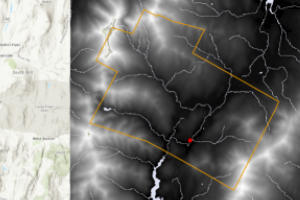

In [8]:
item

In [9]:
pour_point = item.layers[0]
stowe_boundary = item.layers[0]

In [11]:
stowe_dem_item = gis.content.search('stowe_DEM owner:api_data_owner', 'imagery layer')[0]
stowe_dem_item

<Item title:"Stowe_DEM" type:Imagery Layer owner:api_data_owner>

In [12]:
stowe_dem = stowe_dem_item.layers[0]

In [13]:
stowe_surface_water_item = gis.content.search('stowe_surface_water owner:api_data_owner', 'imagery layer')[0]

In [15]:
stowe_surface_water_item

<Item title:"Stowe_surface_water" type:Imagery Layer owner:api_data_owner>

In [14]:
stowe_surface_water = stowe_surface_water_item.layers[0]

In [194]:
m1 = gis.map('Stowe, Vermont')
m1

In [20]:
m1.add_layer(stowe_dem)

In [21]:
m1.add_layer(stowe_surface_water)

In [27]:
m1.add_layer(stowe_boundary)

In [19]:
m1.zoom_to_layer(stowe_boundary)

In [26]:
m1.add_layer(pour_point)

## Remove imperfections in elevation model

Some DEMs contain sinks, which are areas of low elevation surrounded by higher elevation values. Sinks can occur naturally but are more often data errors in a DEM raster dataset. Because water has no way of flowing out of a sink, sinks can cause all kinds of errors when analyzing how water flows to an outlet. Before you begin your hydrological analysis of flooding potential in Stowe, you'll identify and remove sinks from your elevation data.

### Identify sinks

First, you'll identify sinks in your DEM. Although your DEM was derived from reliable data provided by the USGS, sinks may still be present. To run an accurate hydrological analysis for the area around Stowe, you'll first need to locate sinks if any.

In [29]:
stowe_flow_direction = flow_direction(stowe_dem).save('stowe_flow_direction' + str(dt.now().microsecond))

In [37]:
stowe_flow_direction

<Item title:"stowe_flow_direction916591" type:Imagery Layer owner:portaladmin>

In [197]:
m2 = gis.map('Stowe, Vermont')
m2

The symbology of the layer corresponds to the direction water is likely to flow, with darker colors indicating a more southerly flow direction and lighter colors indicating a more northerly flow direction. The layer's appearance isn't important to your analysis, because you'll run another tool that will automatically find sinks based on the flow direction layer.

In [32]:
m2.add_layer(stowe_flow_direction)
m2.zoom_to_layer(stowe_flow_direction)

In [33]:
m2.legend = True

The `sink` tool is used to identify areas of internal drainage (sinks) within the flow direction layer.

In [34]:
stowe_sinks = sink(stowe_flow_direction.layers[0]).save('Stowe_sinks' + str(dt.now().microsecond))

In [42]:
stowe_sinks

<Item title:"Stowe_sinks756123" type:Imagery Layer owner:portaladmin>

In [199]:
m3 = gis.map('Stowe, Vermont')
m3

This map contains mostly small groups of black pixels, which might be difficult to see with its default symbology. You'll change the symbology to make the sinks easier to see.

In [38]:
m3.add_layer(stowe_sinks)
m3.zoom_to_layer(stowe_sinks)

In [39]:
m3.legend = True

In [42]:
from arcgis.raster.functions import colormap, stretch

In [51]:
stowe_sinks_colormap = stretch(stowe_sinks.layers[0], dra=True)

In [201]:
m4 = gis.map('Stowe, Vermont')
m4

Sinks seem to appear primarily around stream networks and water bodies identified by the `Stowe_surface_water` layer. Existing water bodies tends to be flat and can cause errors in a DEM, such as sinks.

In [53]:
m4.add_layer(stowe_sinks_colormap)

In [54]:
m4.zoom_to_layer(stowe_sinks_colormap)

In [55]:
m4.legend = True

### Fill sinks

Now that you've identified where sinks exist in your DEM, you'll create a DEM with the sinks removed using `arcgis.raster.functions.gbl.fill(input_surface_raster, zlimit=None)`. In your new DEM, all sinks will be changed to have the elevation value of the lowest cell next to the sink. Each cell in the new DEM will be part of at least one continuous decreasing path of cells leading to an edge of the dataset. This new DEM will allow for more accurate hydrological analysis of the Stowe region.

In [56]:
stowe_fill = fill(stowe_dem).save('stowe_fill' + str(dt.now().microsecond))

The final parameter, **Z limit**, allows you to set a maximum elevation difference (between a sink and its pour point) at which to fill sinks. If the difference in elevation between a sink and its edge is above the limit, the sink won't be filled. You want to fill all of the sinks in your data, so you'll leave this parameter unchanged.

In [203]:
m5 = gis.map('Stowe, Vermont')
m5

It looks almost identical to the original DEM, but the sinks in the dataset have been filled. You'll use this layer as the basis for your subsequent analysis of hydrological conditions in and around Stowe.

In [59]:
m5.add_layer(stowe_fill)
m5.zoom_to_layer(stowe_fill)

In [60]:
m5.legend = True

You've used a series of raster tools to identify sinks within a raw DEM. By inspecting the sinks, you might have also found that most of them occurred on or close to surface water bodies, likely due to insufficient elevation data. Lastly, you have filled the sinks in the dataset. Next, the newly created DEM is to be used to determine the watershed that spans Stowe, in order to help determine how water accumulates around the town.

## Delineate the watershed

Previously, you removed sinks from your DEM to make it ready for hydrological analysis. Next, you'll use your DEM to determine the watershed area for the outlet point south of Stowe. A watershed area is the area in which all flowing water will flow toward a certain point—in this case, your outlet. With the watershed area, you'll be able to limit your subsequent analysis results to the relevant area for your outlet. Determining a watershed requires two components: a flow direction raster layer and an accurate outlet point.

### Assess flow directions

The first step to delineate a watershed is to determine the direction that water will flow in your DEM. That way, you can determine the areas where water will flow to the outlet. To do so, you'll create another flow direction raster layer using [`flow_direction`](https://developers.arcgis.com/python/api-reference/arcgis.raster.functions.gbl.html?highlight=flow_direction#arcgis.raster.functions.gbl.flow_direction) tool, this time for your DEM with filled sinks. 

In [61]:
stowe_fill_flow_direction = flow_direction(stowe_fill.layers[0], 
                                           flow_direction_type='D8', 
                                           force_flow='NORMAL').save('Stowe_fill_flow_direction' + 
                                                                      str(dt.now().microsecond))

In [206]:
m6 = gis.map('Stowe, Vermont')
m6

Unlike the previous flow direction layer, which was symbolized in black and white, this layer is symbolized with color (the specific colors used are random and may differ from the example images).

In [64]:
m6.add_layer(stowe_fill_flow_direction)
m6.zoom_to_layer(stowe_fill_flow_direction)

In [65]:
m6.legend = True

The cell values in a flow direction raster layer can normally be one of only eight integers: 1, 2, 4, 8, 16, 32, 64, and 128 as shown [here](https://developers.arcgis.com/python/api-reference/_images/D8.gif). These eight integers correspond to the eight possible flow directions (as any given cell is surrounded by eight cells). Your previous flow direction layer, however, had some values that weren't one of those eight integers. Those values belonged to the sinks that you later removed from the data. Because the original flow direction layer had a wide range of values, it was automatically symbolized based on a color ramp, which uses the default black-to-white color scheme. Your new flow direction layer only has eight values, so it was automatically symbolized with a unique color for each value.

### Snap outlet to stream

With your flow direction layer, you have the first component for determining a watershed. The other component is the location of an outlet point. One of the layers that you downloaded with the project is the `pour_point` layer, which represents an outlet downstream of Stowe, Vermont. For an accurate watershed, the outlet must be precisely located on the stream as rendered in the DEM (which may differ slightly from the actual location of the stream due to the DEM's resolution or other inaccuracies). First, you'll determine the stream's exact location by calculating the areas where water accumulates the most. Then, you'll snap the outlet point's location to match the stream exactly.

`flow_accumulation` tool creates a raster layer that indicates where water is most likely to accumulate. The `flow_accumulation` for each cell is expressed as a numeric value based on the number of cells that flow into that cell. Cells with high values of accumulation often coincide with the locations of flowing water bodies. With your flow accumulation raster, you'll identify the Little River that flows through Stowe.

In [66]:
stowe_flow_accumulation = flow_accumulation(stowe_fill_flow_direction.layers[0]).save('Stowe_flow_accumulation' + 
                                                                                      str(dt.now().microsecond))

In [208]:
m7 = gis.map('Stowe, Vermont')
m7

The cells with the highest flow accumulation are white. The faint line of white cells that runs through the outlet point is the Little River. 

In [83]:
m7.add_layer(stowe_flow_accumulation)
m7.zoom_to_layer(stowe_flow_accumulation)

In [85]:
m7.add_layer(pour_point)

We want to Snap pour point to the cell of highest flow accumulation within a specified distance. The `snap_pour_point` tool requires an input raster layer to be snapped. Since, you have `pour_point` as a feature layer, you will conver it to rester using `convert_feature_to_raster` tool.

In [ ]:
pour_point_raster = convert_feature_to_raster(pour_point, 
                                              output_cell_size={"distance":30,"units":'meters'},
                                              value_field='objectid',
                                              output_name='pour_point_raster' + str(dt.now().microsecond))

You'll use measure tool available in `ArcGIS Online Maps` to measure the distance between the current outlet point and the Little River's location as represented in the flow accumulation raster. You can use this distance to then snap the outlet point to the correct cell so that it precisely lines up with the stream.

The measurement is approximately 50 meters (it may vary slightly, but an approximation is fine). Based on the measurement, you'll use a distance of 60 meters when you snap the outlet point to the stream. A snapping distance that is slightly higher than the measured distance will help avoid ambiguity in the tool. When deciding on a snapping distance, be sure it doesn't exceed the measured distance by too much, or the point may snap to an area further downstream.

In [92]:
stowe_snapped_outlet = snap_pour_point(pour_point_raster.layers[0], 
                                       pour_point_field='value',
                                       in_accumulation_raster=stowe_flow_accumulation.layers[0], 
                                       snap_distance=60).save('Stowe_snapped_output' + str(dt.now().microsecond))

In [210]:
m8 = gis.map('Stowe, Vermont')
m8

It looks like a pixel is missing in the `flow_accumulation` layer, however the output of the `stowe_snapped_outlet` is overlaid over the former raster. 

In [105]:
m8.add_layer(stowe_flow_accumulation)
m8.zoom_to_layer(stowe_flow_accumulation)

In [106]:
m8.add_layer(pour_point)

In [107]:
m8.add_layer(stowe_snapped_outlet)

### Delineate watershed upstream of outlet

Now that you have both a flow direction layer and an accurate outlet layer, you can determine the watershed area upstream of the outlet. 

In [108]:
stowe_watershed = watershed(stowe_fill_flow_direction.layers[0], 
                            stowe_snapped_outlet.layers[0]).save('StoweWatershed' + 
                                                                 str(dt.now().microsecond))

In [212]:
m9 = gis.map('Stowe, Vermont')
m9

This watershed represents all of the area that flows to the specified outlet. The watershed comprises almost the entirety of Stowe's town boundaries, indicating that almost all rainfall that lands in Stowe will go rushing through the actual town, rather than draining away from it.

In [111]:
m9.add_layer(stowe_watershed)
m9.zoom_to_layer(stowe_watershed)

In [112]:
m9.legend = True

You've determined how water will flow throughout Stowe, Vermont. Based on your results, you snapped your outlet point to the location of the Little River in your DEM. From your flow direction layer and your outlet point, you determined the location of the watershed upstream of the town. Next, you'll use several of your hydrologic and elevation layers to determine how fast water will flow to the outlet point.

## Create a velocity field

Previously, you created a watershed for the Stowe area, which you'll use as a study area for much of your subsequent analysis. Next, you'll start determining how long it takes water to reach the outlet, allowing the town to better predict when flooding will occur during a hypothetical rainfall event. To determine the time it takes water to flow somewhere, you first need to determine how fast water flows. You'll calculate the speed of flowing water with a velocity field, another type of raster layer. There are many types of velocity fields, and they can be calculated with a wide variety of mathematical equations. You'll create a velocity field that is spatially variant, but time and discharge invariant. This means that your velocity field satisfies the following assumptions:

- Velocity is affected by spatial components such as slope and flow - accumulation (spatially variant).
- Velocity at a given location does not change over time (time invariant).
- Velocity at a given location does not depend on the location's rate of water flow (discharge invariant).

In reality, velocity could be time variant and would definitely be discharge variant. However, incorporating these variants would require additional datasets that might not be available and use modeling techniques that might not be replicable in a GIS environment. The spatially variant, time- and discharge-invariant velocity field will provide a generally accurate result, although it's important to remember that any method will be only an approximation of observed phenomena.

You'll use a method for creating velocity fields first proposed by Maidment et al. (1996). In this method, each cell in the velocity field is assigned a velocity based on the local slope and the upstream contributing area (the number of cells that flow into that cell, or flow accumulation). They use the following equation:

V = $V_m$ * ($S^b$$A^c$) / ($S^b$$A^c$$_m$) ------------- (1)

Where V is the velocity of a single cell with a local slope of s and an upstream contributing area of A. Coefficients b and c can be determined by calibration, a statistical method of tweaking model parameters so that predicted data is as close as possible to observed data. In this scenario, you'll use the method's recommended value of b = c = 0.5. $V_m$ is the average velocity of all cells in the watershed. You'll assume an average velocity of $V_m$ = 0.1 m/s. Lastly, $S^b$$A^c$$_m$ is the average slope-area term throughout the watershed. To avoid results that are unrealistically fast or slow, you'll set limits for minimum and maximum velocities. The lower limit will be 0.02 meters per second, while the upper limit will be 2 meters per second.

This equation is only one of many ways that a velocity field can be calculated, and it comes with several [assumptions and limitations](https://learn.arcgis.com/en/projects/predict-floods-with-unit-hydrographs/assumptions-and-limitations-of-the-unit-hydrograph-model.htm) of its own. 

### Create the slope raster

`slope` tool calculates slope value for each call of the given raster and creates a new raster layer with each cell representing th slope value corresponding to the original raster. The slope is determined by the change in elevation between cells, so it requires your original elevation layer as an input.

`slope_type`=2 represents the Percent rise measurement option which calculates slope as a percentage of vertical elevation over horizontal elevation, as opposed to a measurement in degrees. You'll leave the remaining parameters unchanged. The planar method is appropriate to use on local scale areas (small areas such as this watershed) where slope differences between planar and geodesic methods are minimal. The Z factor is only used if the units for measuring X and Y distance are different from the units for measuring Z (height) distance.

In [113]:
stowe_slope = slope(stowe_dem, z_factor=1, slope_type=2).save('stowe_slope' + str(dt.now().microsecond))

In [214]:
m10 = gis.map('Stowe, Vermont')
m10

The darker colors represent steeper slope. While the mountain peaks tend to have the highest slopes, the stream bed, around which the town is located, have a relatively flat slope.

In [119]:
m10.add_layer(stowe_slope)

In [120]:
m10.zoom_to_layer(stowe_slope)

In [121]:
m10.legend = True

### Calculate the slope-area term

Now that you have a raster layer for both slope and flow accumulation area, you'll calculate a new raster layer that combines them. This layer will show the slope-area term (the value $S^b$$A^c$ from the Maidment et al. equation). `raster_calculator` tool allows you to create customized raster layers based on an equation that you specify.

``SquareRoot("Stowe_slope") * SquareRoot("Stowe_flow_accumulation")``
The reason you're finding the square root of the slope and flow accumulation is because you're using the recommended coefficients (b = c = 0.5) of Maidment et al. A coefficient of 0.5 is equivalent to the square root of the value.

In [122]:
stowe_slope_area_term = raster_calculator([stowe_slope.layers[0], stowe_flow_accumulation.layers[0]],
                                          input_names=['a','b'],
                                          expression='SquareRoot(a) * SquareRoot(b)').save('Stowe_slope_area_term' + 
                                                                                           str(dt.now().microsecond))

Our study area is confined to the area occupied by the watershed, so we will mask `stowe_slope_area_term` layer in the shape of watershed.

In [131]:
masked_Stowe_slope_area_term = con([stowe_watershed.layers[0], 
                                    stowe_slope_area_term.layers[0], 
                                    0]).save('masked_Stowe_slope_area_term' + 
                                             str(dt.now().microsecond))

In [216]:
m11 = gis.map('Stowe, Vermont')
m11

In [134]:
m11.add_layer(masked_Stowe_slope_area_term)

In [135]:
m11.zoom_to_layer(masked_Stowe_slope_area_term)

In [136]:
m11.legend = True

### Calculate the velocity field

Now that you have the slope-area term, you can calculate a velocity field using the following equation:

V = $V_m$ ($S^b$$A^c$) / ($S^b$$A^c$$_m$) ------------- (1)

As mentioned previously, $V_m$ is the average velocity of all cells in the watershed. You'll use an assumed average value of $V_m$ = 0.1, which is recommended by Maidment et al. Similarly, $S^b$$A^c$$_m$ is the average slope-area term across the watershed. Because you've calculated slope-area term for the watershed, you can determine the exact average rather than relying on an assumed value.

In [137]:
masked_Stowe_slope_area_term.layers[0].properties

{
  "currentVersion": 10.8,
  "serviceDescription": "Hosted/masked_Stowe_slope_area_term391665",
  "name": "Hosted/masked_Stowe_slope_area_term391665",
  "description": "",
  "extent": {
    "xmin": 471060.08257249475,
    "ymin": 208312.35339681862,
    "xmax": 494700.08257249475,
    "ymax": 231352.35339681862,
    "spatialReference": {
      "wkt": "PROJCS[\"NAD_1983_Transverse_Mercator\",GEOGCS[\"GCS_North_American_1983\",DATUM[\"D_North_American_1983\",SPHEROID[\"GRS_1980\",6378137.0,298.257222101]],PRIMEM[\"Greenwich\",0.0],UNIT[\"Degree\",0.0174532925199433]],PROJECTION[\"Transverse_Mercator\"],PARAMETER[\"False_Easting\",500000.0],PARAMETER[\"False_Northing\",0.0],PARAMETER[\"Central_Meridian\",-72.5],PARAMETER[\"Scale_Factor\",0.999964286],PARAMETER[\"Latitude_Of_Origin\",42.5],UNIT[\"Meter\",1.0]]"
    }
  },
  "initialExtent": {
    "xmin": 471060.08257249475,
    "ymin": 208312.35339681862,
    "xmax": 494700.08257249475,
    "ymax": 231352.35339681862,
    "spatialReferenc

In [138]:
masked_Stowe_slope_area_term.layers[0].properties['maxValues'][0]

1217.0540771484375

In [139]:
masked_Stowe_slope_area_term.layers[0].properties['meanValues'][0]

15.97043191494731

In [142]:
stowe_velocity_unlimited = raster_calculator([masked_Stowe_slope_area_term.layers[0]],
                                          input_names=['Stowe_slope_area_term'],
                                          expression='0.1 * (Stowe_slope_area_term/15.97043191494731)'
                                            ).save('Stowe_velocity_unlimited' + str(dt.now().microsecond))

In [218]:
m12 = gis.map('Stowe, Vermont')
m12

In [144]:
m12.add_layer(stowe_velocity_unlimited)

In [145]:
m12.zoom_to_layer(stowe_velocity_unlimited)

In [146]:
m12.legend = True

### Limit the velocities

The raster layer you created is a velocity field, but it has unrealistically high and low velocities. For instance, some values in the field have a velocity of 0 meters per second, which is unlikely during an extreme rainfall event. Likewise, the maximum value of approximately 7.5 meters per second is unrealistic even during a major flood. You'll limit the velocity values with a lower limit of 0.02 meters per second and an upper limit of 2 meters per second.

In [147]:
from arcgis.raster.functions import greater_than_equal, less_than_equal

In [148]:
expression = greater_than_equal([stowe_velocity_unlimited.layers[0], 0.02])

In [149]:
lower_limited_velocity = con([expression, 
                              stowe_velocity_unlimited.layers[0], 
                              0.02]).save('lower_limited_velocity' + str(dt.now().microsecond))

In [150]:
expression = less_than_equal([stowe_velocity_unlimited.layers[0], 2])

In [151]:
stowe_velocity = con([expression, 
                      lower_limited_velocity.layers[0], 
                      2]).save('stowe_velocity' + str(dt.now().microsecond))

In [7]:
m13 = gis.map('Stowe, Vermont')
m13

In this map, darker colors represent a slower velocity, while lighter colors represent a faster velocity. Water tends to flow fastest in streams, where the largest amount of water has accumulated. The area around Stowe is no exception, indicating that water will flow at its fastest when funneling toward the outlet point downstream of the town.

In [154]:
m13.add_layer(stowe_velocity)

In [ ]:
m13.add_layer(pour_point)

In [155]:
m13.zoom_to_layer(stowe_velocity)

In [156]:
m13.legend = True

You've derived a spatially variant, time- and discharge-invariant velocity field from flow accumulation and slope raster layers. You used one of many formulas that can calculate velocity fields to do so. Now that you know how fast water is flowing through Stowe during your hypothetical rainfall event, you'll determine how long it takes water to flow to the outlet.

## Create an isochrone map

Previously, you used your flow accumulation and watershed layers to create a velocity field that predicts how fast water will flow throughout Stowe, Vermont. Your velocity field showed that water will move fastest along the streams leading through town, but you still can't create a unit hydrograph because you don't know the time it will take water to flood to your outlet point. Next, you'll create an isochrone map, which maps the time it takes to reach a specified location from anywhere else in an area. To create the isochrone map, you'll first create a weight grid. Then, you'll assess the time it takes for water to reach the outlet and reclassify those times into isochrone zones.

### Create a weight grid

Flow time is calculated with a relatively simple equation: The length that water must flow divided by the speed at which it flows. While you know how fast water flows due to your velocity field, you don't know flow length. To determine flow length, you need two variables: flow direction (which you know) and weight (which you don't). Weight, in regard to flow, represents impedance. For instance, water flowing through forested land takes longer than water flowing over smooth rock because it's impeded by terrain. While calculating weight may seem difficult without detailed terrain data, you can derive an equation to calculate it based on the following two equations for finding flow time:

Flow time [T] = Flow Length [L] / Velocity [$LT^{-1}$]    (1)

Flow time [T] = Flow Length [L] * Weight [$L^{-1}T$]    (2)

By combining these equations, you get a new equation:

Weight [$L^{-1}T$] = 1 / Velocity [$LT^{-1}$]    (3)

Thus, you can determine weight using your velocity field layer. Later, you'll use your weight grid layer in conjunction with your flow direction layer to determine flow length and flow time.

In [157]:
stowe_weight = raster_calculator([stowe_velocity.layers[0]],
                                          input_names=['stowe_velocity'],
                                          expression='1 / stowe_velocity').save('Stowe_weight' + 
                                                                                str(dt.now().microsecond))

In [222]:
m14 = gis.map('Stowe, Vermont')
m14

In [159]:
m14.add_layer(stowe_weight)
m14.zoom_to_layer(stowe_weight)
m14.legend = True

You created the flow direction layer before you determined the Stowe watershed, so the layer's extent covers far more than your area of interest. You'll extract a new version of the flow direction layer that only covers the watershed.

We will use con tool to clip a raster layer to a certain extent based on the extent of another layer.

In [160]:
stowe_watershed_flow_dir = con([stowe_watershed.layers[0], 
                                stowe_fill_flow_direction.layers[0], 
                                0]).save('stowe_watershed_flow_dir' + str(dt.now().microsecond))

In [162]:
from arcgis.raster.functions import colormap, stretch
stowe_watershed_flow_dir_colormap = colormap(stowe_watershed_flow_dir.layers[0], colormap_name="Random")

In [224]:
m15 = gis.map('Stowe, Vermont')
m15

In [164]:
m15.add_layer(stowe_watershed_flow_dir_colormap)

In [165]:
m15.zoom_to_layer(stowe_watershed_flow_dir_colormap)

In [166]:
m15.legend = True

### Access flow time to outlet pour point

Finally you have gathered all layers needed to determine flow time, and the next step of the task would require you to use the `flow_length` tool. While this tool, as its name suggests, normally calculates flow length, it has an optional parameter to include a weight raster and whenever a weight raster is included, the tool then calculates flow time instead.

In [167]:
from arcgis.raster.functions.gbl import flow_length

In [168]:
stowe_time = flow_length(input_flow_direction_raster=stowe_watershed_flow_dir.layers[0], 
                         input_weight_raster=stowe_weight.layers[0]).save('stowe_time' + str(dt.now().microsecond))

Each cell in this raster layer contains a value that represents the time in seconds for water to flow to the outlet from the cell. Darker colors represent shorter flow times. Water takes the least amount of time to flow from the low-lying stream beds closest to the outlet, while water falling in the western mountains takes longer.

In [226]:
m16 = gis.map('Stowe, Vermont')
m16

The time it takes for water to flow to the outlet ranges from 0 seconds (rain that falls on the outlet itself) to about 47,000 seconds—over 13 hours!

In [170]:
m16.add_layer(stowe_time)

In [171]:
m16.zoom_to_layer(stowe_time)

In [172]:
m16.legend = True

### Reclassify flow time into isochrone zones

Your flow time raster layer contains an extremely high number of unique values, which will make subsequent analysis complicated and unwieldy. To make things easier, you'll reclassify the flow time layer into isochrone zones.

An isochrone is a contour line that passes through points of roughly equal travel time to the outlet of the watershed. You'll define isochrones at equal time intervals of 1,800 seconds (or 30 minutes). For larger areas, isochrones can use different intervals, but for the Stowe watershed, this time interval should be appropriate. With this time interval, every cell in the first isochrone zone will take about 1,800 seconds to reach the outlet, every cell in the second isochrone zone will take about 3600 seconds, and so on. You'll later use these time intervals as the ordinate in your unit hydrograph.

You'll use `remap` tool to classify flow time values that fall between a specific range of values (say, 0 and 1,800 or 1,800 to 3,600) to the upper limit of the range. Thus, a value of 907 would be reclassified to 1,800, while a value of 2,145 would be reclassified to 3,600.

In [173]:
from arcgis.raster.functions import remap

In [174]:
input_range = []
output = []
for i in range(0, 47000, 1800):
    input_range.append(i)
    input_range.append(i + 1800)
    output.append(i + 1800)

In [175]:
stowe_isochrones = remap(stowe_time.layers[0], 
                         input_ranges=input_range, 
                         output_values=output).save('stowe_isochrones' + str(dt.now().microsecond))

In [177]:
hist = stowe_isochrones.layers[0].histograms

In [178]:
count = hist[0]['counts']

In [179]:
counts = [i for i in count if i != 0]

In [180]:
counts

[673,
 2889,
 6107,
 11924,
 18738,
 24368,
 27925,
 28176,
 24156,
 16865,
 10194,
 5411,
 2670,
 1309,
 665,
 346,
 233,
 176,
 119,
 80,
 52,
 36,
 23,
 13,
 10,
 3,
 1]

In [181]:
import pandas as pd

In [182]:
table = pd.DataFrame()

In [183]:
table['Time(seconds)'] = output

In [184]:
table['counts'] = counts

In [188]:
table

,range,Time(seconds),counts
0,1800,1800,673
1,3600,3600,2889
2,5400,5400,6107
3,7200,7200,11924
4,9000,9000,18738
5,10800,10800,24368
6,12600,12600,27925
7,14400,14400,28176
8,16200,16200,24156
9,18000,18000,16865


You've used your velocity field raster layer to create a weight grid. This weight grid represented impedance to downstream flow and helped you create a flow time raster layer. You also reclassified flow times into 27 isochrones with an equal interval time of 1,800 seconds. Next, you'll develop a time-discharge relationship at the outlet for unit excess rainfall that occurs uniformly, over the entire watershed, in intervals of 1,800 seconds. Finally, you'll plot this relationship to create your unit hydrograph.

## Create a unit hydrograph

Now, you'll calculate area to show relationship between time and the area of water flowing into the outlet. Then, you'll use this table to plot a unit hydrograph that will show the times at which the most water flows into the outlet, allowing for better flood prediction in future rainfall events.

In [186]:
table['area'] = table['counts']*30*30

In [187]:
table['area'] = table['area']/1800

In [191]:
table

,range,Time(seconds),counts,area
0,1800,1800,673,336.5
1,3600,3600,2889,1444.5
2,5400,5400,6107,3053.5
3,7200,7200,11924,5962.0
4,9000,9000,18738,9369.0
5,10800,10800,24368,12184.0
6,12600,12600,27925,13962.5
7,14400,14400,28176,14088.0
8,16200,16200,24156,12078.0
9,18000,18000,16865,8432.5


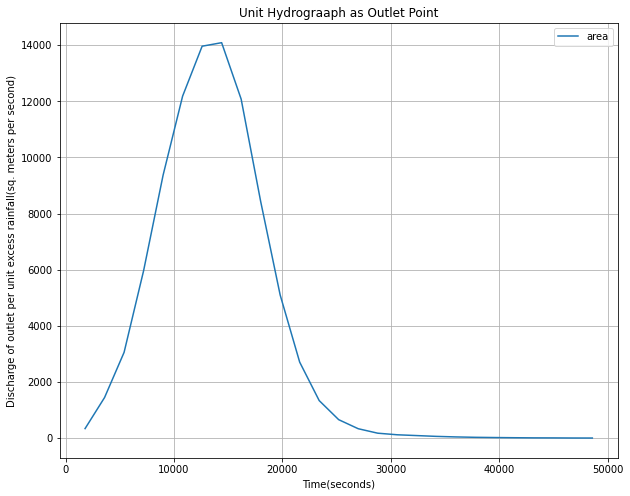

In [205]:
%matplotlib inline
import matplotlib.pyplot as plt

hydrograph_plot = table.plot('Time(seconds)', 'area', title="Unit Hydrograaph as Outlet Point", grid=True, figsize=(10, 8))
hydrograph_plot.set_xlabel("Time(seconds)")
hydrograph_plot.set_ylabel("Discharge of outlet per unit excess rainfall(sq. meters per second)")
plt.show()

The above plot shows when water discharge at the outlet is at its height during a predicted rainfall event.

## Conclusion

In this notebook, we have gained knowledege about various tools available in `arcgis.raster.functions` and `arcgis.raster.functions.gbl` module in order to predict floods using unit hydrographs in order to plan for and respond to flood events more effectively.

## Acknowledgements

Data acquired from the [Vermont Center for Geographic Information (VCGI)](https://vcgi.vermont.gov/), the [NHDPlus Version 2 dataset](http://www.horizon-systems.com/NHDPlus/NHDPlusV2_home.php), and the [United States Geological Survey (USGS)](https://www.usgs.gov/).